In [236]:
"""Jupyter Notebook for relaxation time analysis"""
#The main analysis parts adapted from script by  H. Antila, with help from S. Ollila and T. Ferreira
#saved in relaxation_times.py
# Last modified by R. Nencini, 19.10.2021
import yaml
import sys
import numpy as np
from scipy import optimize
sys.path.insert(1, '/home/ricky/Documents/from_work/git/NMR_FF_tools/relaxation_times/')
sys.path.insert(1, '/home/nenciric/Documents/git/NMR_FF_tools/relaxation_times/')

import relaxation_times as rt
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import os

import plot_timescales as PT
#from numba import jit #

#gyromagnetic ratios for further developmant
# !!! NOTICE!!!
#values taken from matlab code and projecct work and slightly different than those in Wikipedia
#these values are also in the external file --> if change is needed; has to be changed there
#values here in jupyter just for the information and verify, why they are different
#!!! NOTICE END !!!
gammaD=41.695*10**6; #r*s^(-1)*T^(-1)
gammaH=267.513*10**6;
gammaC=67.262*10**6;
gammaN=-27.166*10**6;

In [189]:
def PlotTimescales(Ctimes,merge,name,title="Title",xlabel="xlabel"):
    working_Ctimes=np.copy(Ctimes)
    plt.rcParams["figure.figsize"] = [15.00, 7]
    plt.rcParams["figure.autolayout"] = True
    plt.rcParams.update({'font.size': 20})


    fig, (ax1, ax2) = plt.subplots(2)

    ax1.title.set_text(title)
    ax1.set_ylim(Ctimes[0,0]/10,Ctimes[-1,0]*10)

    ax1.grid()
    ax1.set_yscale('log')
    ax1.set_ylabel("Timescale [s]")
    ax1.set_xlabel(xlabel)
    #ax1.set_ylim([10**(-12.4), 10**(-6.8)])

    """Plot the timescales, user specifies the merge to be used.
    The merge works as follow: The code finds the first timescale with
    weight bigger bigger than 0 and merges with 'merge' subsequent timescales.
    The final result is plotted as a weighted average of the merged points."""
    
    for residue in range(1,working_Ctimes.shape[1]):
        timescale=0
        while timescale < working_Ctimes.shape[0]:
            #print("{} {} \n".format(i, j))
            if working_Ctimes[timescale,residue]>0:
                time_to_plot=working_Ctimes[timescale,0]
                if merge>1:
                    time_to_plot=0
                    total_weight=0
                    for i in range(0,merge):
                        try:
                            time_to_plot+=working_Ctimes[timescale+i,0]*working_Ctimes[timescale+i,residue]
                            total_weight+=working_Ctimes[timescale+i,residue]
                        except:
                            pass
                    time_to_plot/=total_weight
                                                       
                        
                if time_to_plot>10**(-9):
                    ax1.plot(residue, time_to_plot, marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
                    
                elif time_to_plot>10**(-11):
                    ax1.plot(residue, time_to_plot, marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
                else:
                    ax1.plot(residue, time_to_plot, marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                timescale+=merge-1
            timescale+=1
       
    

    ax2.grid()
    ax2.set_ylim(0,1)
    ax2.set_ylabel("Coefficient's weights")
    ax2.set_xlabel(xlabel)


    for residue in range(1,working_Ctimes.shape[1]):
        timescale=0
        while timescale < working_Ctimes.shape[0]:
            #print("{} {} \n".format(i, j))
            if working_Ctimes[timescale,residue]>0:
                time_to_plot=working_Ctimes[timescale,0]
                if merge>1:
                    time_to_plot=0
                    total_weight=0
                    for i in range(1,merge):
                        try:
                            total_weight+=working_Ctimes[timescale,residue]
                            time_to_plot+=working_Ctimes[timescale,0]*working_Ctimes[timescale,residue]
                            working_Ctimes[timescale,residue]+=working_Ctimes[timescale+i,residue]
                            
                        except:
                            pass
                    time_to_plot/=total_weight
                    
                if time_to_plot>10**(-9):
                    ax2.plot(residue, working_Ctimes[timescale,residue], marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
                elif time_to_plot>10**(-11):
                    ax2.plot(residue, working_Ctimes[timescale,residue], marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
                else:
                    ax2.plot(residue, working_Ctimes[timescale,residue], marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                timescale+=merge-1
            timescale+=1

     
    plt.savefig("../figure_time_scales_protein/merging/"+name+"_"+str(merge)+".png")
    plt.show()   

In [234]:
def PlotTimescalesLinSlow(Ctimes,merge,name,title="Title",xlabel="xlabel"):
    working_Ctimes=np.copy(Ctimes)
    plt.rcParams["figure.figsize"] = [15.00, 7]
    plt.rcParams["figure.autolayout"] = True
    plt.rcParams.update({'font.size': 20})


    fig, (ax1, ax2) = plt.subplots(2)

    ax1.title.set_text(title)
    ax1.set_ylim(10**(-10),Ctimes[-1,0]/1.9)

    ax1.grid()
    #ax1.set_yscale('log')
    ax1.set_ylabel("Timescale [s]")
    ax1.set_xlabel(xlabel)
    #ax1.set_ylim([10**(-12.4), 10**(-6.8)])

    """Plot the timescales, user specifies the merge to be used.
    The merge works as follow: The code finds the first timescale with
    weight bigger bigger than 0 and merges with 'merge' subsequent timescales.
    The final result is plotted as a weighted average of the merged points."""
    
    for residue in range(1,working_Ctimes.shape[1]):
        timescale=0
        while timescale < working_Ctimes.shape[0]:
            #print("{} {} \n".format(i, j))
            if working_Ctimes[timescale,residue]>0:
                time_to_plot=working_Ctimes[timescale,0]
                if merge>1:
                    time_to_plot=0
                    total_weight=0
                    for i in range(0,merge):
                        try:
                            time_to_plot+=working_Ctimes[timescale,0]*working_Ctimes[timescale,residue]
                            total_weight+=working_Ctimes[timescale,residue]
                        except:
                            pass
                    time_to_plot/=total_weight
                                                       
                        
                if time_to_plot>10**(-8):
                    ax1.plot(residue, time_to_plot, marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
                    
                elif time_to_plot>10**(-9)*5:
                    ax1.plot(residue, time_to_plot, marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
                elif time_to_plot>10**(-9):
                    ax1.plot(residue, time_to_plot, marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                elif time_to_plot>10**(-10):
                    ax1.plot(residue, time_to_plot, marker="o", markersize=5, markeredgecolor="black", markerfacecolor="black")
              
                timescale+=merge-1
            timescale+=1
       
    

    ax2.grid()
    ax2.set_ylim(0,1)
    ax2.set_ylabel("Coefficient's weights")
    ax2.set_xlabel(xlabel)


    for residue in range(1,working_Ctimes.shape[1]):
        timescale=0
        while timescale < working_Ctimes.shape[0]:
            #print("{} {} \n".format(i, j))
            if working_Ctimes[timescale,residue]>0:
                time_to_plot=working_Ctimes[timescale,0]
                if merge>1:
                    time_to_plot=0
                    total_weight=0
                    for i in range(1,merge):
                        try:
                            total_weight+=working_Ctimes[timescale,residue]
                            time_to_plot+=working_Ctimes[timescale,0]*working_Ctimes[timescale,residue]
                            working_Ctimes[timescale,residue]+=working_Ctimes[timescale+i,residue]
                            
                        except:
                            pass
                    time_to_plot/=total_weight
                    
                if time_to_plot>10**(-8):
                    ax2.plot(residue, working_Ctimes[timescale,residue], marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
                elif time_to_plot>10**(-9)*5:
                    ax2.plot(residue, working_Ctimes[timescale,residue], marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
                elif time_to_plot>10**(-9):
                    ax2.plot(residue, working_Ctimes[timescale,residue], marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                elif time_to_plot>10**(-10):
                    ax2.plot(residue, working_Ctimes[timescale,residue], marker="o", markersize=5, markeredgecolor="black", markerfacecolor="black")
              
                timescale+=merge-1
            timescale+=1

     
    plt.savefig("../figure_time_scales_protein/merging/"+name+"_"+str(merge)+"_slow_lin.png")

    plt.show()   

<function matplotlib.pyplot.show(close=None, block=None)>

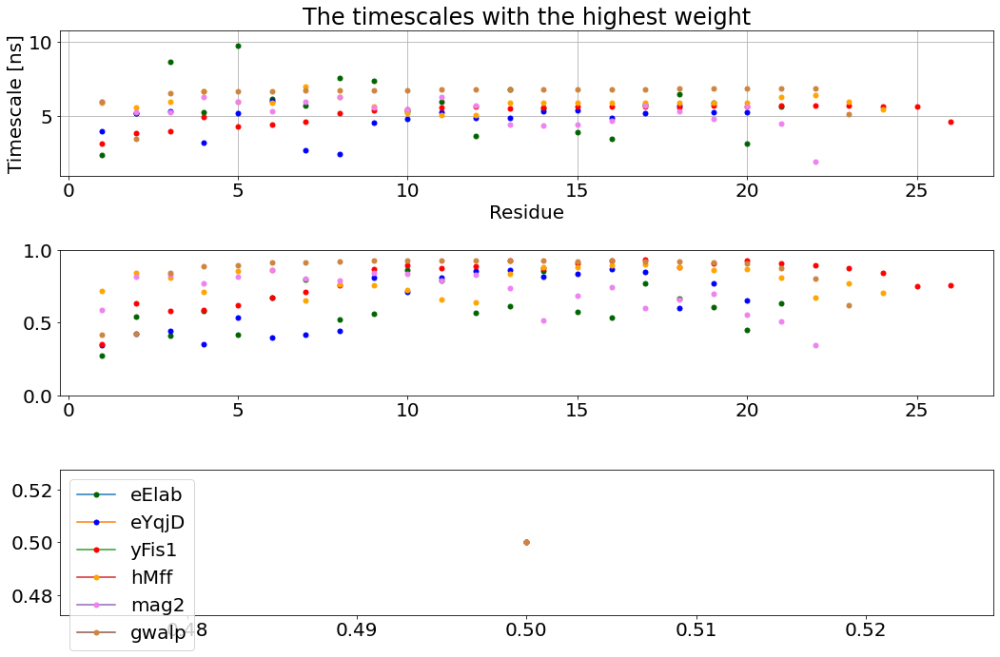

In [299]:
plt.rcParams["figure.figsize"] = [15.00, 10]
plt.rcParams["figure.autolayout"] = True
plt.rcParams.update({'font.size': 20})


fig, (ax1, ax2, ax3) = plt.subplots(3)

ax1.title.set_text("The timescales with the highest weight")
ax1.set_ylim(10**(-9)*10**9,working_Ctimes[-1,0]/9*10**9)
ax2.set_ylim(0,1)

ax1.grid()
#ax1.set_yscale('log')
ax1.set_ylabel("Timescale [ns]")
ax1.set_xlabel("Residue")
    #ax1.set_ylim([10**(-12.4), 10**(-6.8)])
for key in peptides:
    working_Ctimes=np.copy(peptides[key]["CTIMES"])
    working_Ctimes2=np.copy(peptides[key]["CTIMES"])

    merge=2

    


    for residue in range(1,working_Ctimes.shape[1]):
        timescale=0
        while timescale < working_Ctimes.shape[0]:
            #print("{} {} \n".format(i, j))
            if working_Ctimes[timescale,residue]>0:
                time_to_plot=working_Ctimes[timescale,0]
                if merge>1:
                    time_to_plot=working_Ctimes[timescale,0]*working_Ctimes[timescale,residue]
                    total_weight=working_Ctimes[timescale,residue]
                    for i in range(1,merge):
                        try:
                            time_to_plot+=working_Ctimes[timescale+i,0]*working_Ctimes[timescale+i,residue]
                            total_weight+=working_Ctimes[timescale+i,residue]
                            working_Ctimes[timescale,residue]+=working_Ctimes[timescale+i,residue]
                        except:
                            pass
                    time_to_plot/=total_weight
                    working_Ctimes[timescale,0]=time_to_plot




                timescale+=merge-1
            timescale+=1

        ax1.plot(residue,working_Ctimes[np.argmax(working_Ctimes[:,residue]),0]*10**9, marker="o", markersize=5, markeredgecolor=peptides[key]["COLOR"], markerfacecolor=peptides[key]["COLOR"])
        ax2.plot(residue,working_Ctimes[np.argmax(working_Ctimes[:,residue]),residue], marker="o", markersize=5, markeredgecolor=peptides[key]["COLOR"], markerfacecolor=peptides[key]["COLOR"])

for key in peptides:
    ax3.plot(0.5,0.5, marker="o", markersize=5, markeredgecolor=peptides[key]["COLOR"], markerfacecolor=peptides[key]["COLOR"],label=key)

plt.legend(loc='upper left')    
plt.savefig("different_peptides_most_abundant_timescale.pdf")
plt.show

In [298]:
peptides['eElab']["COLOR"]="darkgreen"
peptides['eYqjD']["COLOR"]="blue"
peptides['yFis1']["COLOR"]="red"
peptides['hMff']["COLOR"]="orange"
peptides['mag2']["COLOR"]="violet"
peptides['gwalp']["COLOR"]="peru"


'/home/local/nenciric/Documents/git/CorysPeptides/calculate_relax_from_SDS_proteins'

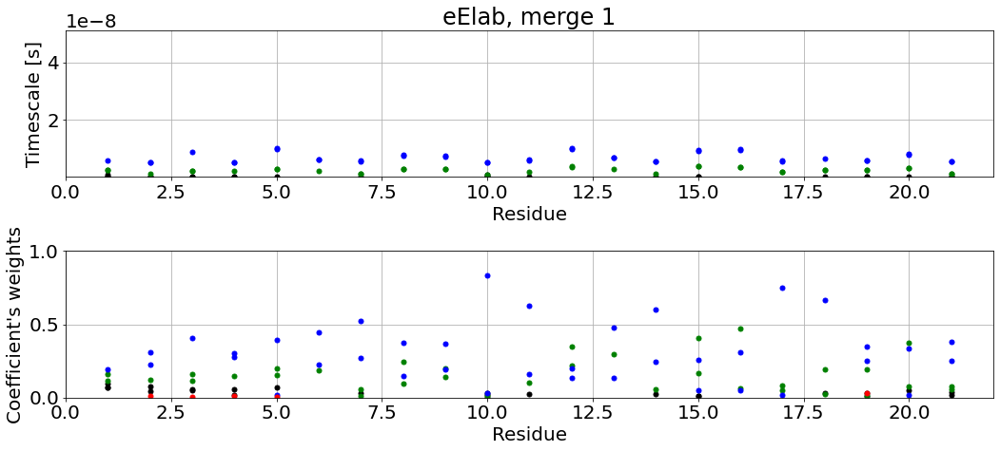

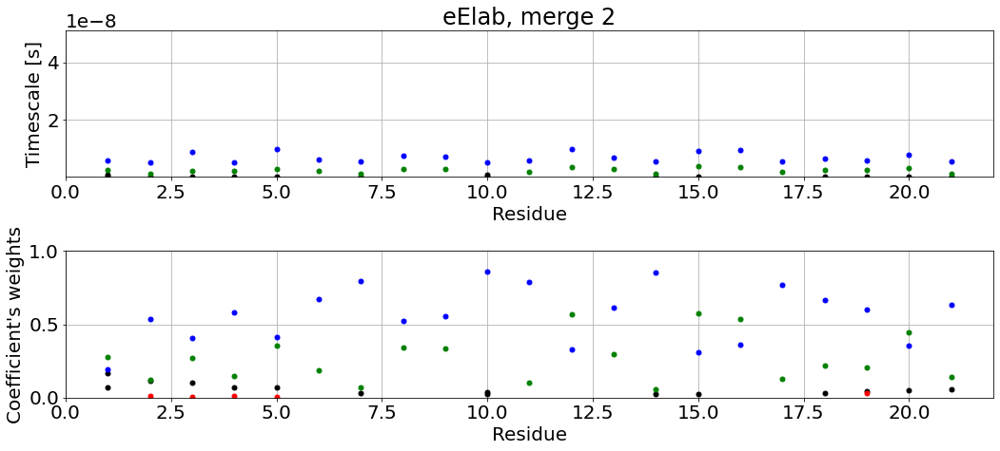

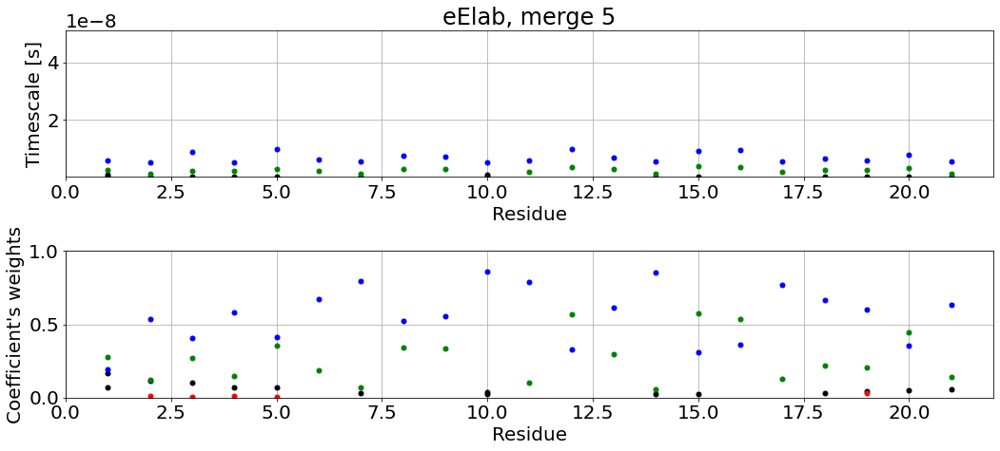

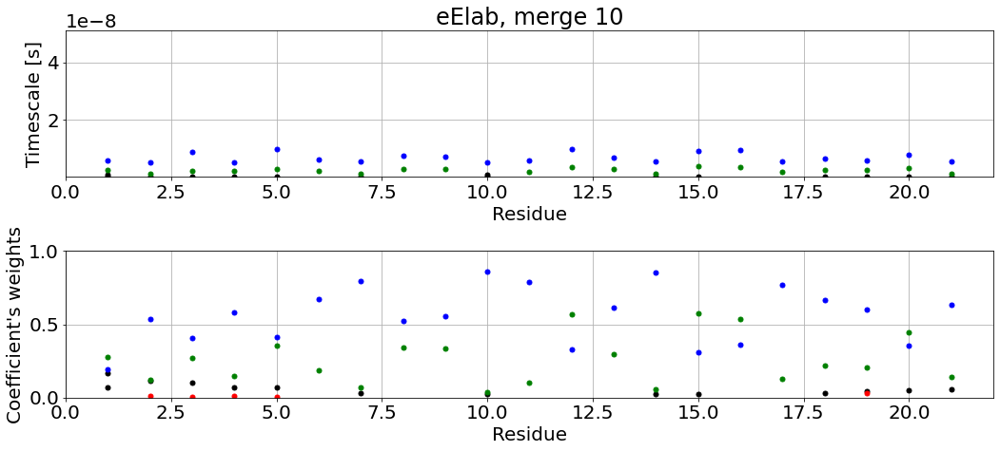

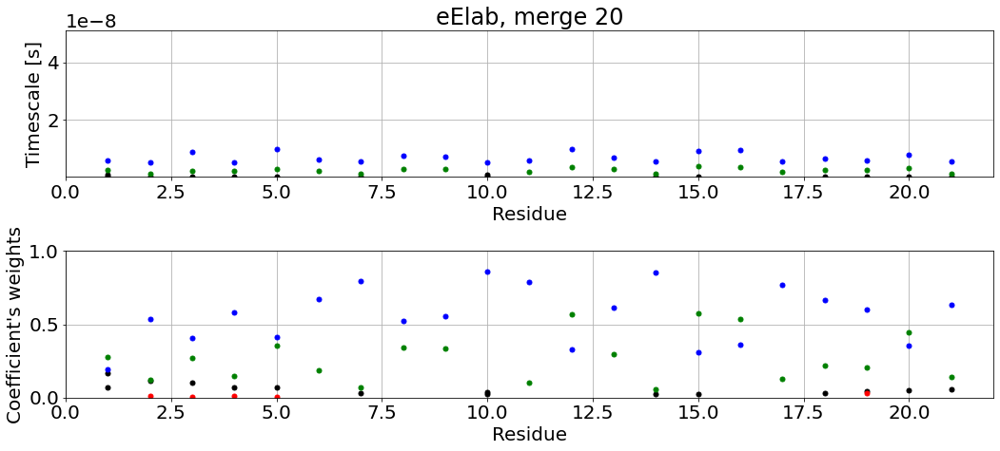

...

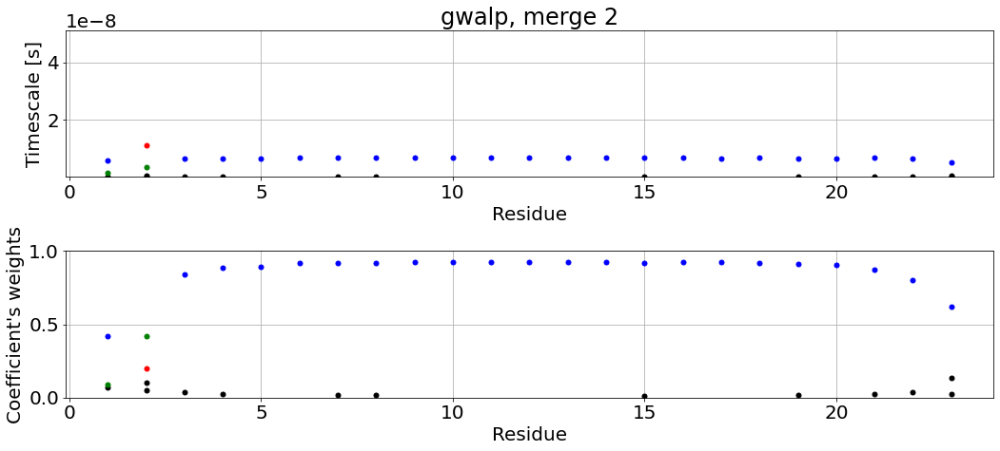

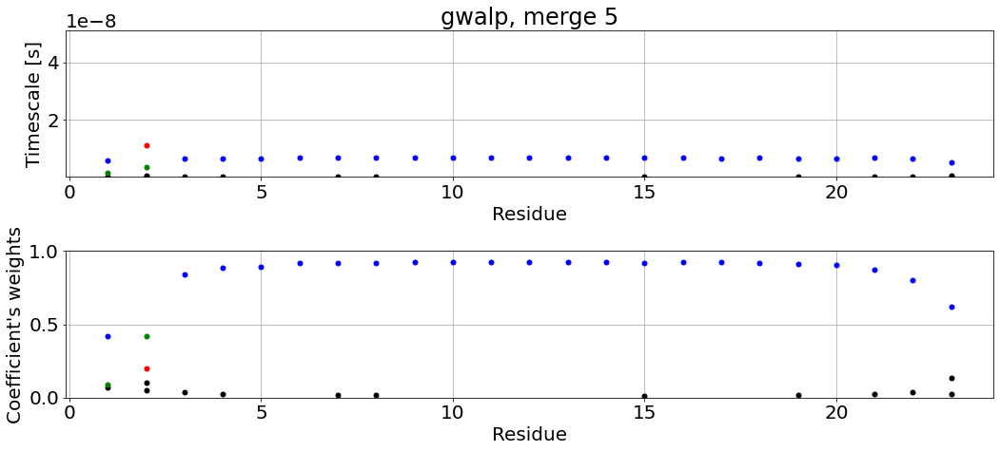

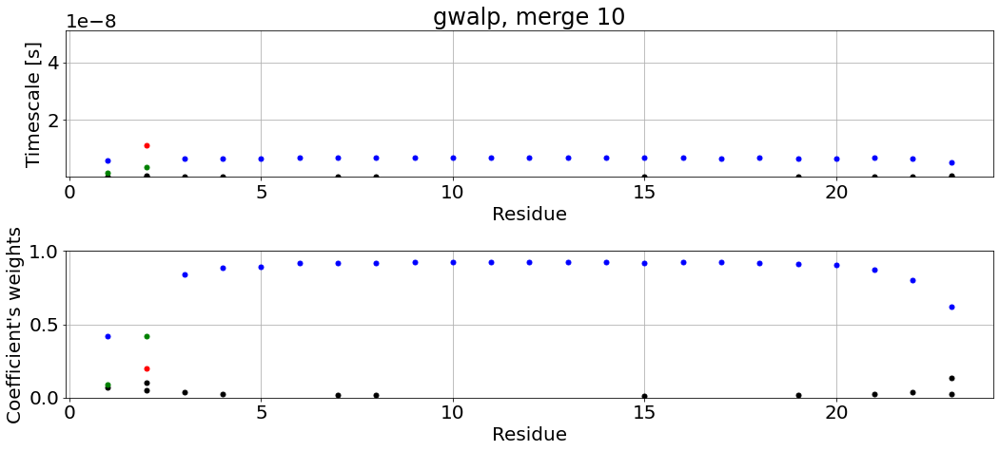

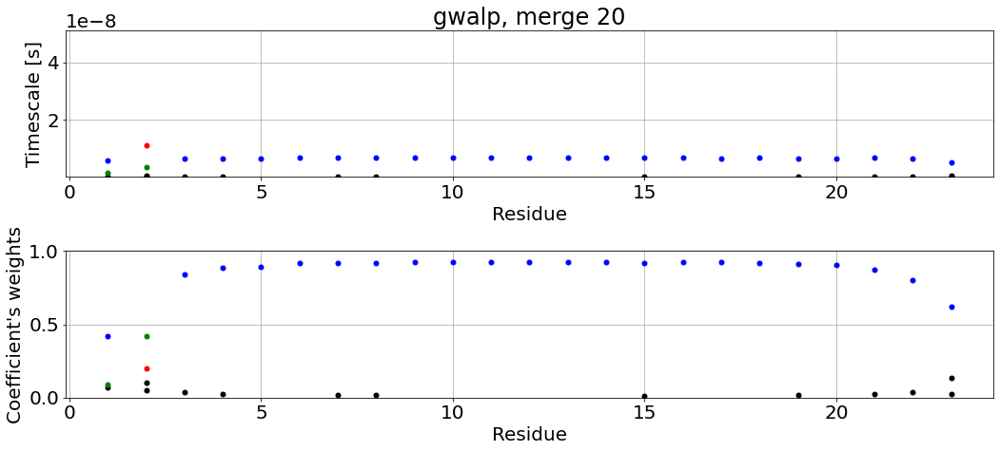

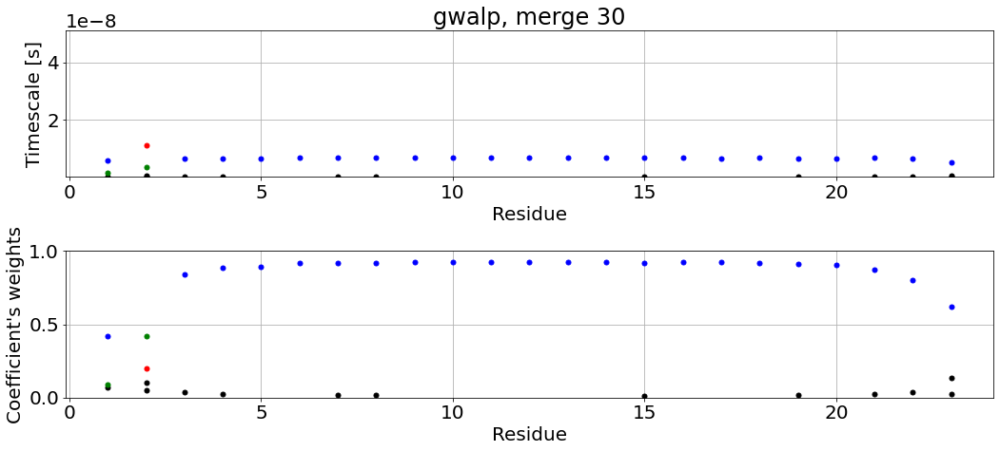

In [235]:
for key in peptides:
    for merge in [1,2,5,10,20,30]:
        PlotTimescalesLinSlow(peptides[key]["CTIMES"],merge,key,key+", merge "+str(merge),"Residue")

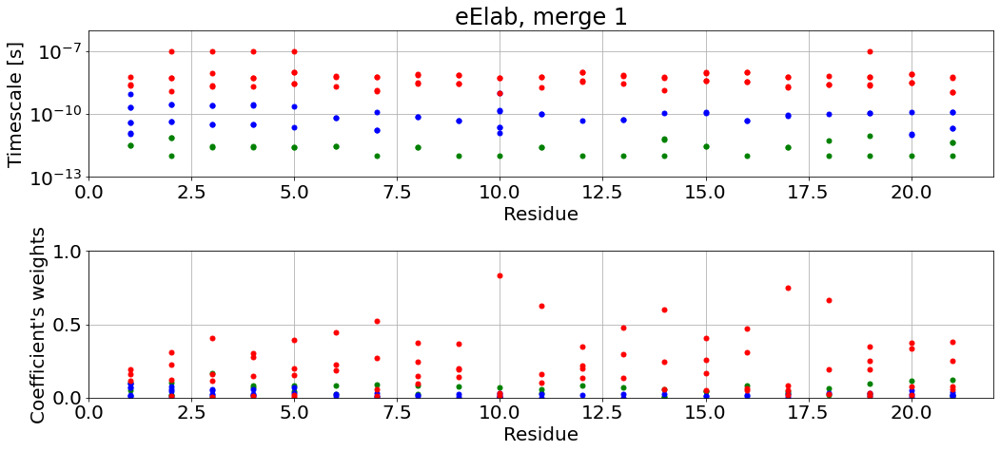

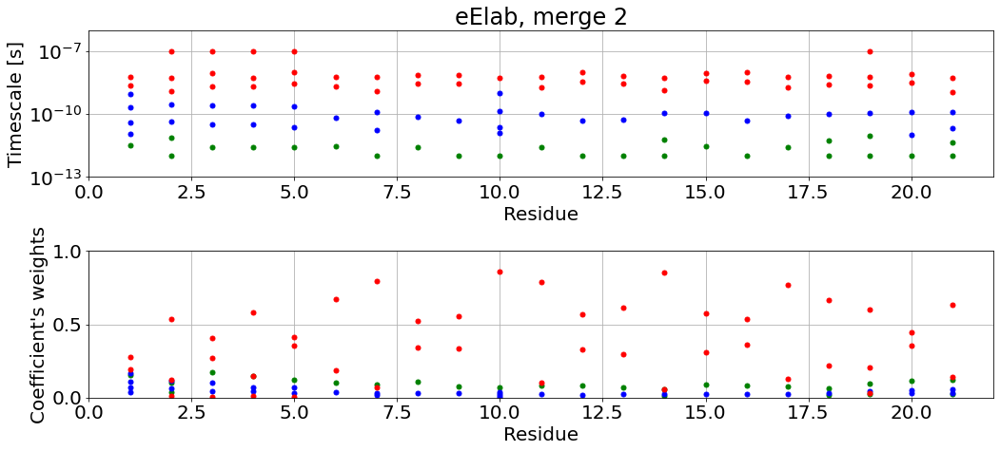

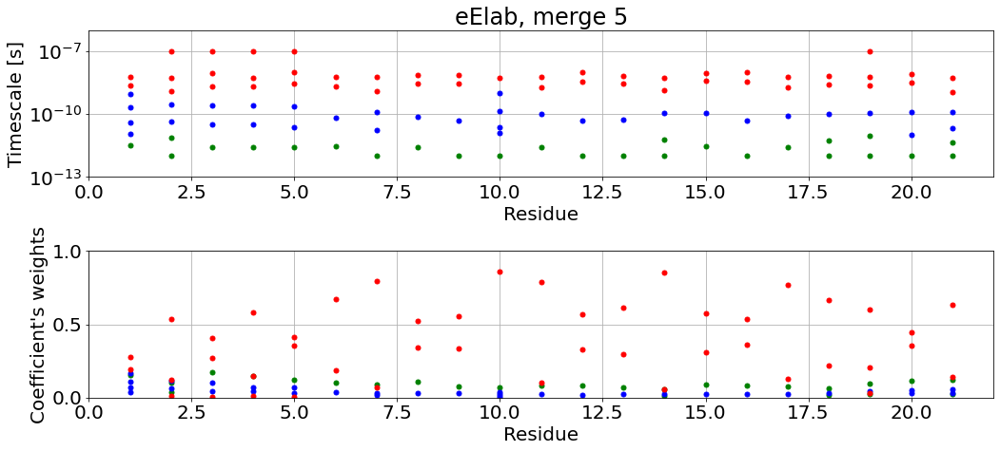

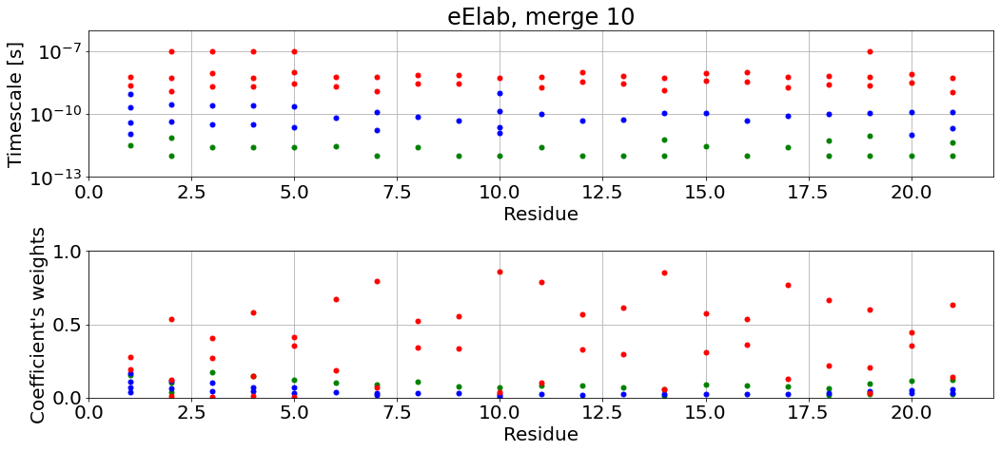

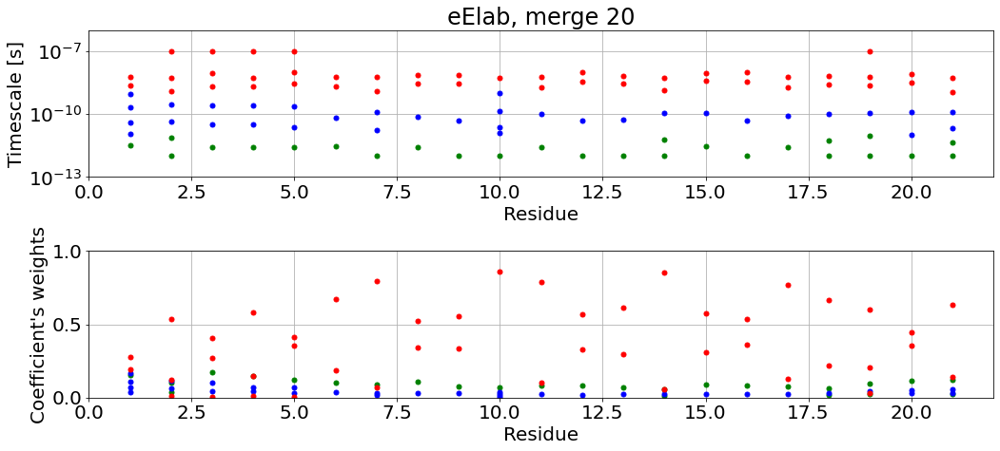

...

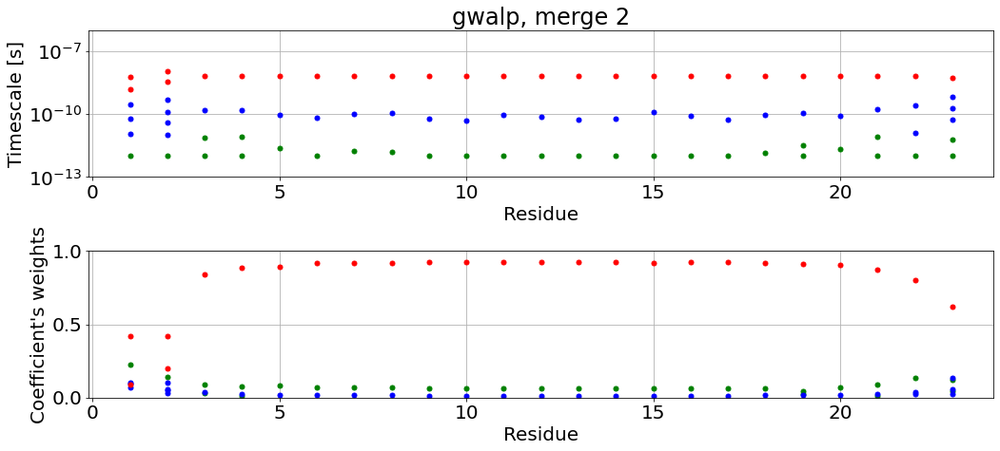

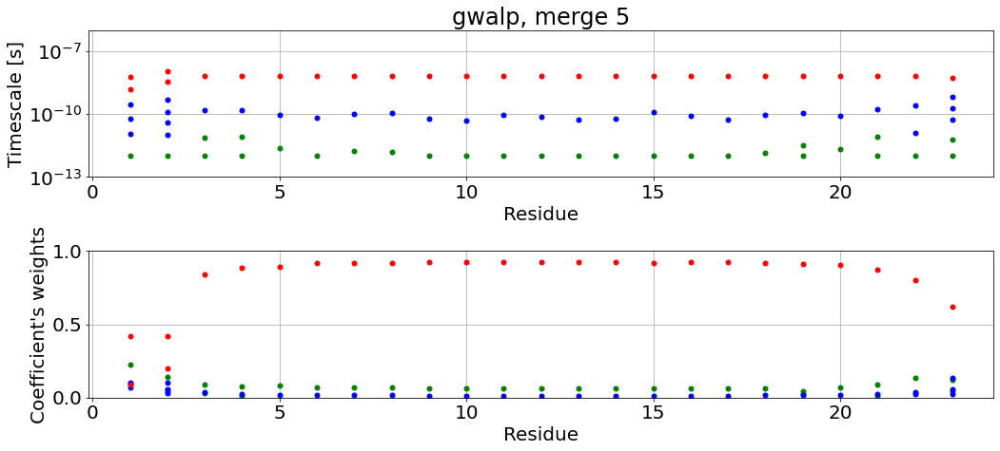

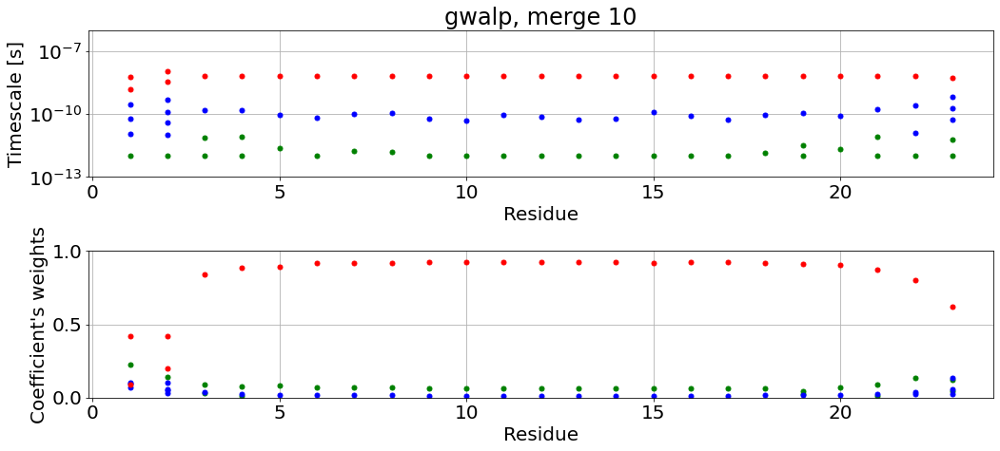

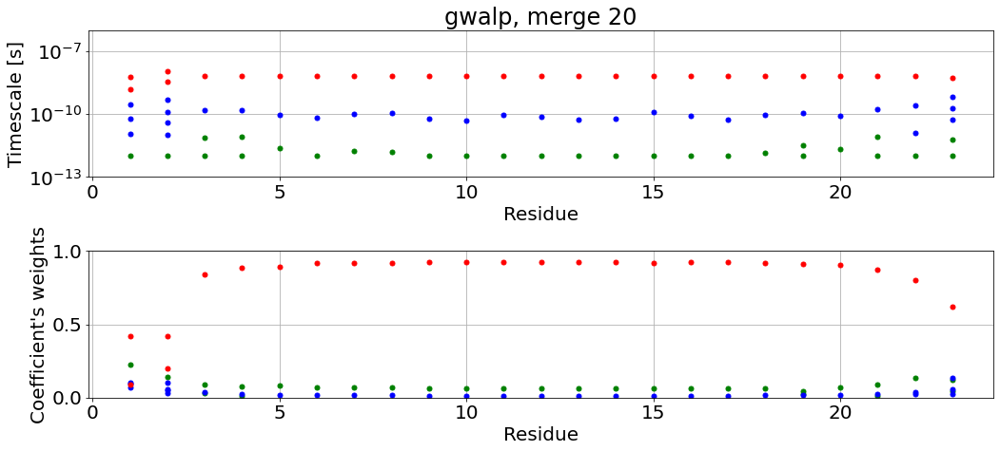

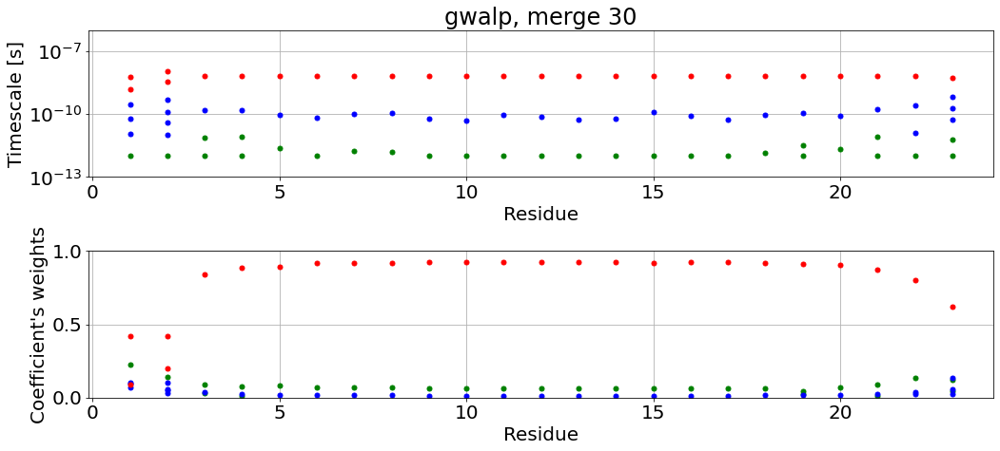

In [211]:
for key in peptides:
    for merge in [1,2,5,10,20,30]:
        PlotTimescales(peptides[key]["CTIMES"],merge,key,key+", merge "+str(merge),"Residue")

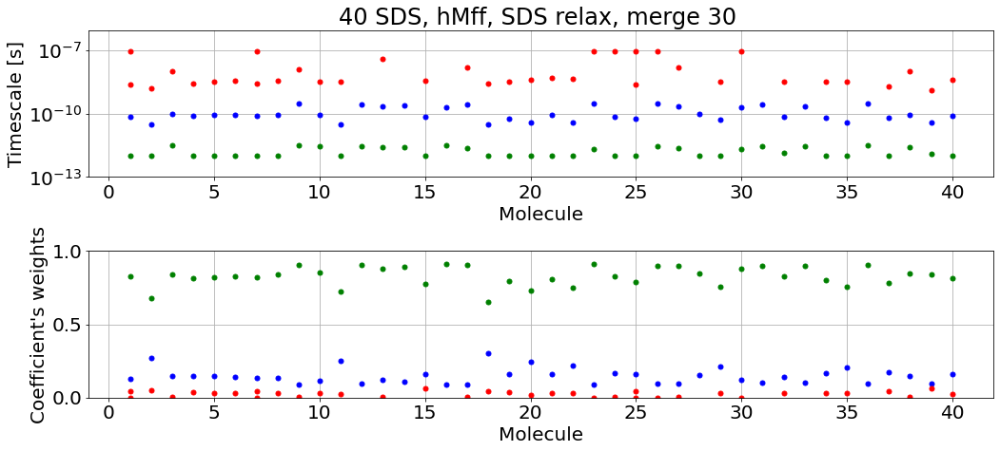

In [237]:
Ctimes_to_save=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_2500000_030822_alpha.out")
PT.PlotTimescales(Ctimes_to_save,30,"40SDS_hMff","40 SDS, hMff, SDS relax, merge 30 ","Molecule")

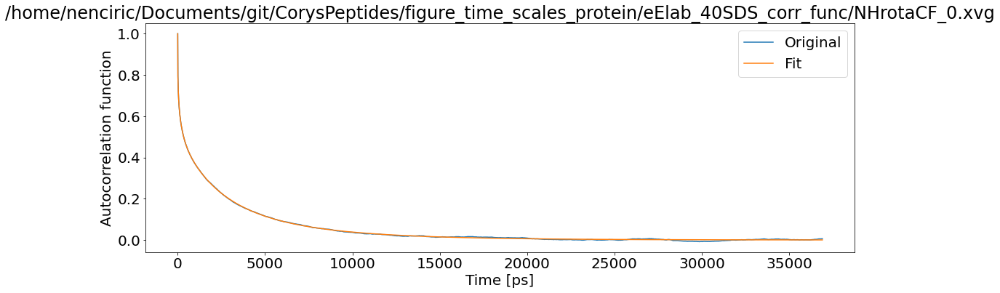

T1: 0.0019898771915081693 T2: 0.001539943248982753 NOE: 0


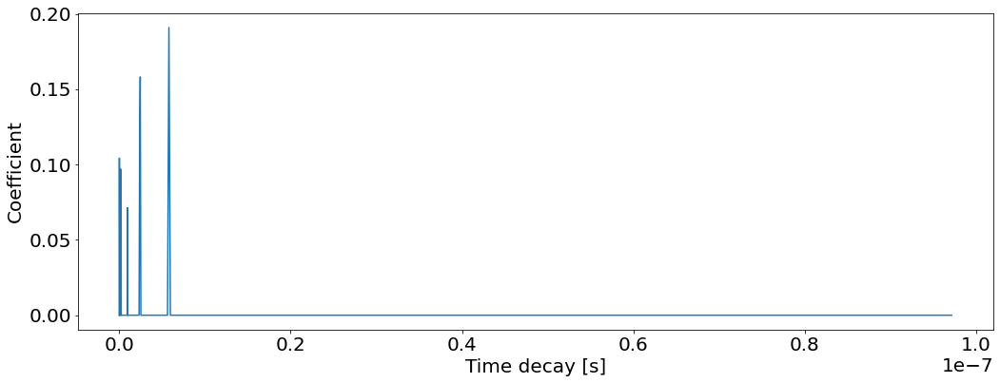

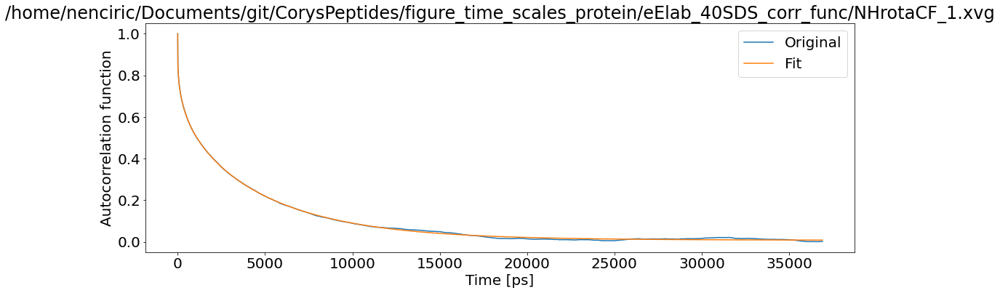

T1: 0.0014017701350374397 T2: 0.0008784934411029433 NOE: 0


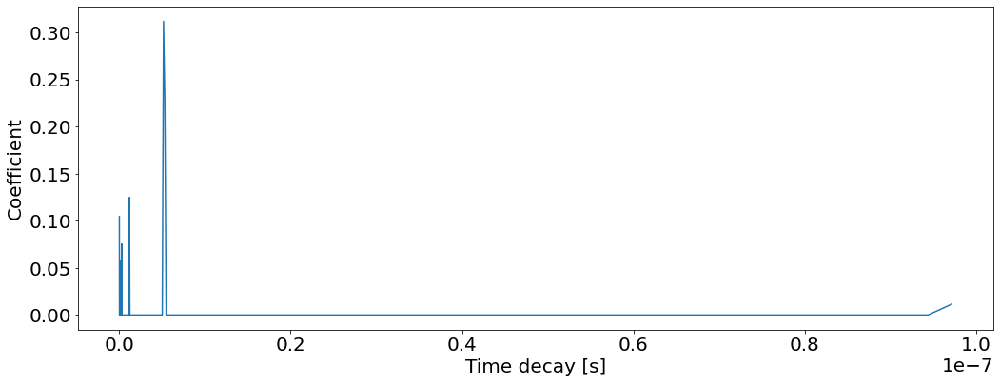

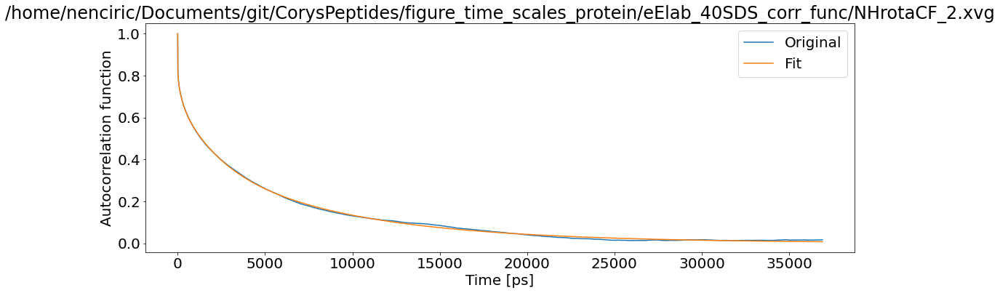

T1: 0.0014328915954269583 T2: 0.0008221167672158999 NOE: 0


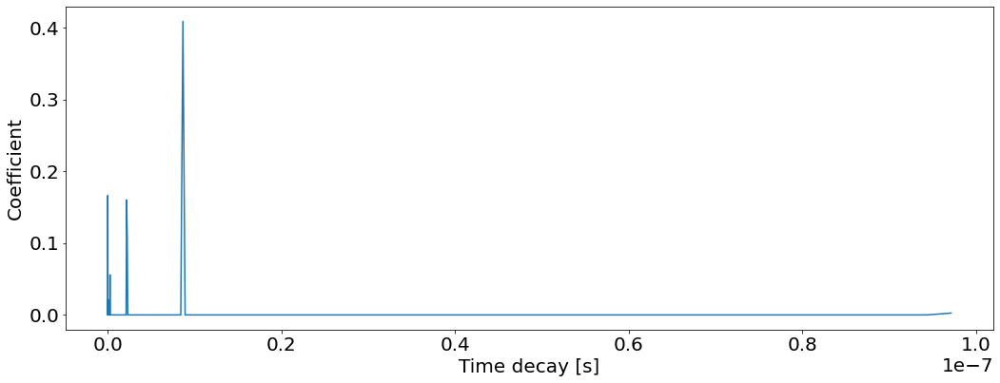

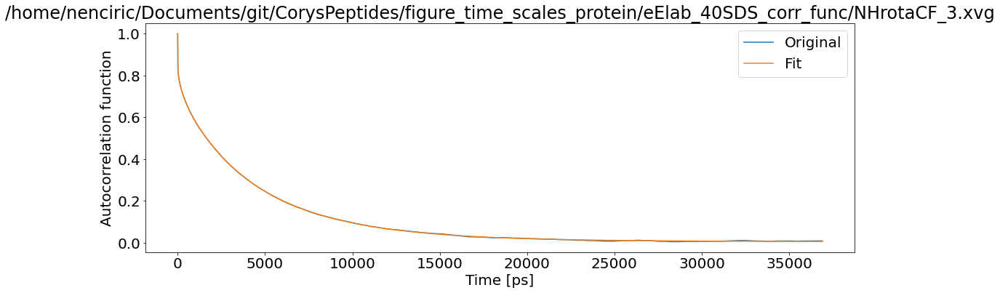

T1: 0.001233554758026281 T2: 0.0008089797474144914 NOE: 0


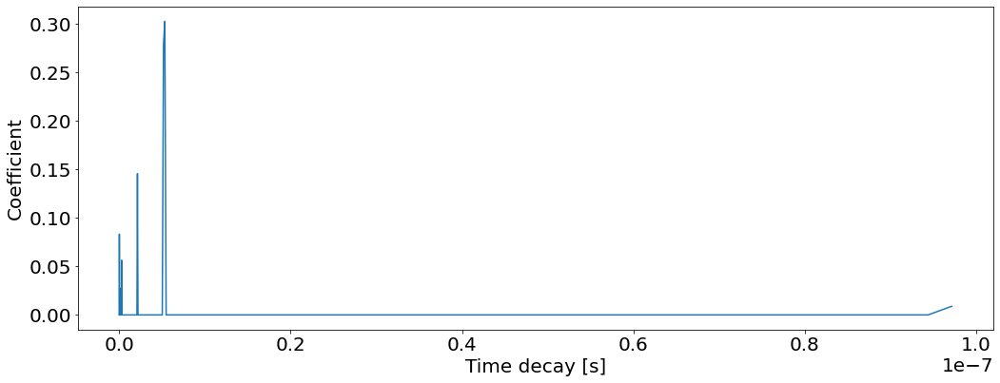

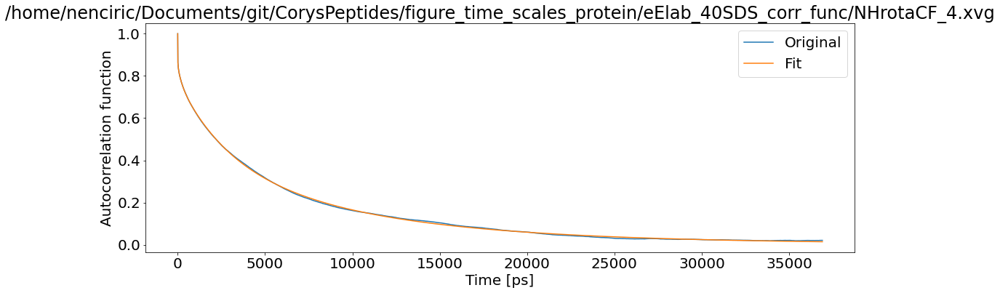

T1: 0.0012532465752496868 T2: 0.0006735001954216183 NOE: 0


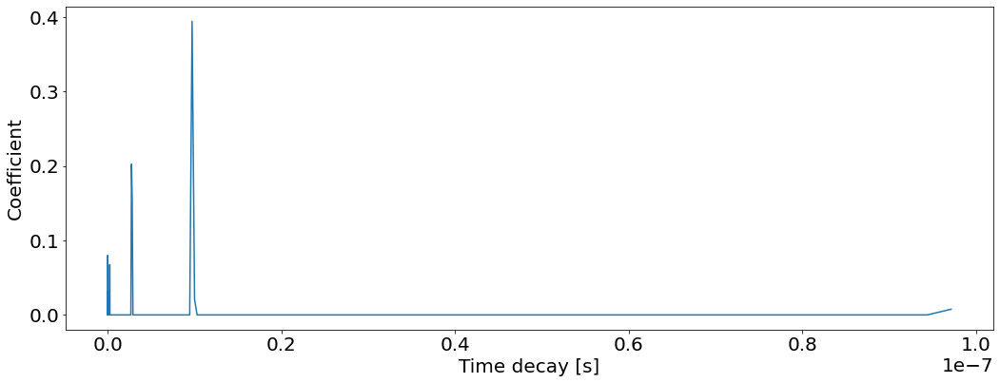

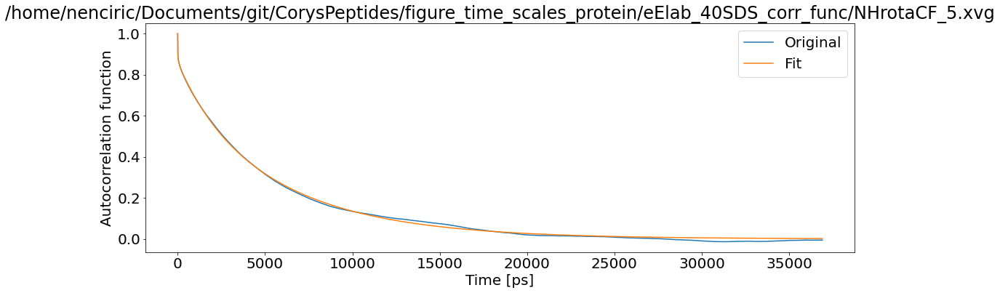

T1: 0.0010507872379009265 T2: 0.0006946515085691202 NOE: 0


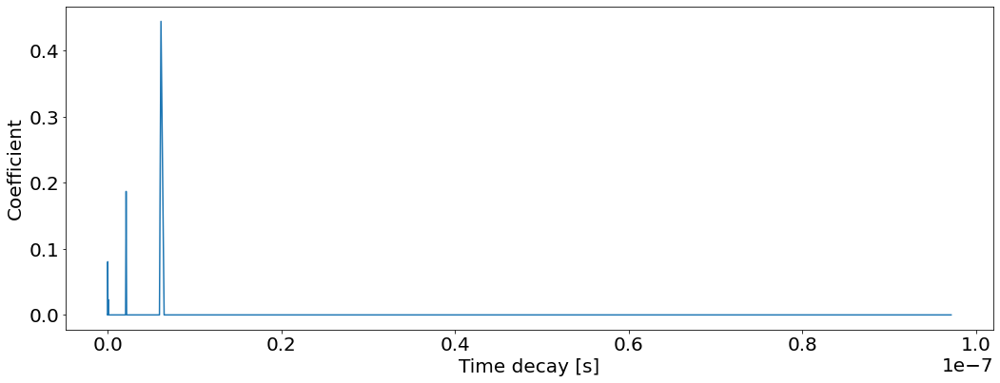

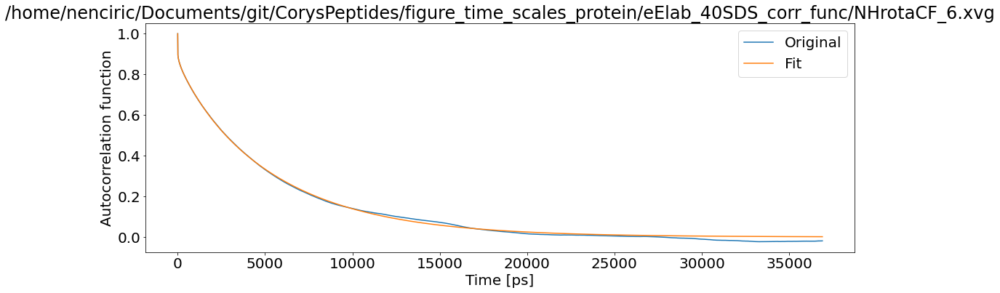

T1: 0.0010130463264035605 T2: 0.0006746234745349361 NOE: 0


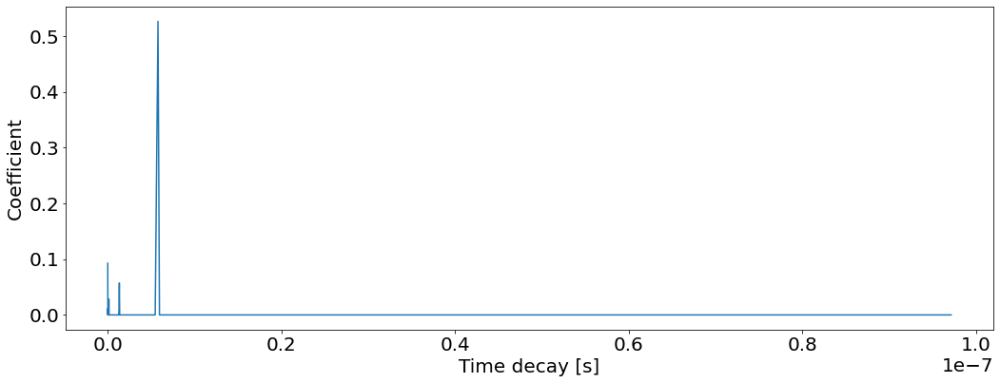

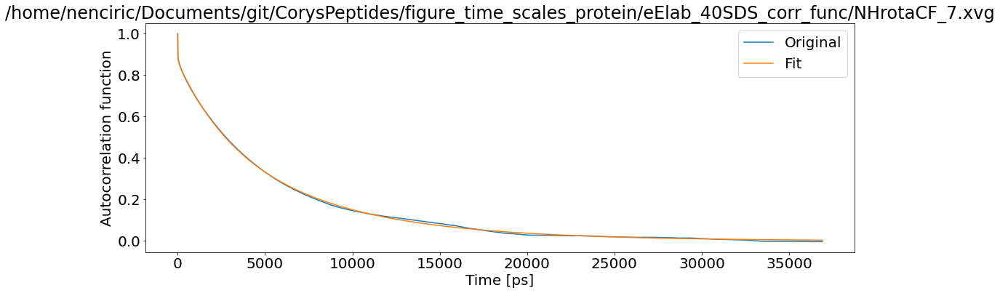

T1: 0.001057973030723528 T2: 0.0006679444431298319 NOE: 0


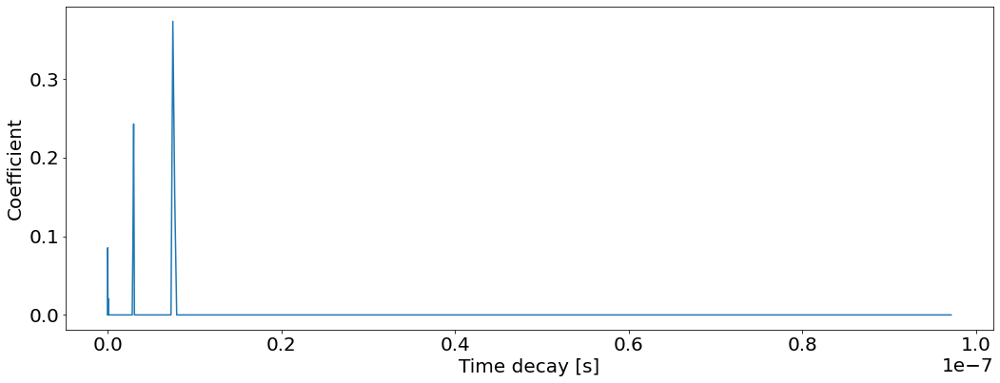

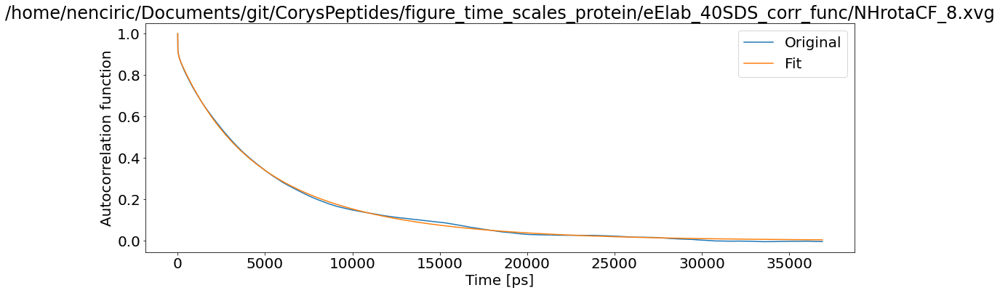

T1: 0.0010241169705888793 T2: 0.0006512345386675037 NOE: 0


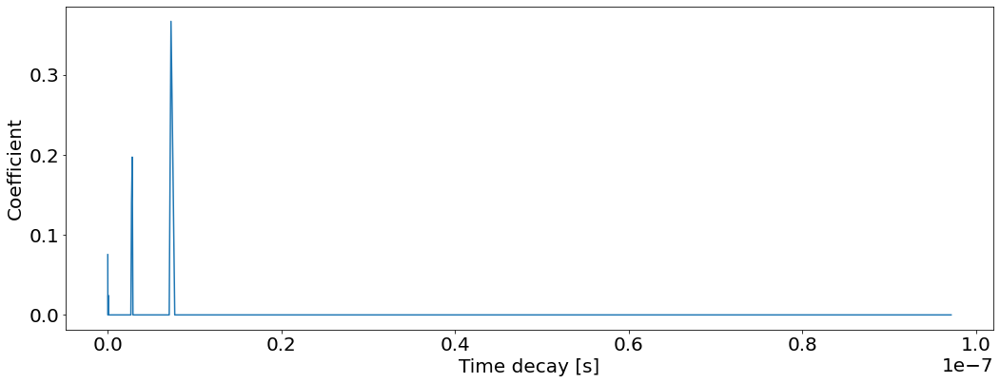

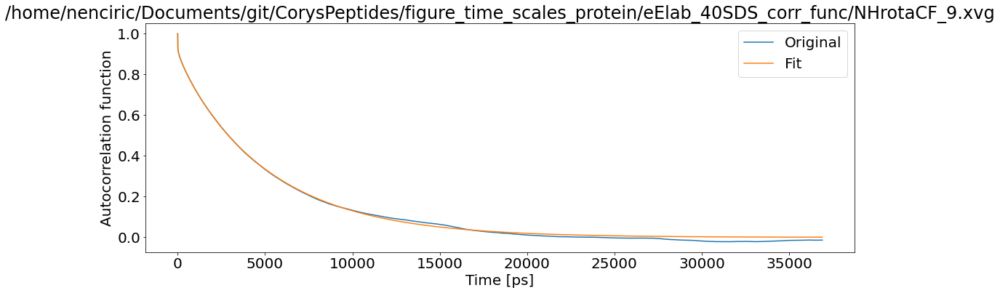

T1: 0.0009633608277318084 T2: 0.0006643970162594434 NOE: 0


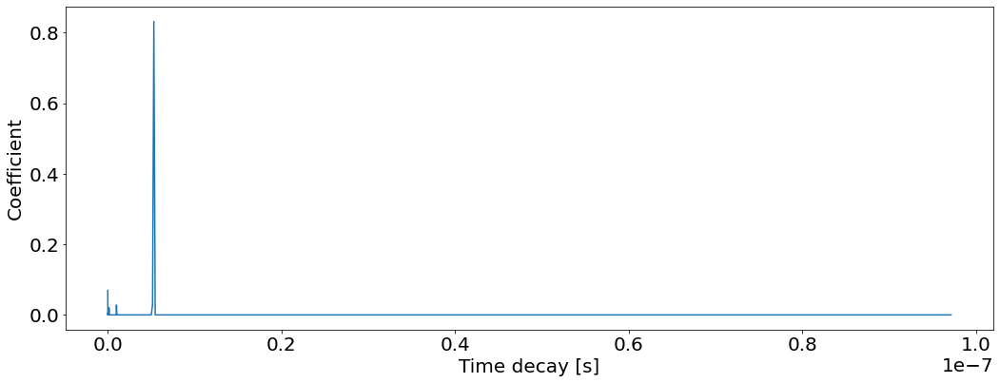

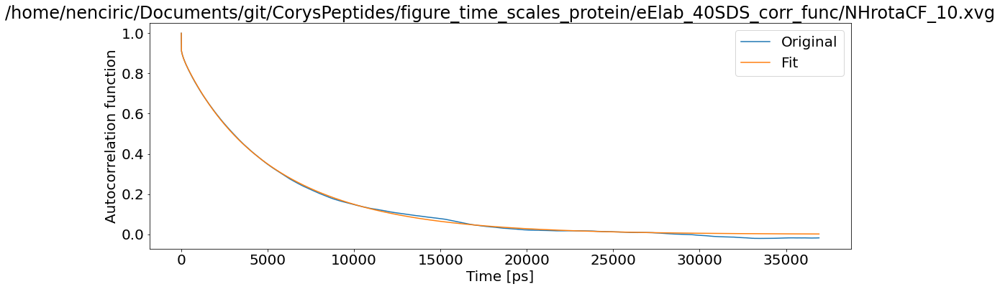

T1: 0.0009811686338840556 T2: 0.0006442766876844992 NOE: 0


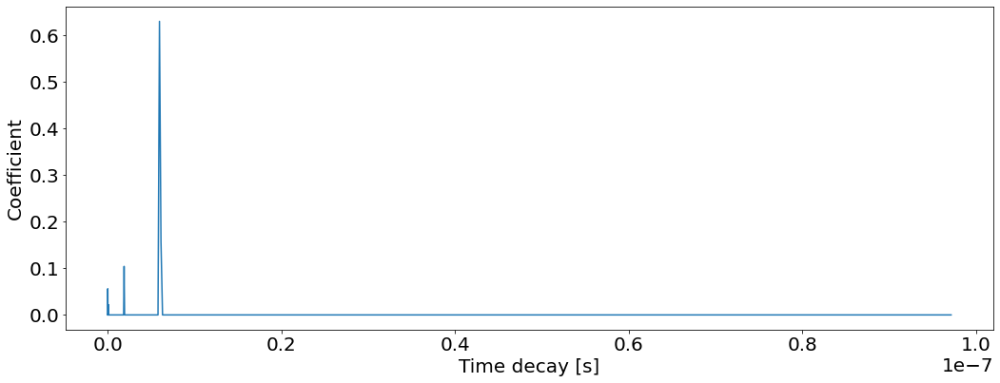

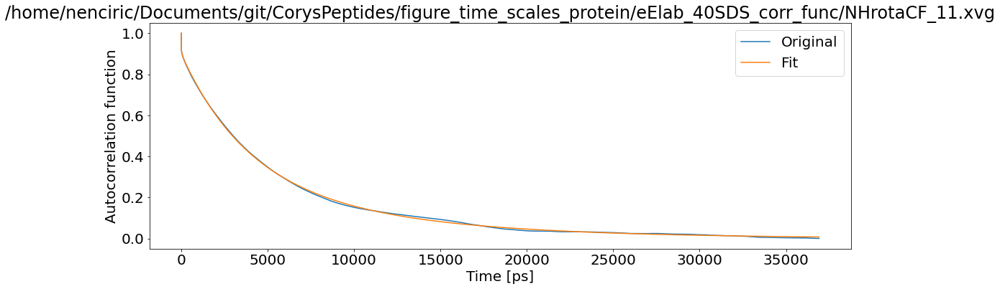

T1: 0.0010256722962944925 T2: 0.0006378916132151044 NOE: 0


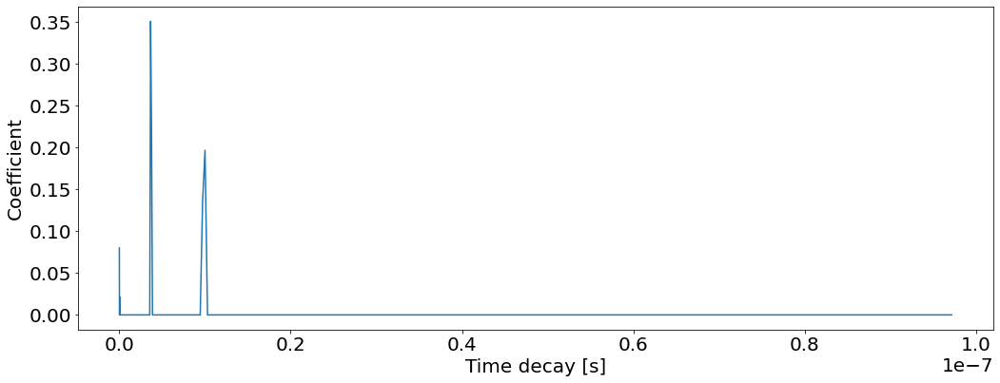

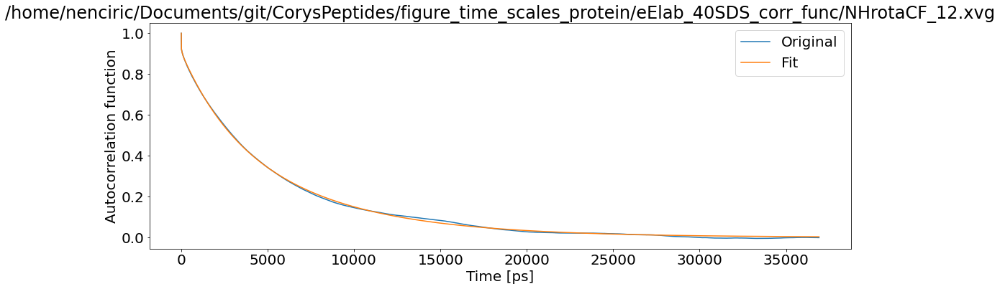

T1: 0.0009981268390087219 T2: 0.0006472687156380532 NOE: 0


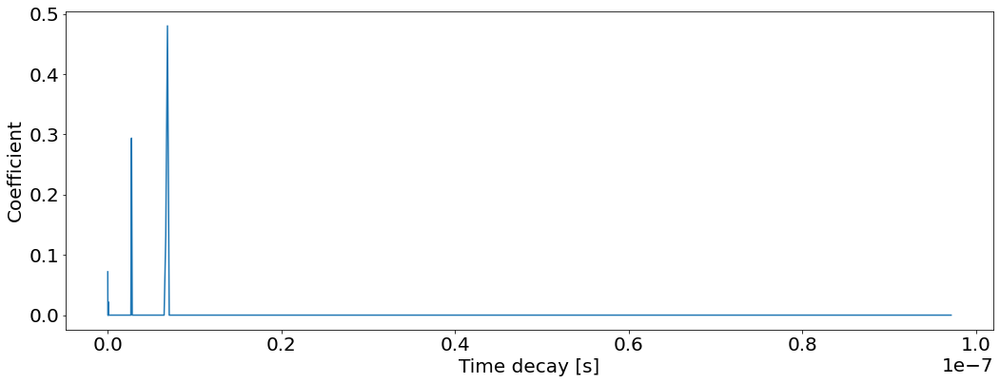

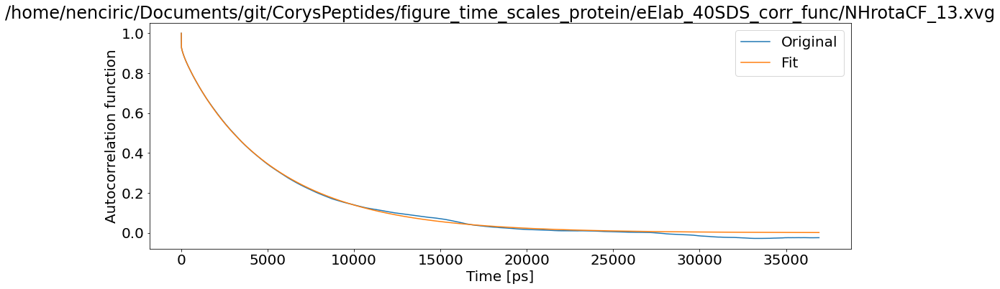

T1: 0.0009555747175232157 T2: 0.0006484067403161553 NOE: 0


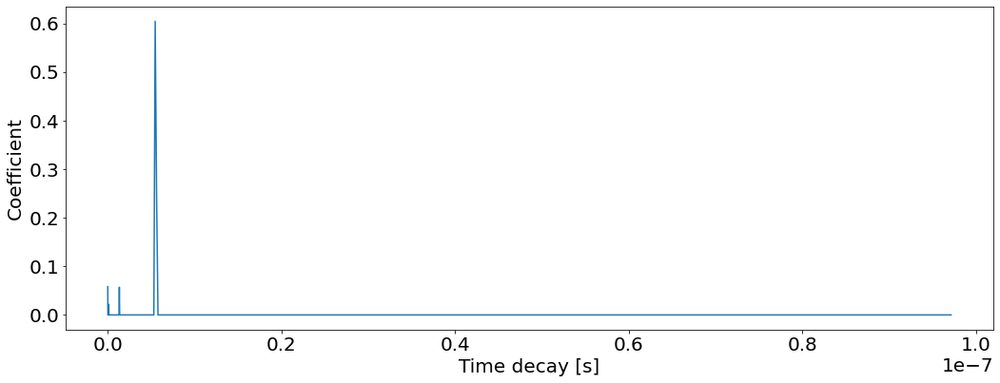

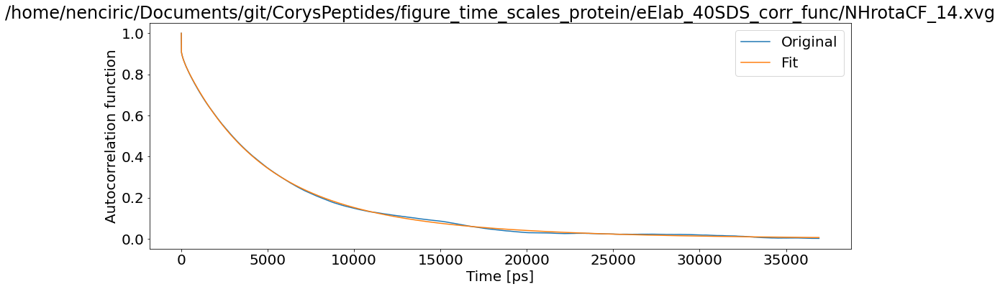

T1: 0.0010193722533967655 T2: 0.0006476456419976566 NOE: 0


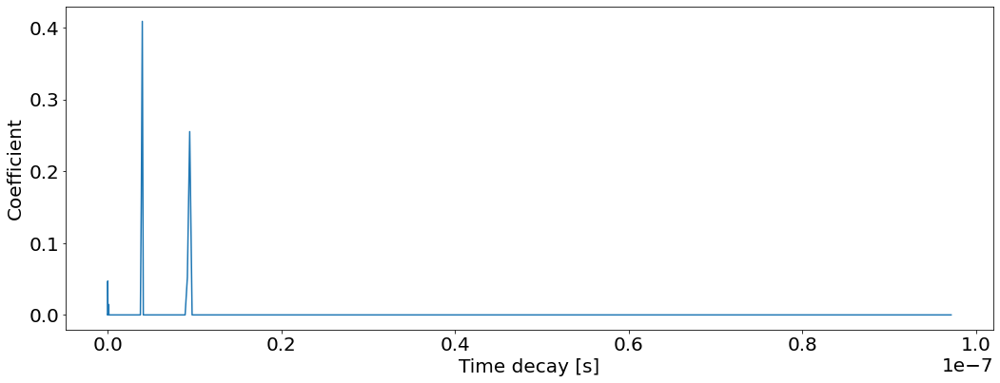

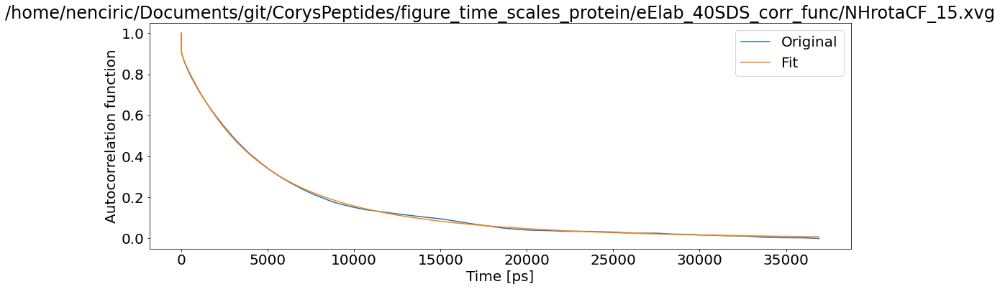

T1: 0.0010441162898383236 T2: 0.0006455553093299191 NOE: 0


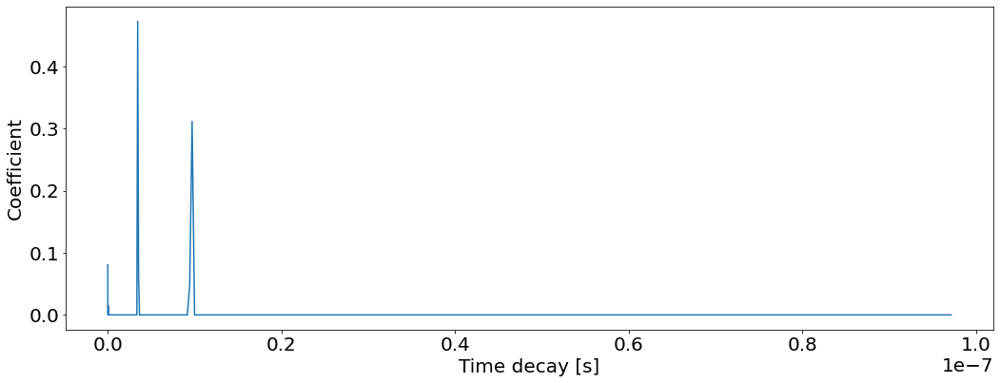

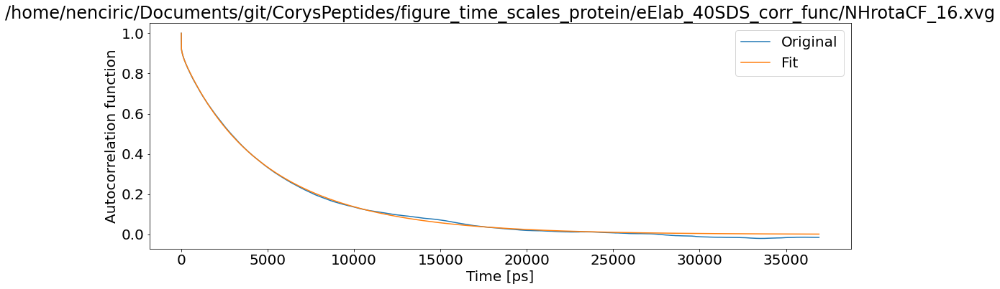

T1: 0.0009859182064498192 T2: 0.0006639443834512671 NOE: 0


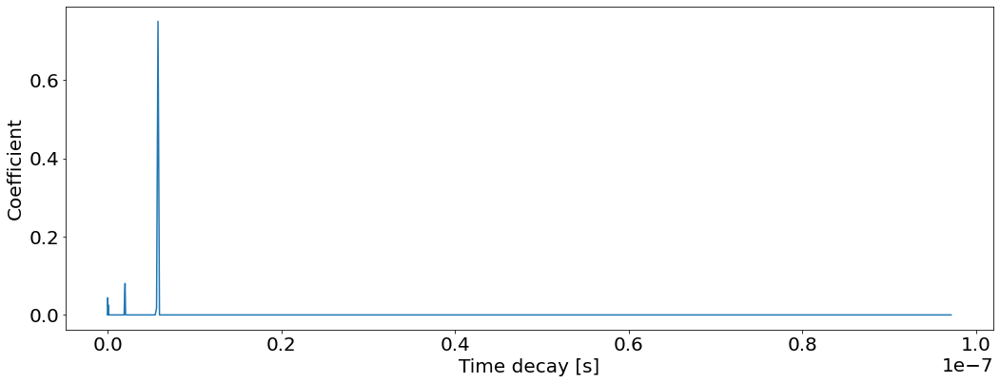

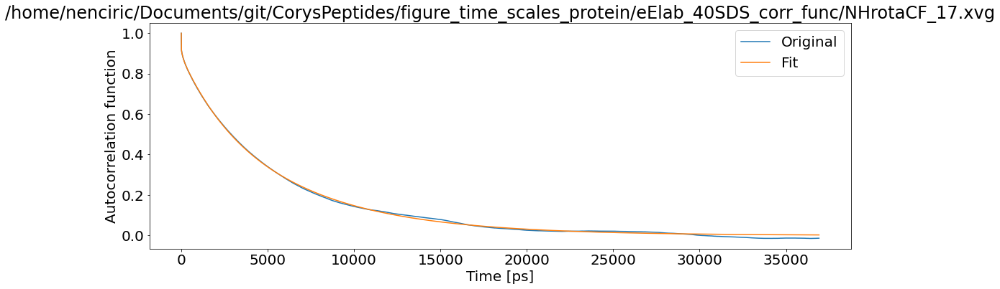

T1: 0.0010090071426117927 T2: 0.0006568186022957319 NOE: 0


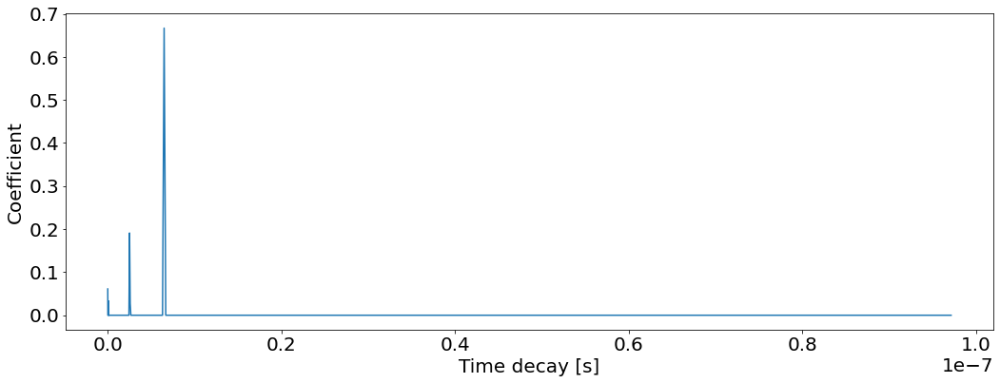

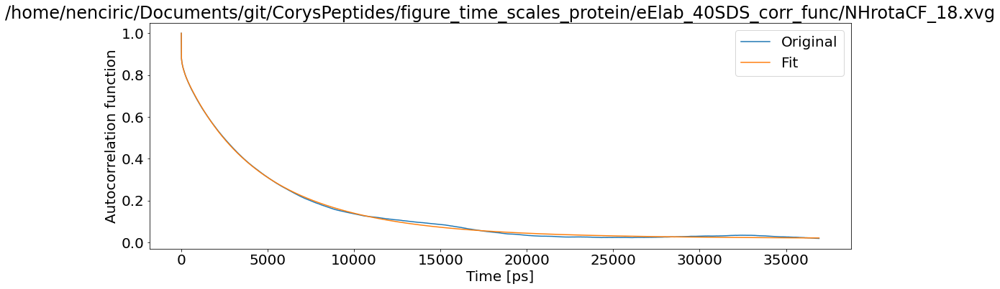

T1: 0.0011102722110321083 T2: 0.000604986049126811 NOE: 0


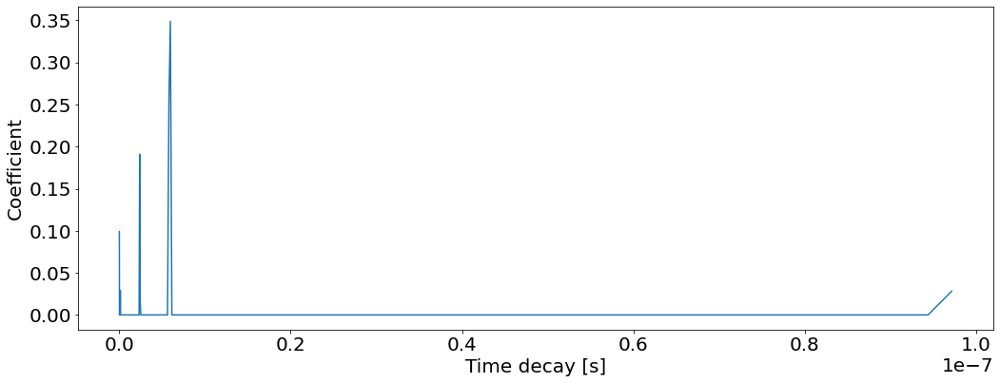

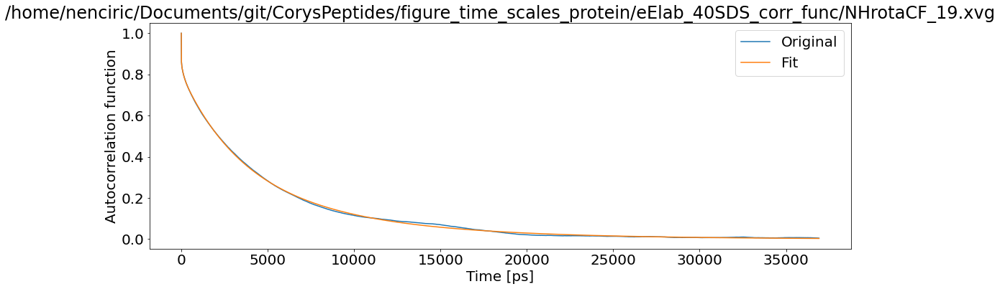

T1: 0.0011556689295492543 T2: 0.0007625920131697774 NOE: 0


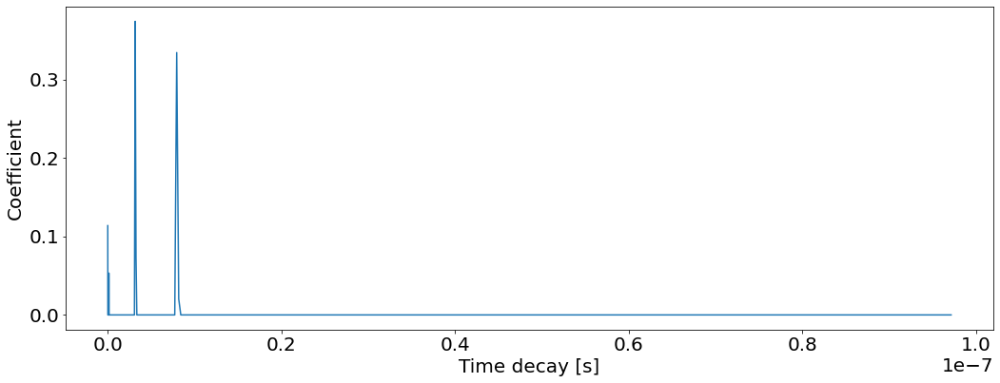

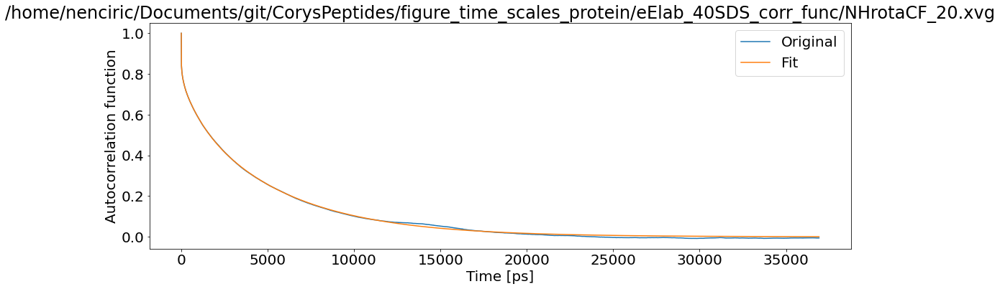

T1: 0.0012238008424258944 T2: 0.0008422524471479438 NOE: 0


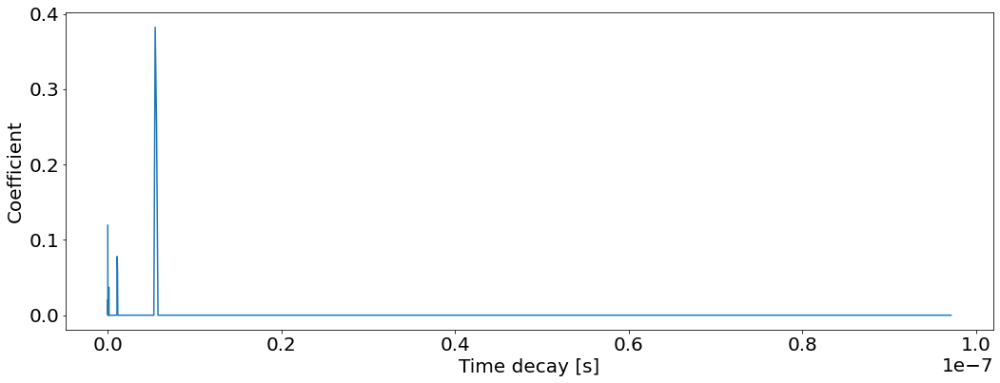

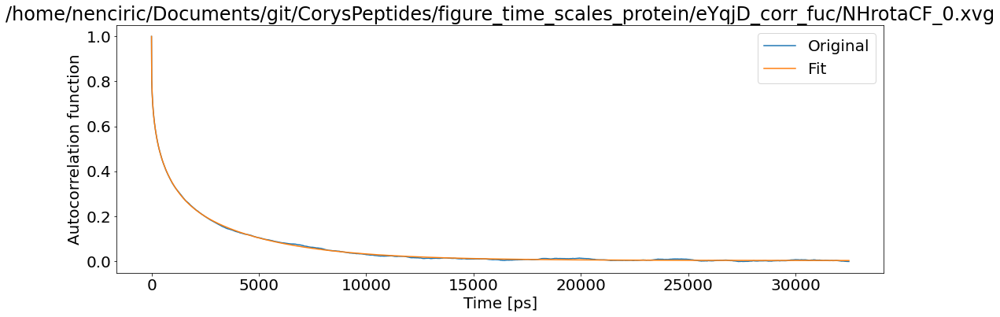

T1: 0.0021118580861057548 T2: 0.0015709550774831327 NOE: 0


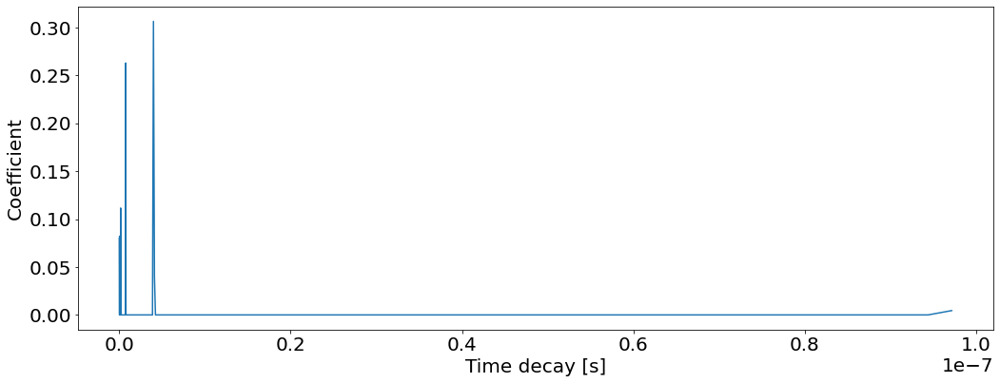

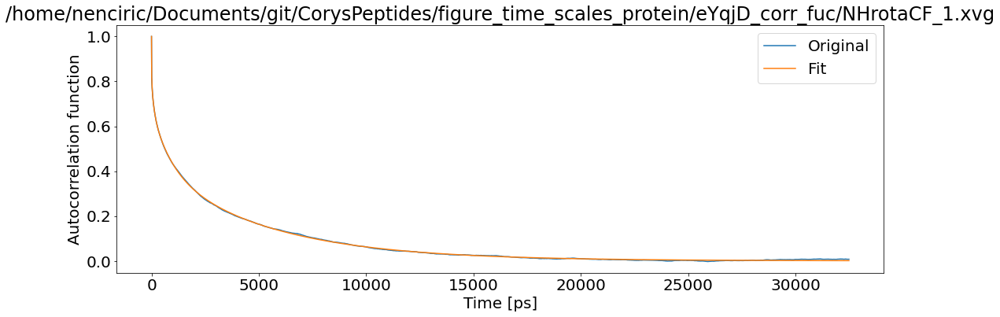

T1: 0.0016756018224730633 T2: 0.0012001611521195905 NOE: 0


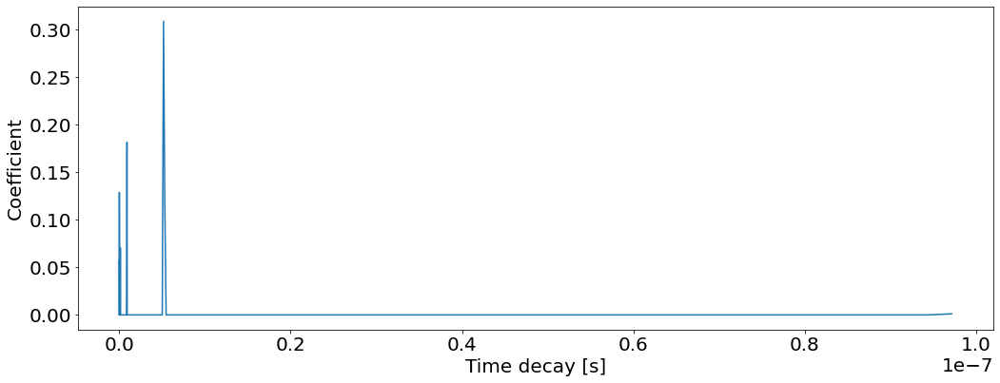

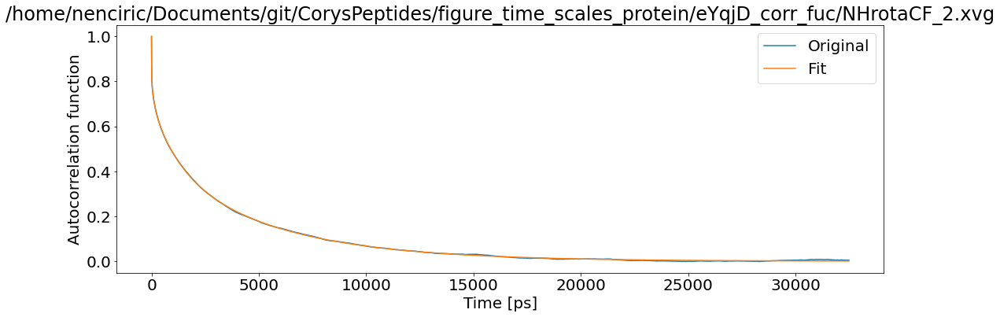

T1: 0.00151985421886352 T2: 0.0011071413858234674 NOE: 0


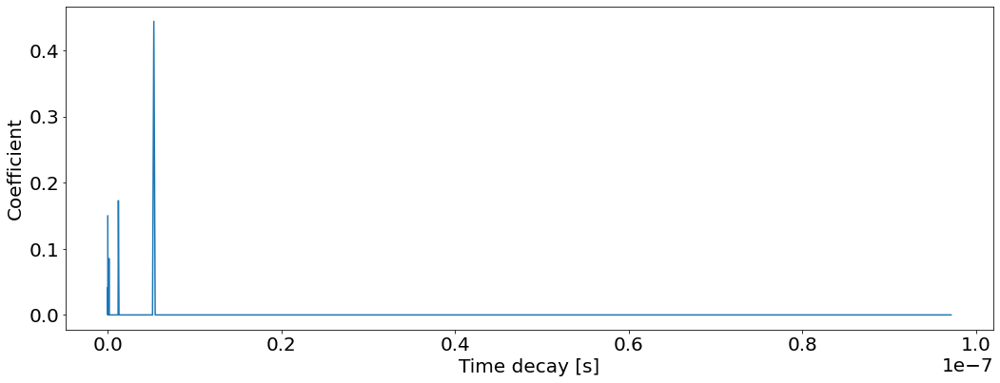

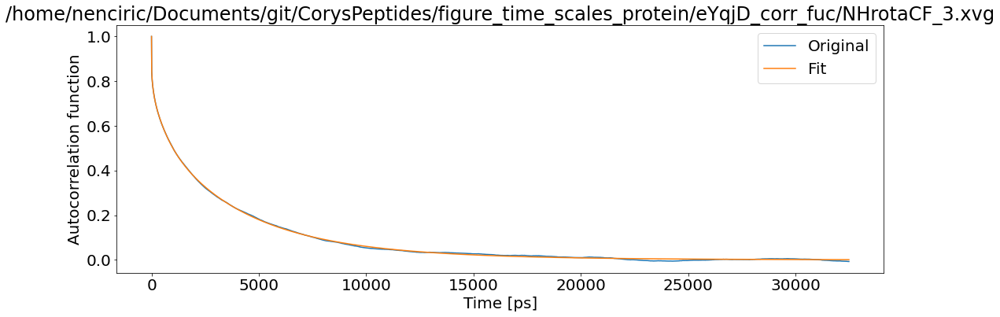

T1: 0.0014400878812991064 T2: 0.0010866834243400325 NOE: 0


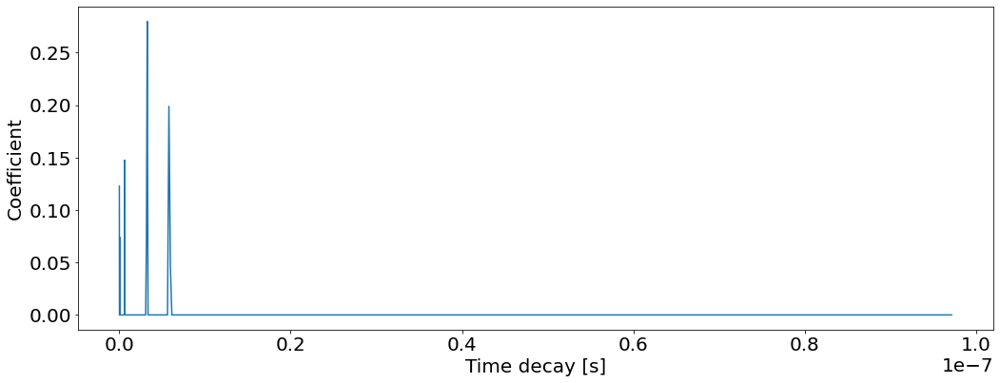

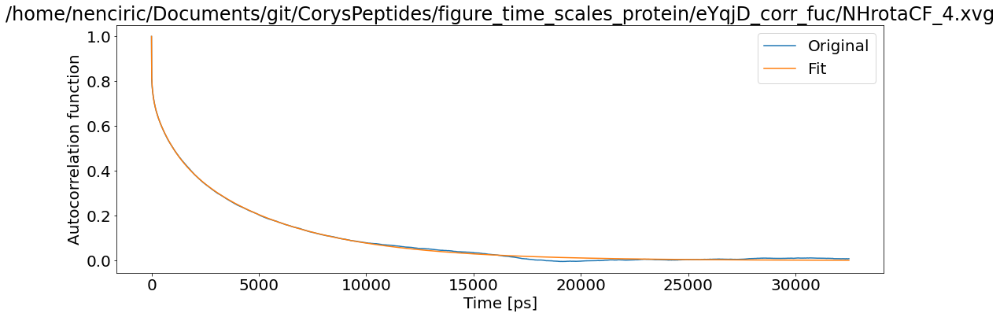

T1: 0.001420430796862223 T2: 0.0010168005877118989 NOE: 0


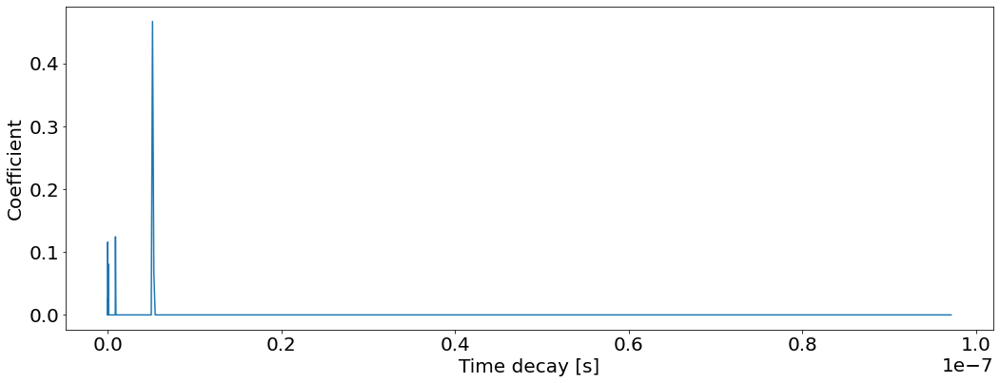

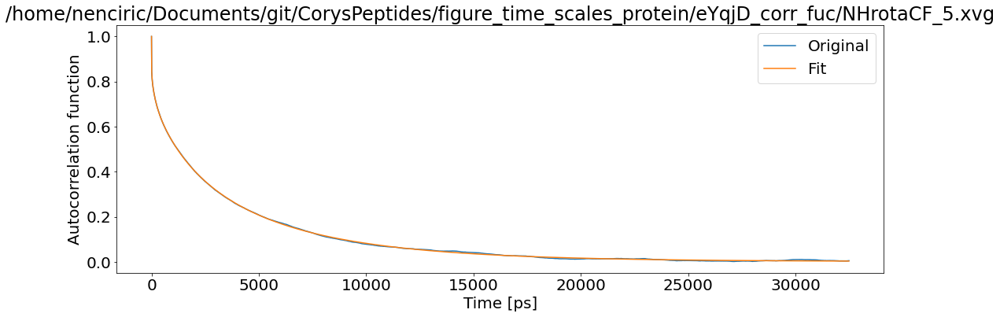

T1: 0.001386437770330387 T2: 0.0009521320356294537 NOE: 0


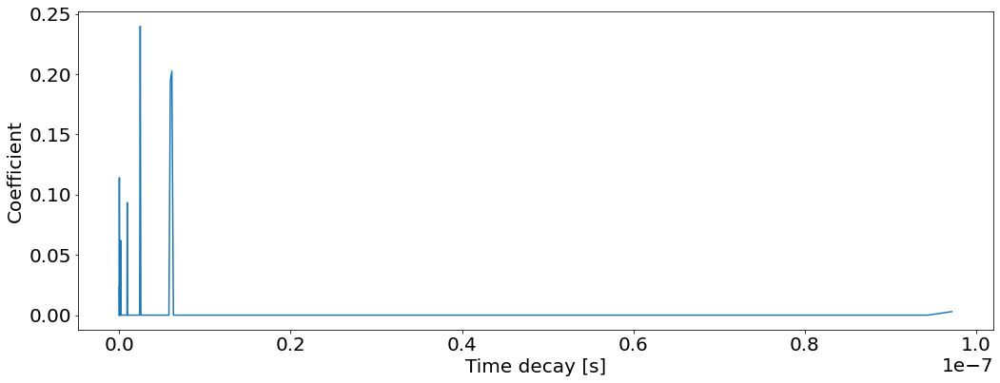

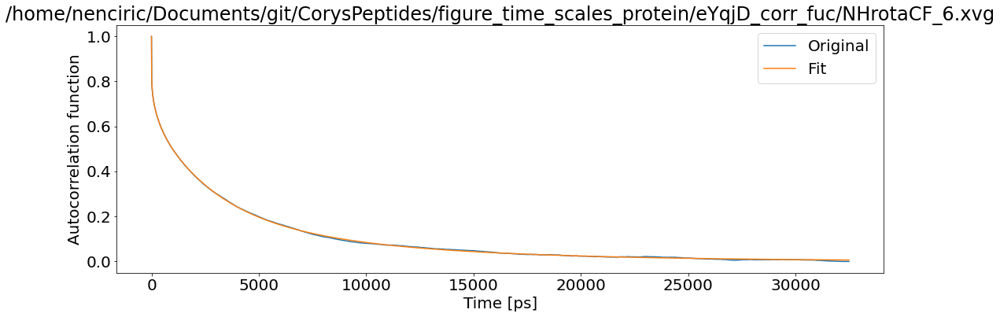

T1: 0.0015195028958823087 T2: 0.0010254974709924323 NOE: 0


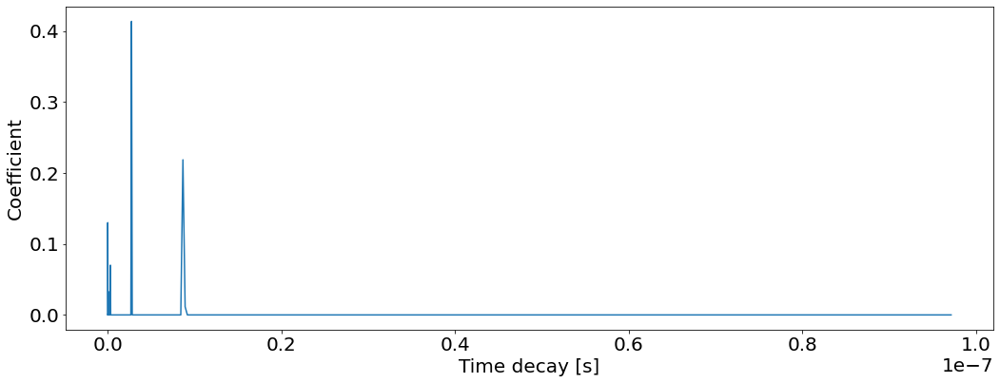

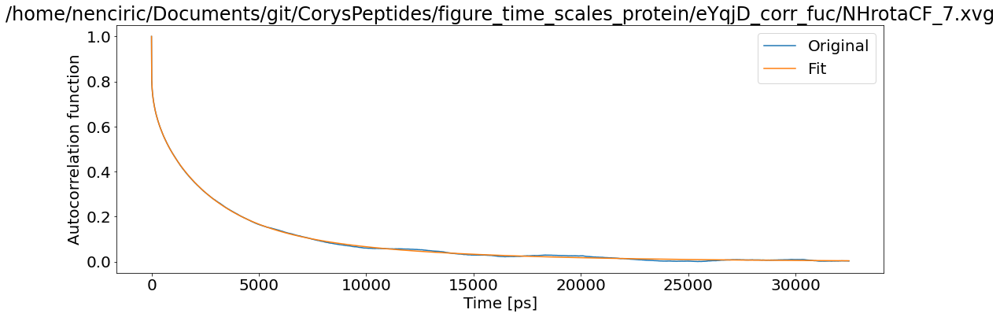

T1: 0.001595527542259205 T2: 0.0011358887885982633 NOE: 0


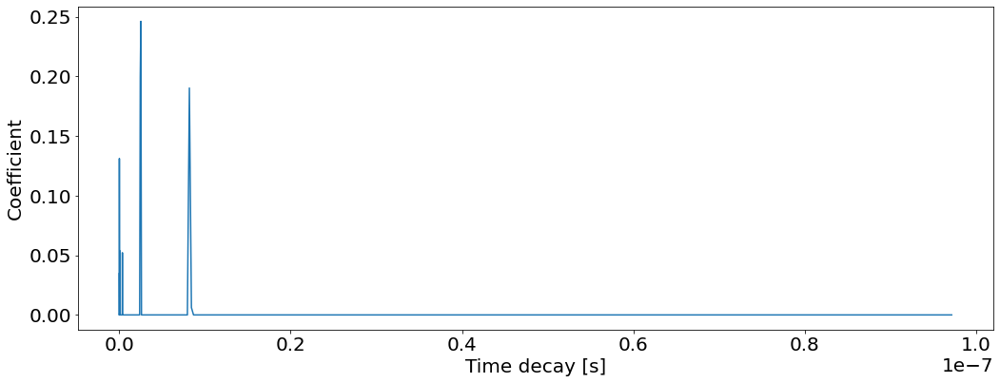

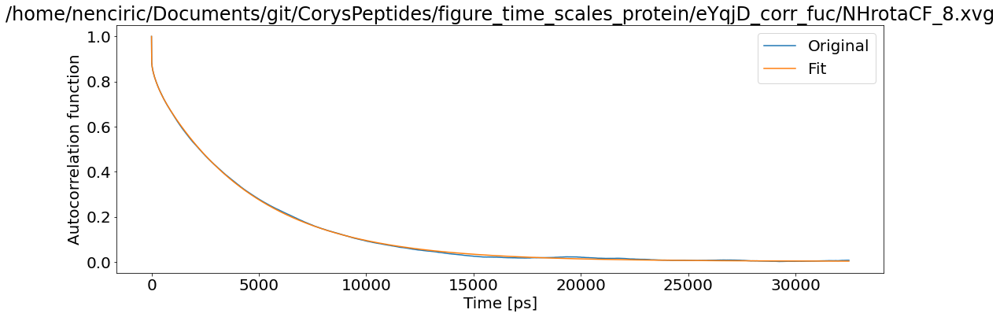

T1: 0.0010645269483772414 T2: 0.0007560779453380269 NOE: 0


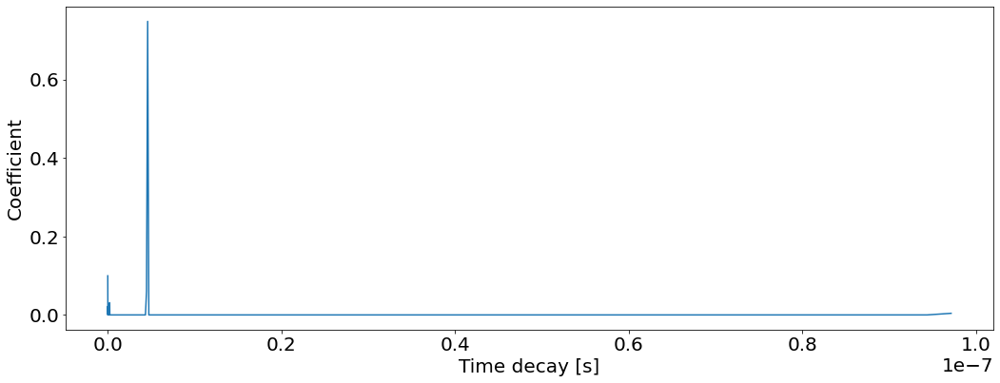

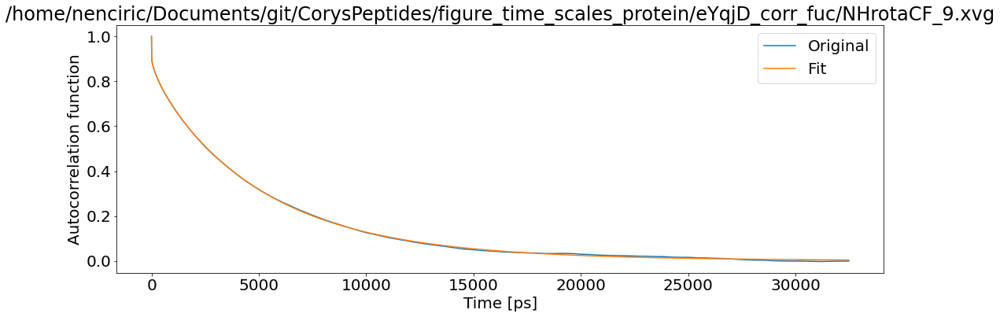

T1: 0.0010313414531270344 T2: 0.0006971318065973618 NOE: 0


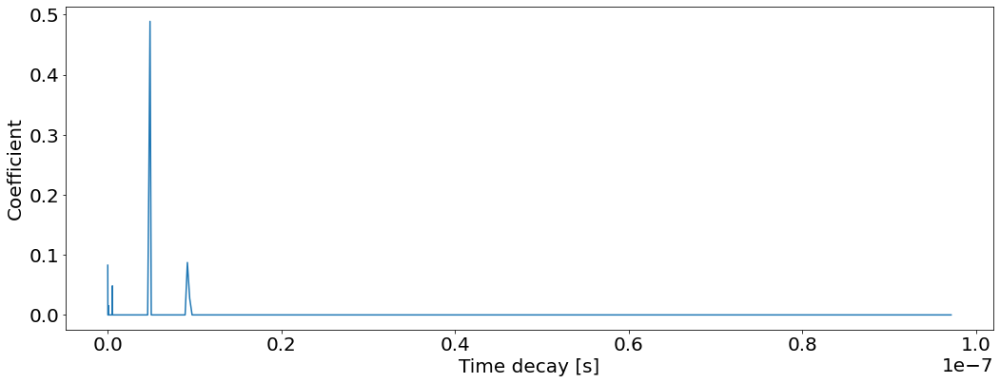

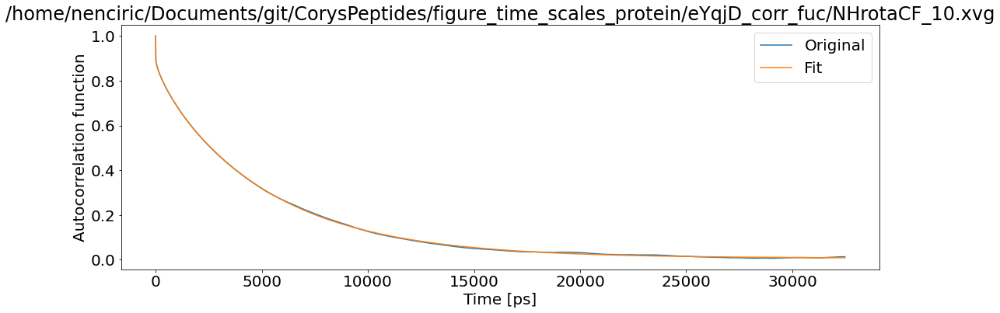

T1: 0.001030072182793658 T2: 0.0006583376038859337 NOE: 0


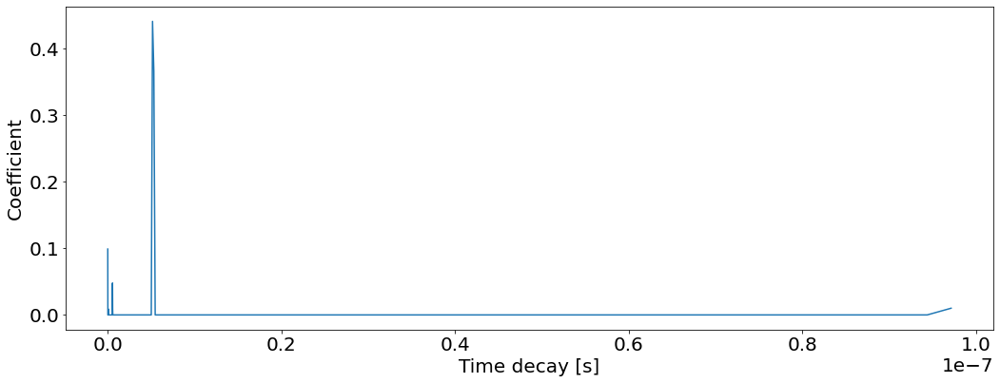

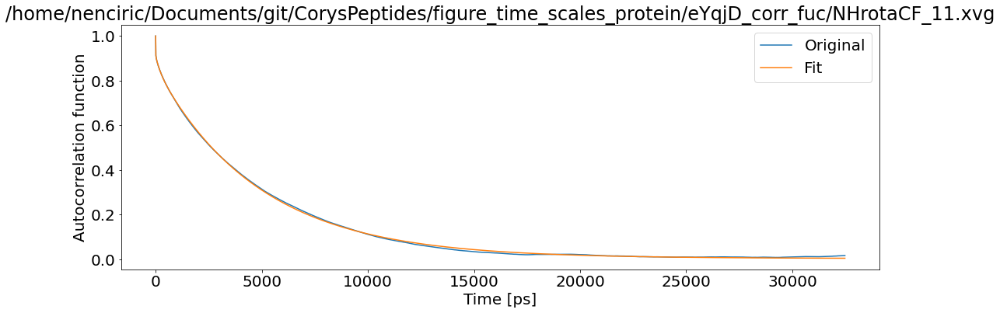

T1: 0.0009972251408095888 T2: 0.0006827730143160622 NOE: 0


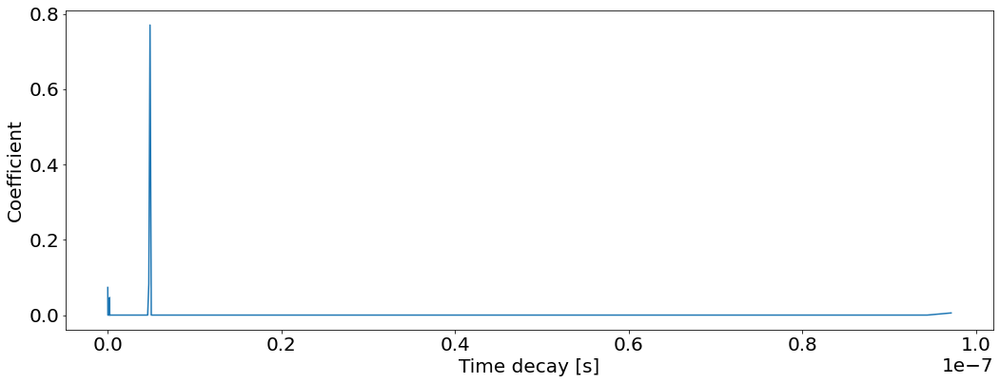

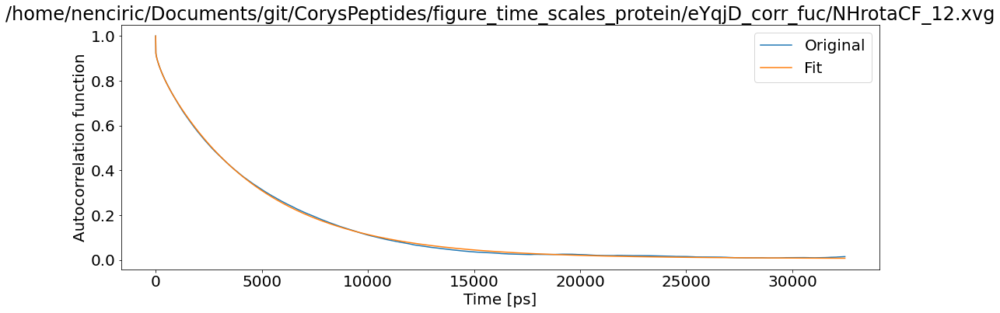

T1: 0.0009914792673874281 T2: 0.0006664944310628612 NOE: 0


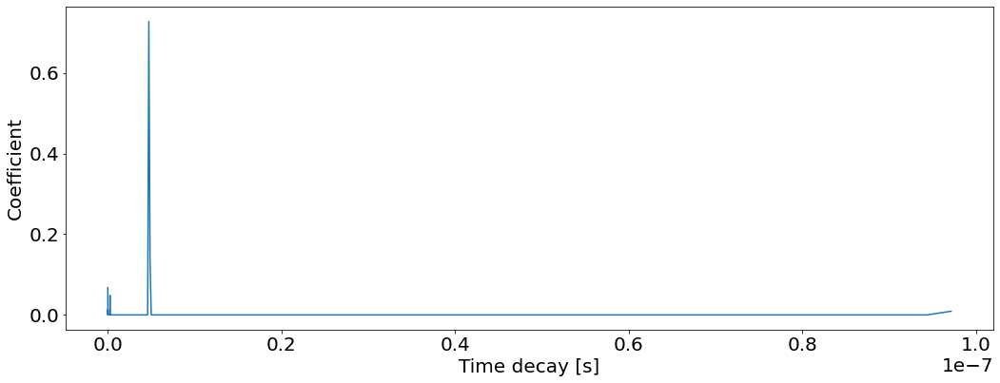

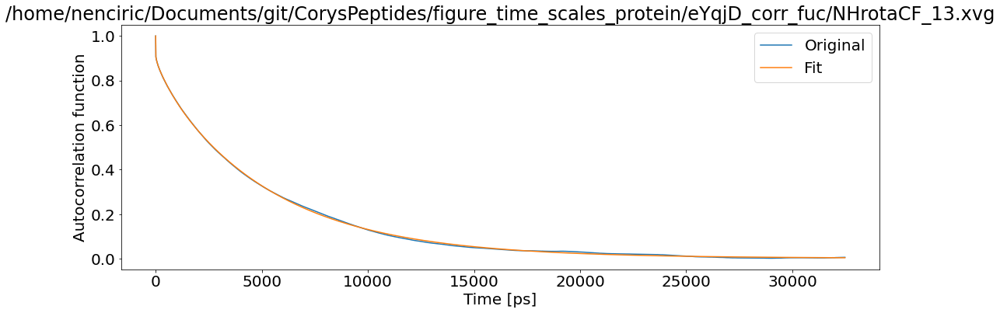

T1: 0.0010044643732597554 T2: 0.0006764707951025794 NOE: 0


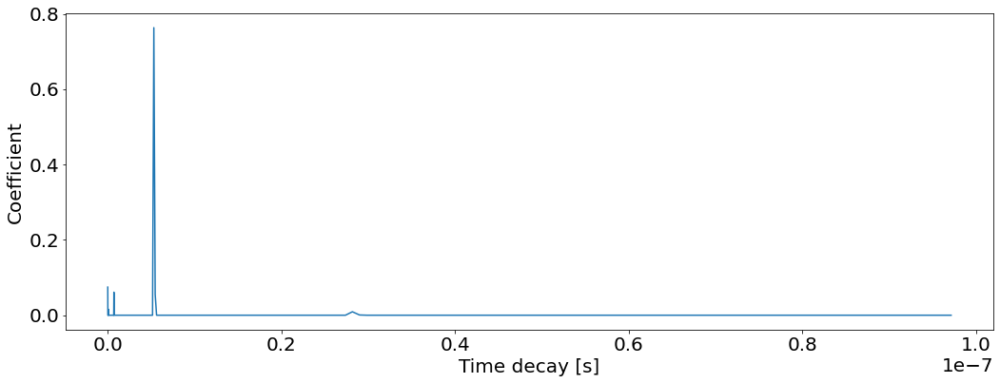

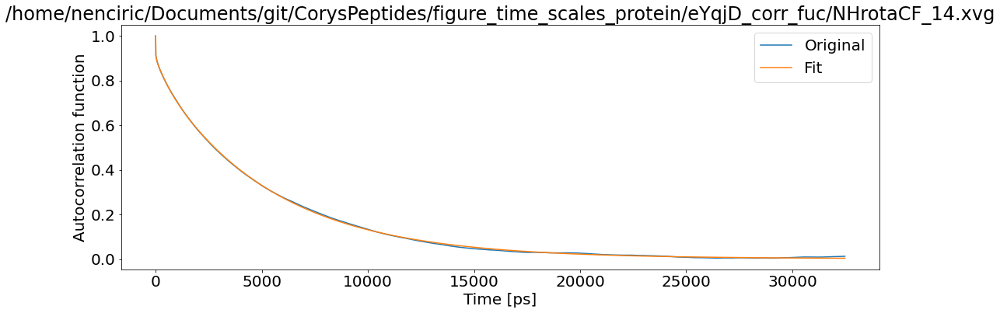

T1: 0.0009939045126819564 T2: 0.0006658108818409585 NOE: 0


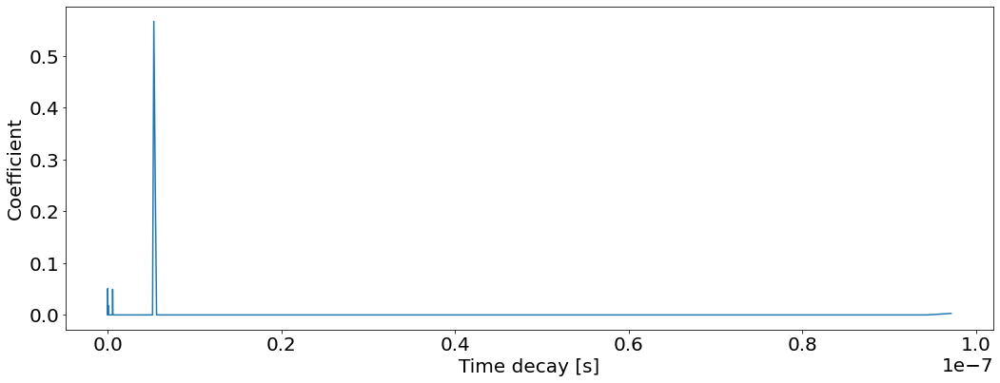

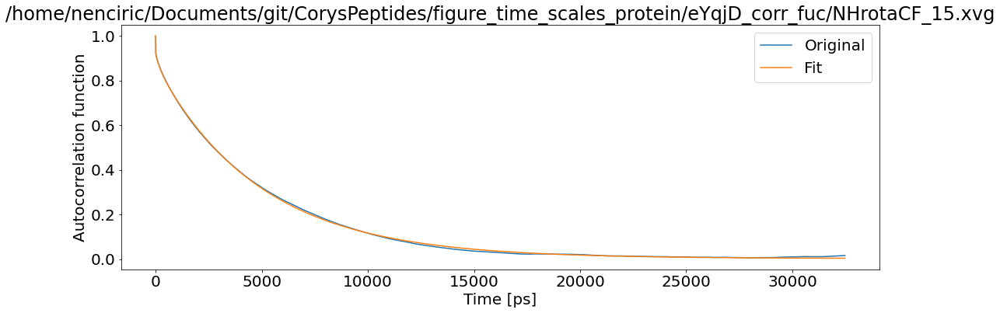

T1: 0.0009786527057757284 T2: 0.0006737019333163698 NOE: 0


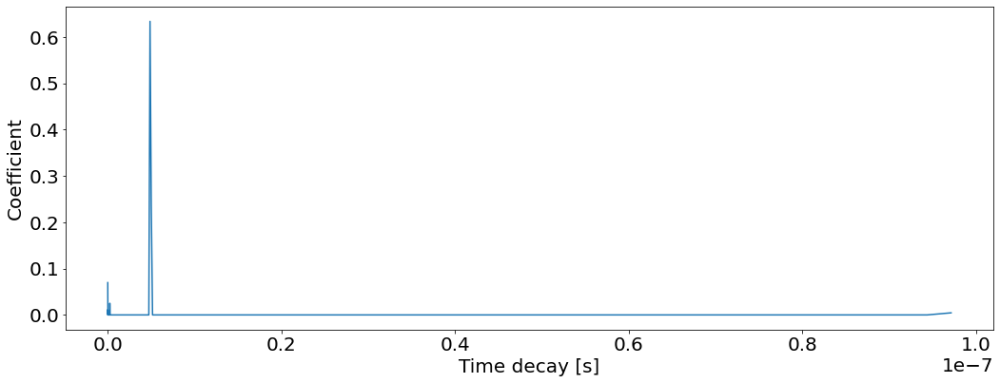

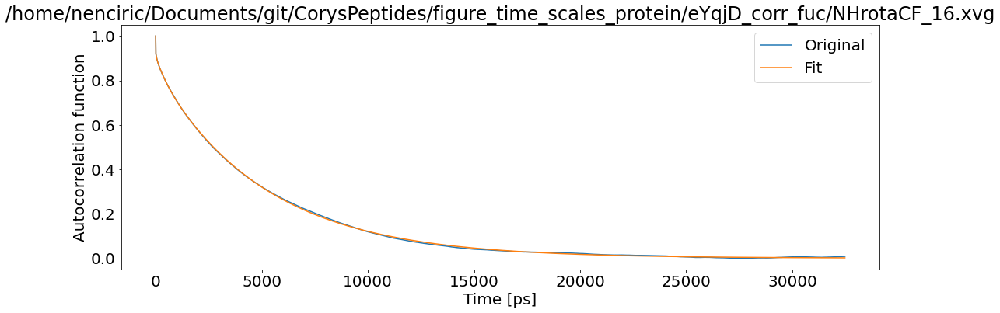

T1: 0.000986624094743044 T2: 0.0006868974900047878 NOE: 0


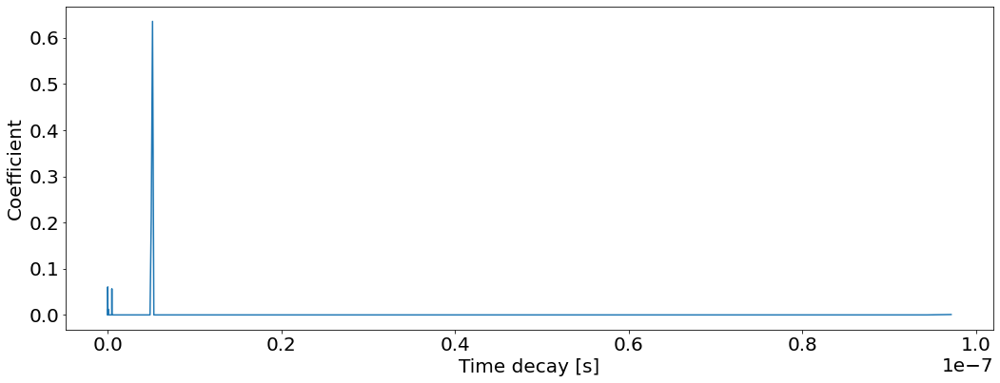

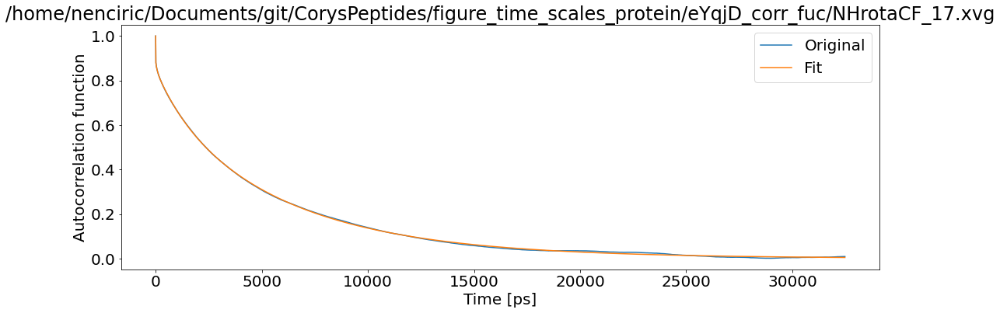

T1: 0.0010983286251970167 T2: 0.0007116997855657978 NOE: 0


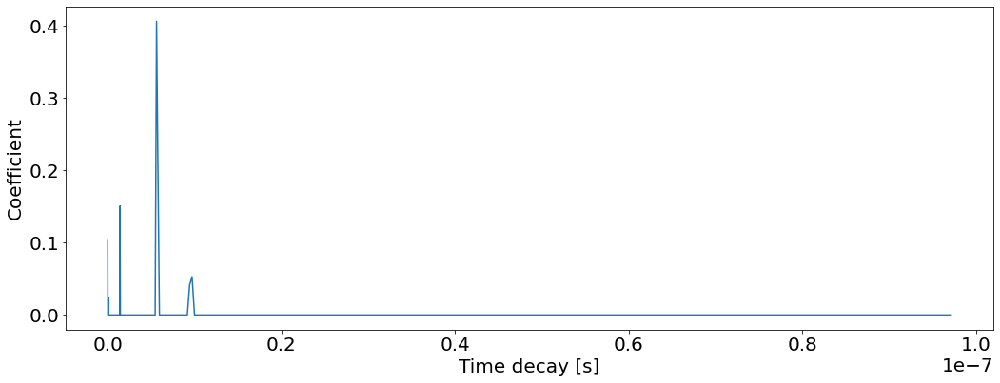

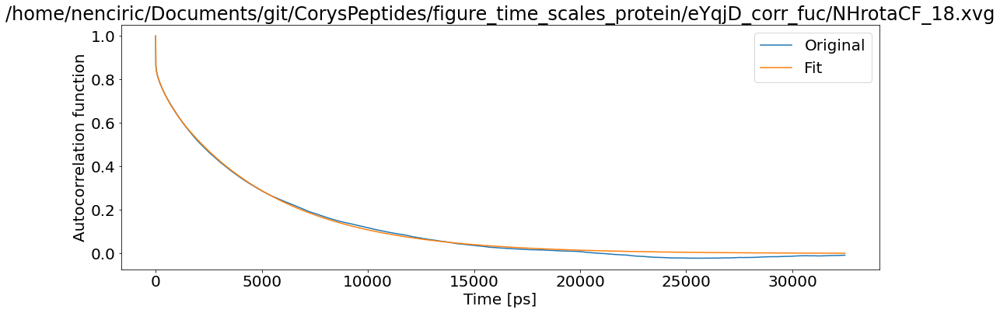

T1: 0.0010865390116022115 T2: 0.0007627513174226819 NOE: 0


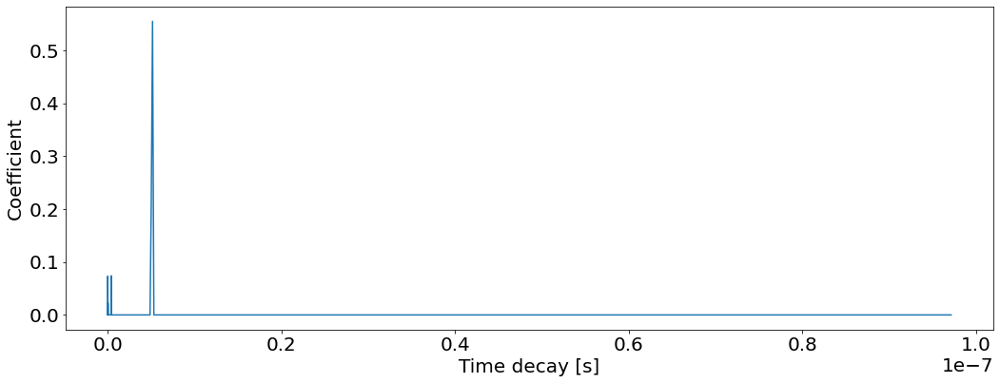

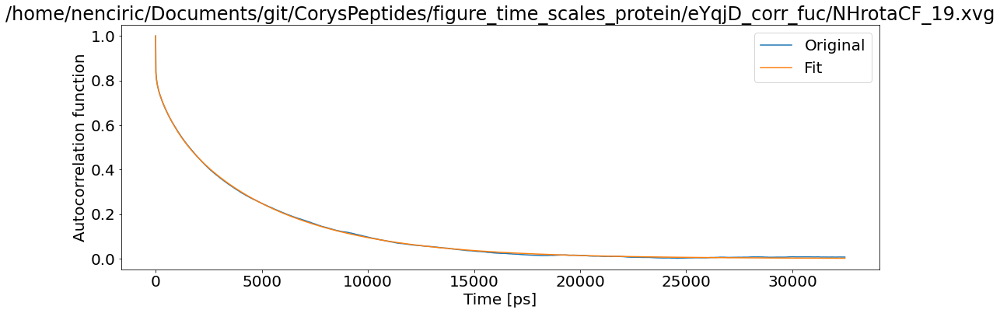

T1: 0.0012265479697673453 T2: 0.0008580777582628782 NOE: 0


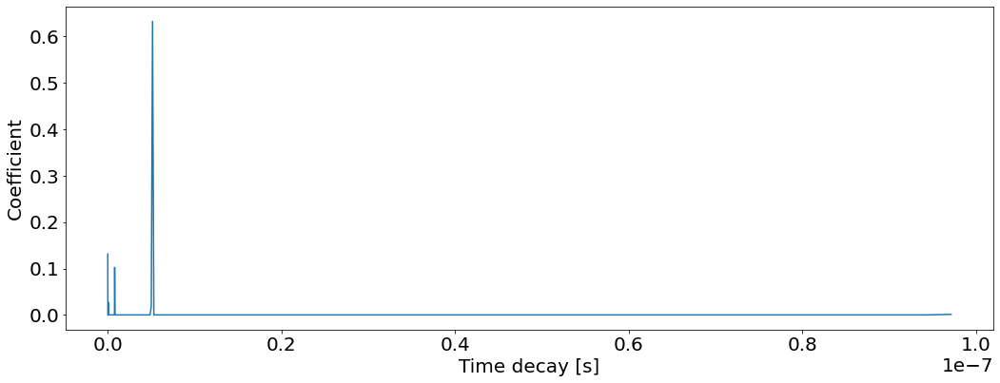

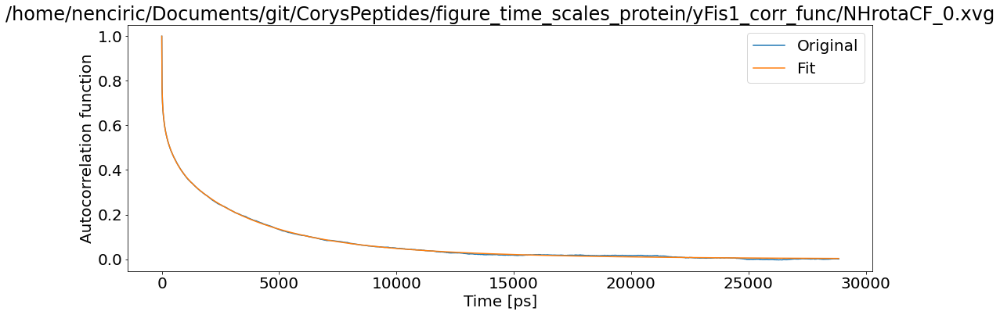

T1: 0.0019304043720026409 T2: 0.001425160497271162 NOE: 0


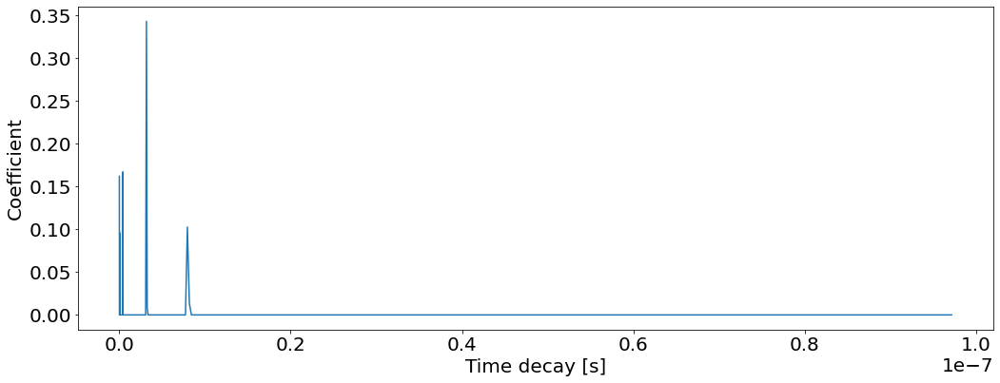

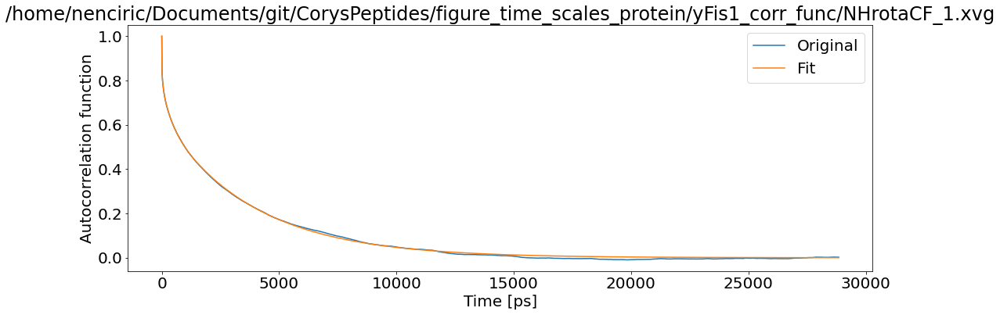

T1: 0.0014052928168503261 T2: 0.0011203574770313643 NOE: 0


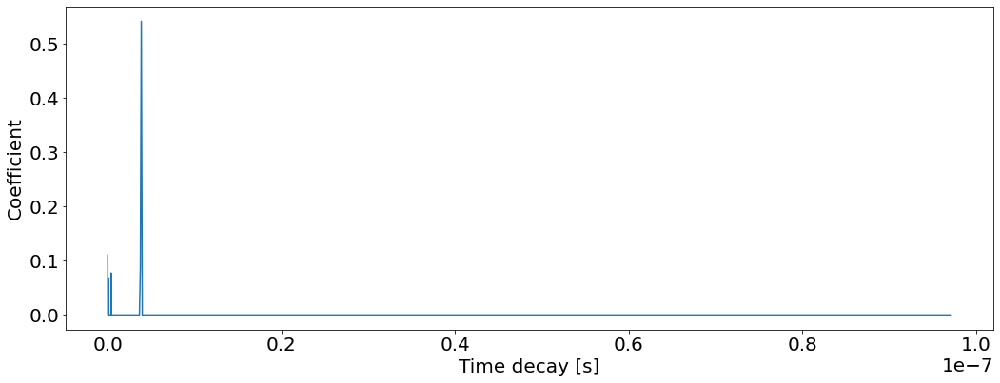

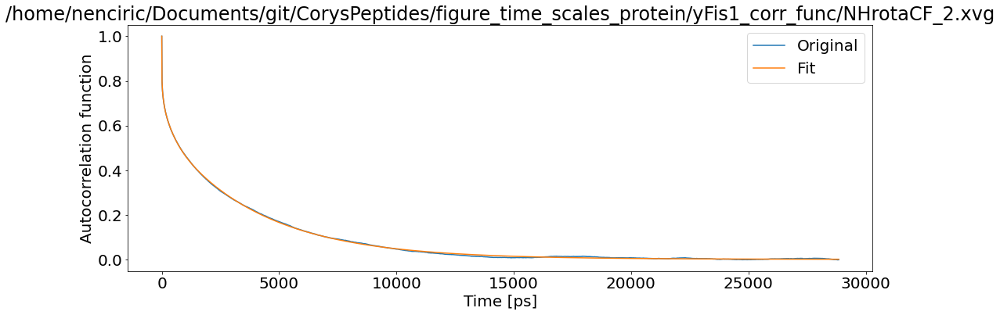

T1: 0.0015056663804230818 T2: 0.001144692373633619 NOE: 0


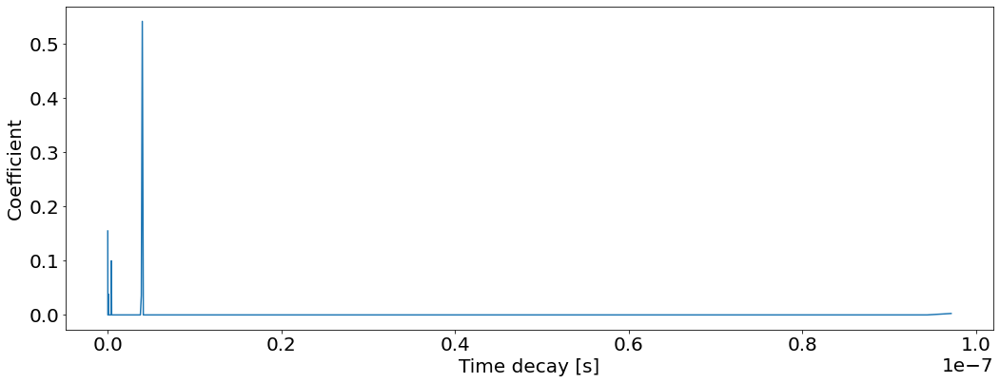

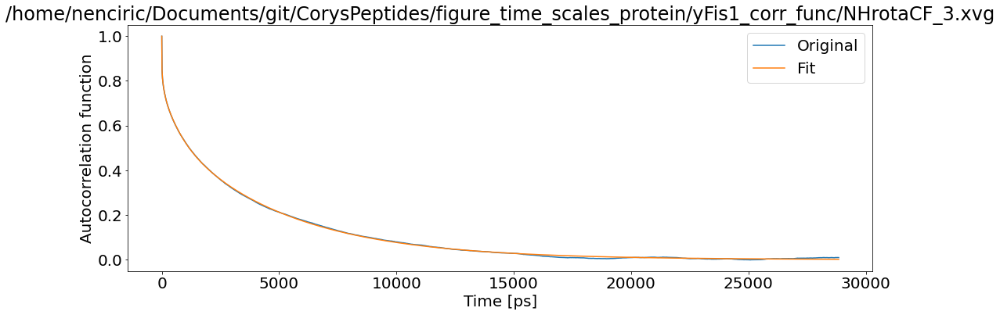

T1: 0.0013443916418429118 T2: 0.0009791256411858201 NOE: 0


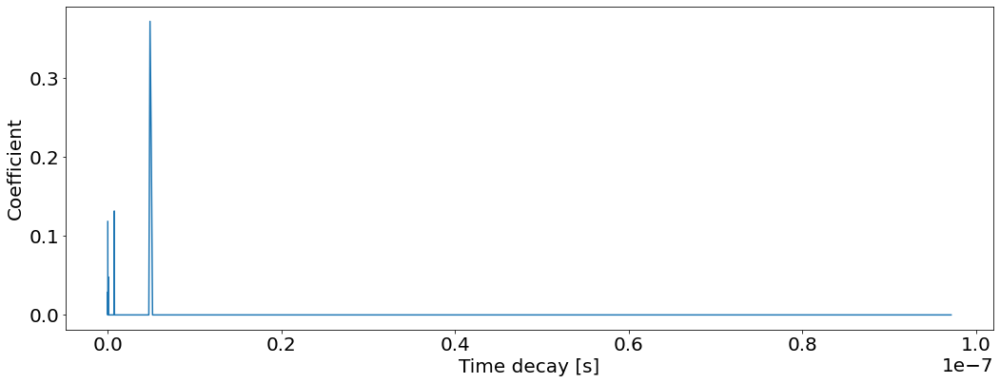

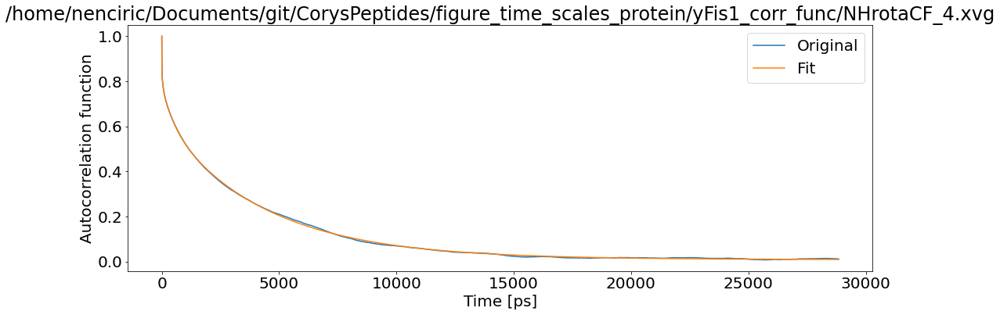

T1: 0.0013622959854455502 T2: 0.0009125156159725975 NOE: 0


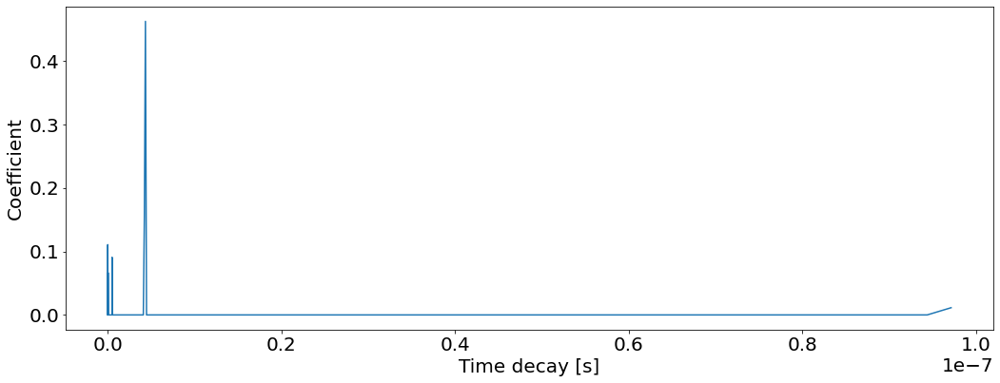

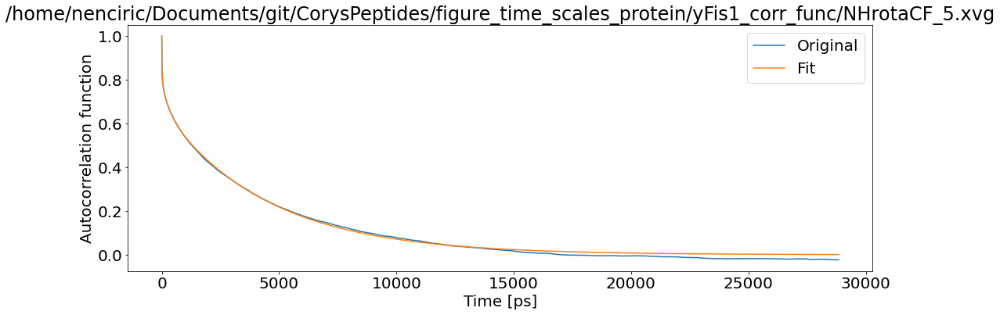

T1: 0.0012792150463507906 T2: 0.0009586756405367332 NOE: 0


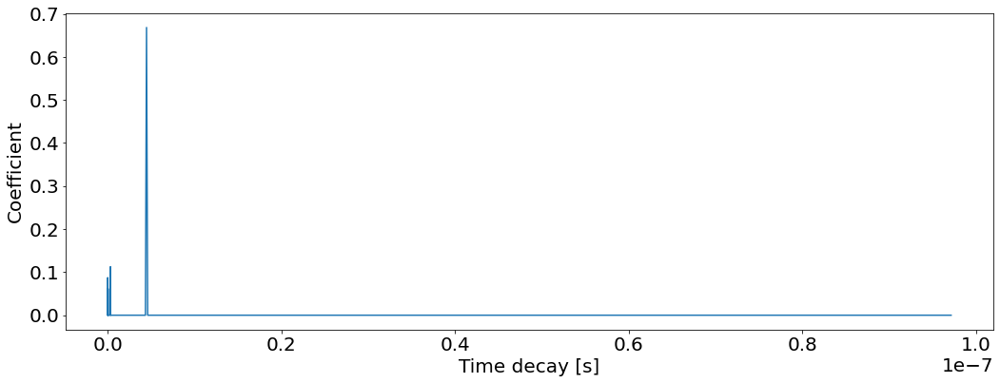

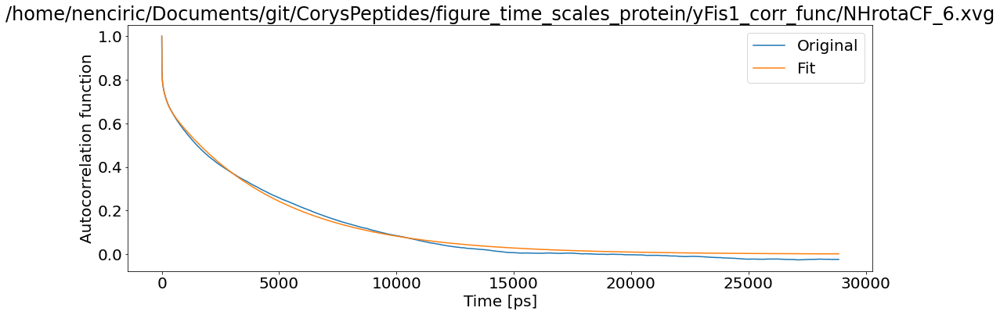

T1: 0.001208645056136423 T2: 0.0008860458448075383 NOE: 0


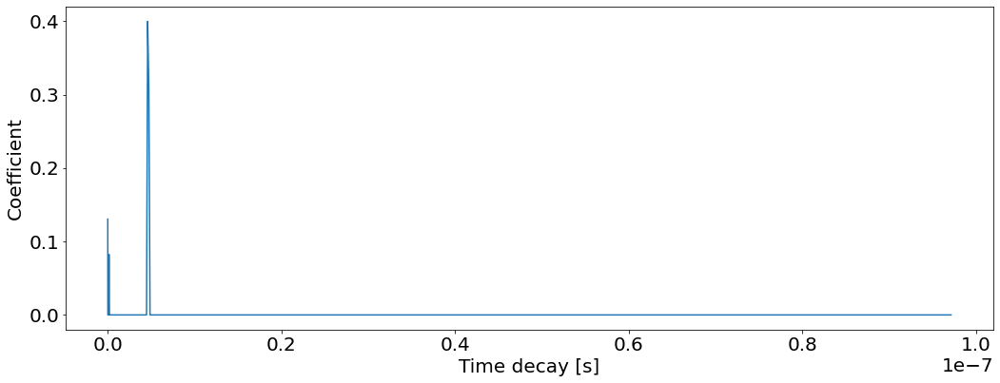

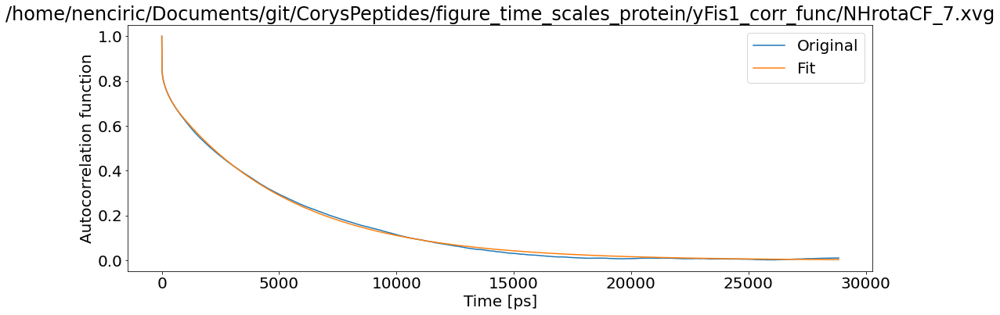

T1: 0.001106210399683058 T2: 0.0007684124885336108 NOE: 0


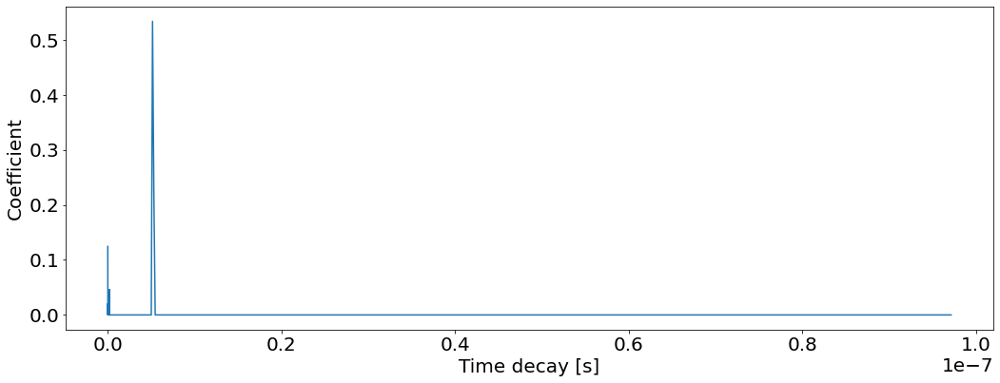

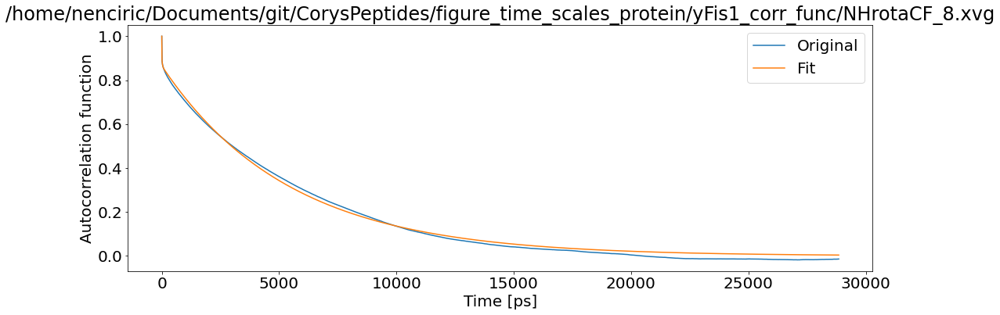

T1: 0.00097131757119126 T2: 0.0006599579532427067 NOE: 0


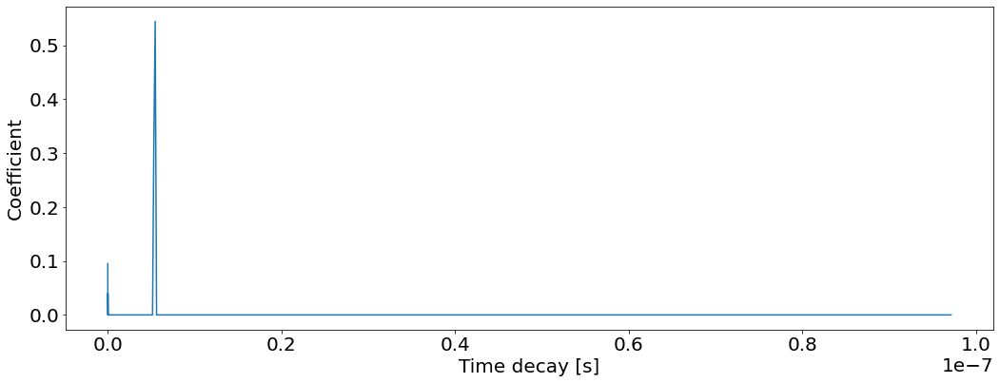

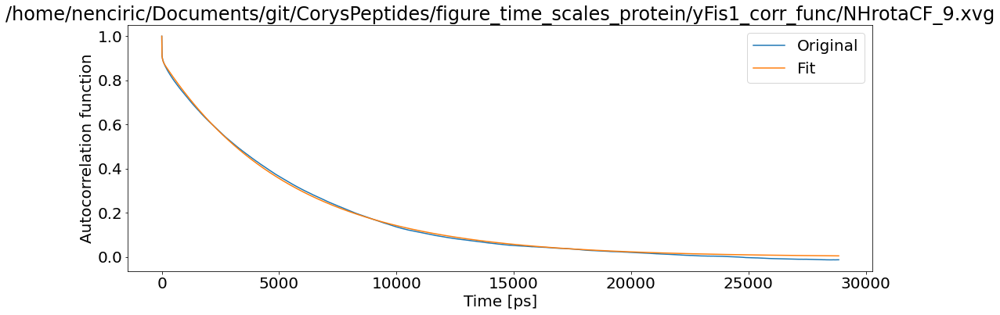

T1: 0.0009423247094205937 T2: 0.0006381252728061272 NOE: 0


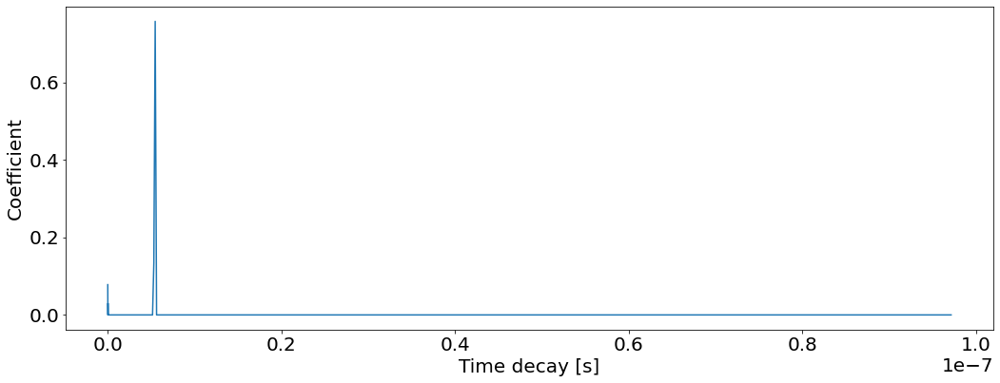

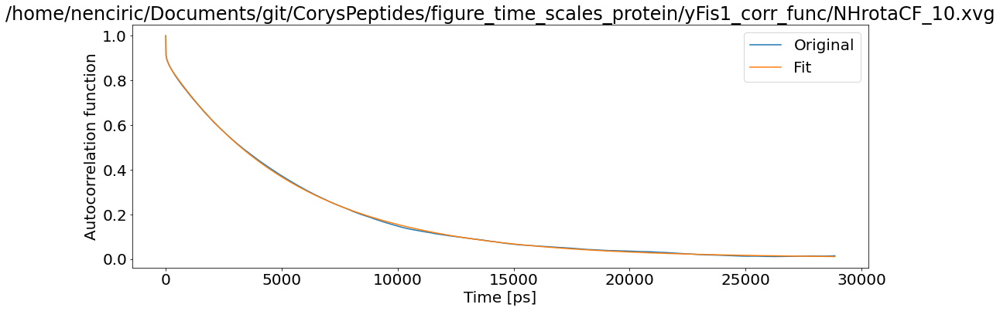

T1: 0.0009520889292149761 T2: 0.0005959868516447102 NOE: 0


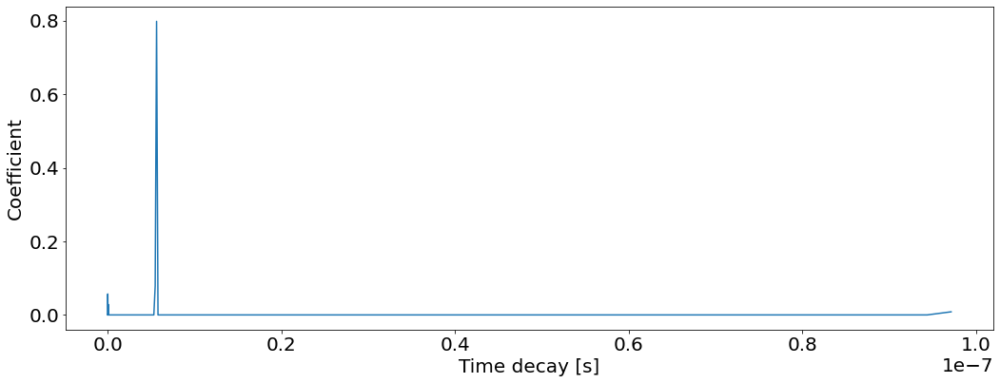

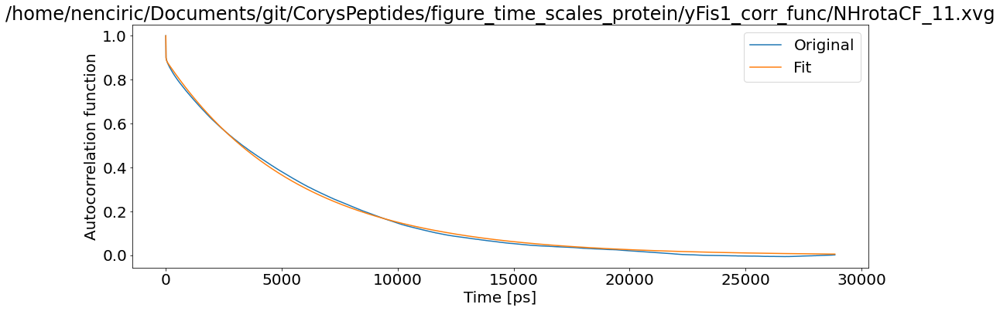

T1: 0.0009405452982430838 T2: 0.0006255818479426755 NOE: 0


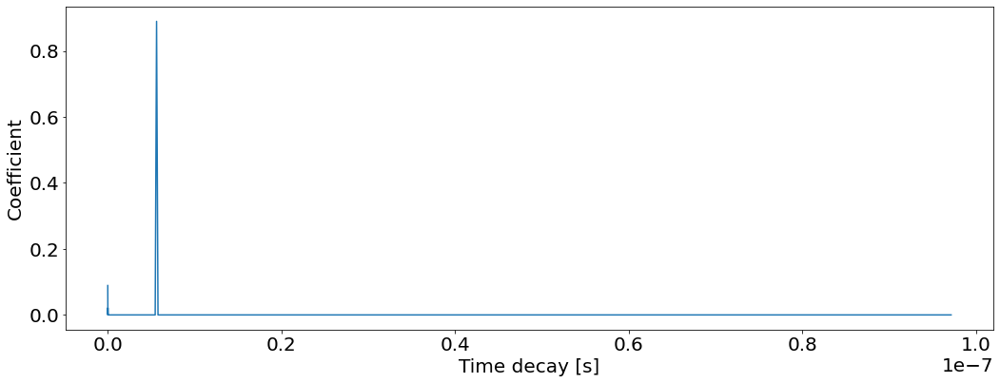

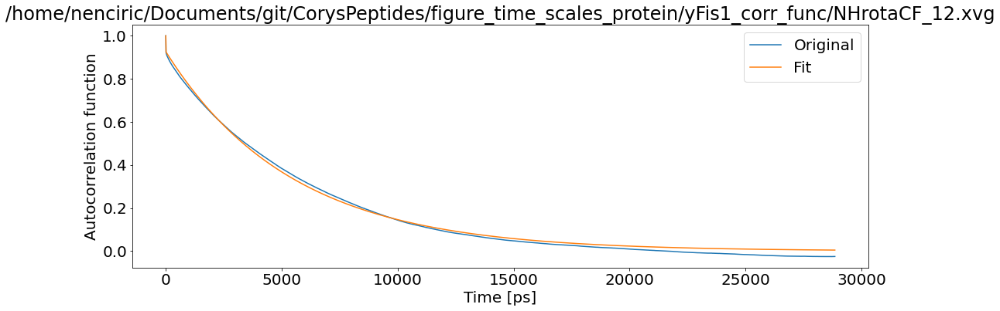

T1: 0.0009075012900675968 T2: 0.0006164197741291798 NOE: 0


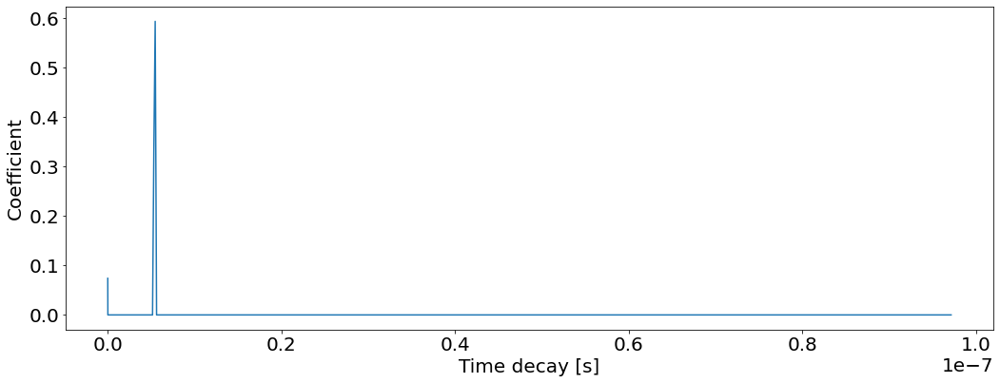

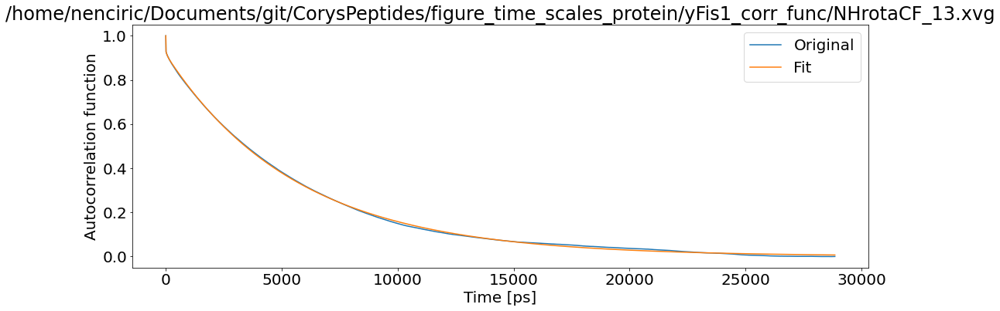

T1: 0.0009178438689228189 T2: 0.0006045015112881521 NOE: 0


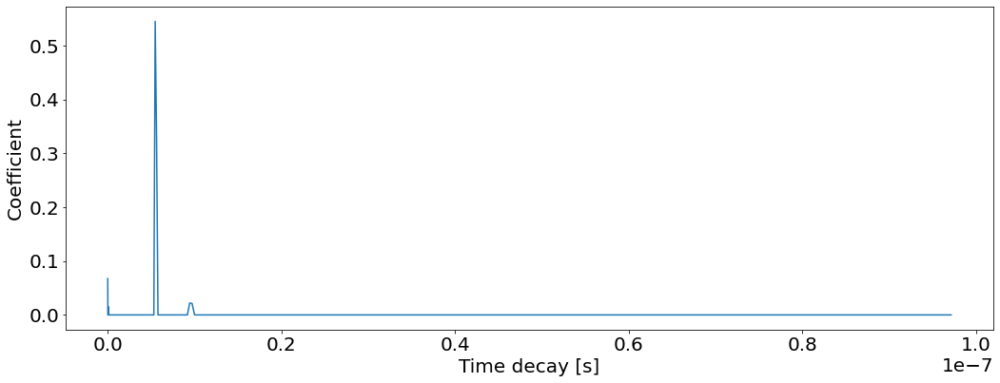

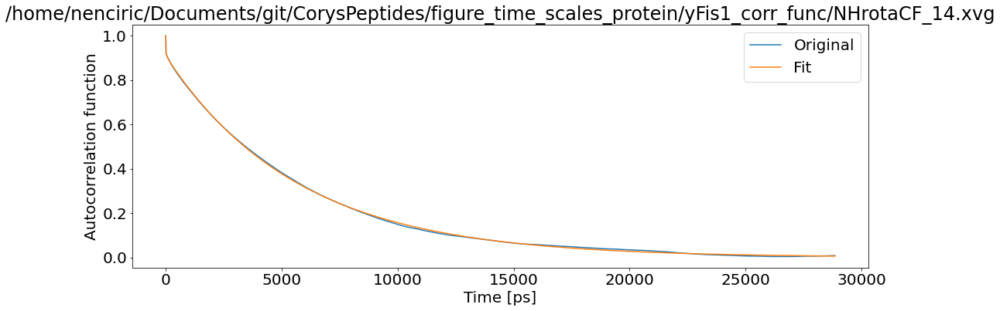

T1: 0.0009206006958665281 T2: 0.0006077944226175388 NOE: 0


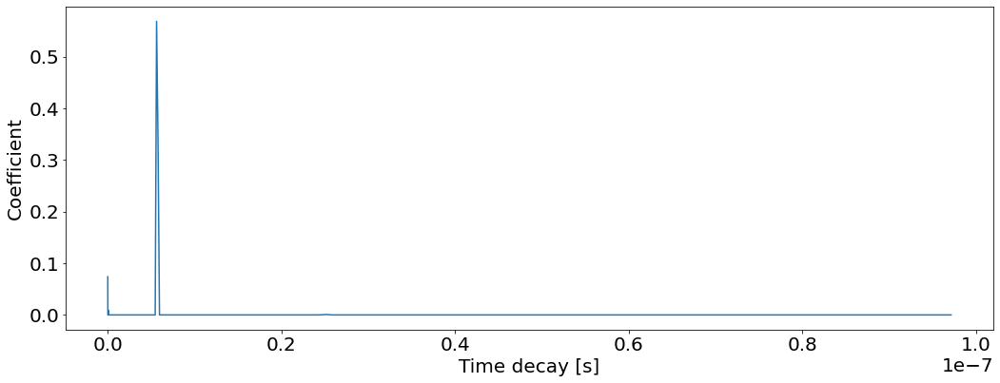

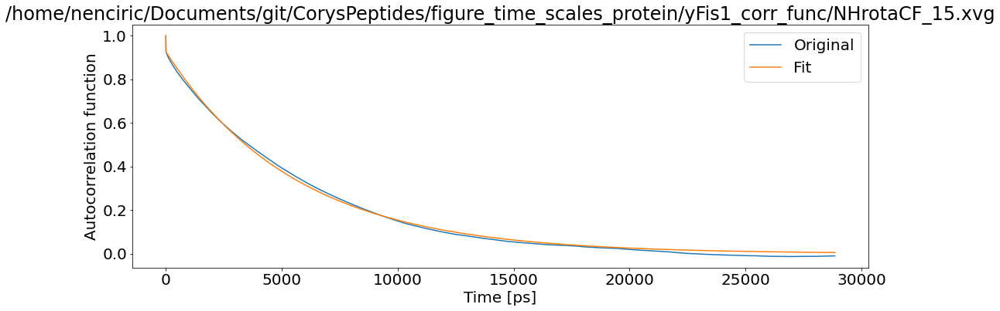

T1: 0.0009029389018134545 T2: 0.0006036869768709562 NOE: 0


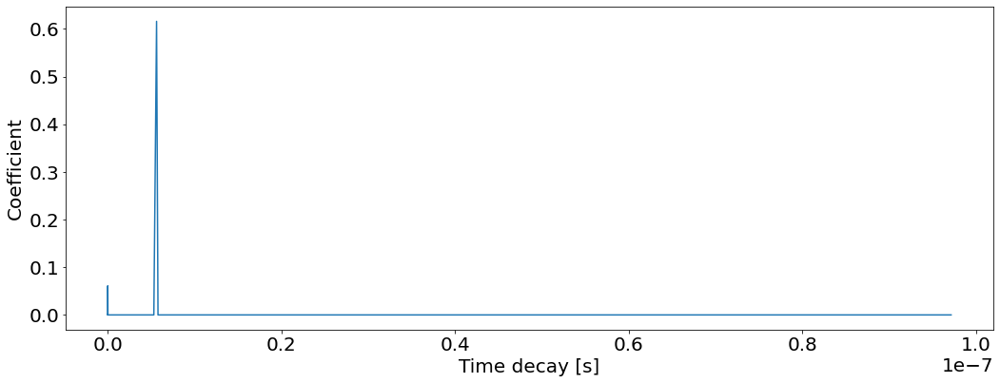

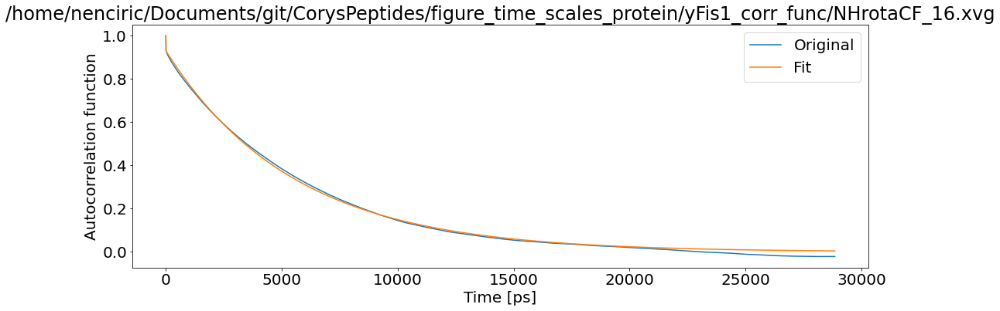

T1: 0.0009012348353091745 T2: 0.0006085789351165121 NOE: 0


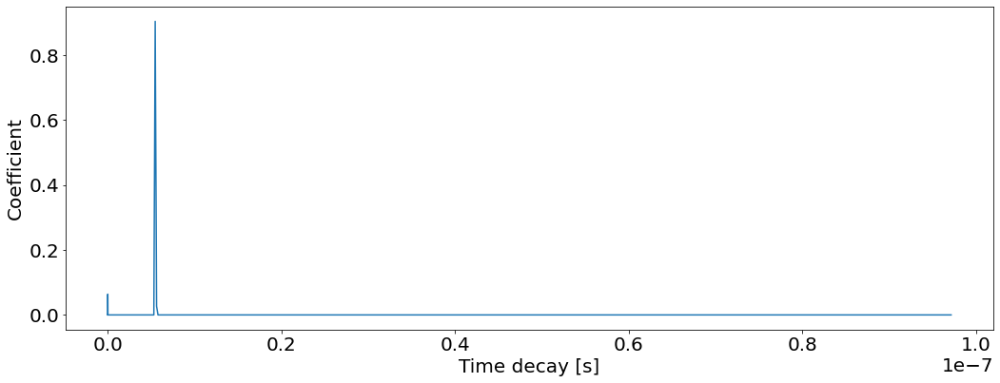

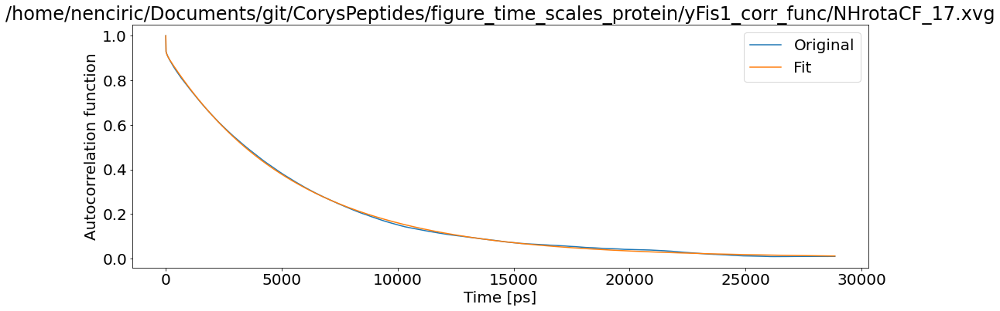

T1: 0.0009271505375116694 T2: 0.0005994595157759876 NOE: 0


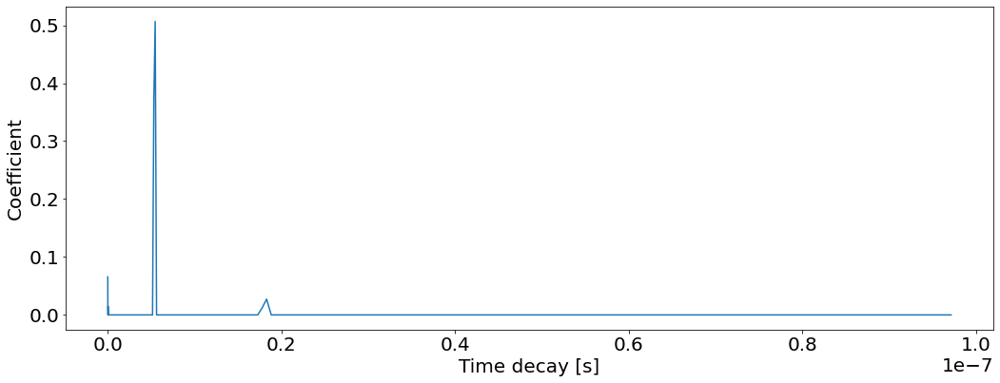

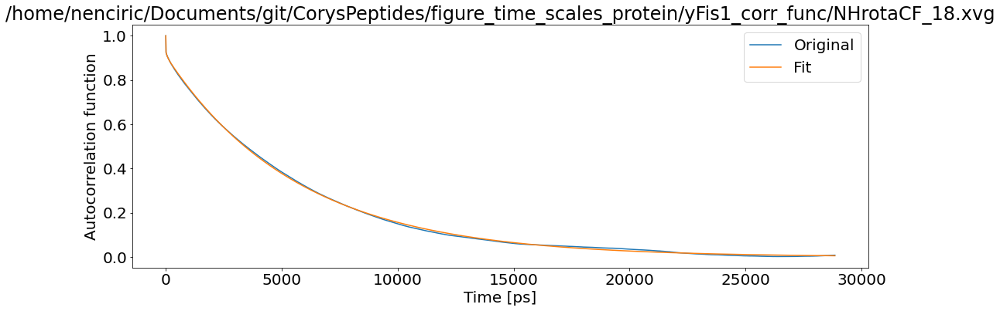

T1: 0.0009187349553656626 T2: 0.0006074125206186564 NOE: 0


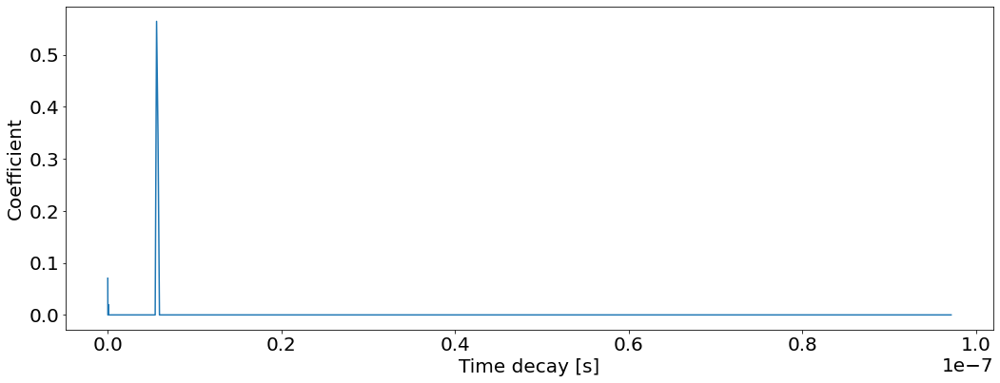

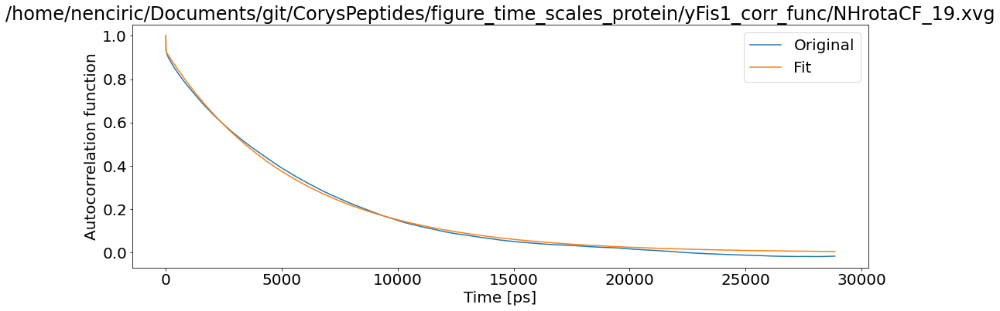

T1: 0.000903630663643811 T2: 0.0006075836100982729 NOE: 0


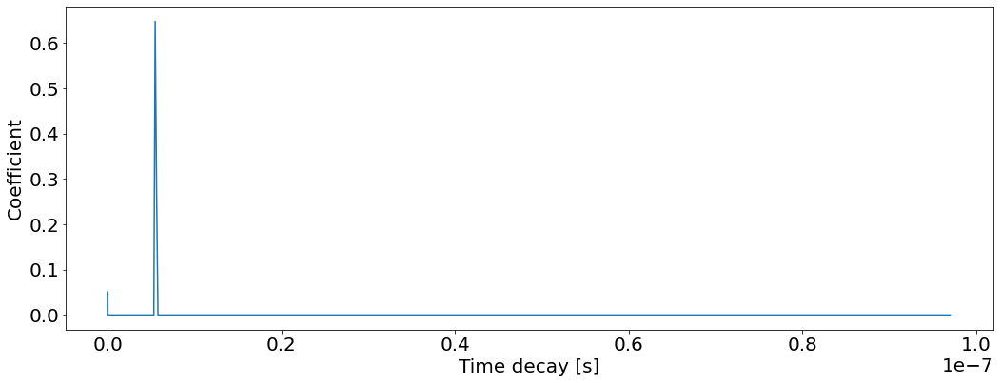

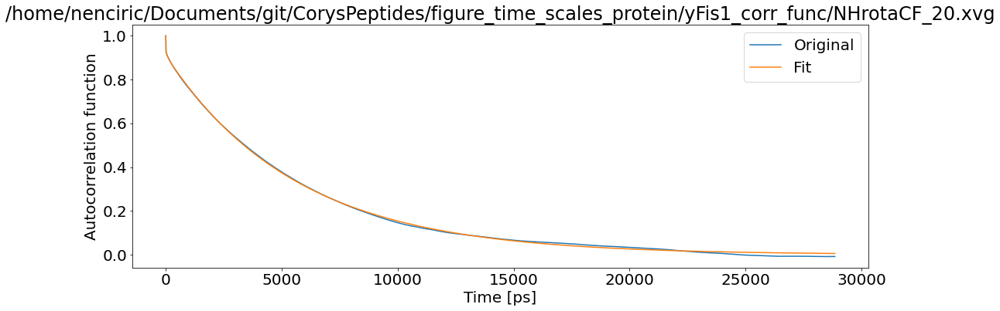

T1: 0.0009190606472259412 T2: 0.0006115958504145278 NOE: 0


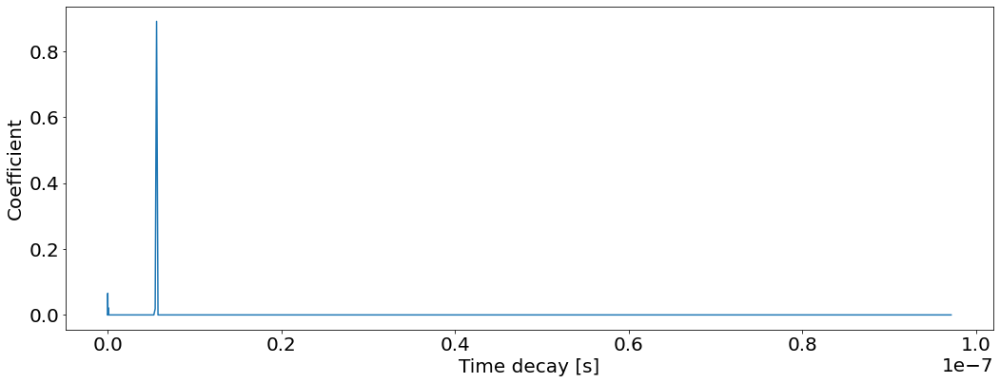

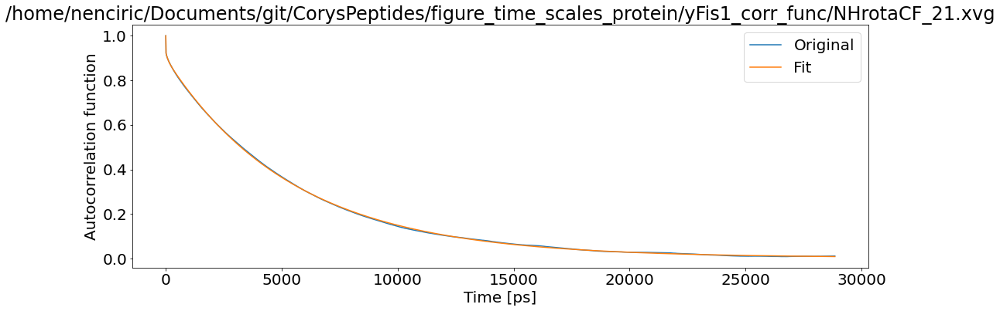

T1: 0.0009390367433018136 T2: 0.0006163045669285484 NOE: 0


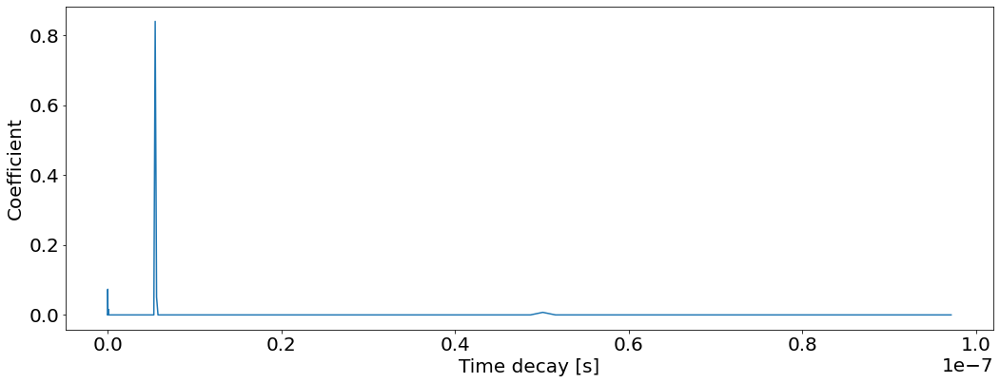

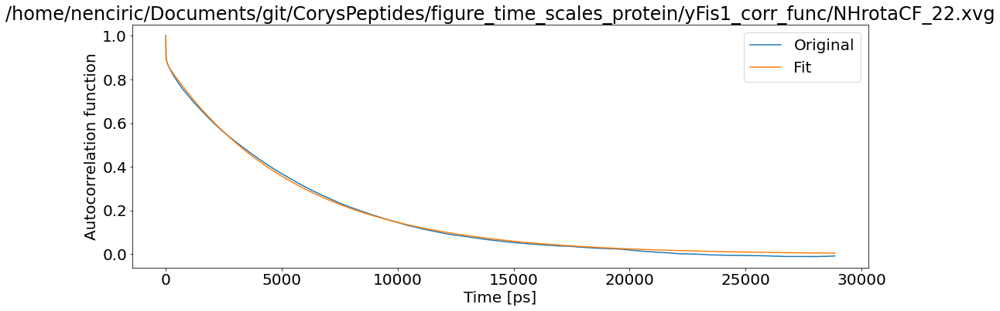

T1: 0.0009557661976776302 T2: 0.0006387347514594375 NOE: 0


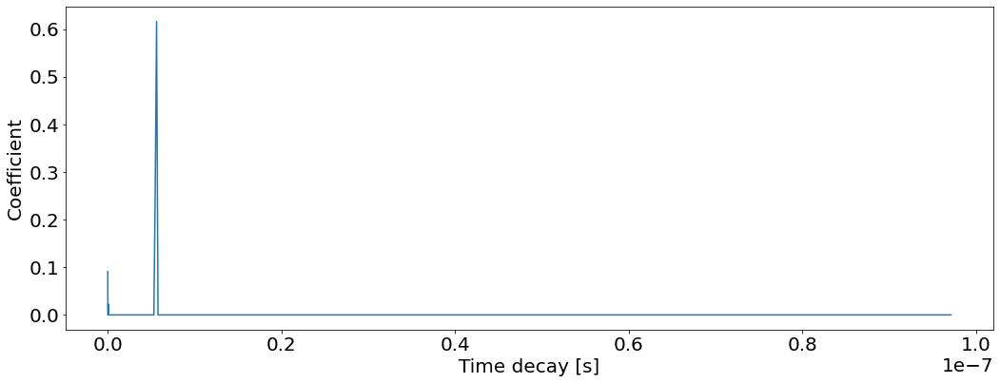

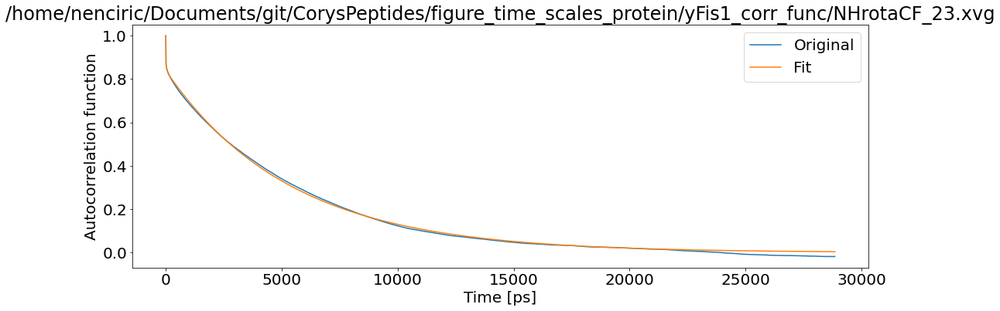

T1: 0.001001895943916326 T2: 0.0006836694041899934 NOE: 0


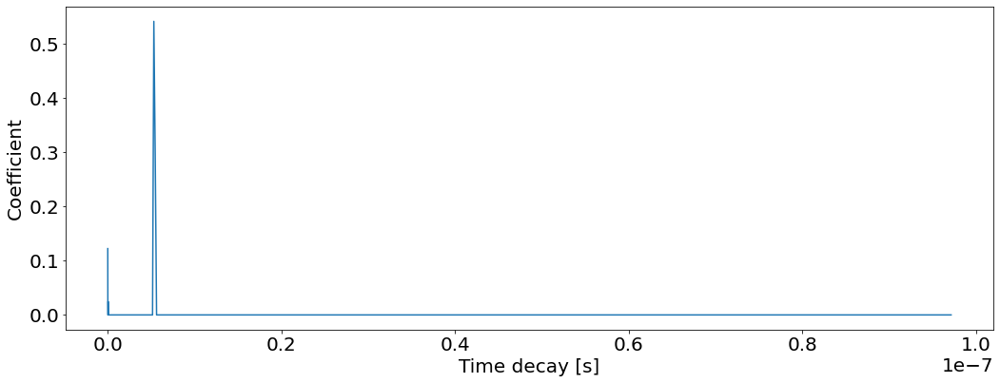

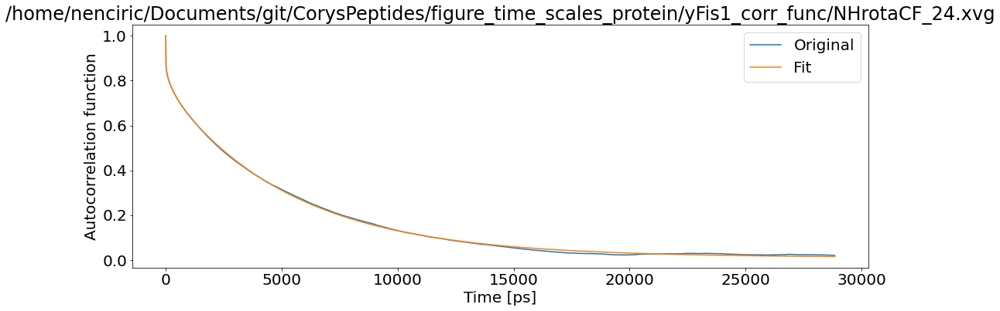

T1: 0.0011018152508775754 T2: 0.0006606623313425563 NOE: 0


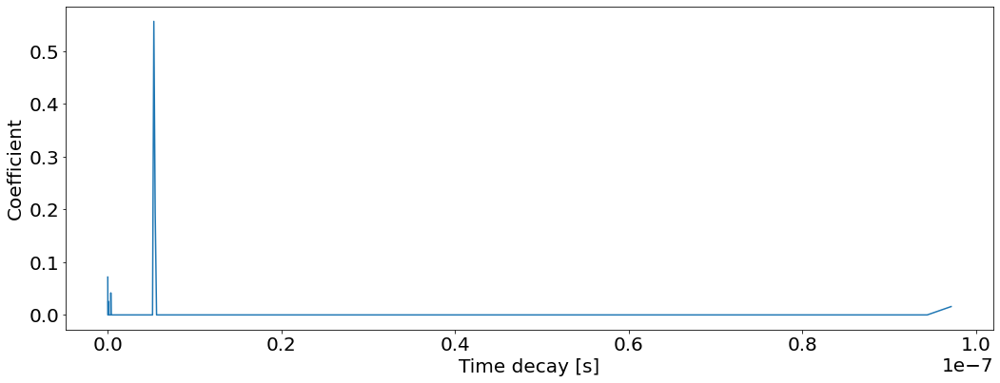

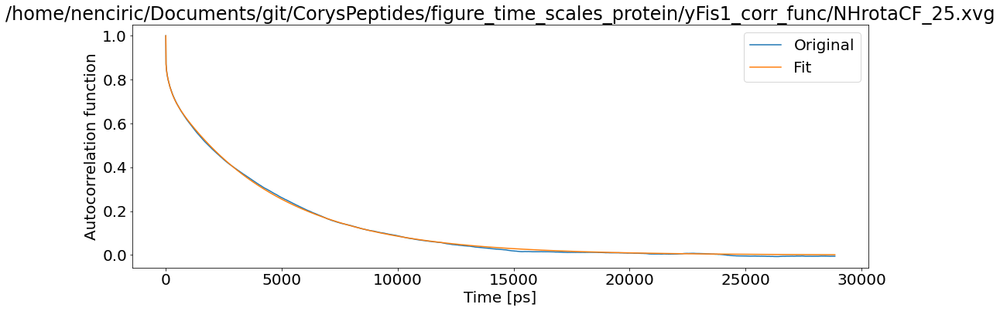

T1: 0.0011371766581729907 T2: 0.0008389296793220582 NOE: 0


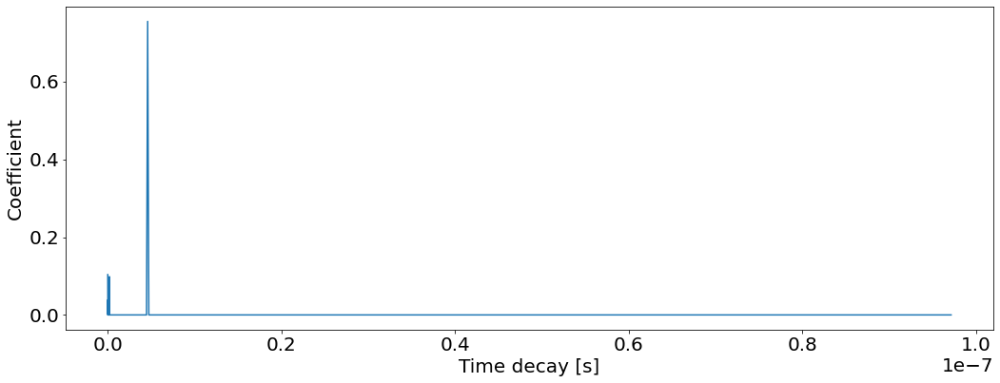

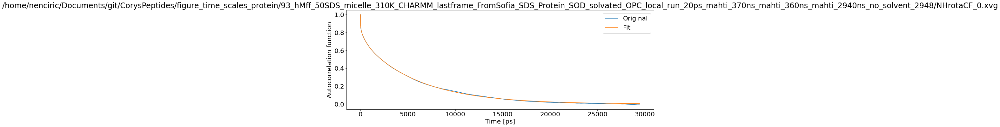

T1: 0.0011223687615323952 T2: 0.0007321613938620472 NOE: 0


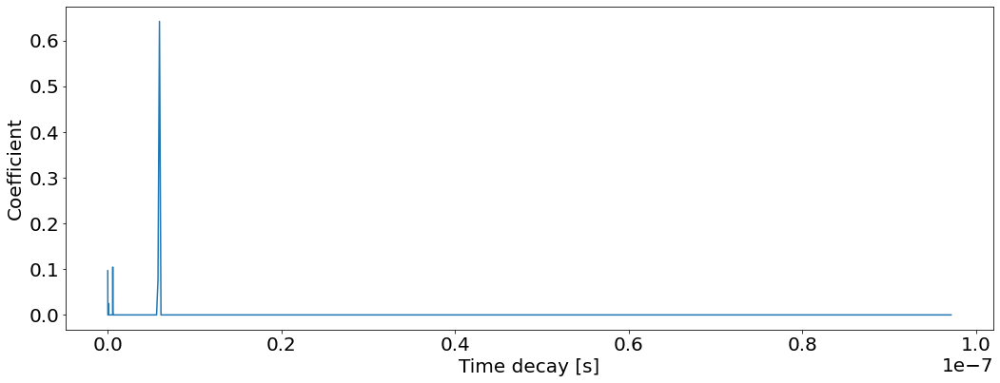

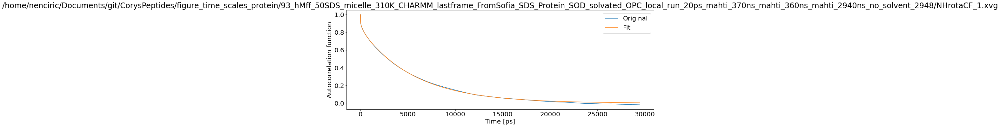

T1: 0.0009884303763212836 T2: 0.0006601129491532994 NOE: 0


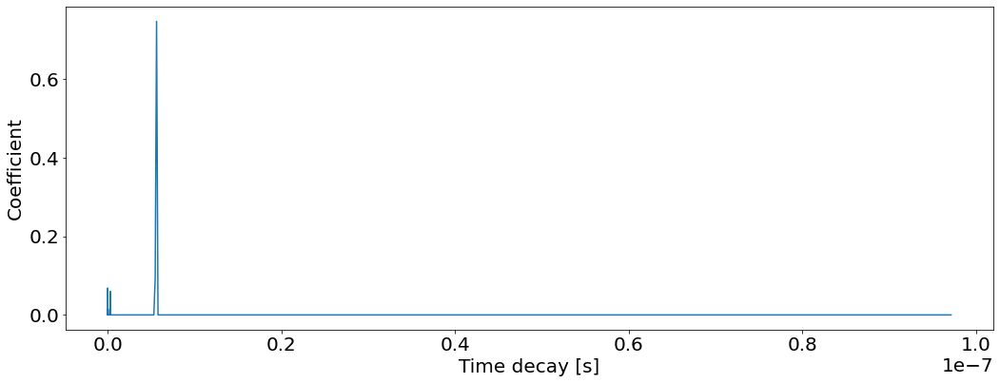

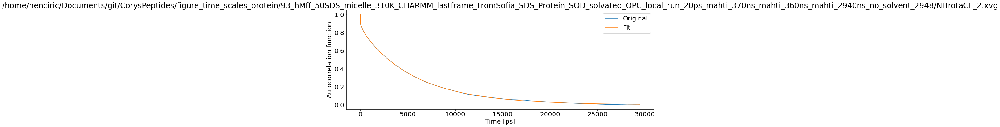

T1: 0.000994605761473702 T2: 0.0006480213462437505 NOE: 0


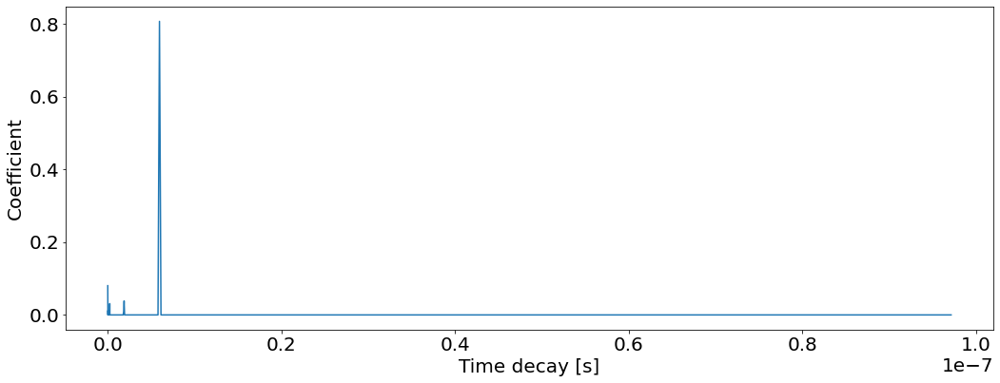

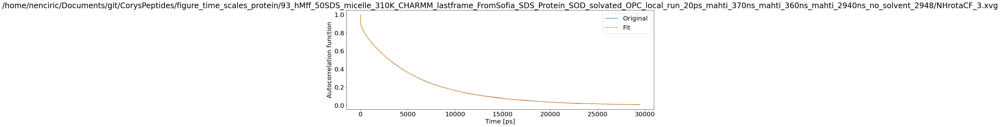

T1: 0.0010061740724464213 T2: 0.0006323152837863165 NOE: 0


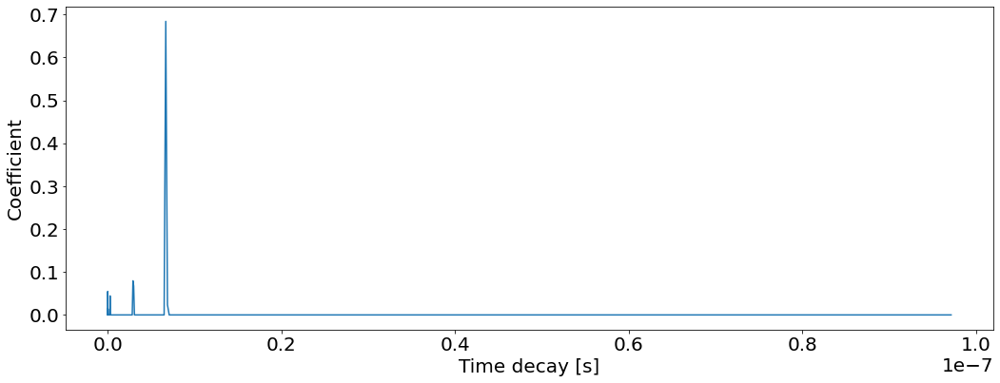

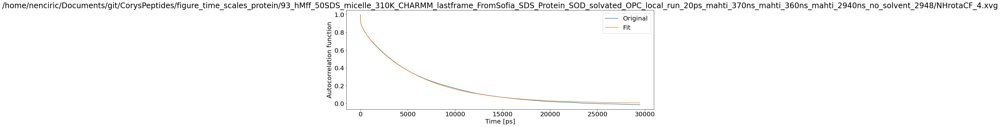

T1: 0.0009673116634744321 T2: 0.0006234051879282578 NOE: 0


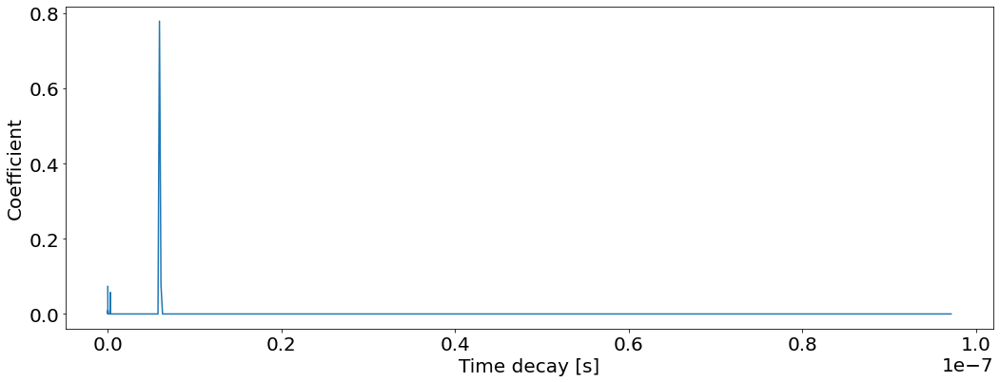

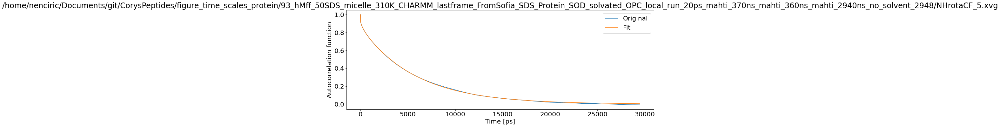

T1: 0.0009603771935751864 T2: 0.0006308174860181512 NOE: 0


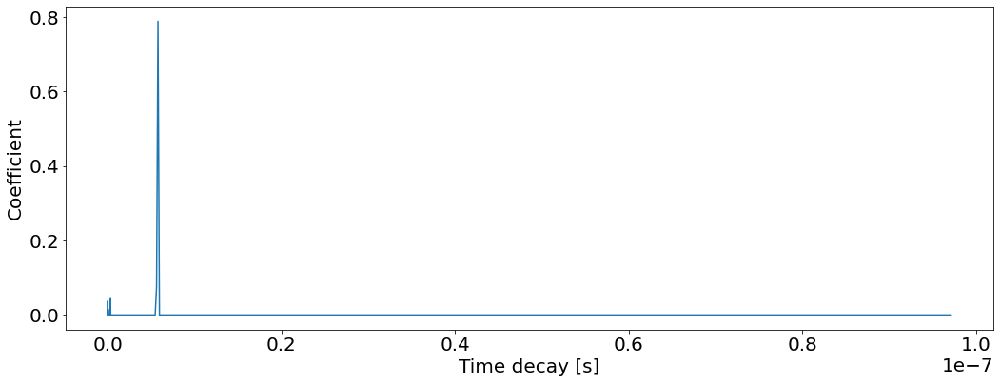

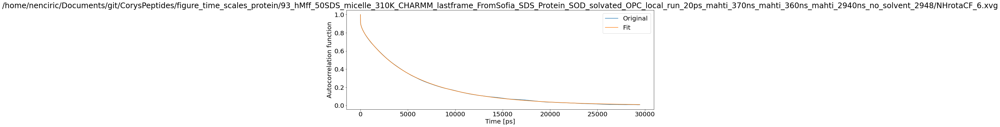

T1: 0.0010248634545812758 T2: 0.0006421807923043378 NOE: 0


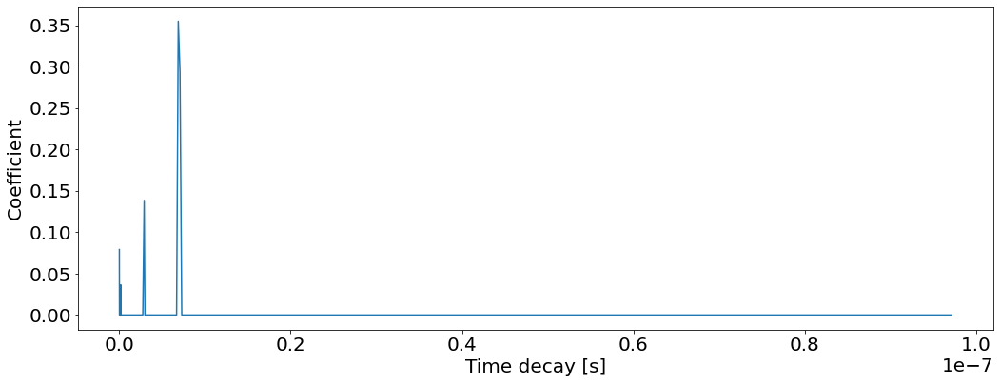

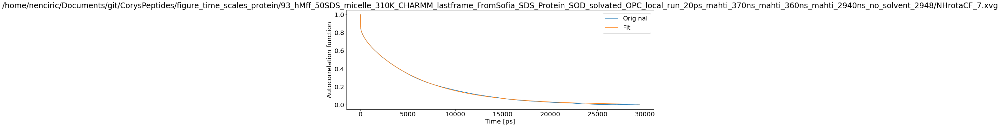

T1: 0.0010737634649331735 T2: 0.0006738103008662354 NOE: 0


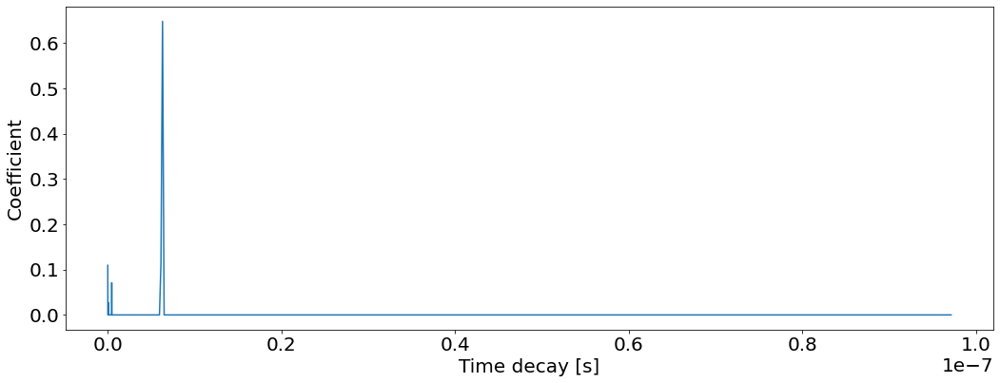

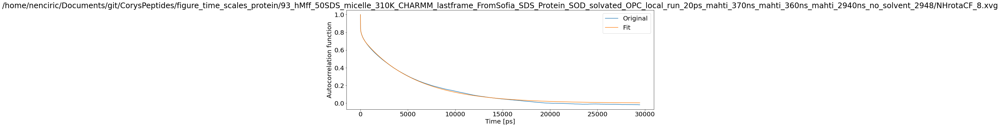

T1: 0.001101556806231738 T2: 0.0007441315140060576 NOE: 0


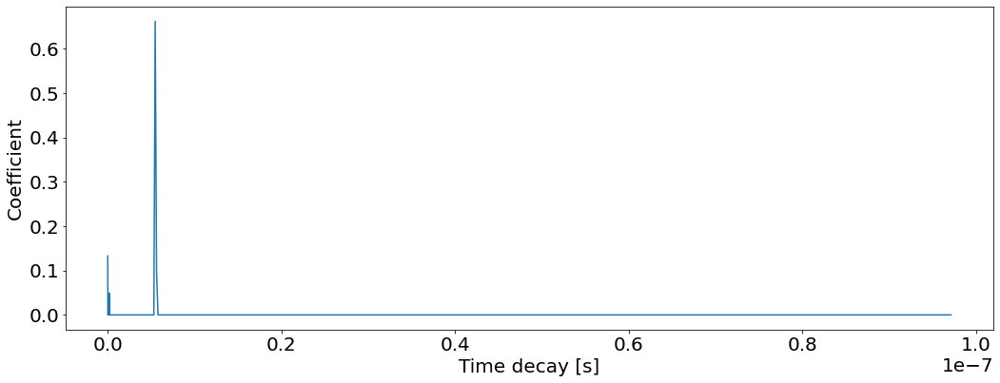

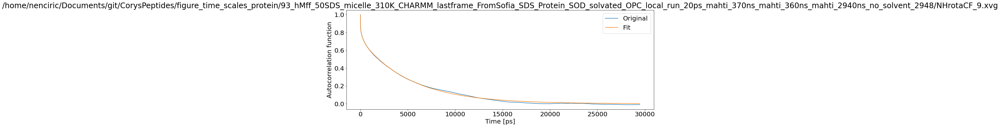

T1: 0.0011511943866808674 T2: 0.0008025617412512156 NOE: 0


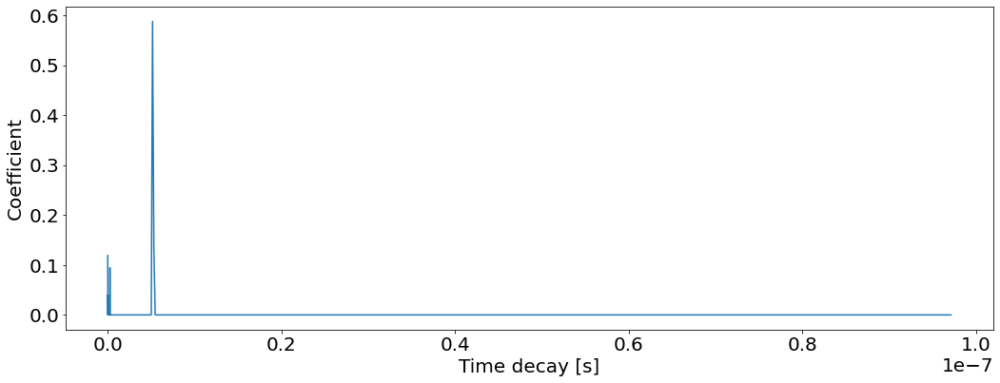

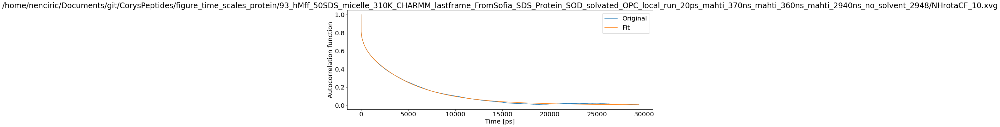

T1: 0.001262539658690363 T2: 0.0008288768861177895 NOE: 0


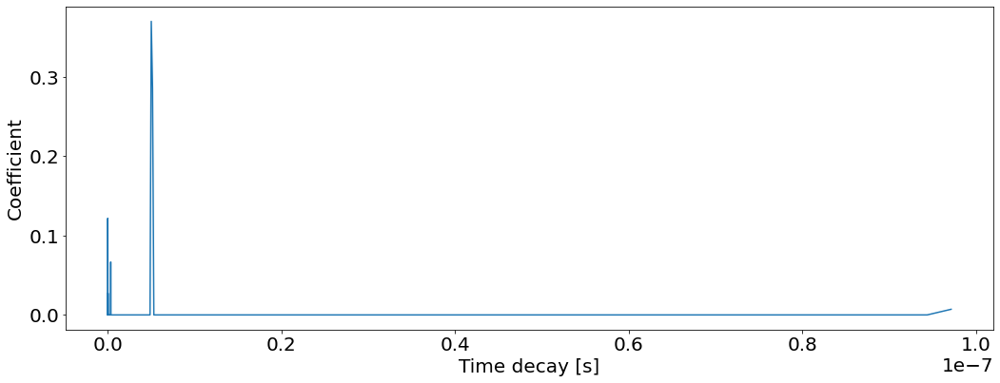

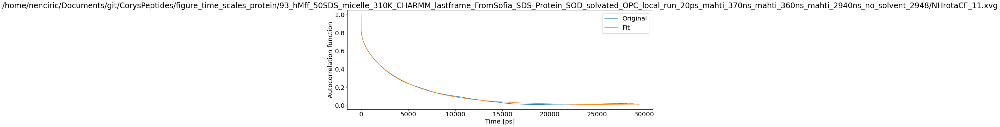

T1: 0.0012678826664202676 T2: 0.0008320922500643129 NOE: 0


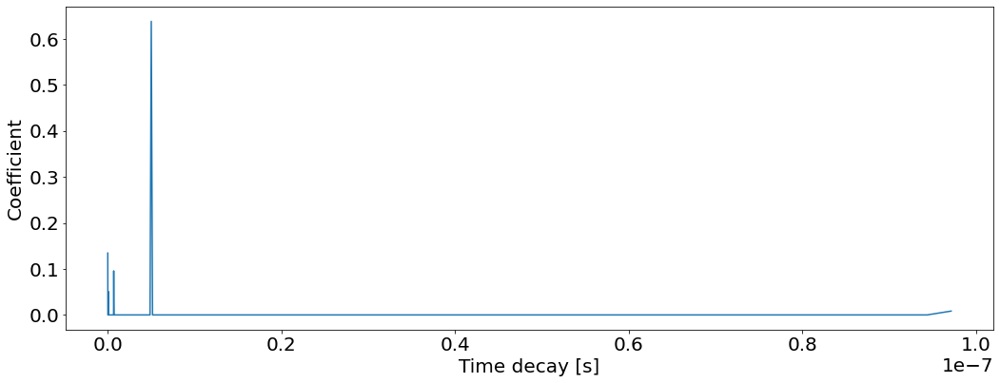

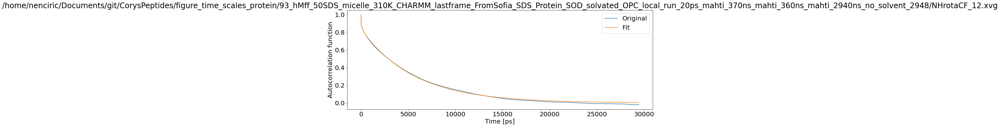

T1: 0.0009972587092602636 T2: 0.0006652250458310121 NOE: 0


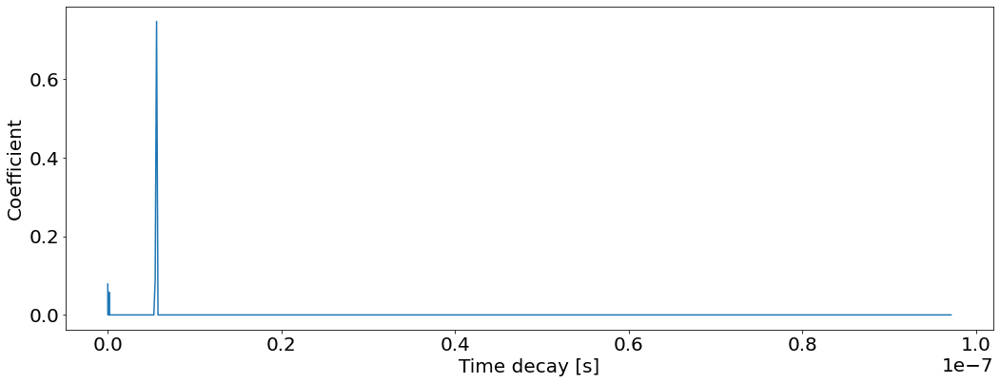

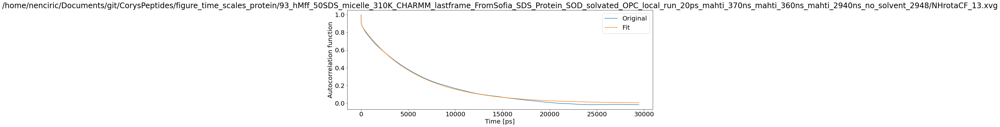

T1: 0.0009452104173146484 T2: 0.0006181804034602699 NOE: 0


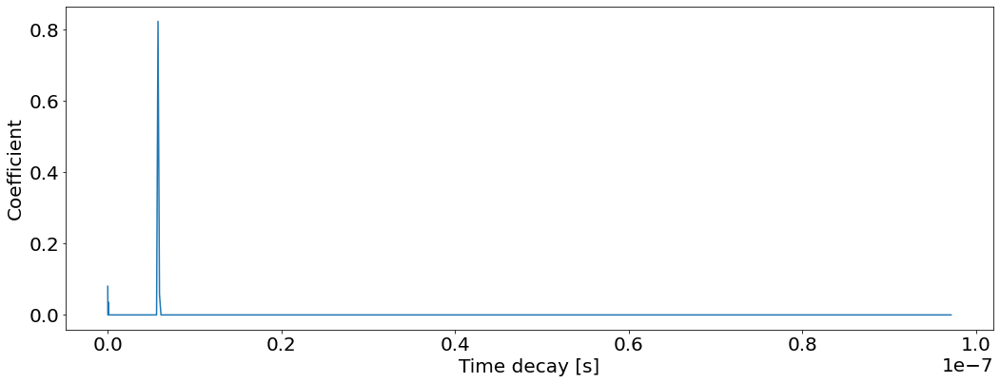

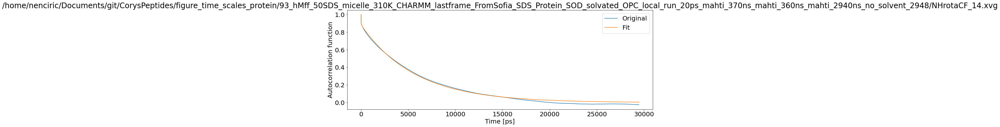

T1: 0.0009457450363845703 T2: 0.0006257959966396075 NOE: 0


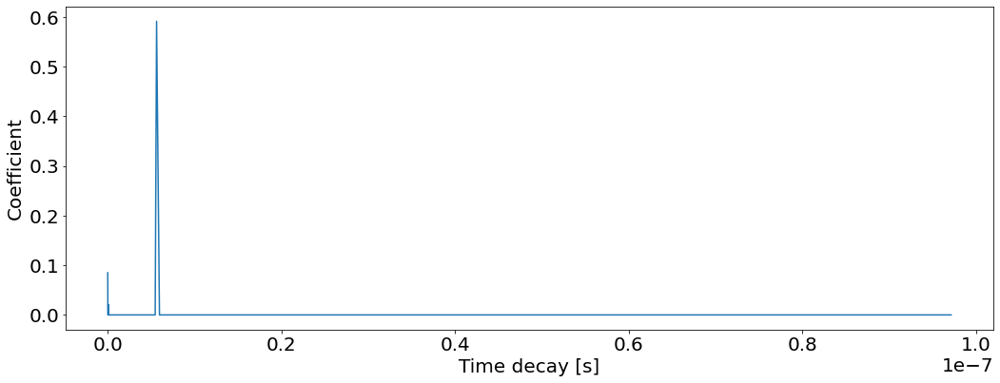

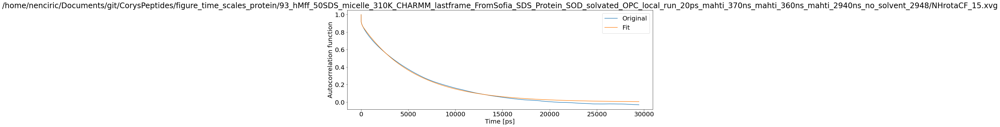

T1: 0.0009377032980547931 T2: 0.0006257406324192442 NOE: 0


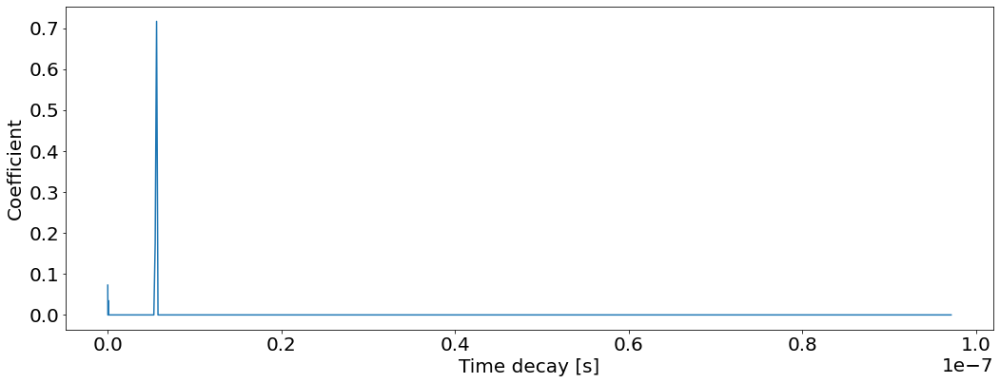

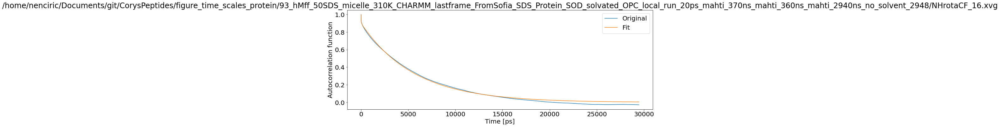

T1: 0.0009275712748215501 T2: 0.0006170514170542737 NOE: 0


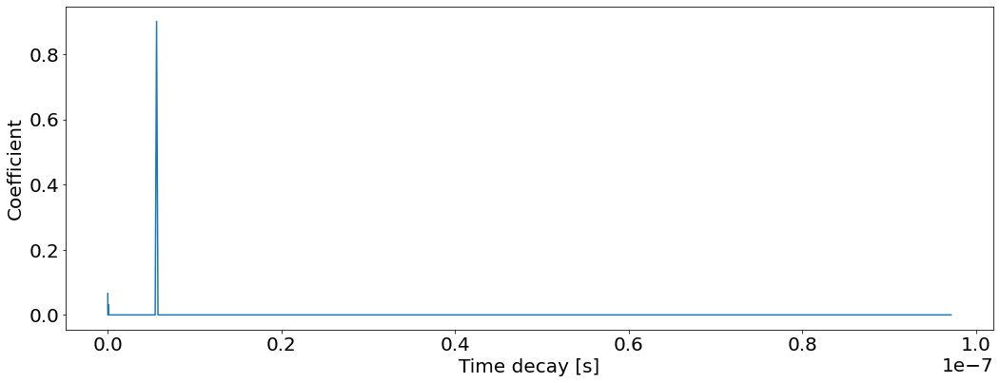

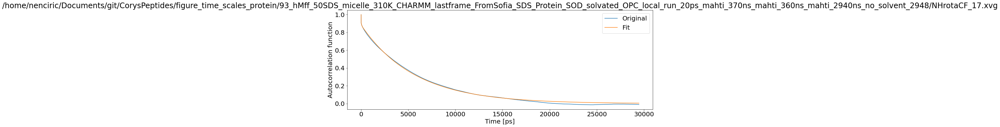

T1: 0.0009459654147541657 T2: 0.0006267590577499441 NOE: 0


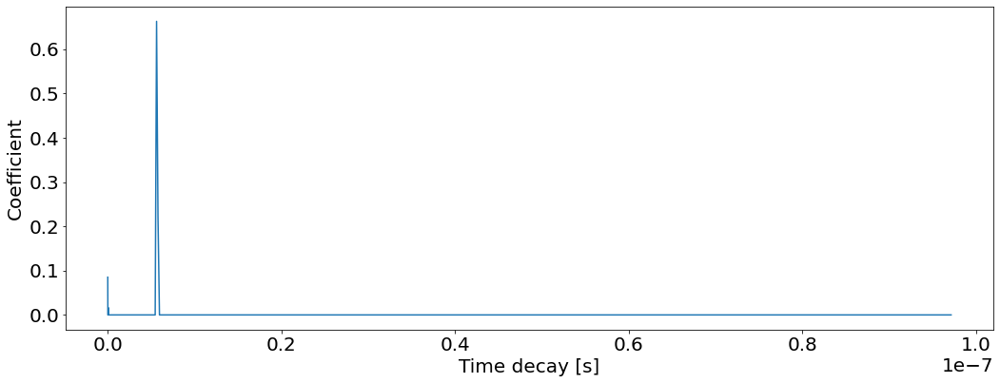

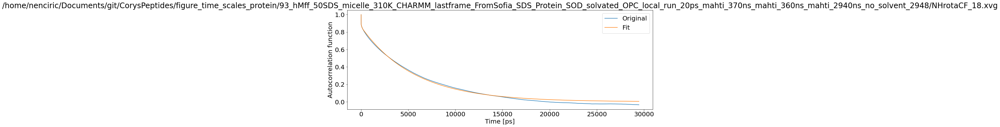

T1: 0.0009715807166335976 T2: 0.0006463870605171207 NOE: 0


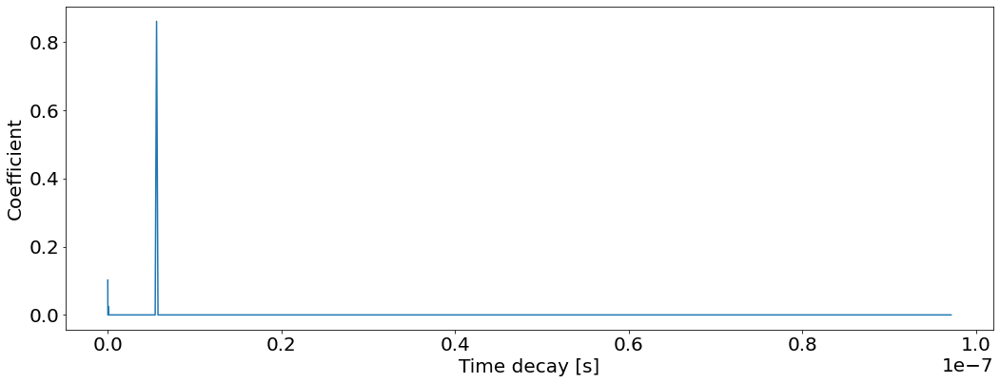

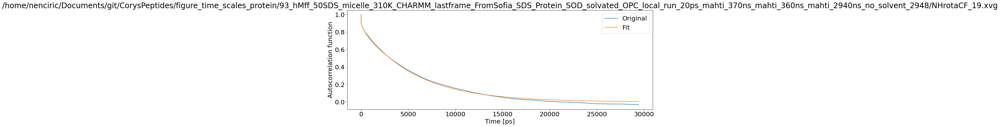

T1: 0.0009656895175460693 T2: 0.0006436180610654273 NOE: 0


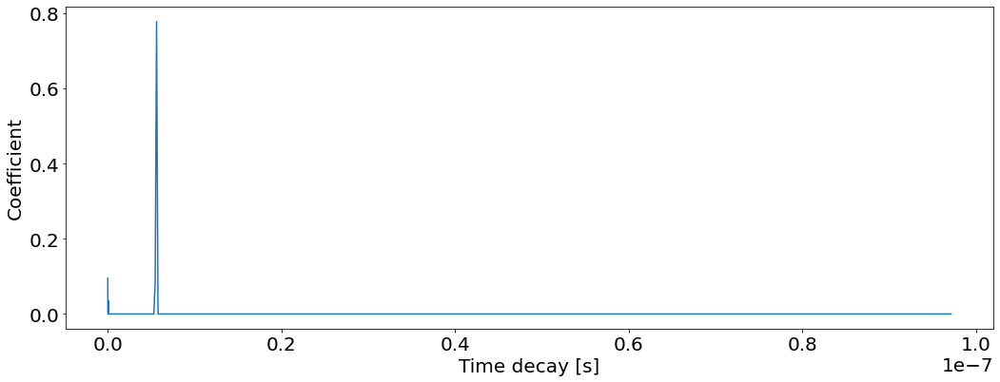

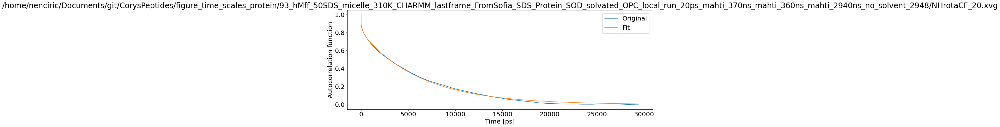

T1: 0.0010218710855943358 T2: 0.0006405047503112048 NOE: 0


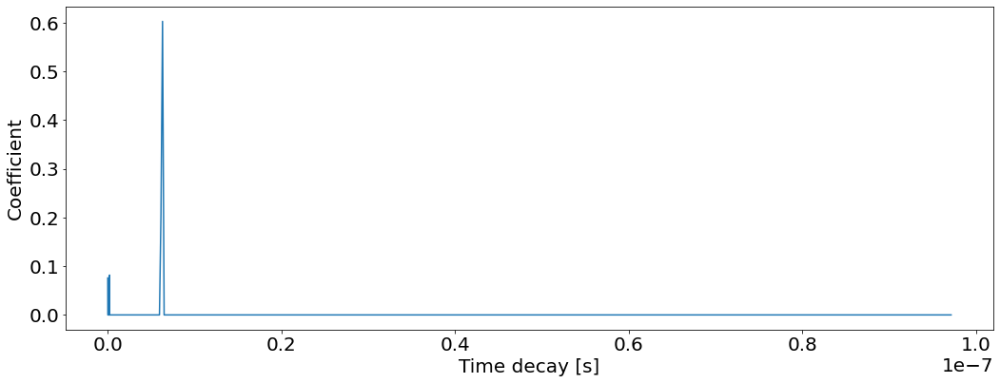

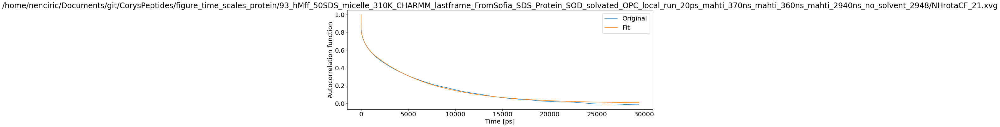

T1: 0.001204481832577027 T2: 0.0007467444906267571 NOE: 0


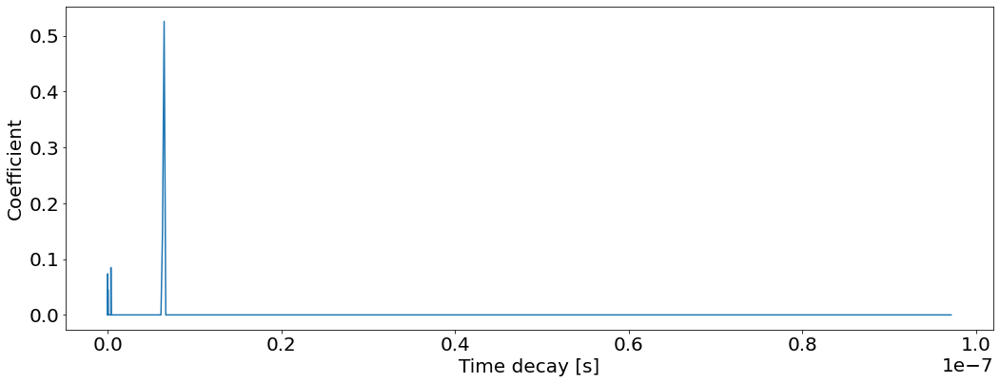

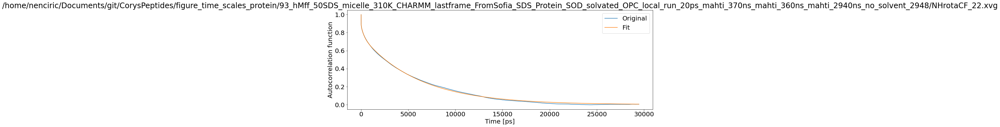

T1: 0.0010696937071242275 T2: 0.0006924148520289969 NOE: 0


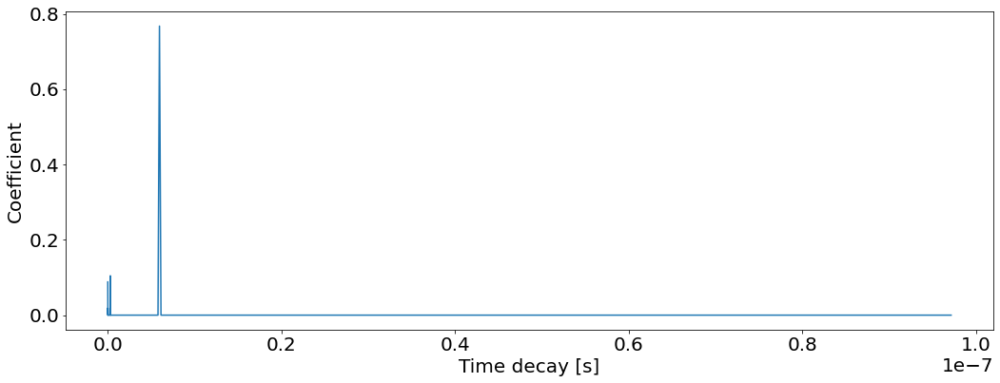

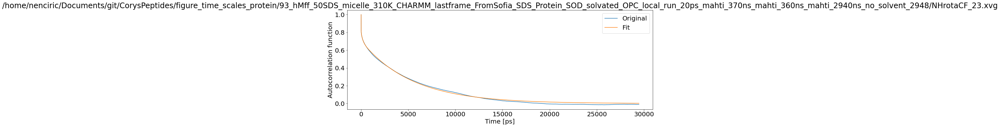

T1: 0.0011824922884927053 T2: 0.0008101312945854206 NOE: 0


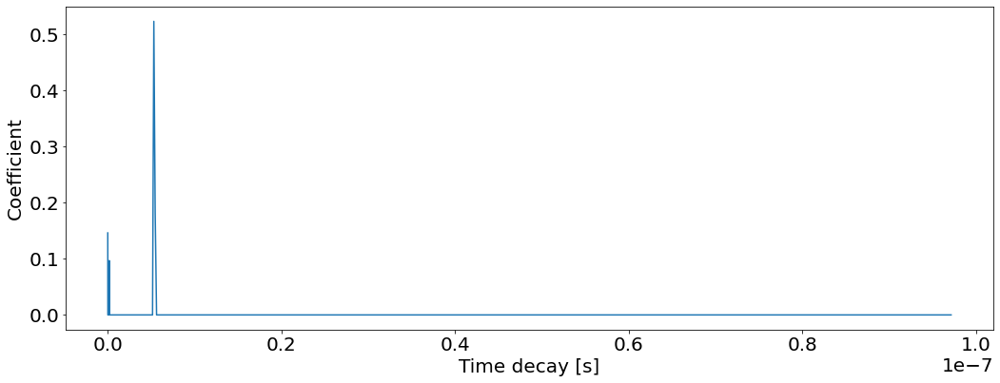

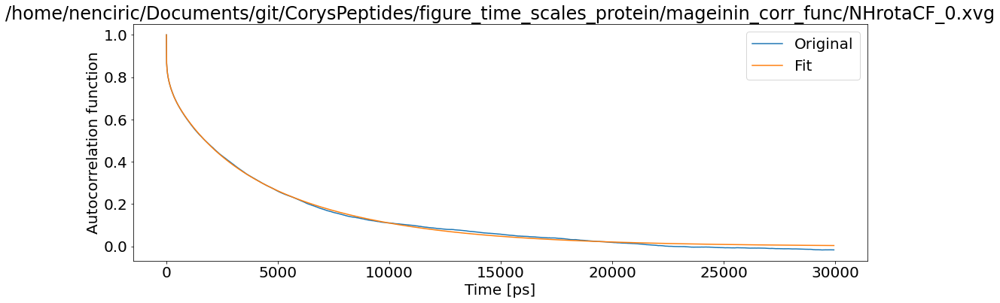

T1: 0.0012187994800129135 T2: 0.0008223223693916598 NOE: 0


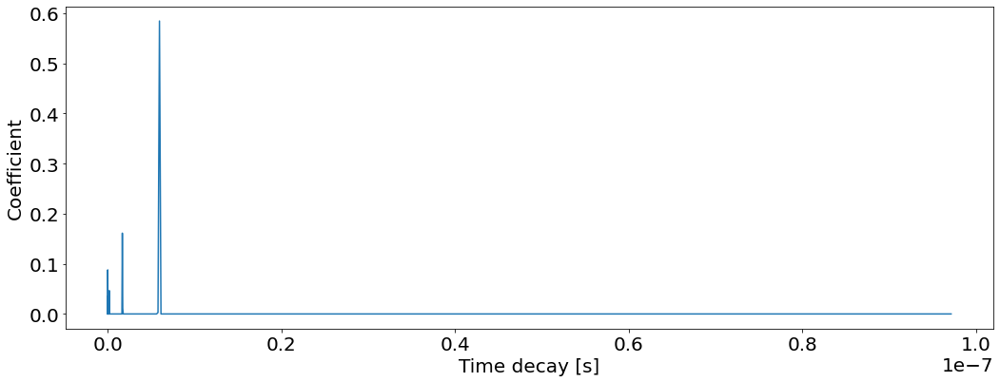

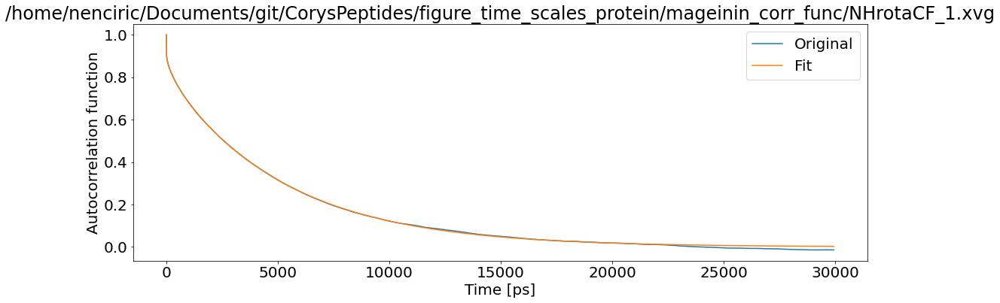

T1: 0.001021450024882166 T2: 0.0007060545093910828 NOE: 0


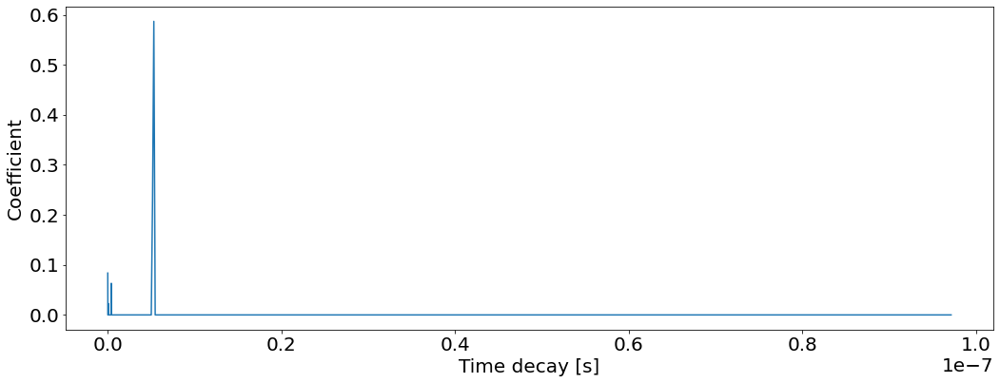

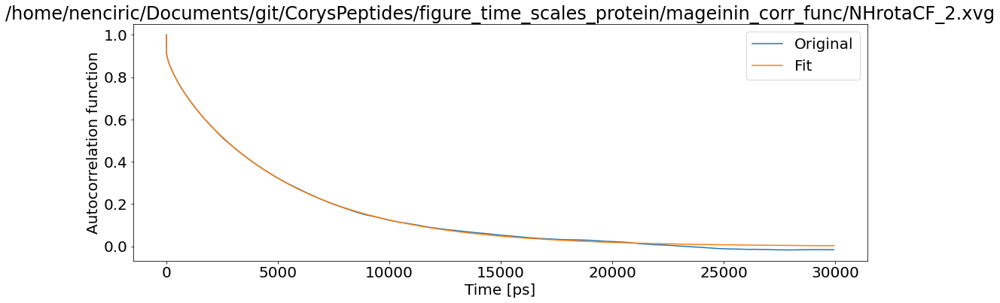

T1: 0.001000737490350806 T2: 0.0006920784818622289 NOE: 0


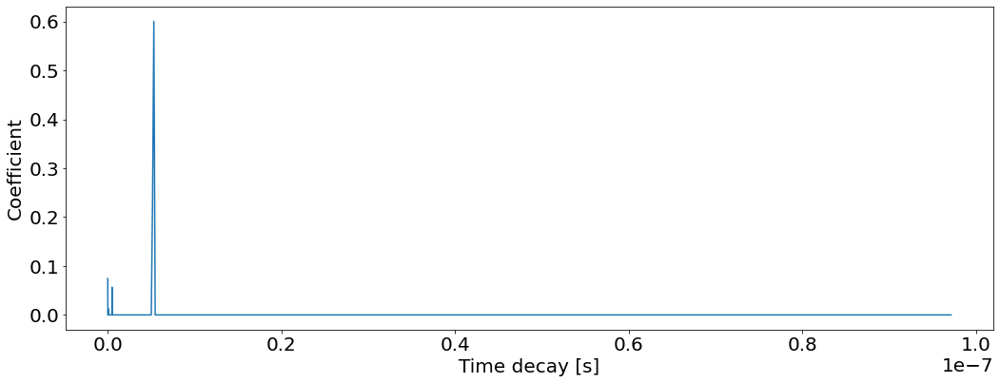

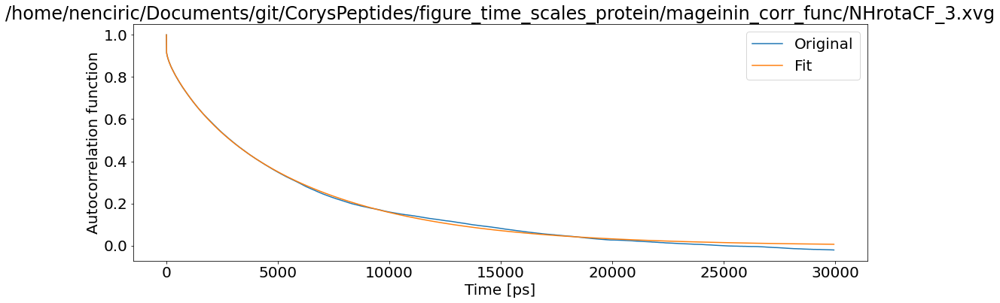

T1: 0.0010157771894520387 T2: 0.0006465970150687768 NOE: 0


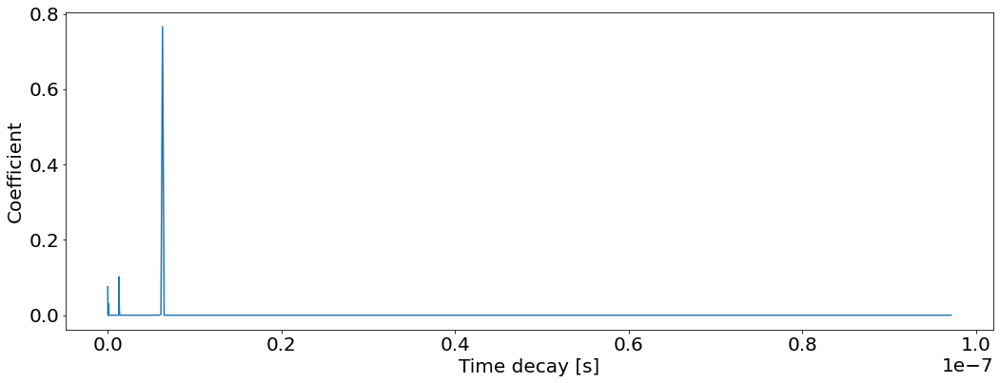

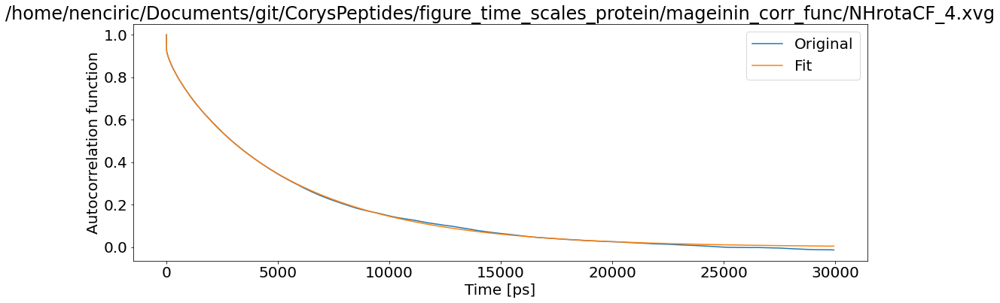

T1: 0.0009818045674851621 T2: 0.0006512230814483251 NOE: 0


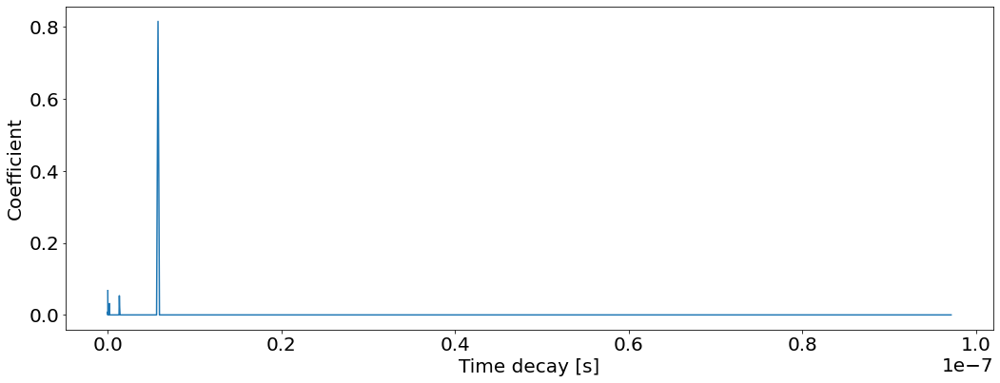

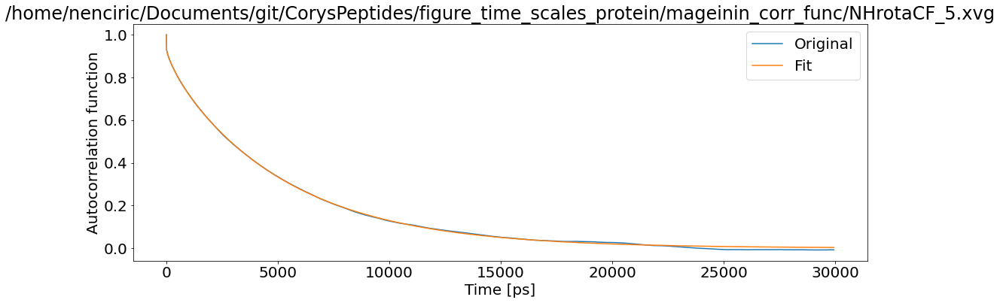

T1: 0.0009668115117611113 T2: 0.0006684497328845677 NOE: 0


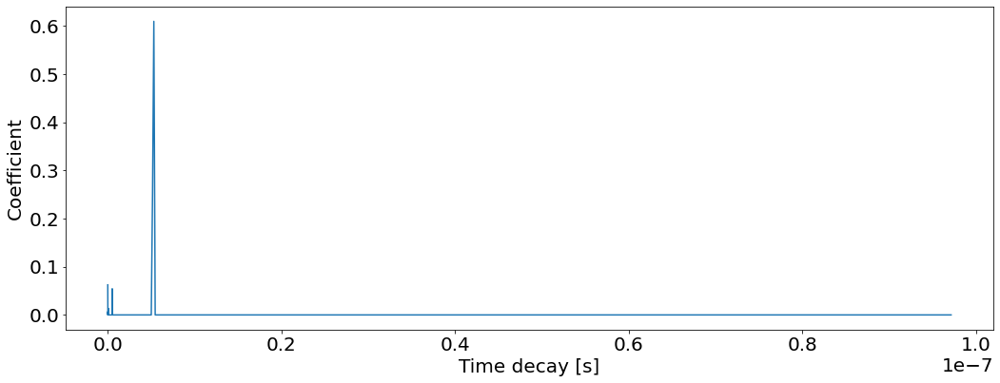

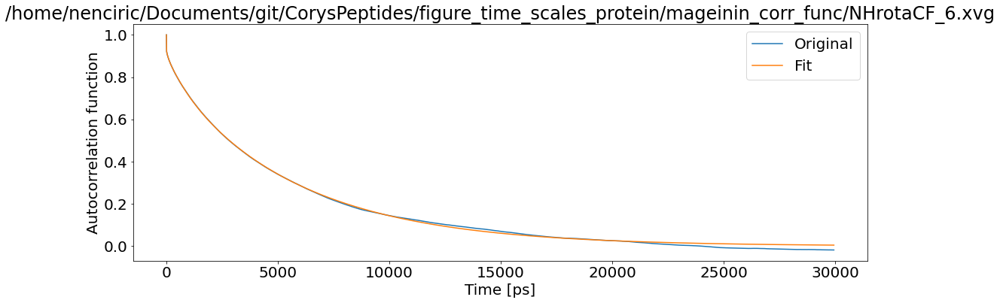

T1: 0.000997849309459453 T2: 0.0006602192255203464 NOE: 0


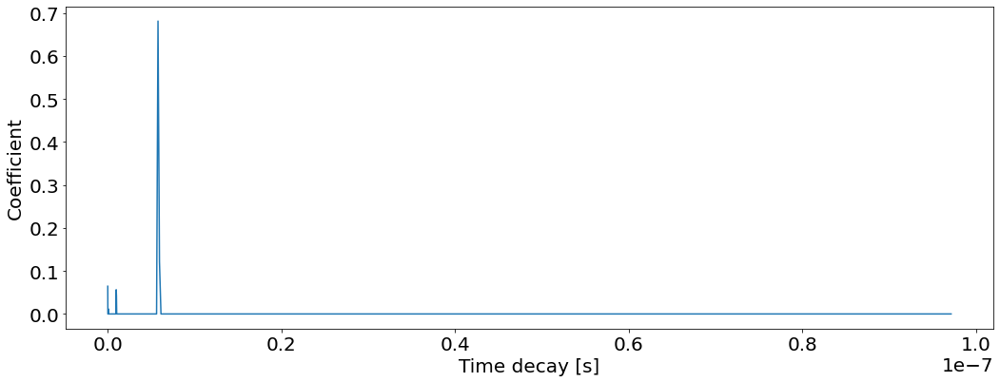

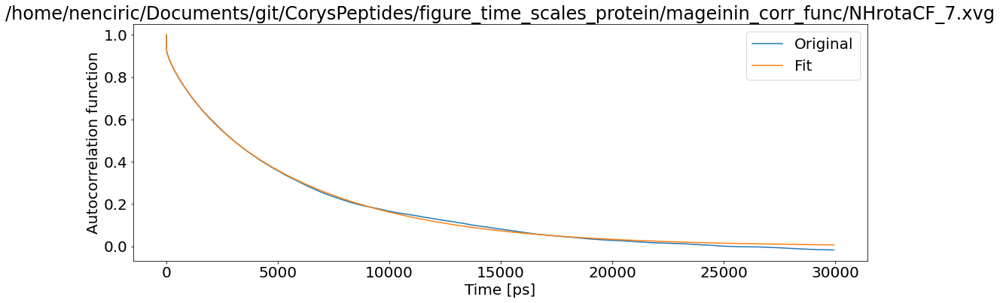

T1: 0.0009947918346293778 T2: 0.0006318795671363485 NOE: 0


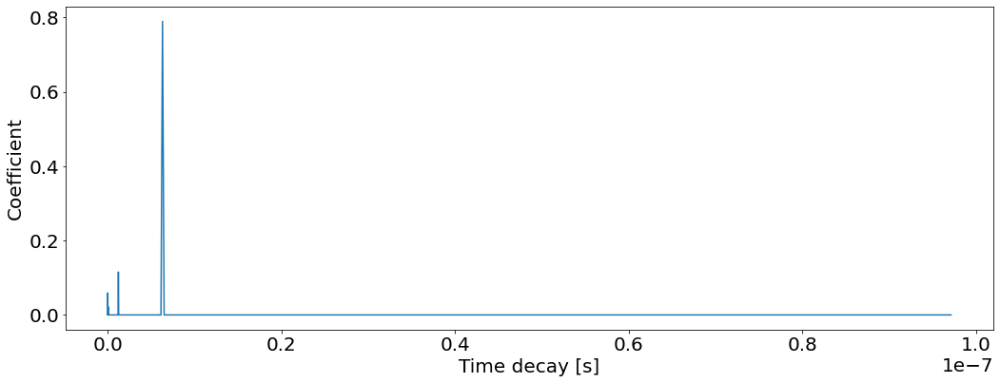

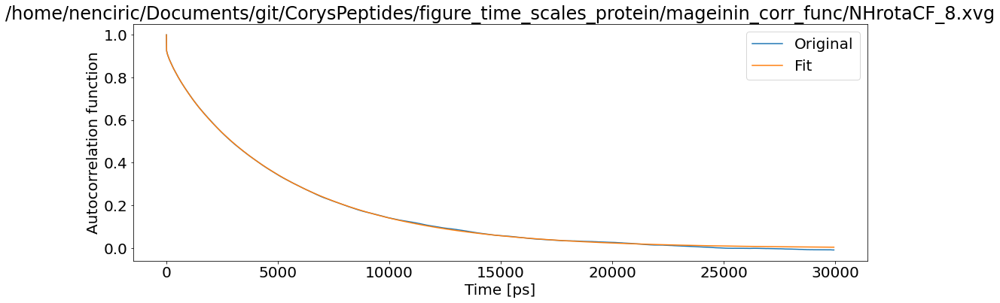

T1: 0.0009726800761539389 T2: 0.0006536102300884096 NOE: 0


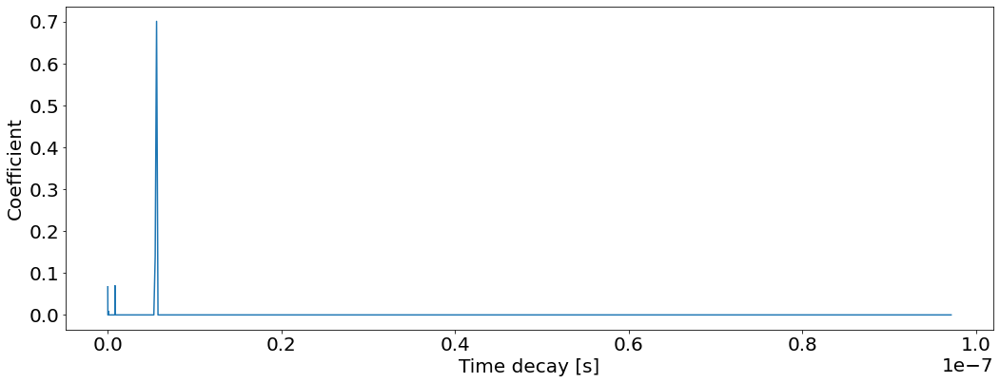

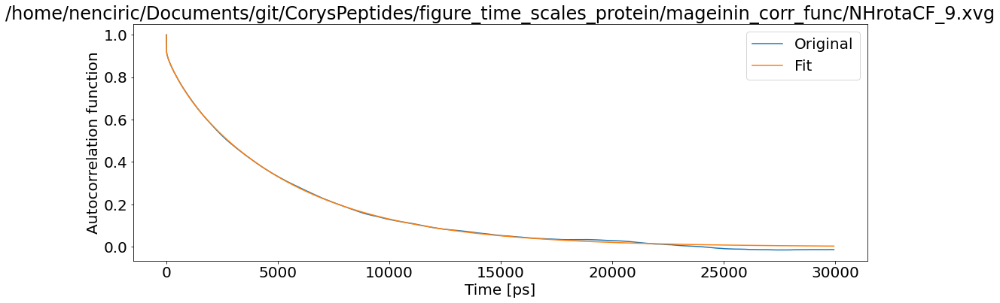

T1: 0.0009875579029463392 T2: 0.0006758232522319882 NOE: 0


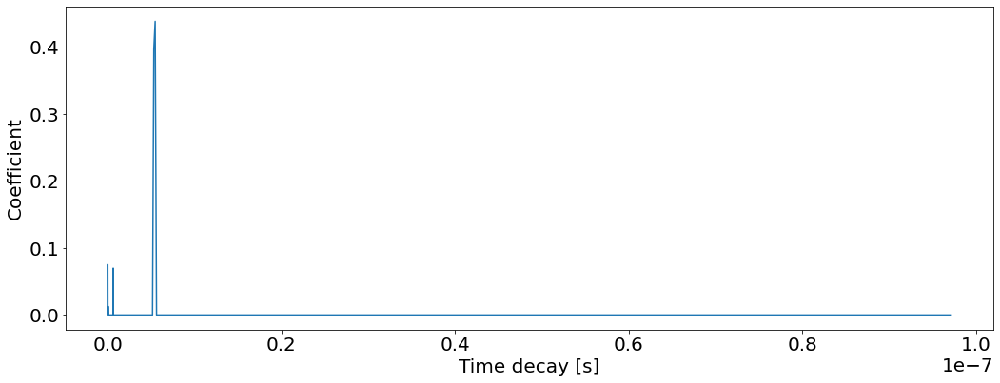

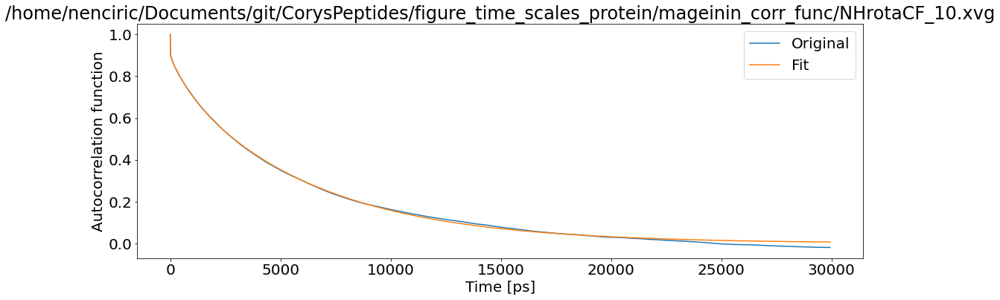

T1: 0.0010144462621500215 T2: 0.0006457628775210361 NOE: 0


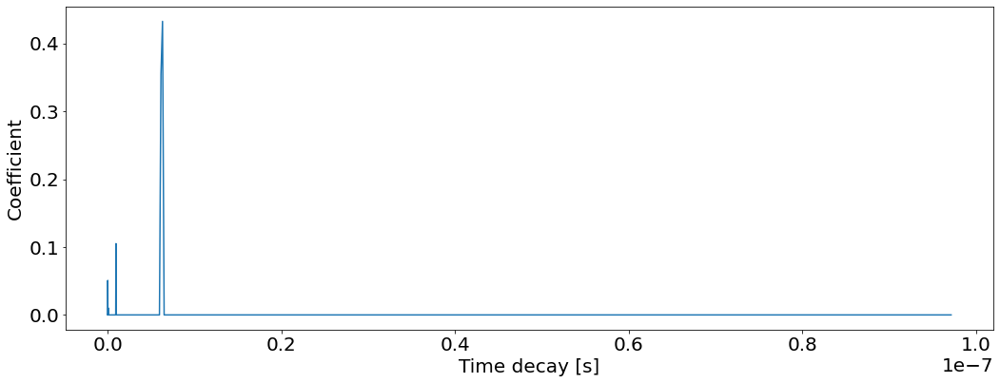

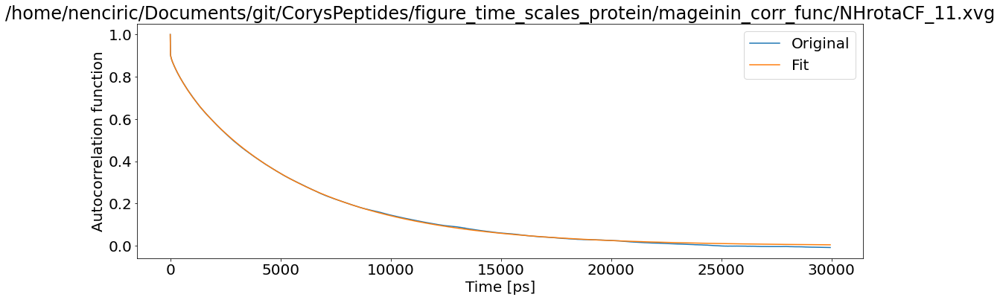

T1: 0.0009944320717546733 T2: 0.0006619515912429757 NOE: 0


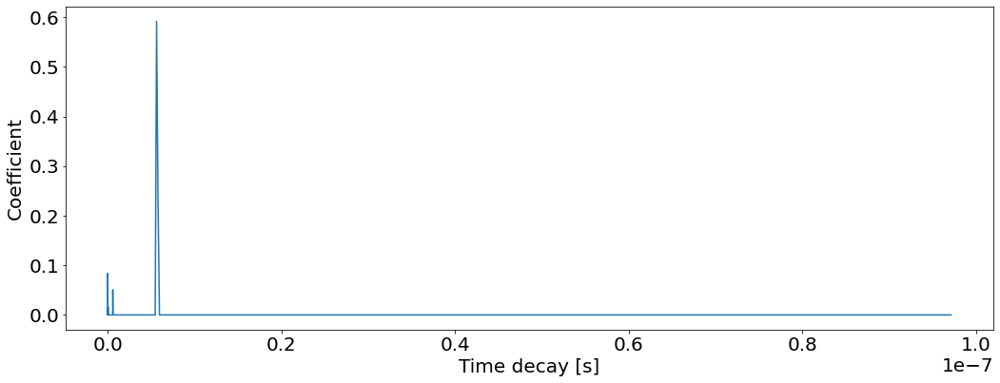

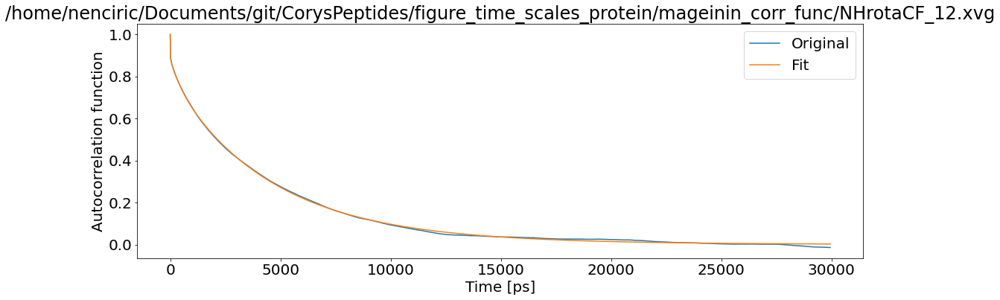

T1: 0.0010822449800590753 T2: 0.0007807689611882153 NOE: 0


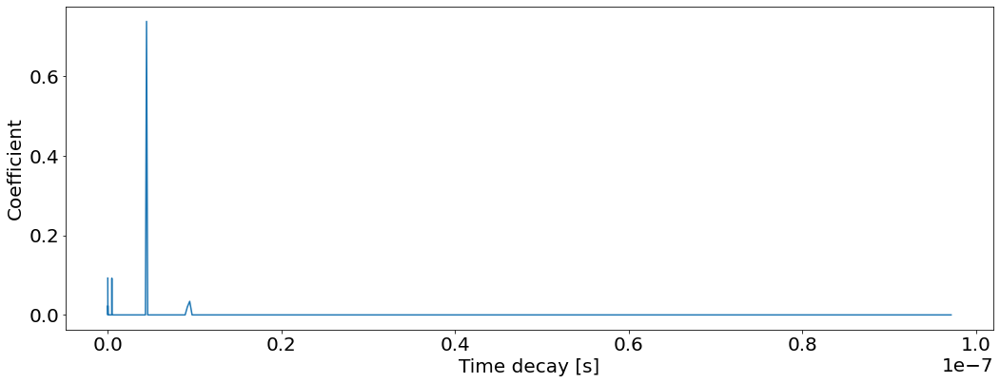

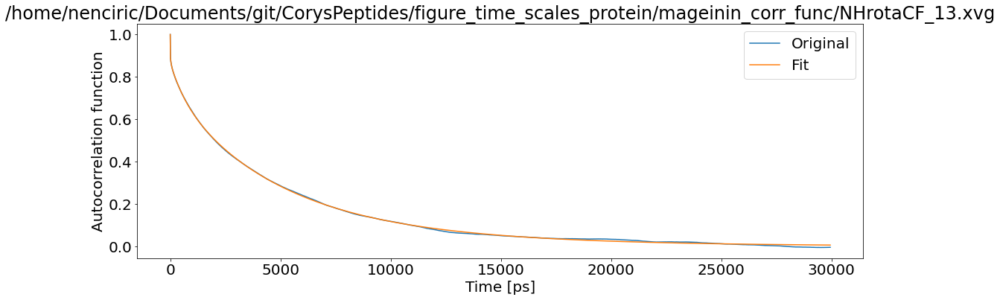

T1: 0.0011380702768922502 T2: 0.0007647003888627328 NOE: 0


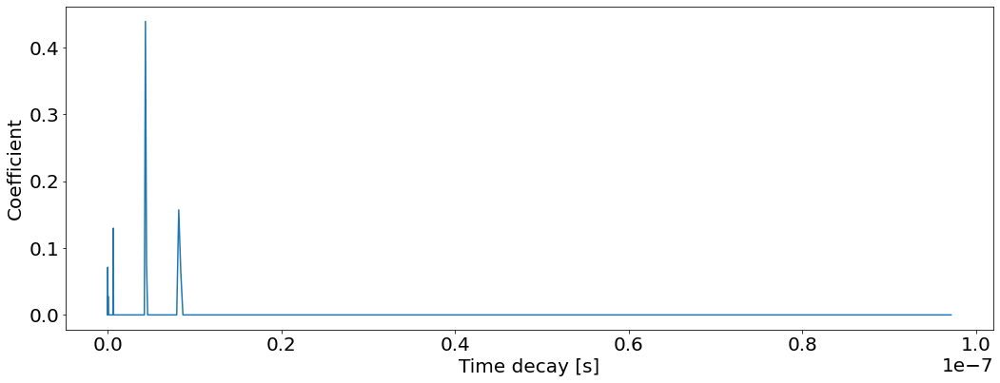

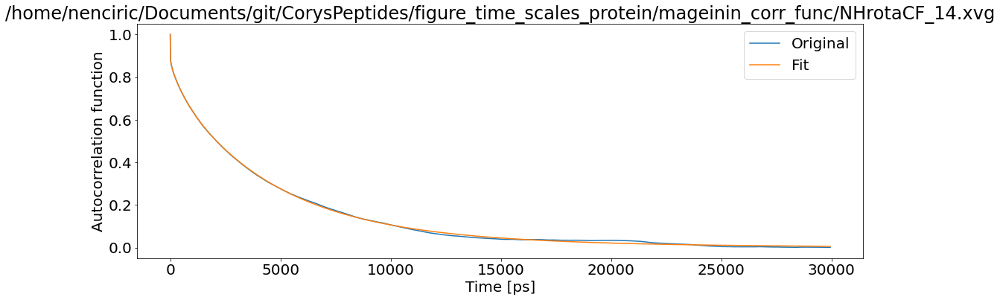

T1: 0.001116167047985474 T2: 0.0007748299617320822 NOE: 0


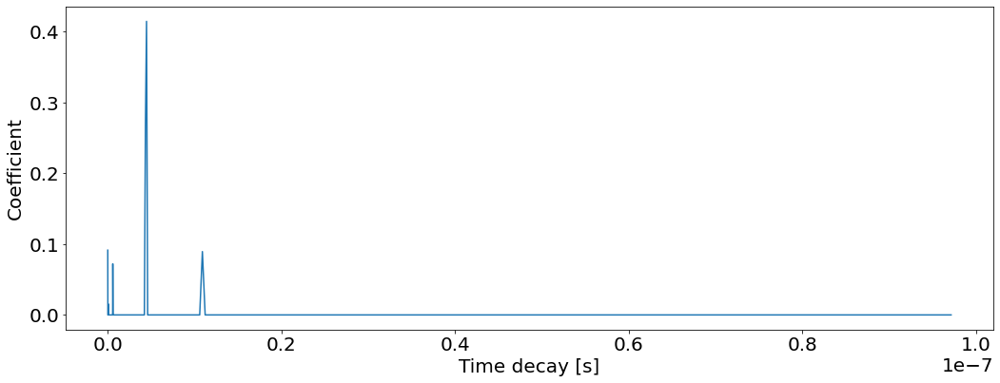

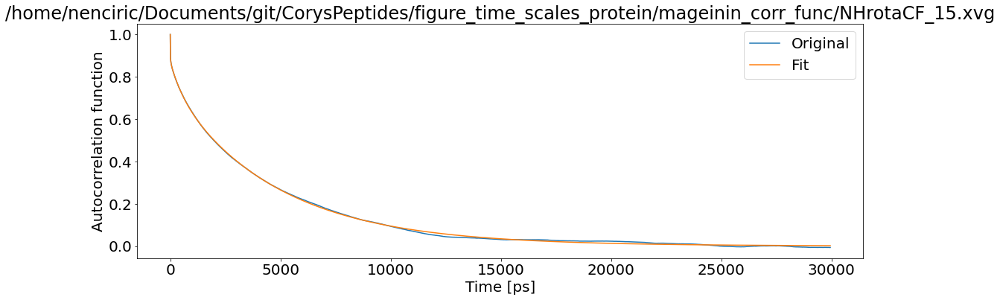

T1: 0.0011111719098797217 T2: 0.0008021953214624633 NOE: 0


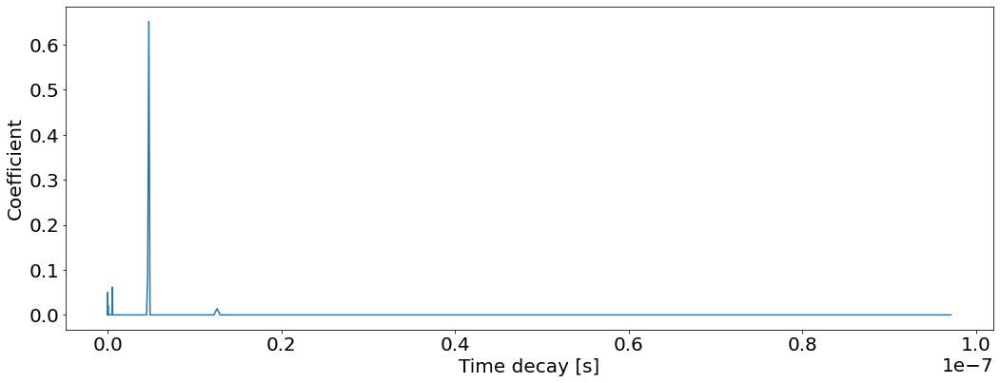

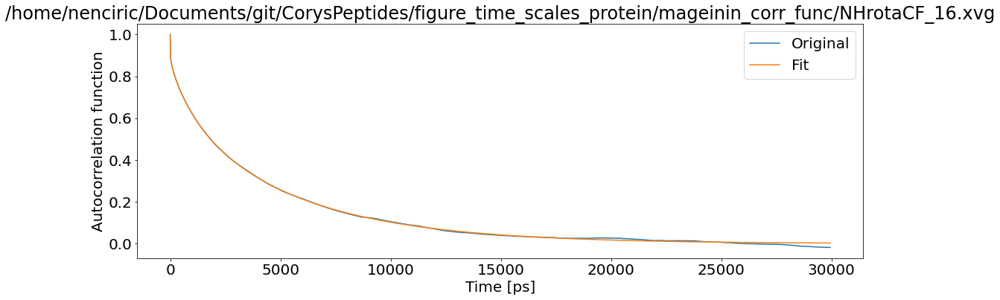

T1: 0.0011670885494207662 T2: 0.0008152427889401495 NOE: 0


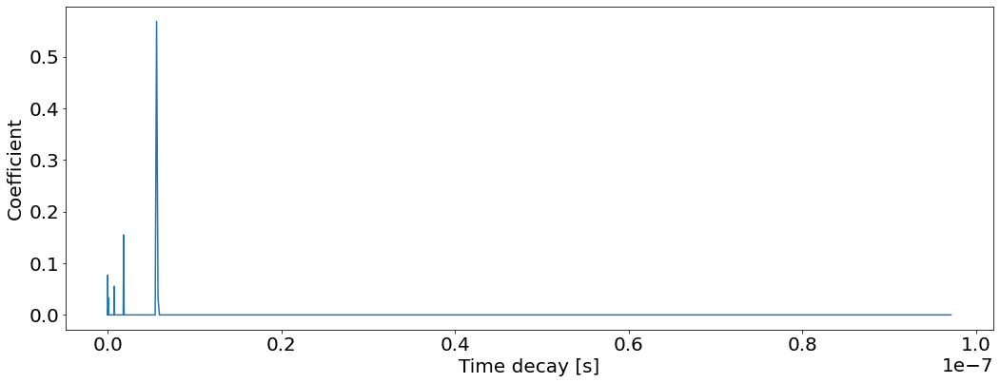

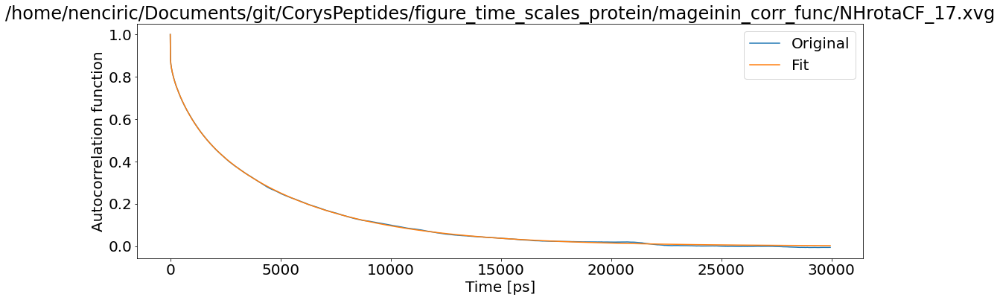

T1: 0.0011894038340098966 T2: 0.0008440871793954416 NOE: 0


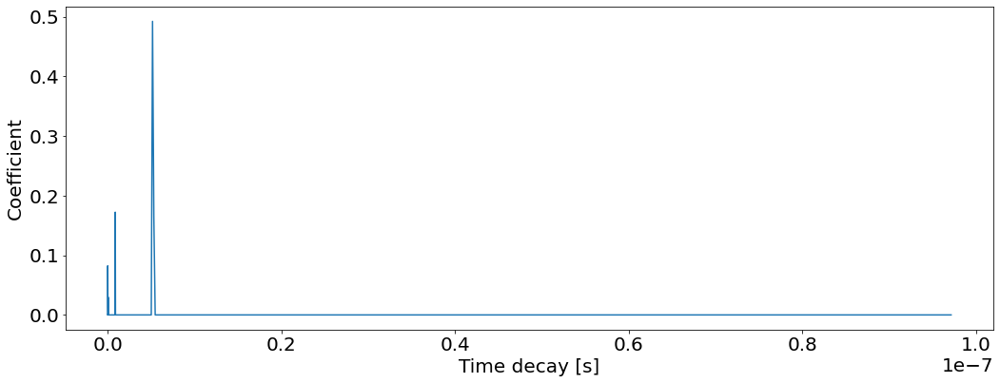

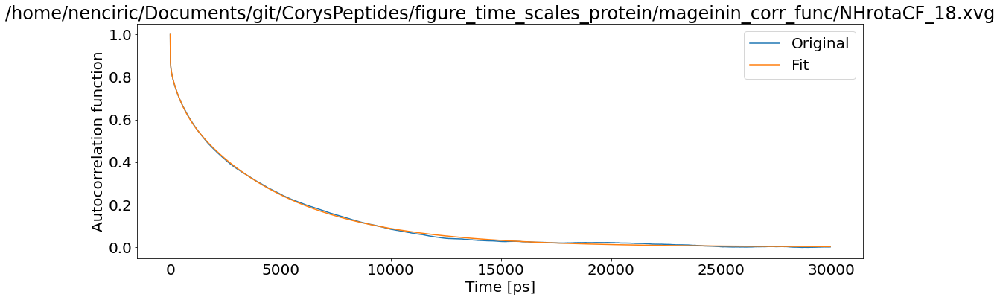

T1: 0.0011917150753920672 T2: 0.0008497383832173393 NOE: 0


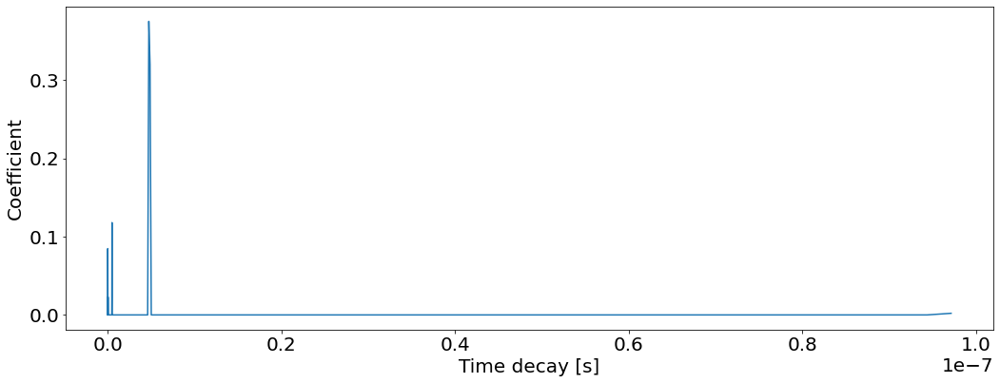

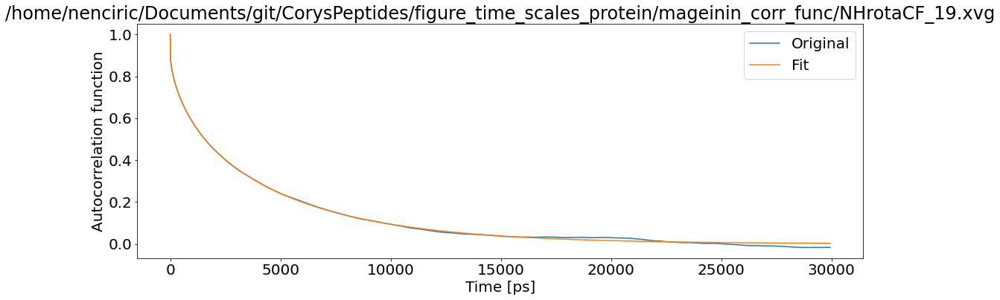

T1: 0.0012309396735544482 T2: 0.0008679890207675618 NOE: 0


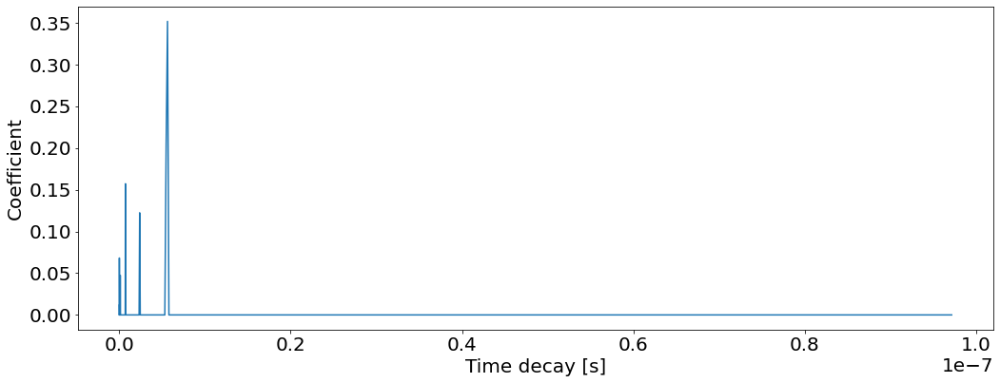

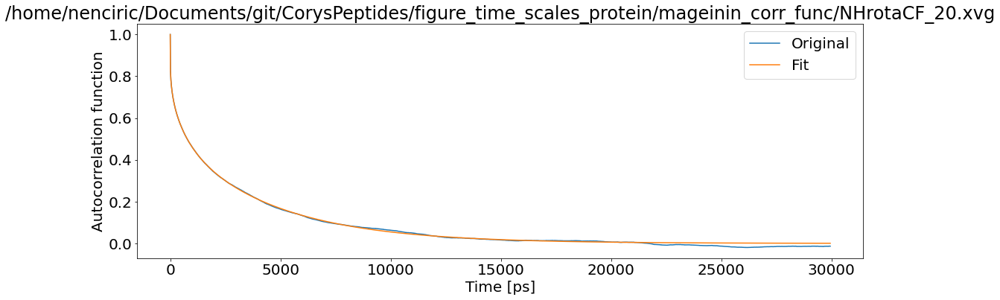

T1: 0.0015371662741003444 T2: 0.001173485436147795 NOE: 0


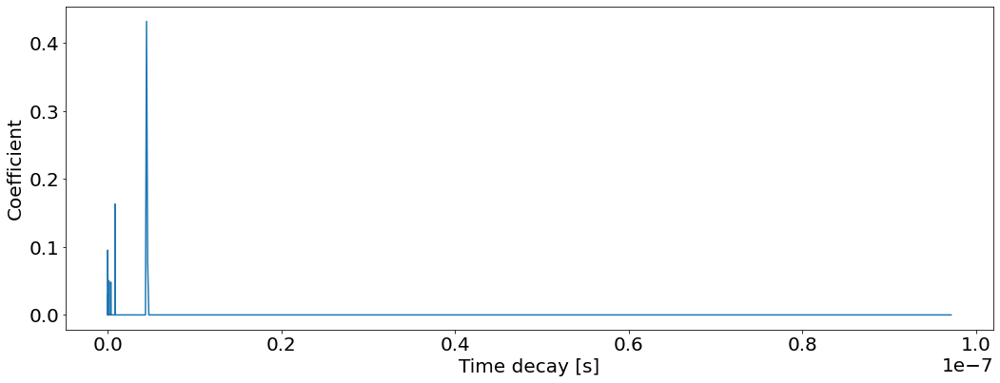

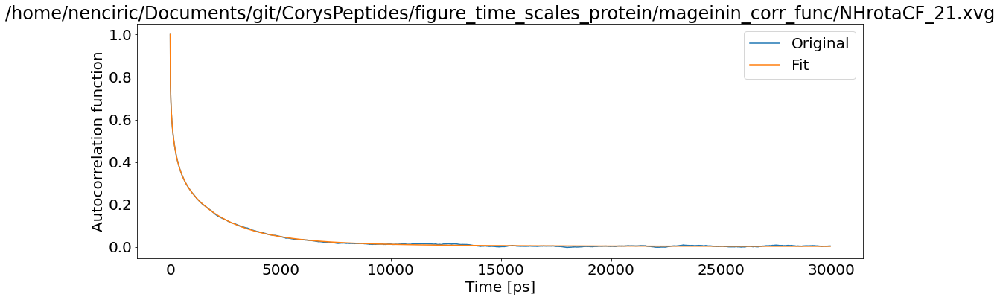

T1: 0.0030095531896904906 T2: 0.002359276678177376 NOE: 0


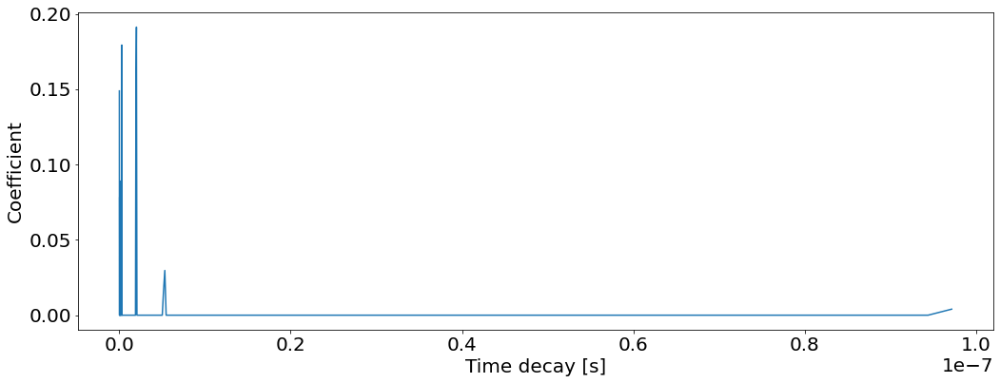

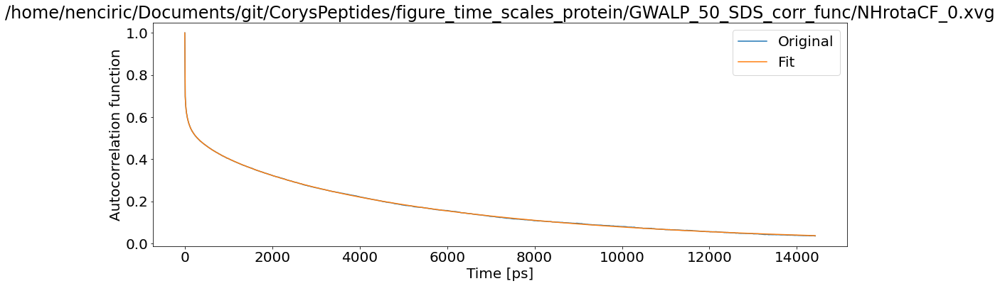

T1: 0.0017672675710276226 T2: 0.0011807737243290397 NOE: 0


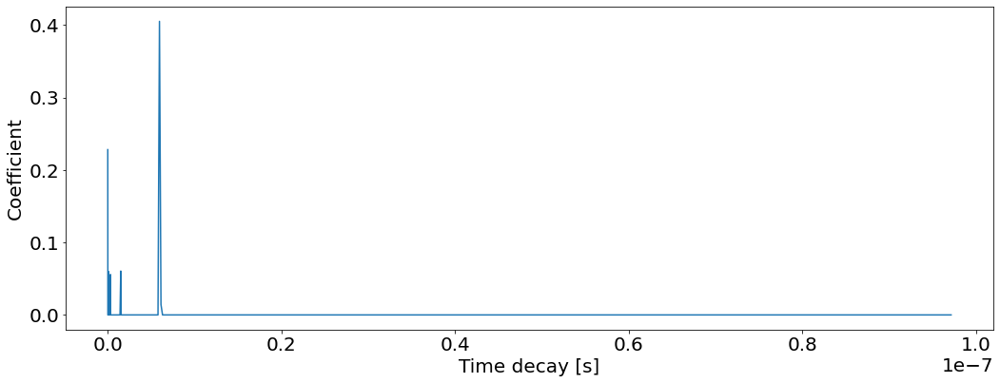

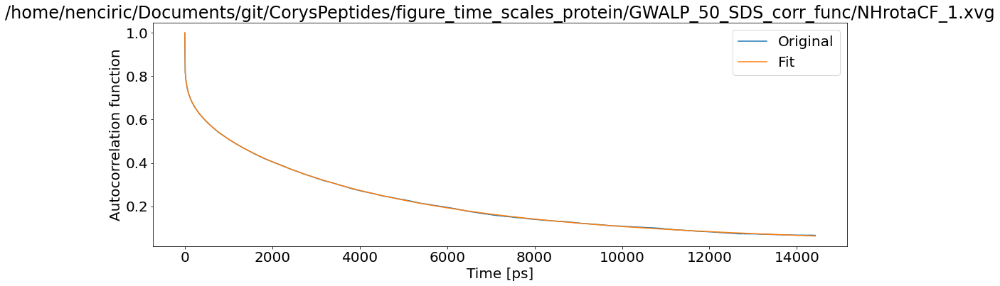

T1: 0.0014931914365645988 T2: 0.000928012549588423 NOE: 0


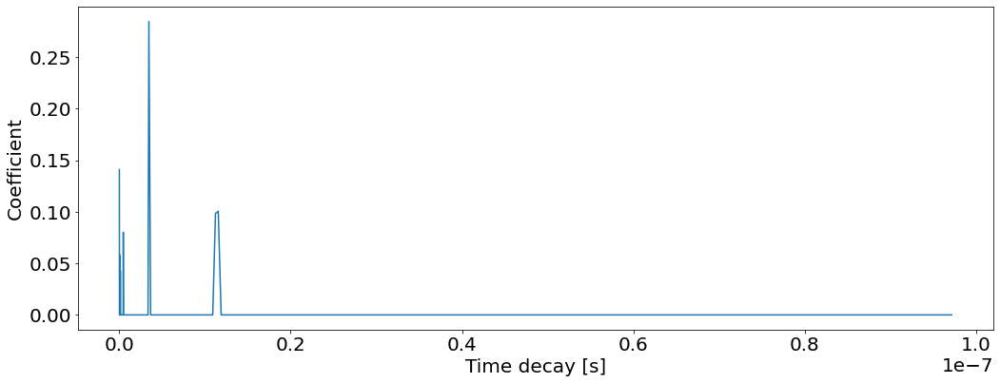

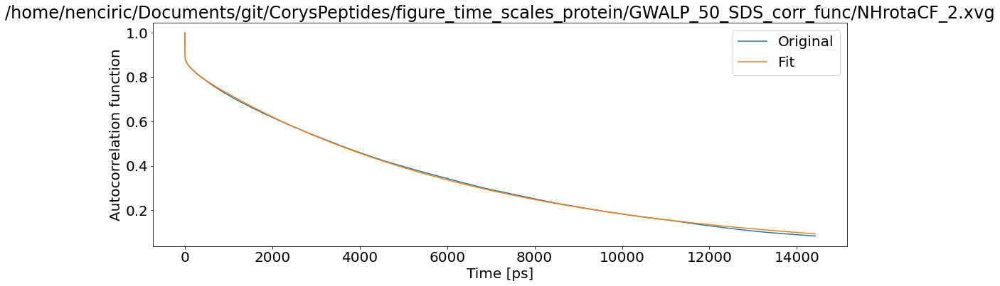

T1: 0.0009846160976336505 T2: 0.0006011670669918843 NOE: 0


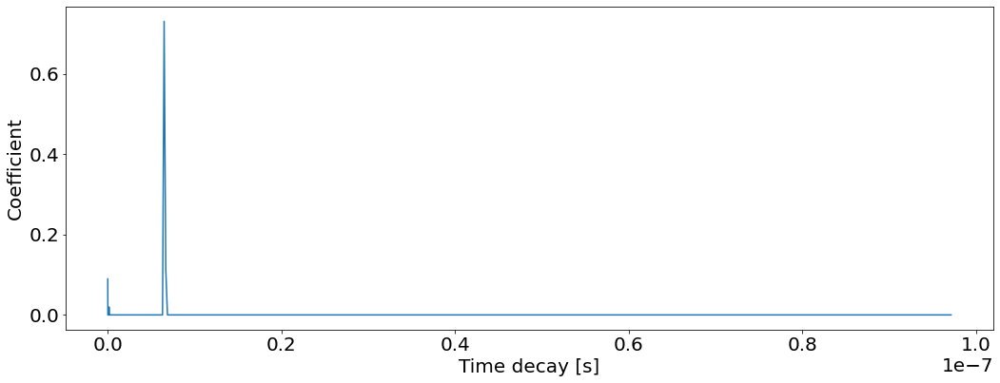

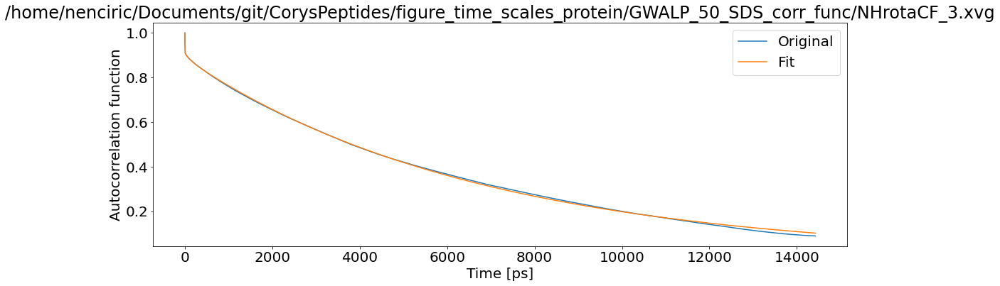

T1: 0.0009392180108337301 T2: 0.0005648451854787929 NOE: 0


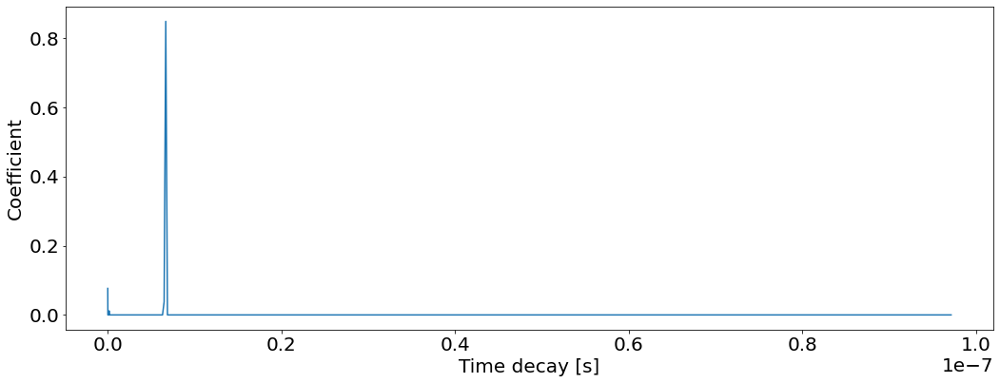

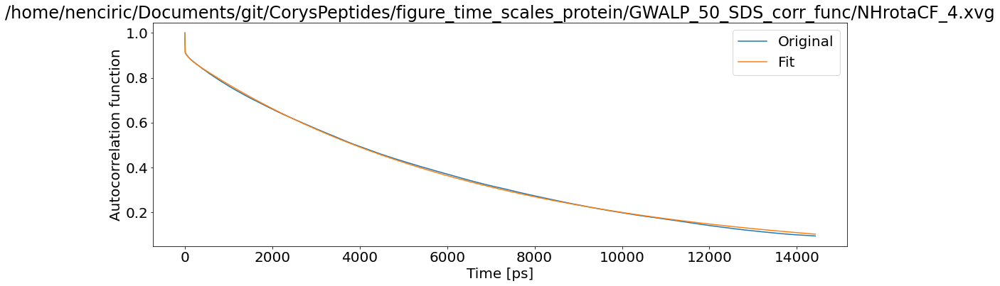

T1: 0.0009313841518505545 T2: 0.0005600690179558681 NOE: 0


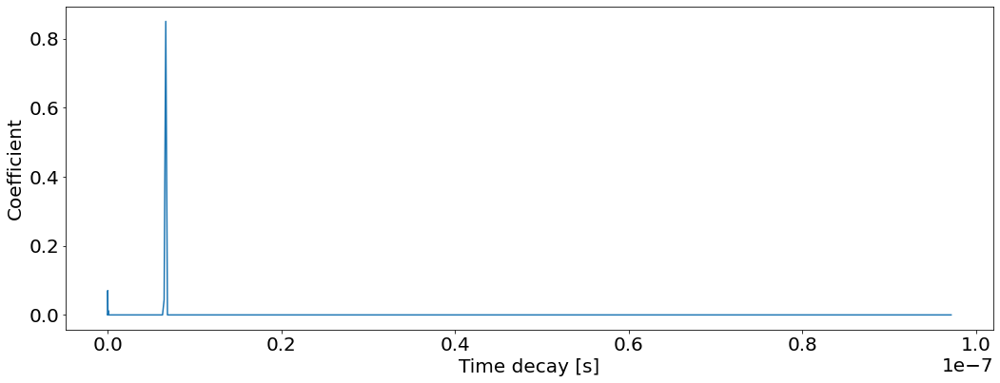

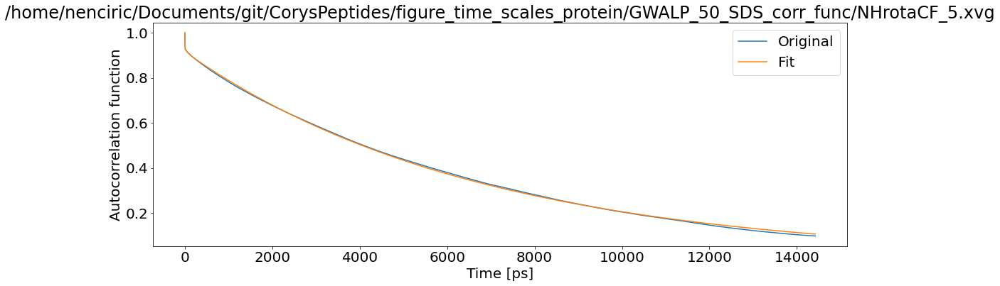

T1: 0.0009098739256488752 T2: 0.0005462383574287087 NOE: 0


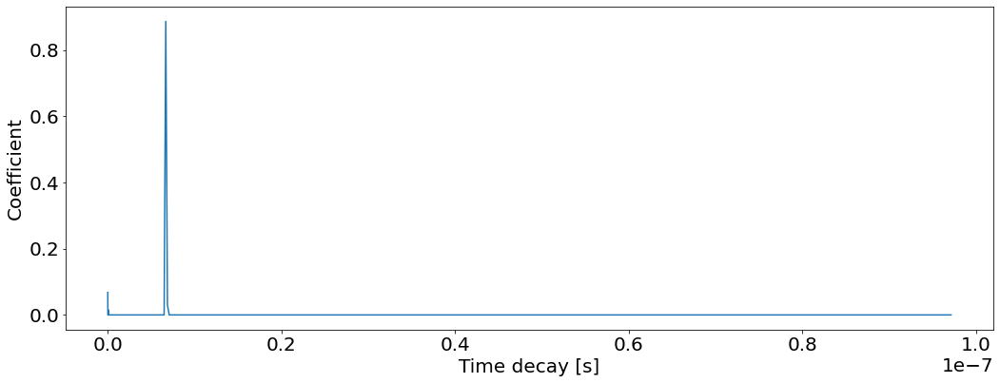

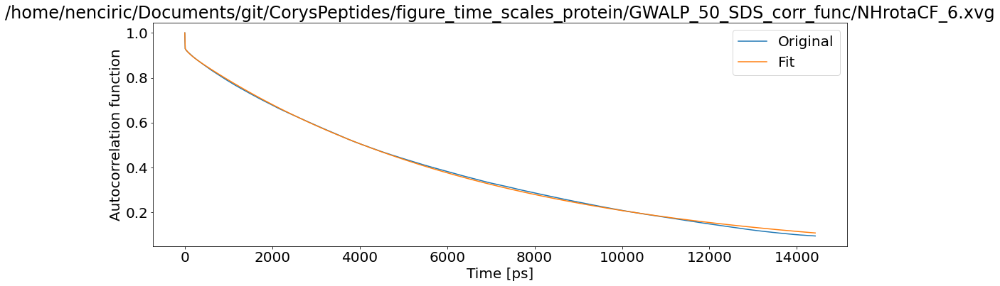

T1: 0.0009104210821047093 T2: 0.000544012350406372 NOE: 0


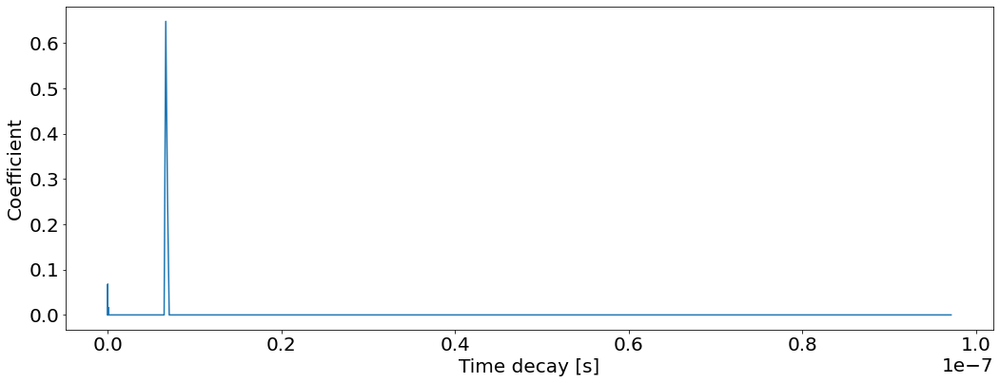

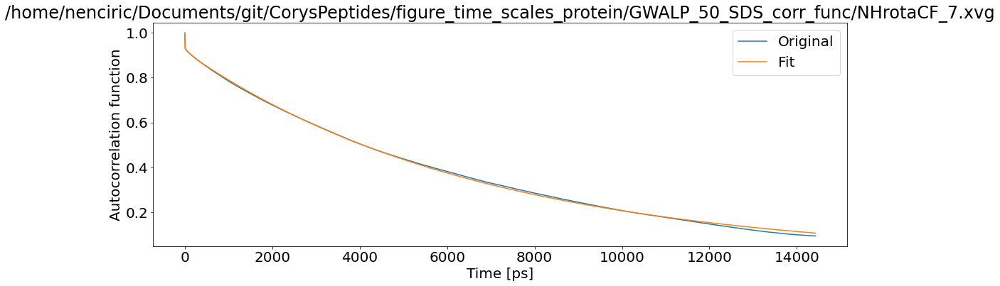

T1: 0.0009089770390982696 T2: 0.000544535083646926 NOE: 0


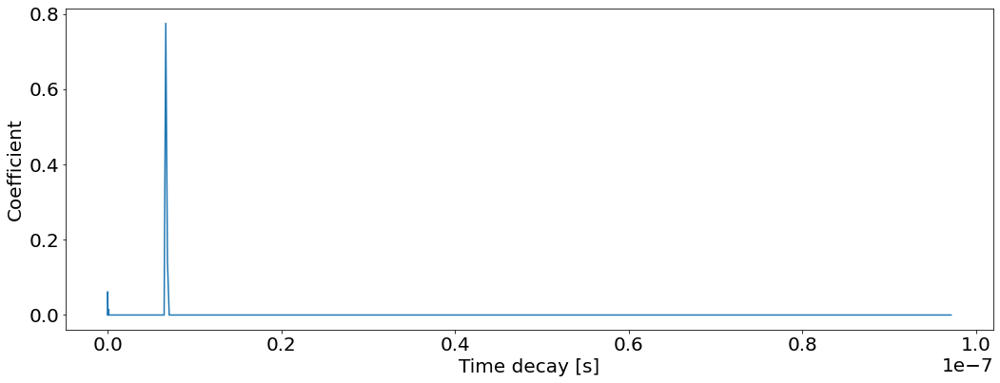

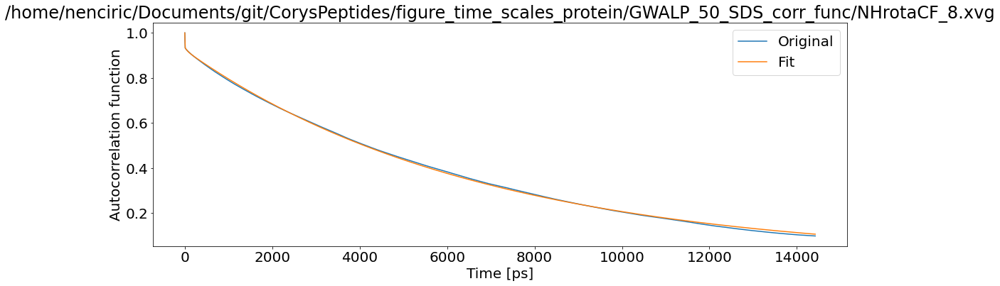

T1: 0.0009023591817837017 T2: 0.0005420300251035248 NOE: 0


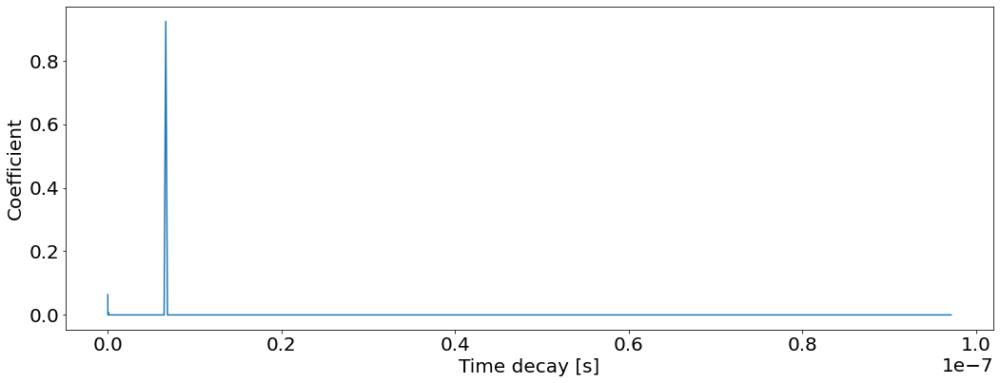

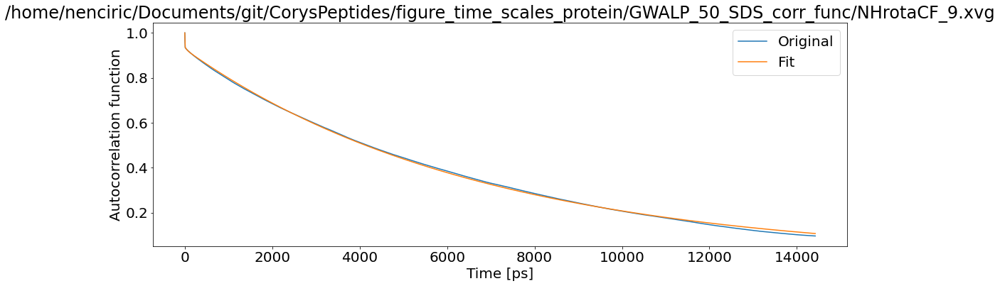

T1: 0.0008988514029661394 T2: 0.0005396728872881144 NOE: 0


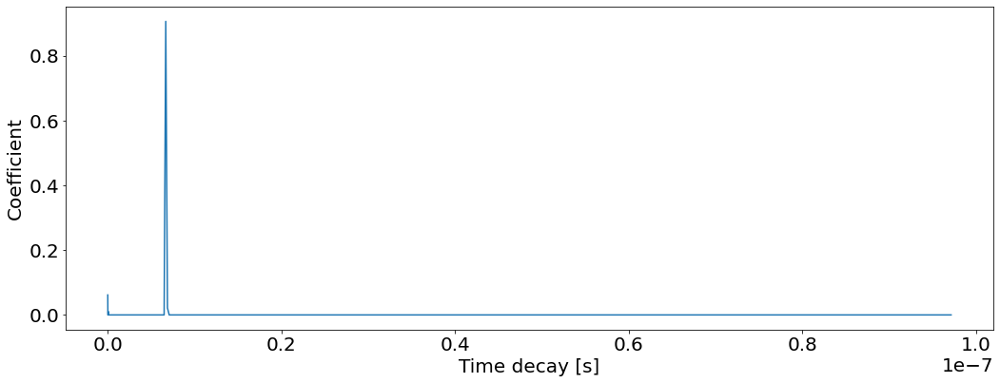

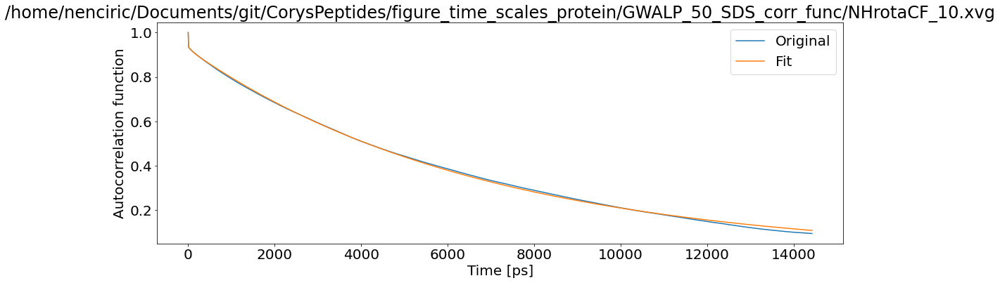

T1: 0.0009024189118085503 T2: 0.0005391853899686147 NOE: 0


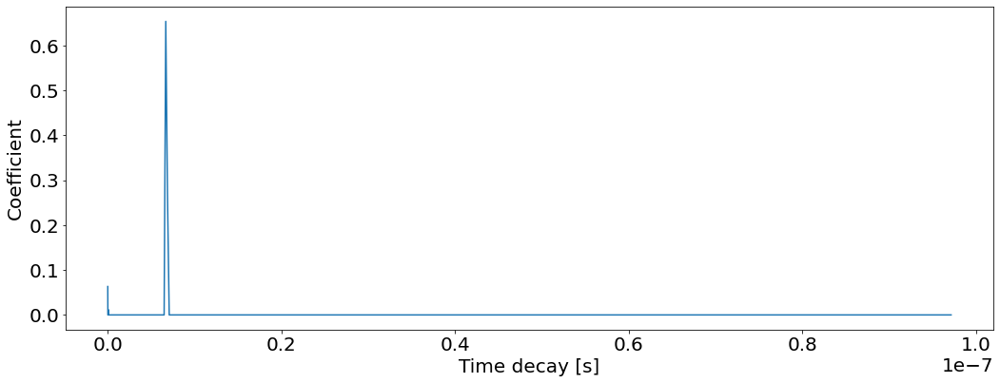

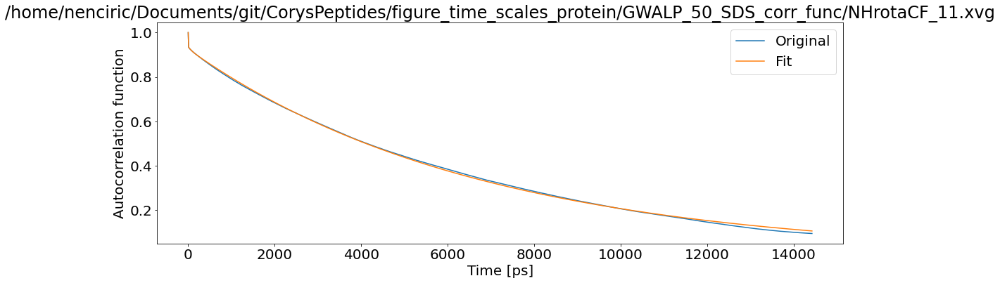

T1: 0.0009008991397899246 T2: 0.0005410391299995843 NOE: 0


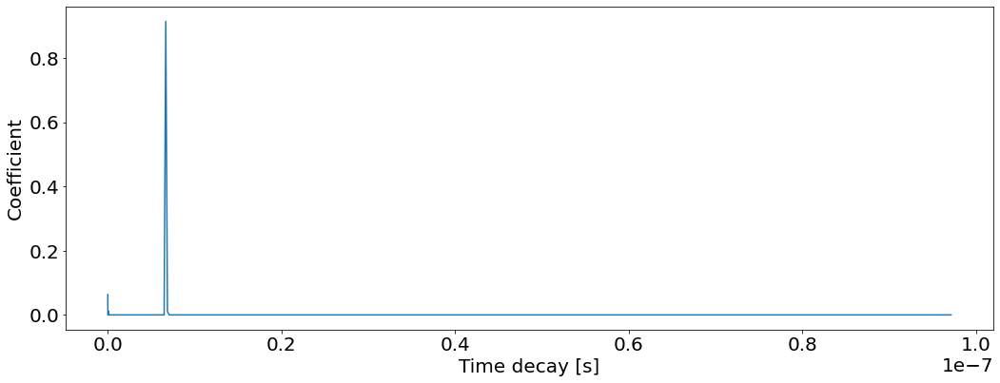

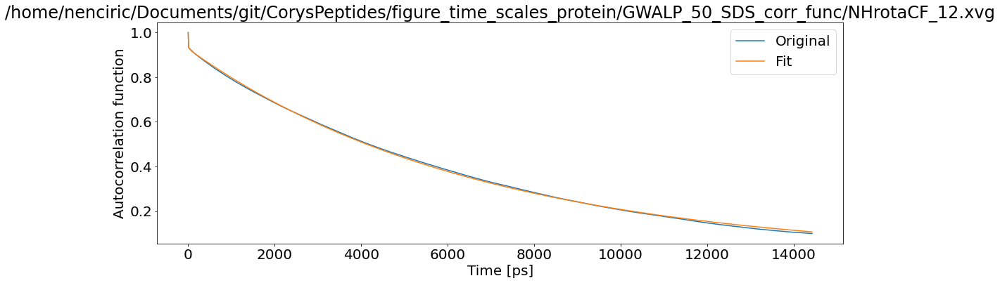

T1: 0.0008998891601492161 T2: 0.0005405247054128888 NOE: 0


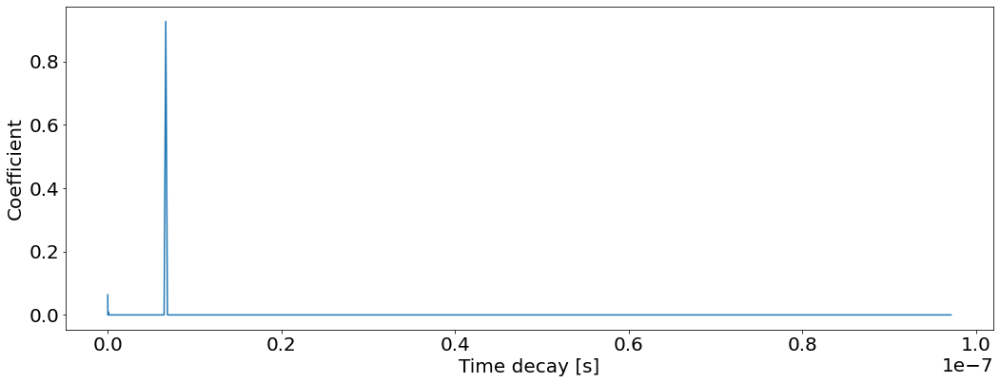

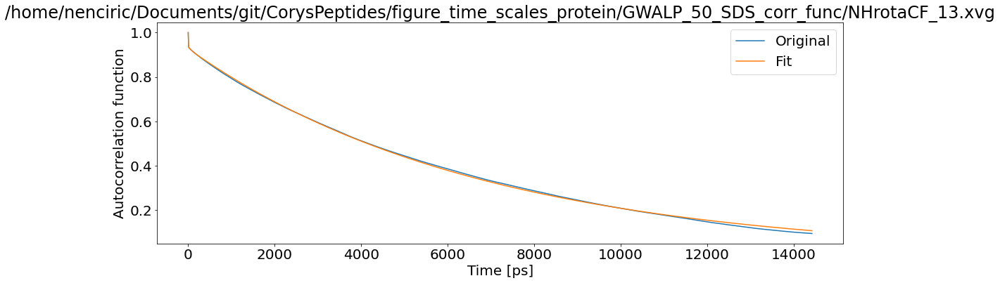

T1: 0.0008994510442112589 T2: 0.0005386231315777151 NOE: 0


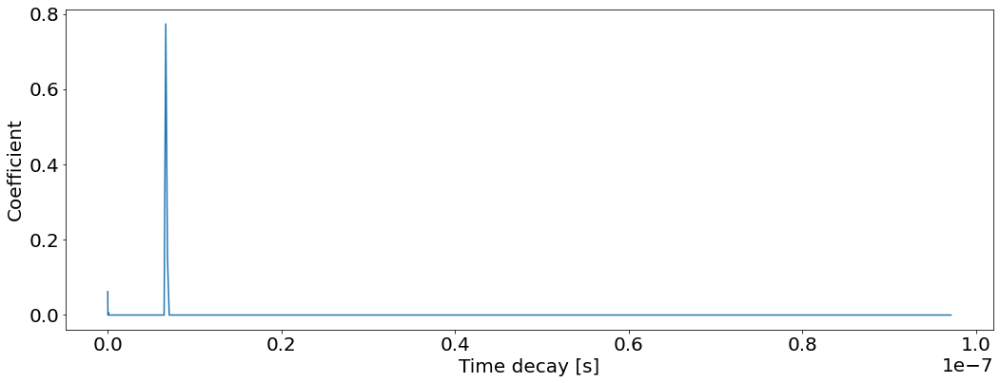

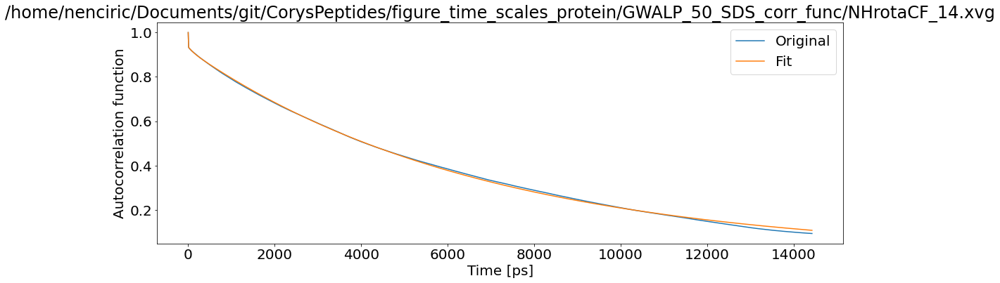

T1: 0.0009050068300227546 T2: 0.0005407421840658335 NOE: 0


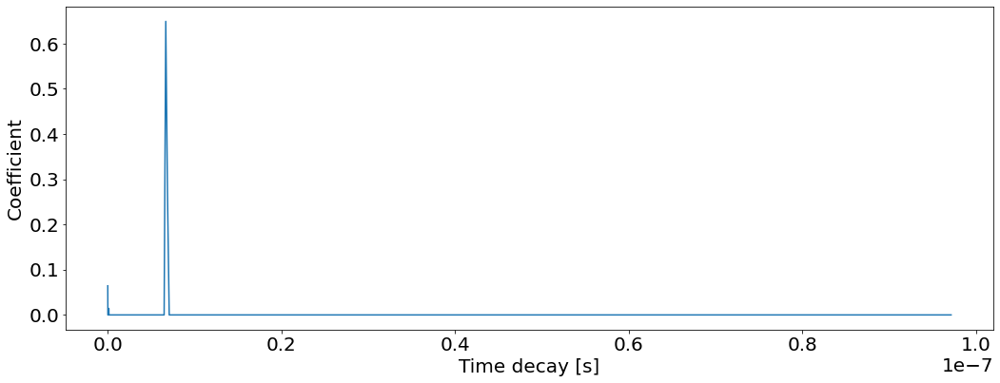

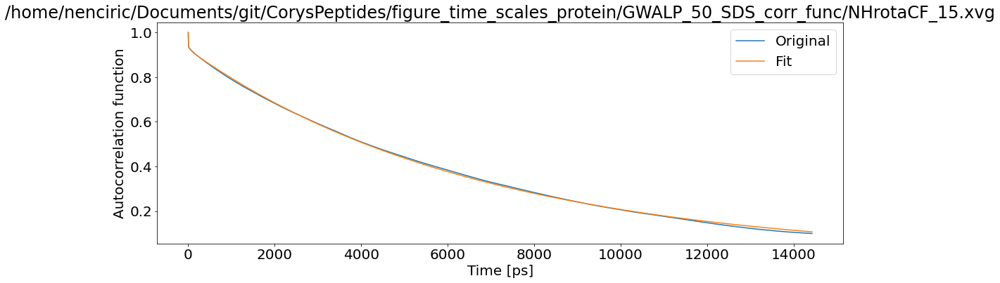

T1: 0.0009022378042800364 T2: 0.0005418831927792604 NOE: 0


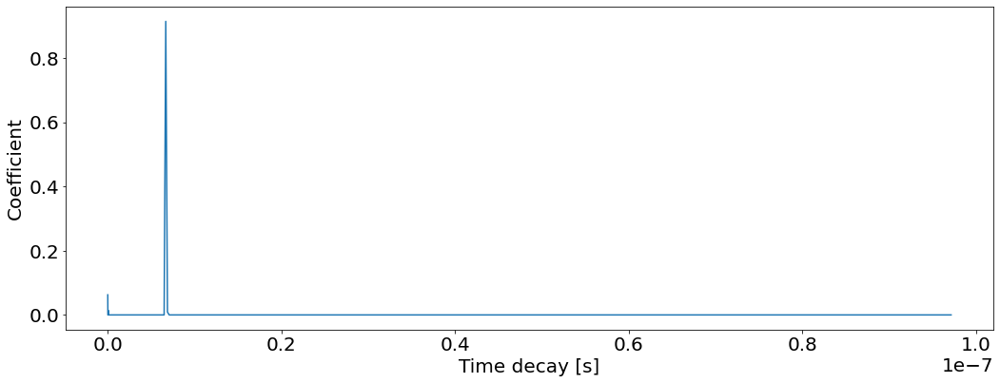

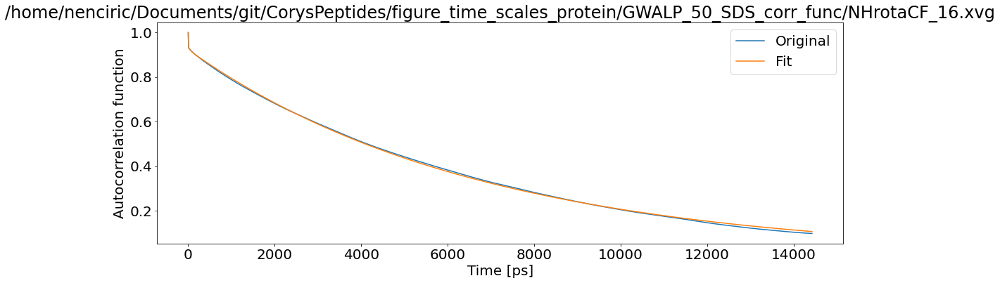

T1: 0.0009031507434466686 T2: 0.0005431781929235444 NOE: 0


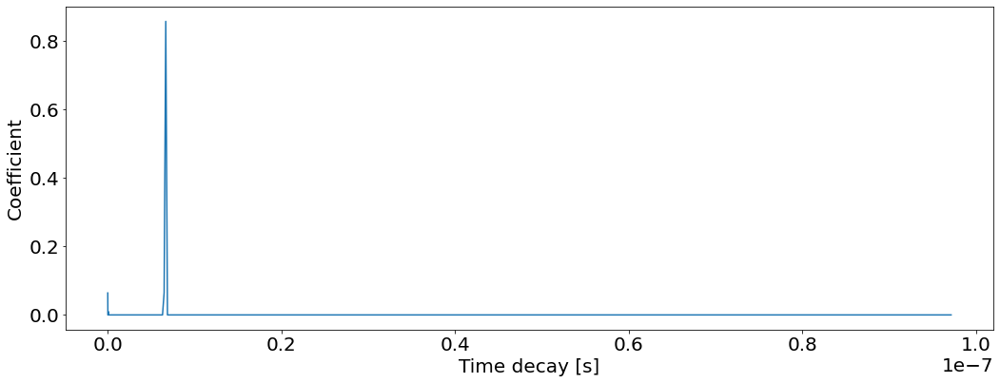

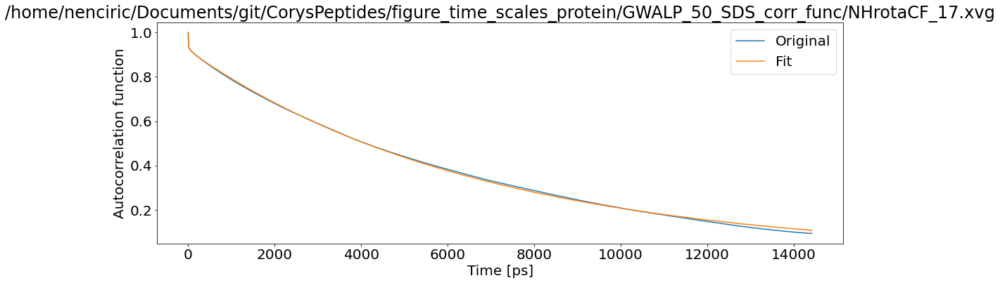

T1: 0.0009067546451284551 T2: 0.0005429183897919141 NOE: 0


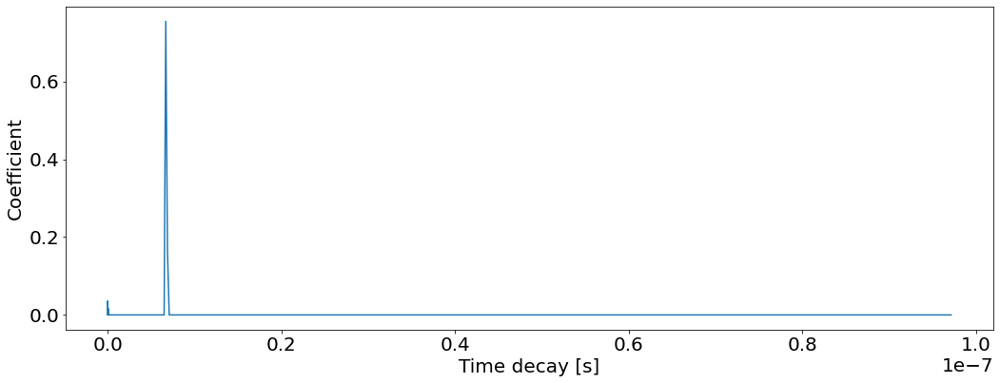

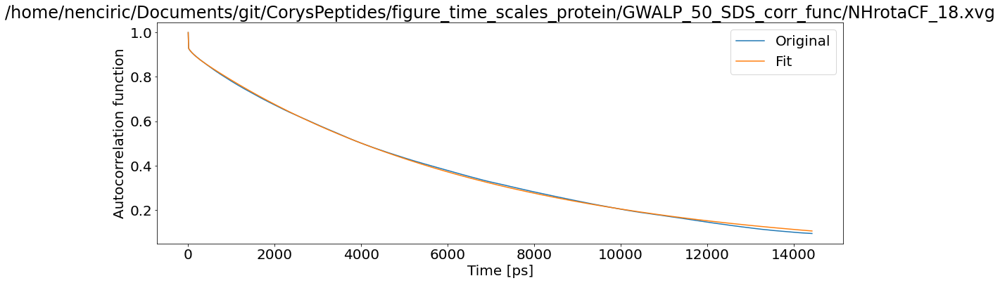

T1: 0.0009134693560336308 T2: 0.0005490127362769064 NOE: 0


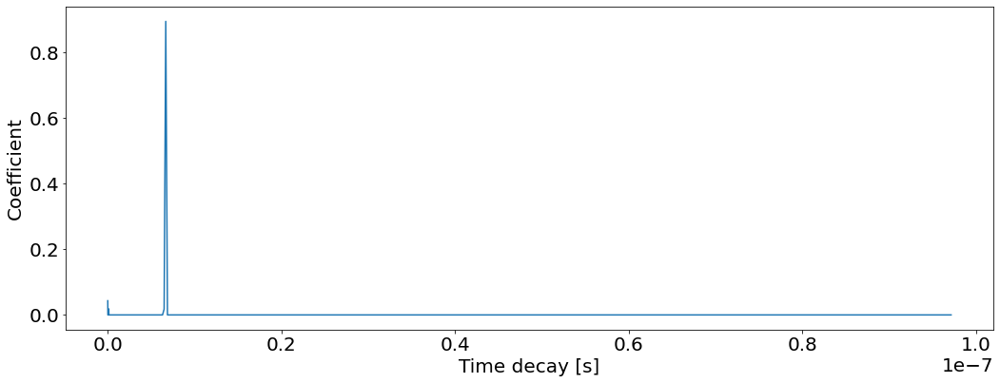

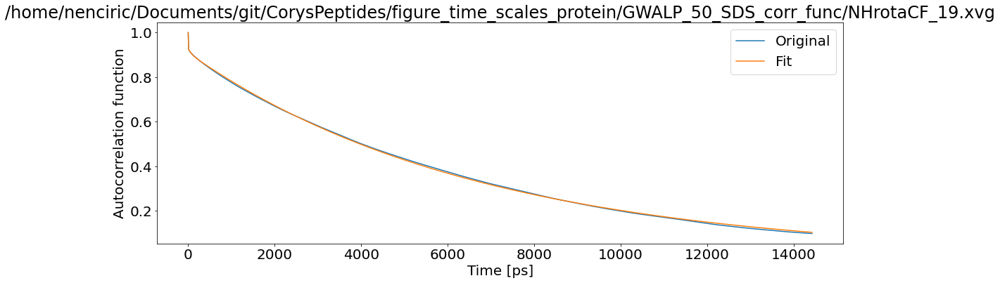

T1: 0.0009170265379342305 T2: 0.0005525044699632745 NOE: 0


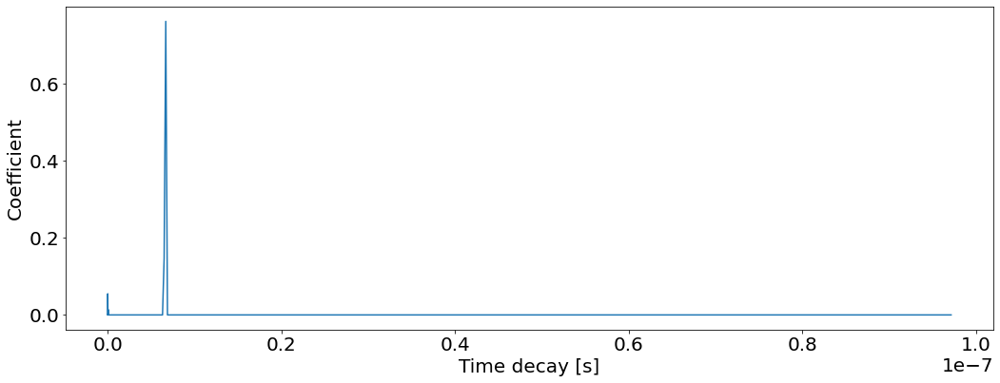

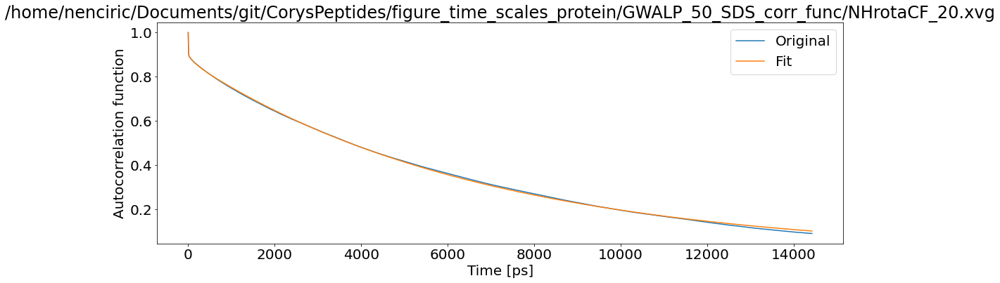

T1: 0.0009543355752125664 T2: 0.0005726972596770516 NOE: 0


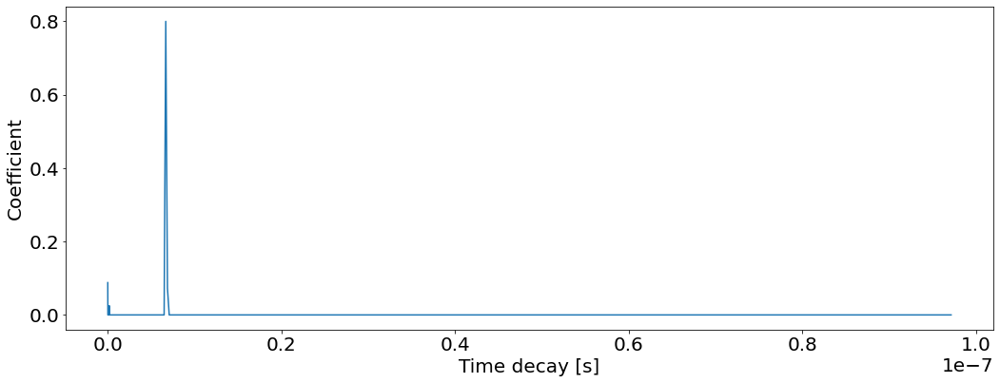

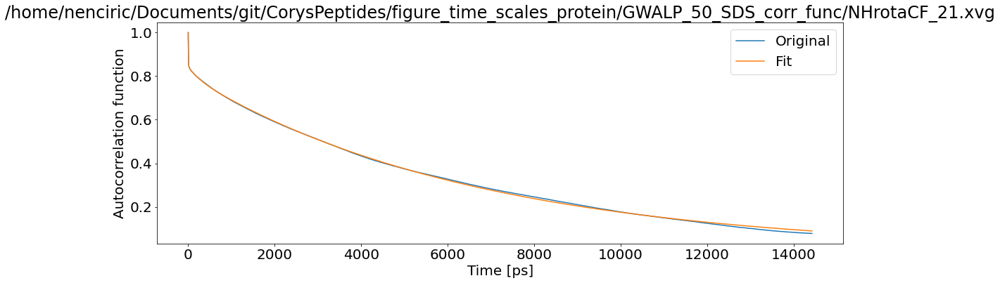

T1: 0.0010333647448309675 T2: 0.0006280943634306453 NOE: 0


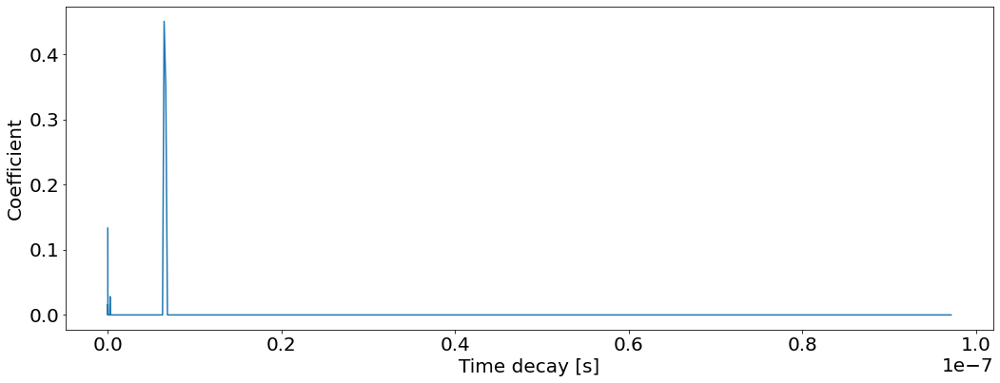

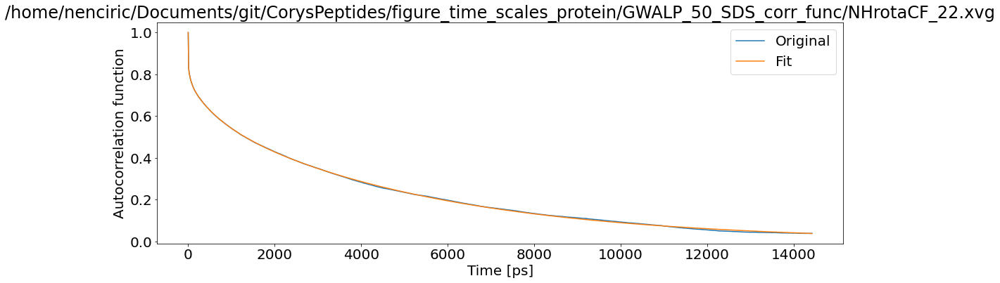

T1: 0.0012928430487335672 T2: 0.0009130098645844031 NOE: 0


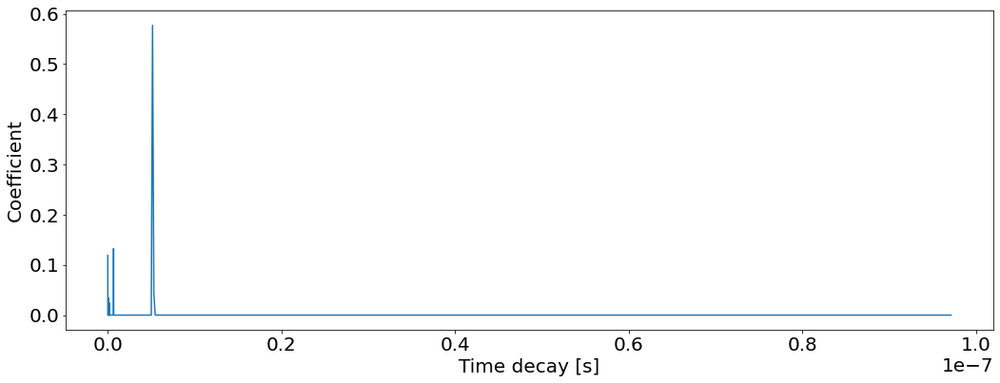

In [258]:

"""Parameters to be specified by the user"""
OP=0 # order parameter
smallest_corr_time=0 # enter in log scale -3 fs; 0 ps; 3 ns; 6 us;
biggest_corr_time=5 # same as above
N_exp_to_fit=400 # number of exponential functions to be fitted between the samlles and biggest corr time
analyze=1/50 # the proportin of correlation data to be used for fitting, ex. 1/2 uses first half of the data
magnetic_field=2.35 # 5.99 # 8.49 T (values used in SDS paper, J.Chem. Soc.,, Faraday Trans. 1, 1988, 84(12), 4475-4486)
#magn_field=850
#magnetic_field=magn_field*2*np.pi/gammaH*10**6
nuclei="2H" #nuclei to calculate: 2H-deutherium; 13C - carbon; 15N - nitrogen 



##############3
## CHANGE IN THE CODE 6.4.2022, not going throught the whole content of the folder anymore
###############
take_all_in_folder="number" #"yes"/"no"/"number" analyze all in folder? useful for proteins, if no, fill the following line, if yes fill the folder path
input_corr_file="alphaCF.xvg"
input_prefix="NHrotaCF_" # mostly for peptides, works with take_all_in_folder="no"
residues=40


author_name="Ricky Nencini"

peptides={"eElab":{"ADRESS":"/home/nenciric/Documents/git/CorysPeptides/figure_time_scales_protein/eElab_40SDS_corr_func/"},
"eYqjD":{"ADRESS":"/home/nenciric/Documents/git/CorysPeptides/figure_time_scales_protein/eYqjD_corr_fuc/"},
"yFis1":{"ADRESS":"/home/nenciric/Documents/git/CorysPeptides/figure_time_scales_protein/yFis1_corr_func/"},
"hMff":{"ADRESS":"/home/nenciric/Documents/git/CorysPeptides/figure_time_scales_protein/93_hMff_50SDS_micelle_310K_CHARMM_lastframe_FromSofia_SDS_Protein_SOD_solvated_OPC_local_run_20ps_mahti_370ns_mahti_360ns_mahti_2940ns_no_solvent_2948/"},
"mag2":{"ADRESS":"/home/nenciric/Documents/git/CorysPeptides/figure_time_scales_protein/mageinin_corr_func/"},
"gwalp":{"ADRESS":"/home/nenciric/Documents/git/CorysPeptides/figure_time_scales_protein/GWALP_50_SDS_corr_func/"}}



folder_paths=[eElab,eYqjD,yFis1,hMff,mag2,gwalp]
output_name="eElab_40SDS_040822.out"


for key in peptides:
    residues=0
    for file in os.listdir(peptides[key]["ADRESS"]):
        residues+=1

    if take_all_in_folder=="yes":
        for file in os.listdir(peptides[key]["ADRESS"]):
            input_corr_file = peptides[key]["ADRESS"]+os.fsdecode(file)
            rt.GetRelaxationData(OP,smallest_corr_time, biggest_corr_time, N_exp_to_fit,analyze,magnetic_field,input_corr_file,nuclei,output_name)
    elif take_all_in_folder=="number":
        step_exp=(biggest_corr_time-smallest_corr_time)/N_exp_to_fit
        Ctimes = 10 ** np.arange(smallest_corr_time, biggest_corr_time, step_exp)
        Ctimes = Ctimes * 0.001 * 10 ** (-9);
        Ctimes_to_save=np.zeros([len(Ctimes),residues+1])
        Ctimes_to_save[:,0]=Ctimes
        for i in range(0,residues):
            input_corr_file = peptides[key]["ADRESS"]+input_prefix+str(i)+".xvg"
            AA=rt.GetRelaxationData(OP,smallest_corr_time, biggest_corr_time, N_exp_to_fit,analyze,magnetic_field,input_corr_file,nuclei,output_name)
            Ctimes_to_save[:,i+1]=AA.Coeffs
    else:
        rt.GetRelaxationData(OP,smallest_corr_time, biggest_corr_time, N_exp_to_fit,analyze,magnetic_field,input_corr_file,nuclei,output_name)

    peptides[key]["CTIMES"]=Ctimes_to_save

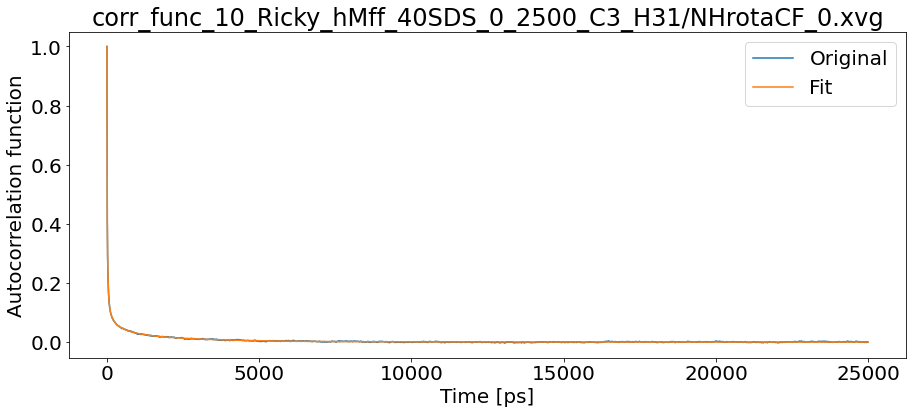

T1: 0.021535780544623077 T2: 0.016630782235846957 NOE: 0


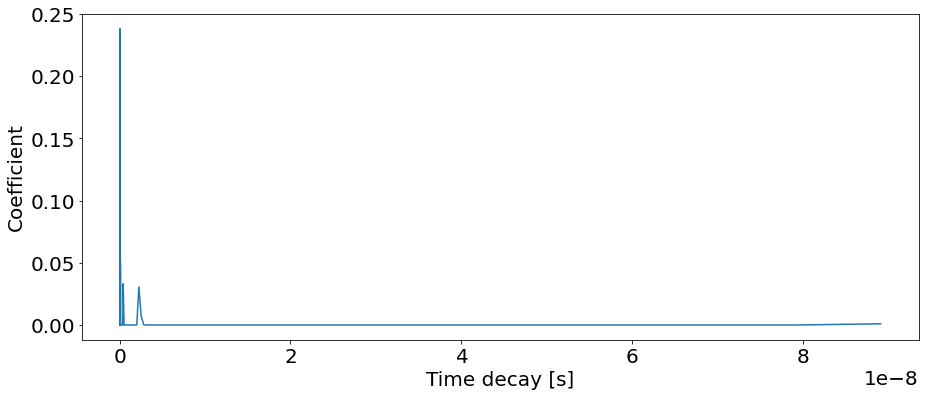

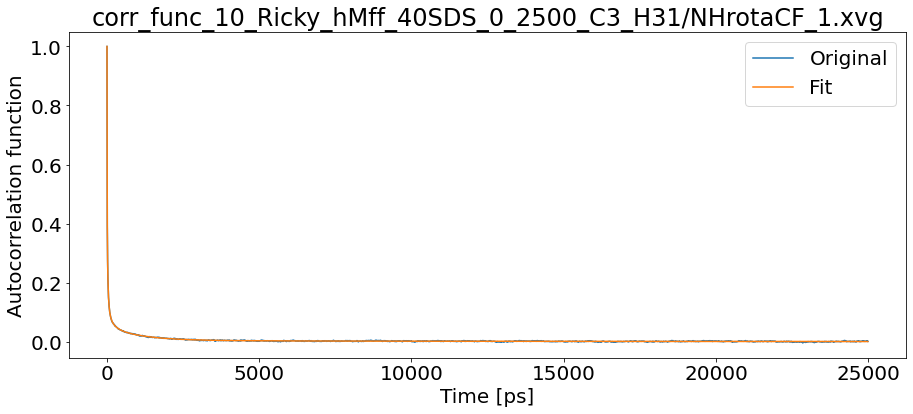

T1: 0.029925631045787732 T2: 0.025336970723038723 NOE: 0


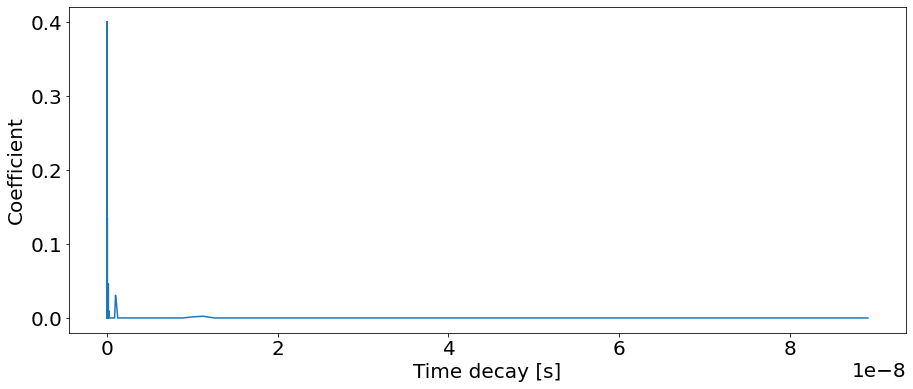

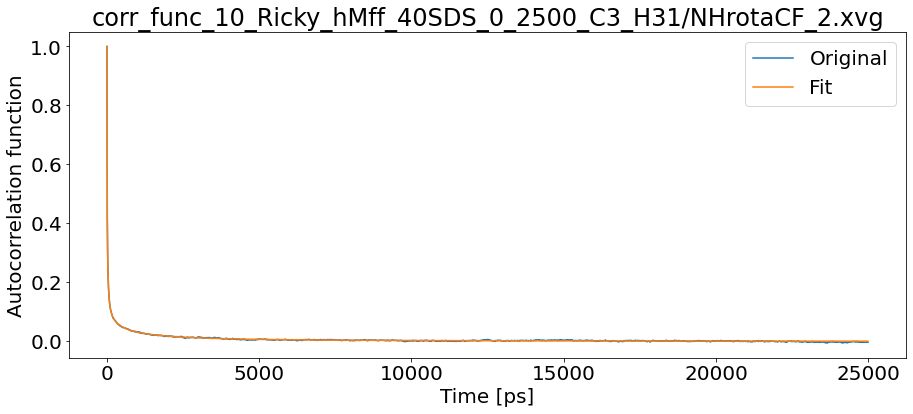

T1: 0.020913243077182283 T2: 0.017300035650840272 NOE: 0


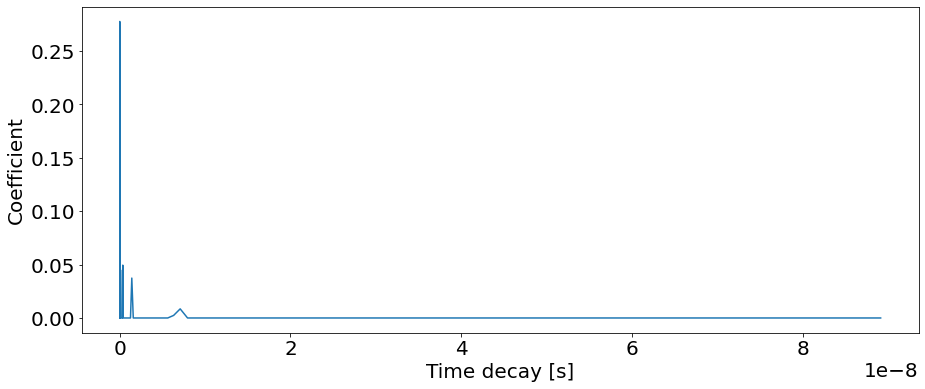

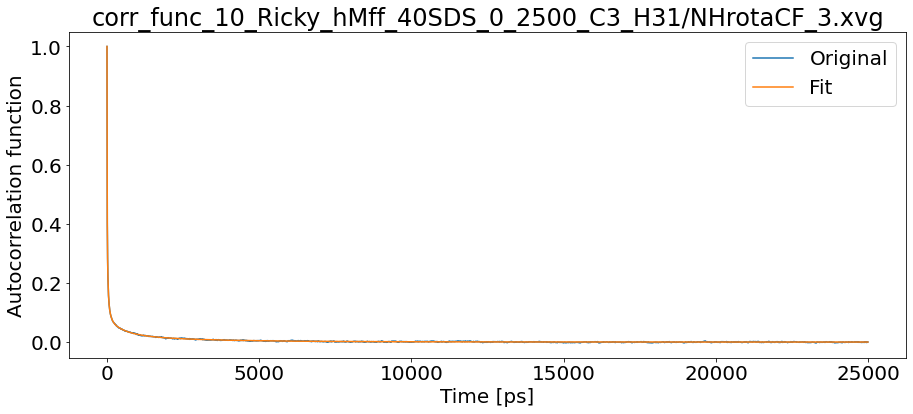

T1: 0.023752226230681458 T2: 0.021691640976954762 NOE: 0


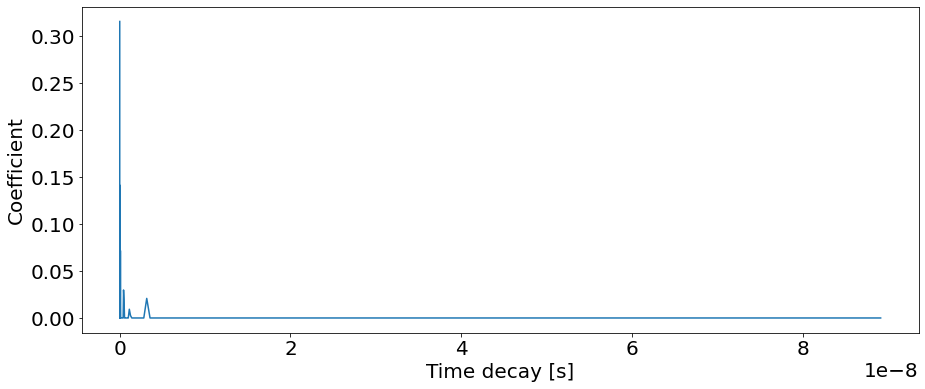

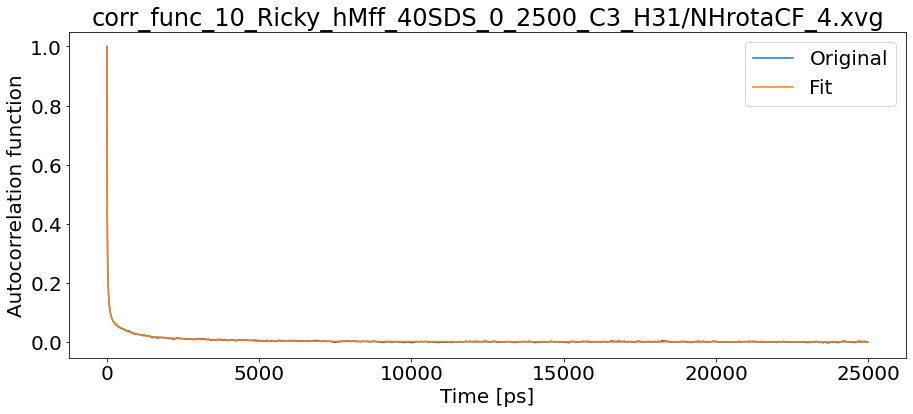

T1: 0.023779572803810007 T2: 0.017057522240391462 NOE: 0


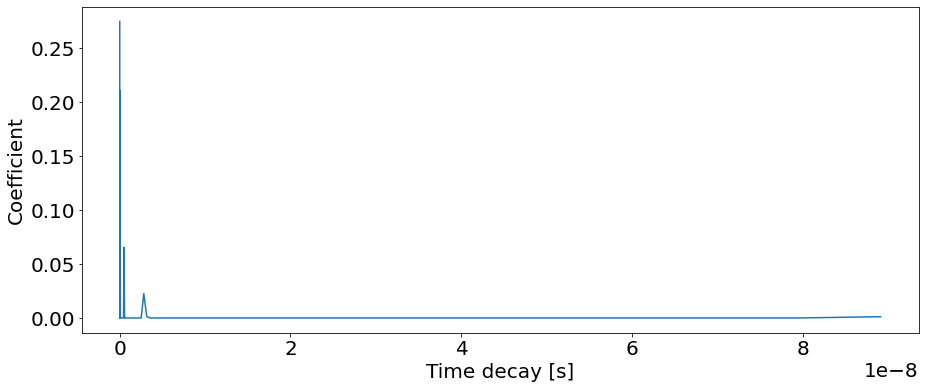

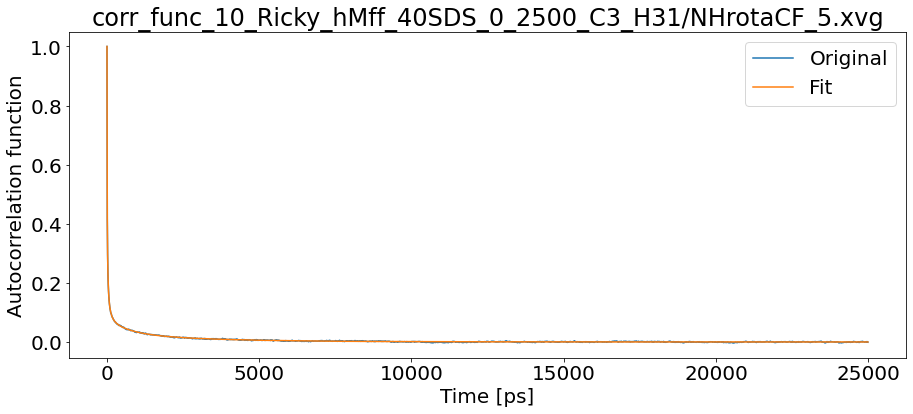

T1: 0.019594571278872958 T2: 0.01730517408028669 NOE: 0


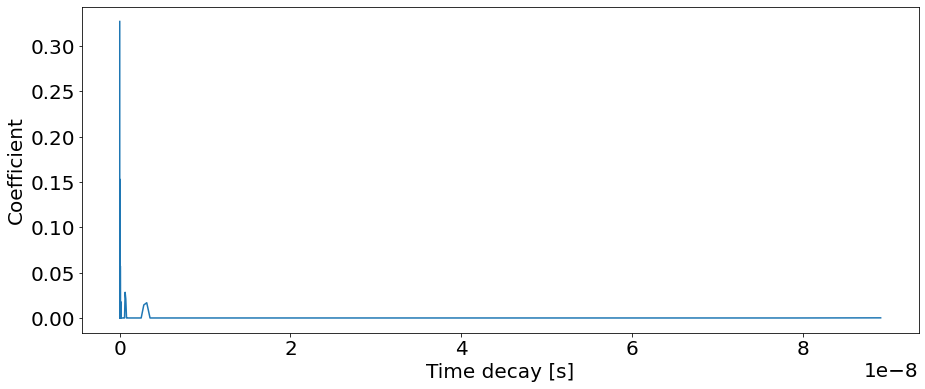

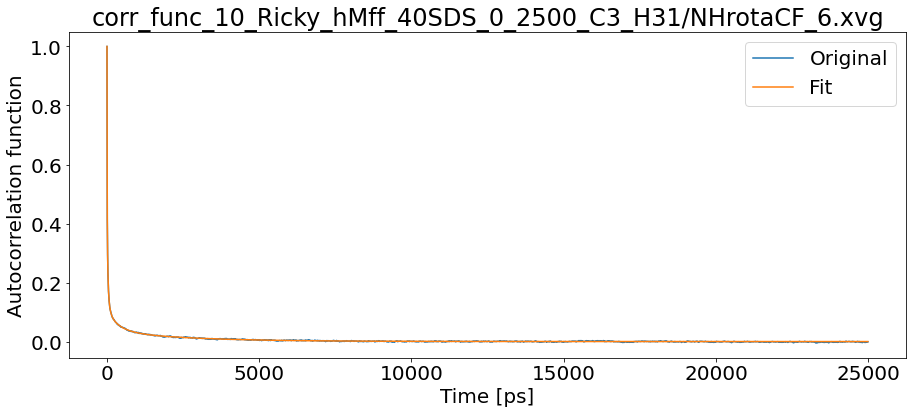

T1: 0.020660531290587838 T2: 0.019056504124356773 NOE: 0


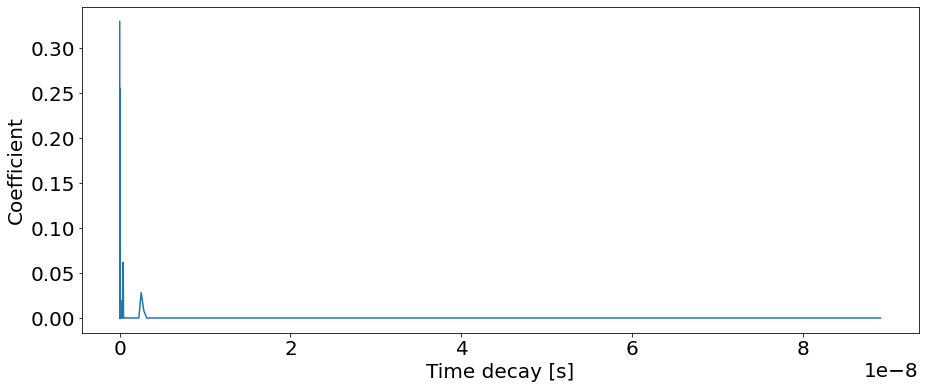

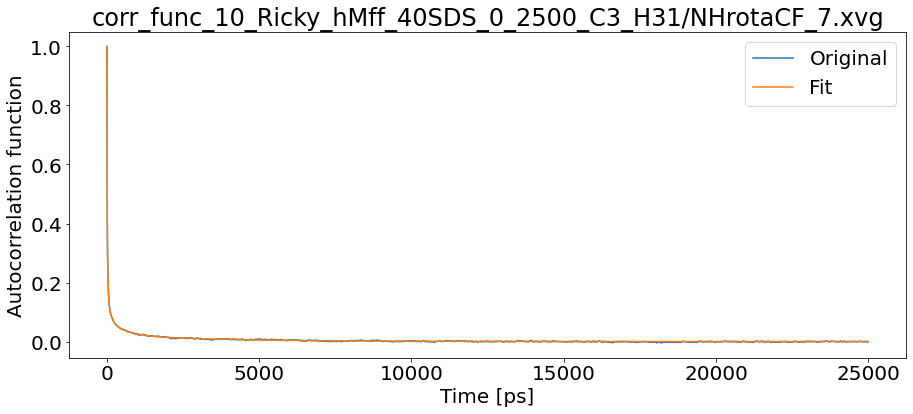

T1: 0.02322767406984952 T2: 0.020873416958775717 NOE: 0


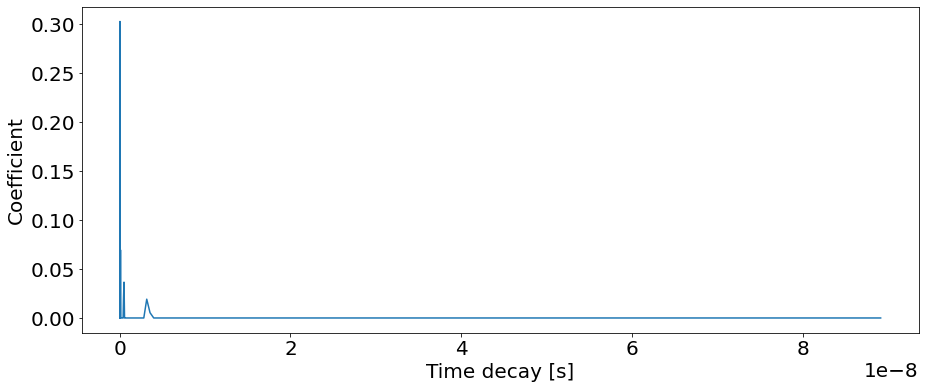

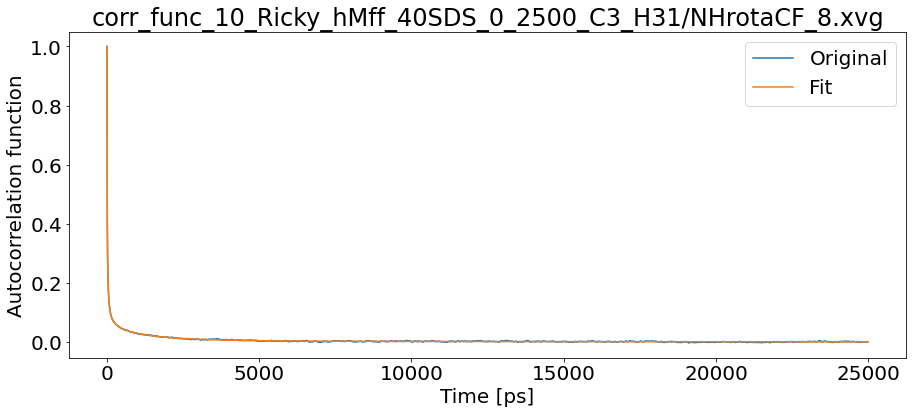

T1: 0.02376504334480216 T2: 0.019046875348391726 NOE: 0


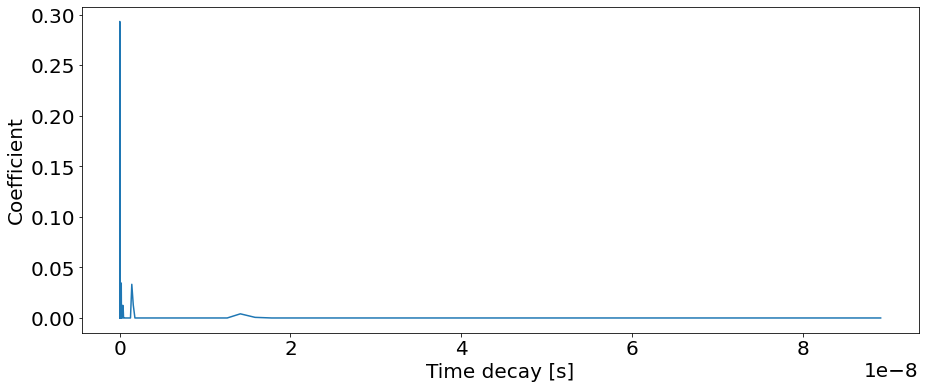

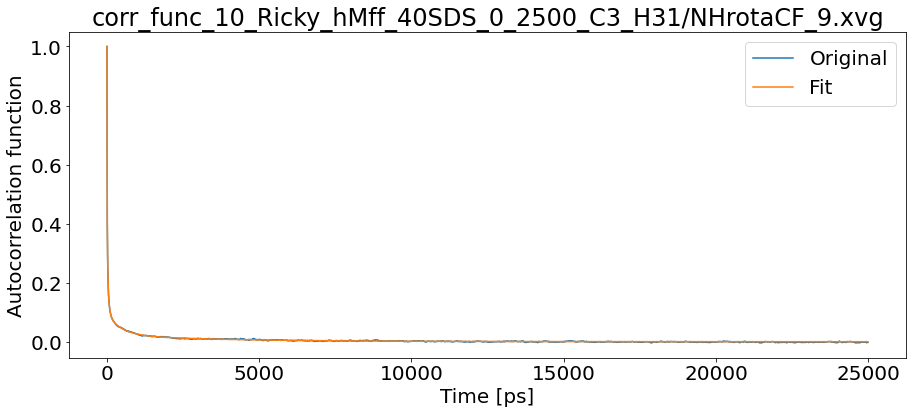

T1: 0.02266312210844121 T2: 0.019818919106500292 NOE: 0


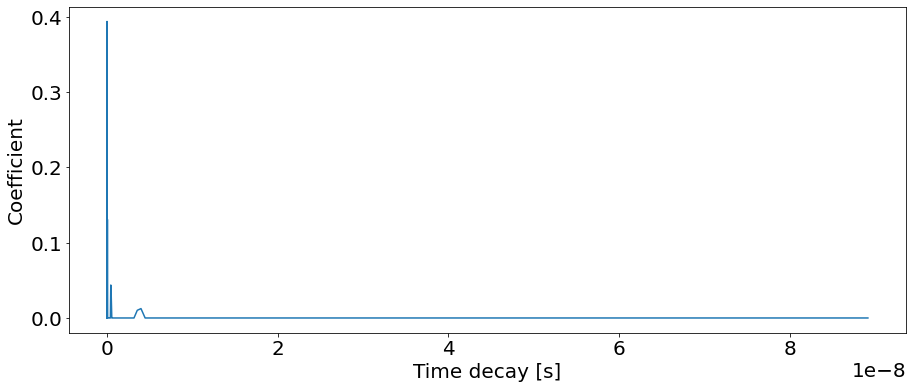

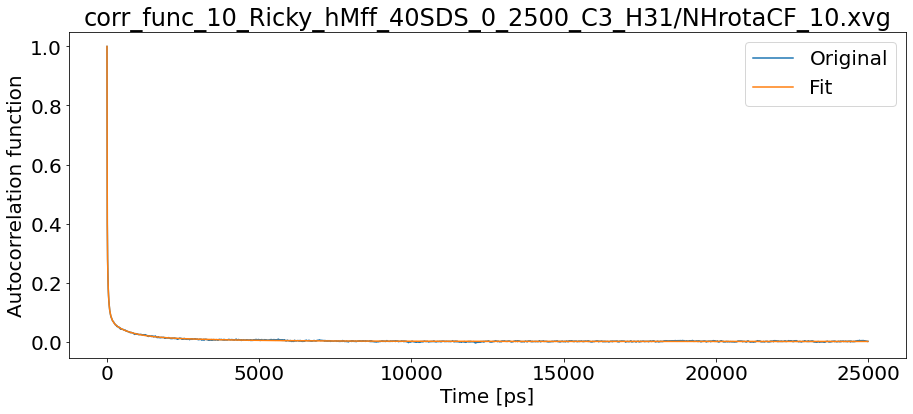

T1: 0.025209546204796006 T2: 0.020747383387523827 NOE: 0


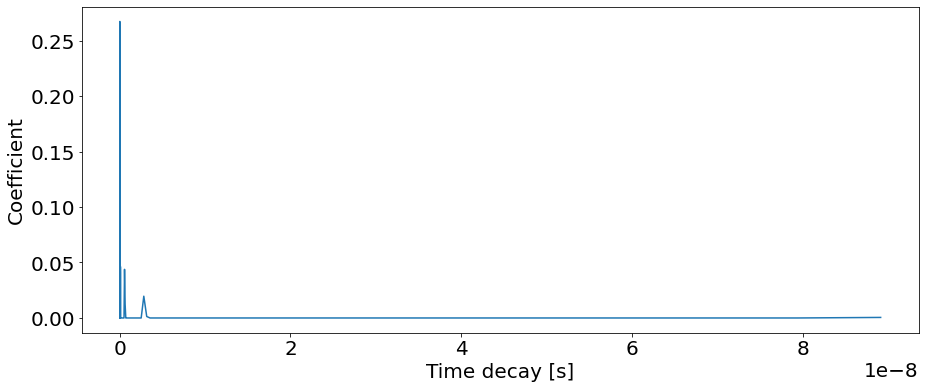

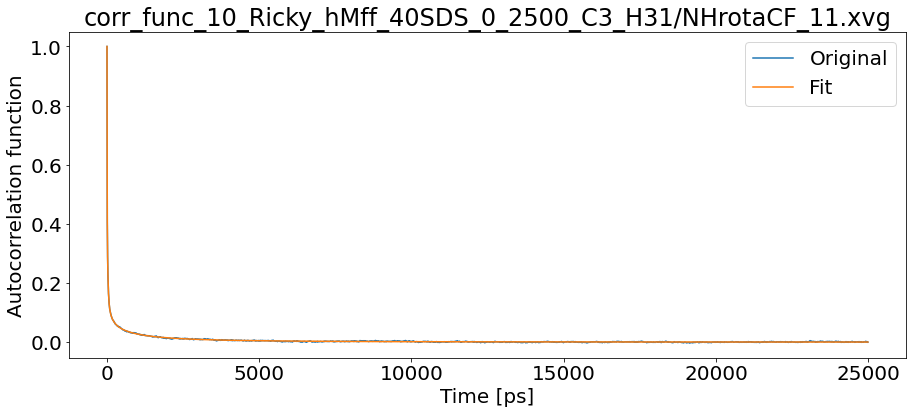

T1: 0.0233545375973117 T2: 0.018669304482141325 NOE: 0


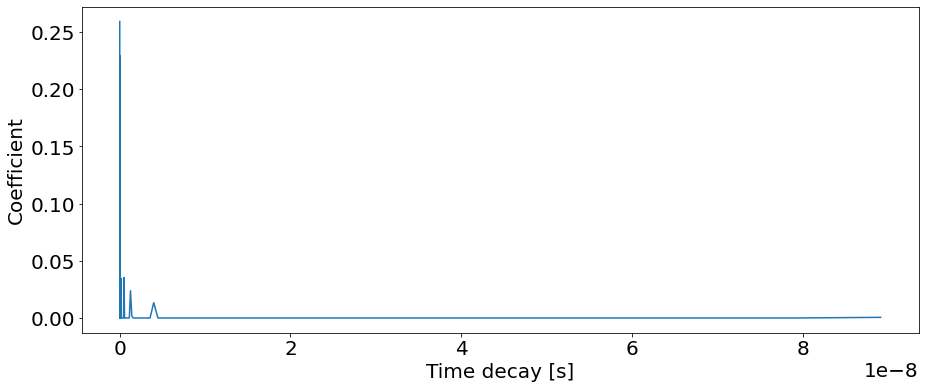

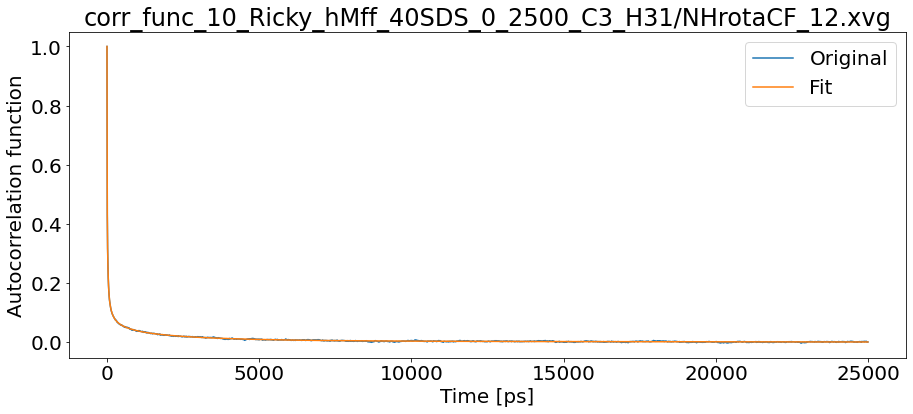

T1: 0.01745432213182672 T2: 0.013316508824275918 NOE: 0


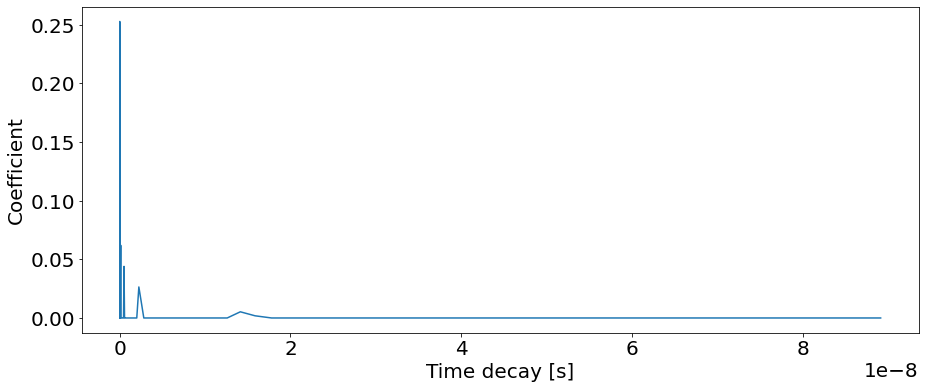

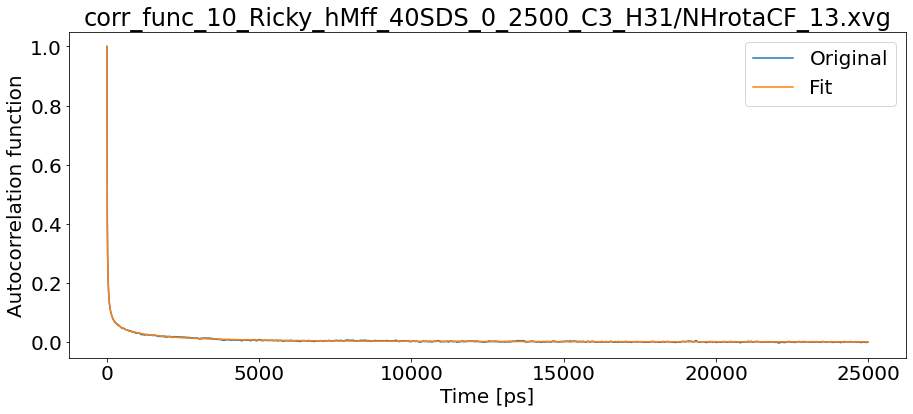

T1: 0.020934631709722207 T2: 0.017902894618443087 NOE: 0


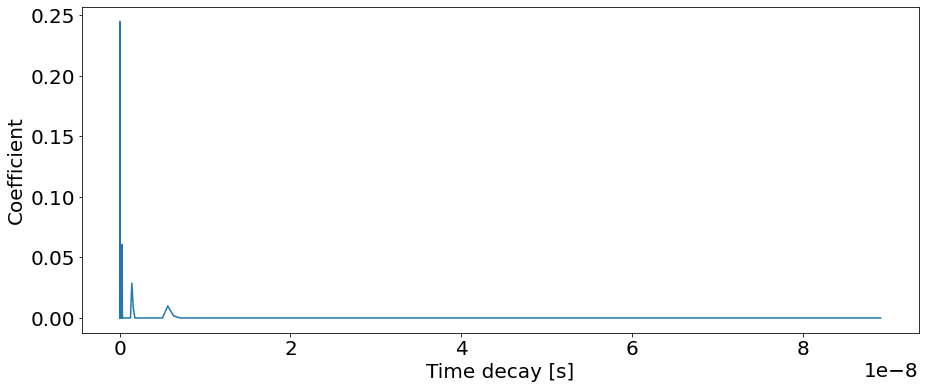

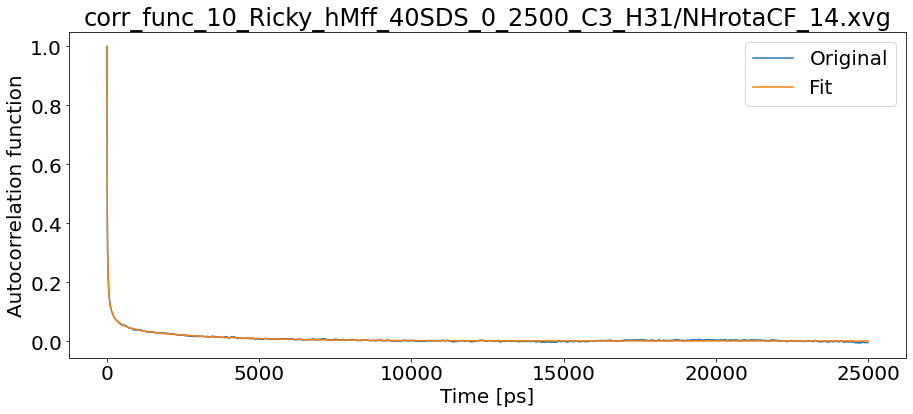

T1: 0.016641402469332413 T2: 0.011173427465065779 NOE: 0


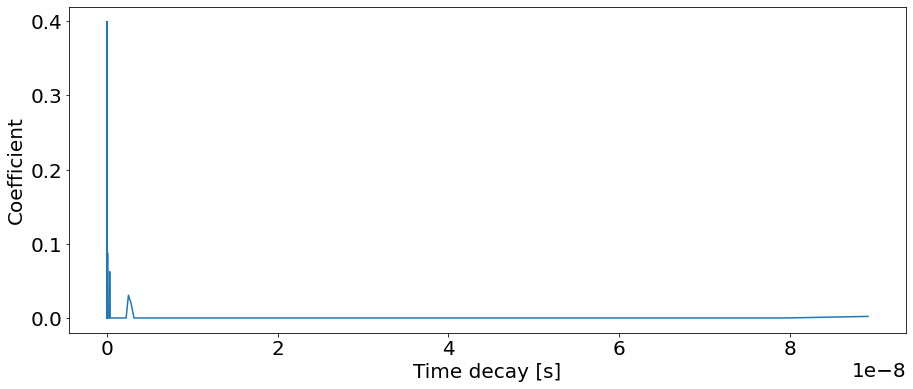

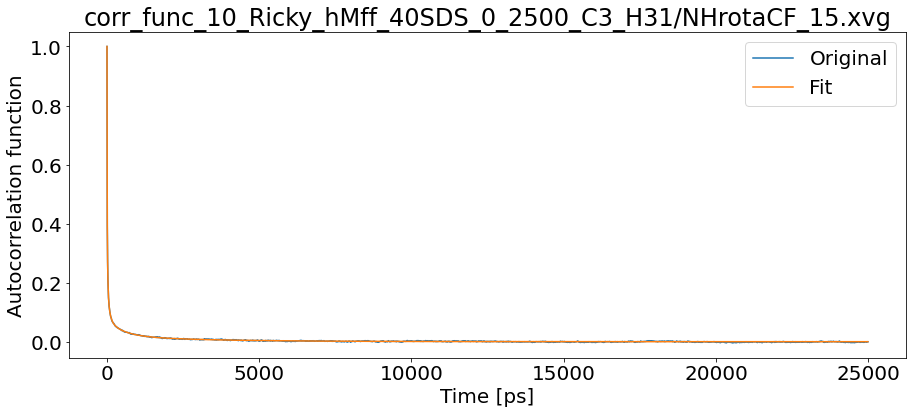

T1: 0.02626201876316893 T2: 0.024039345651363737 NOE: 0


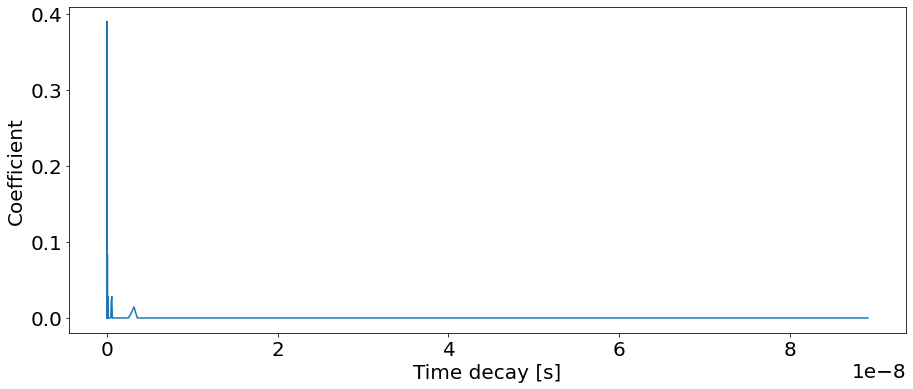

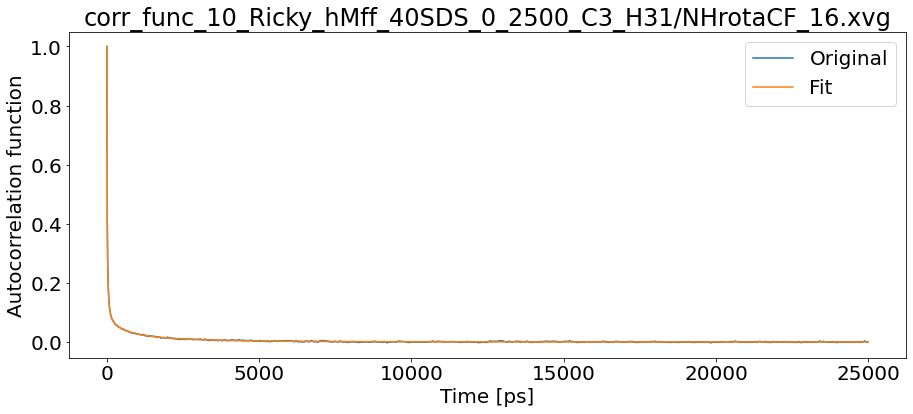

T1: 0.024083209881332744 T2: 0.02177756344812034 NOE: 0


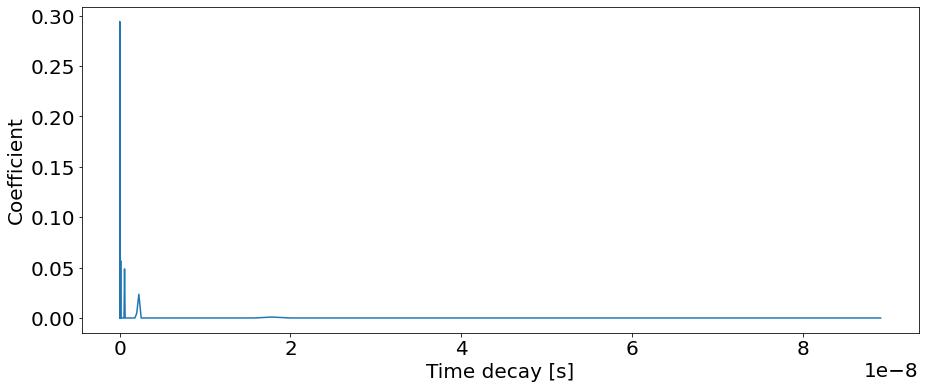

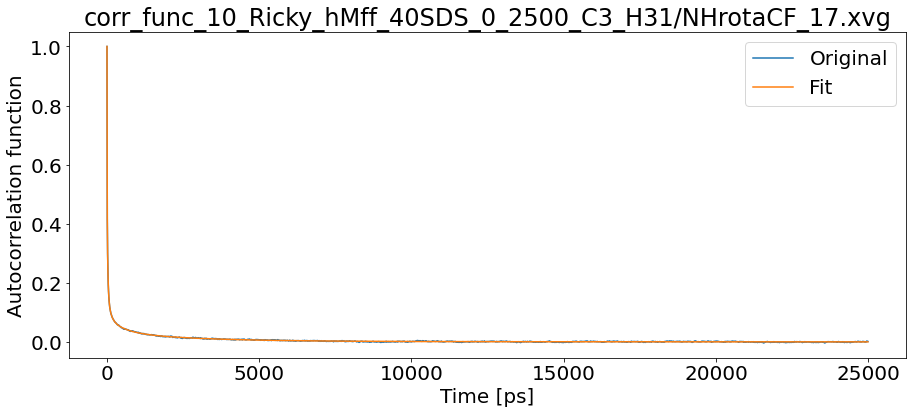

T1: 0.020272639384970224 T2: 0.016624991500043457 NOE: 0


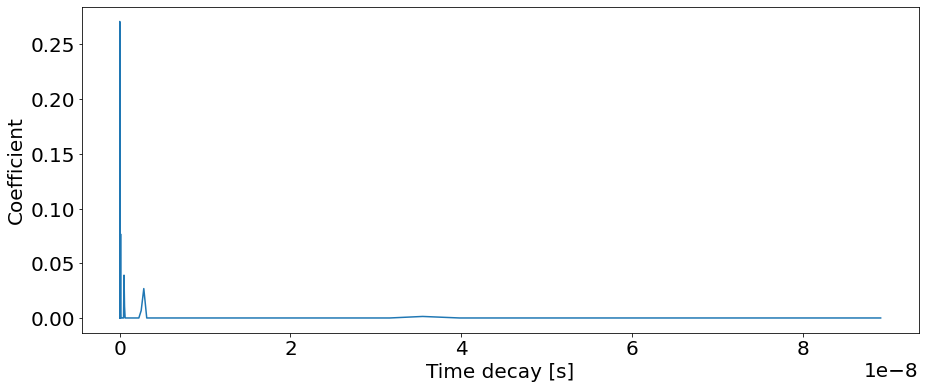

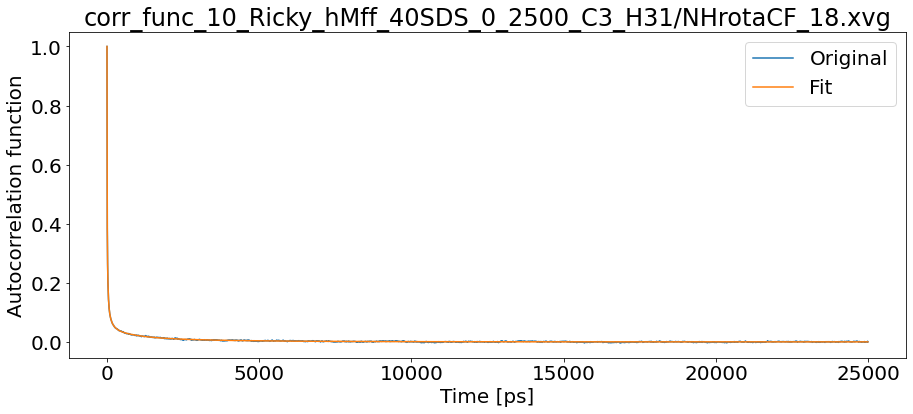

T1: 0.02806553602383242 T2: 0.025644628848473988 NOE: 0


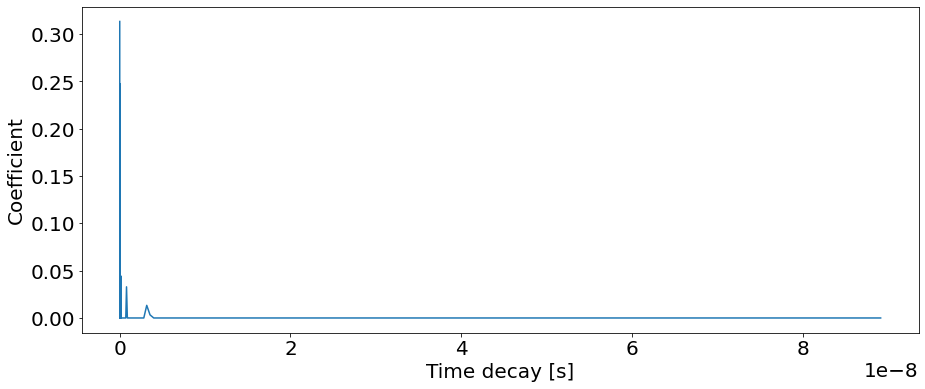

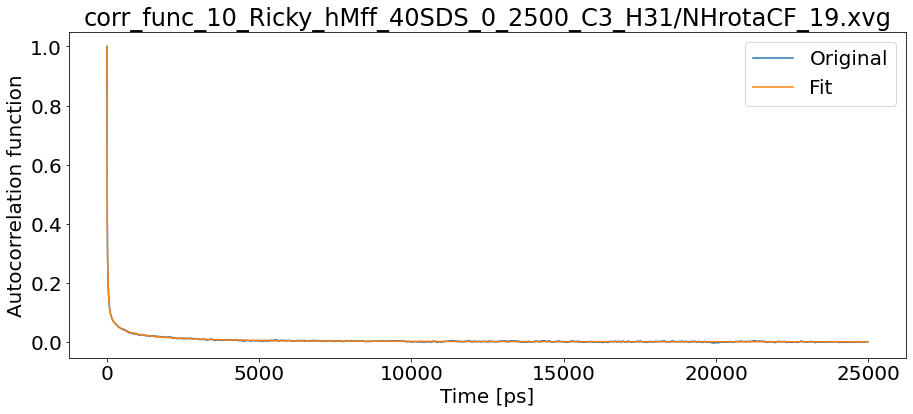

T1: 0.023877350043339417 T2: 0.0210696244208524 NOE: 0


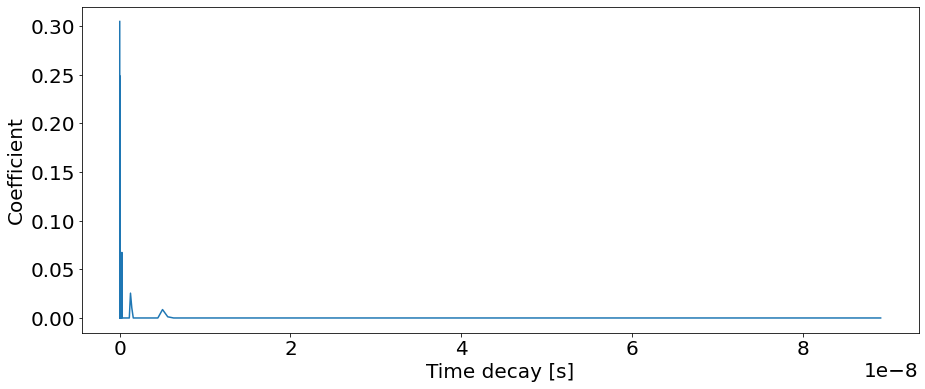

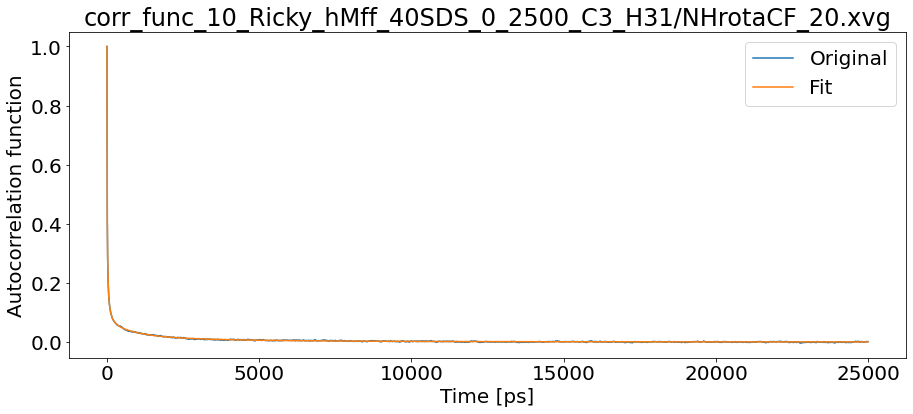

T1: 0.021117689525104705 T2: 0.01839330019086811 NOE: 0


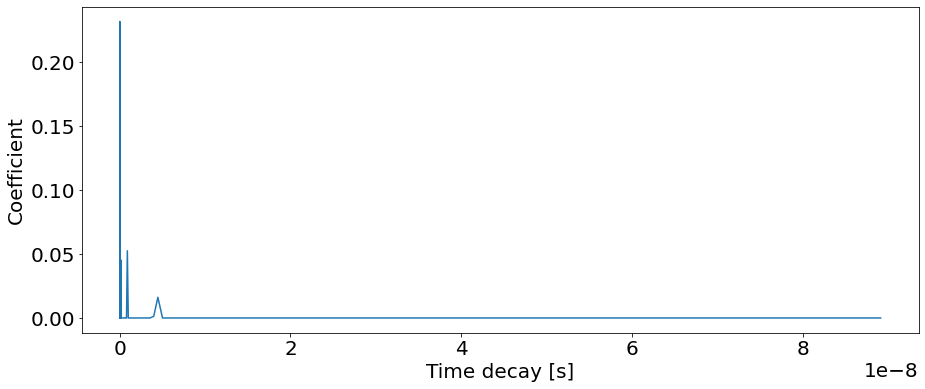

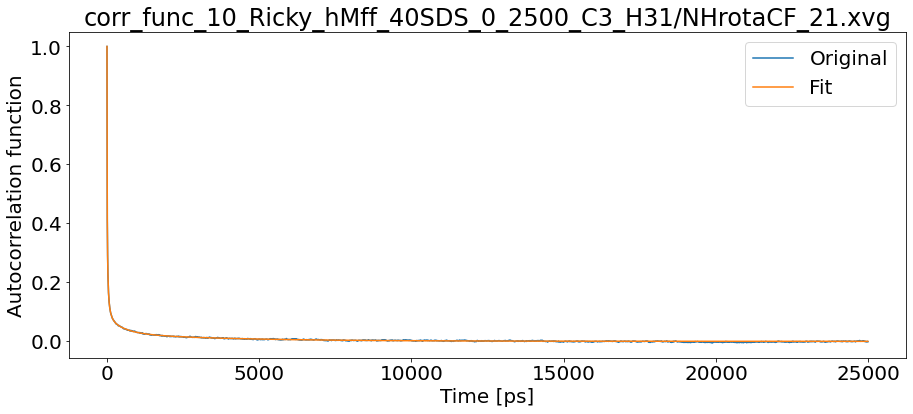

T1: 0.020078984852541247 T2: 0.017235555143534968 NOE: 0


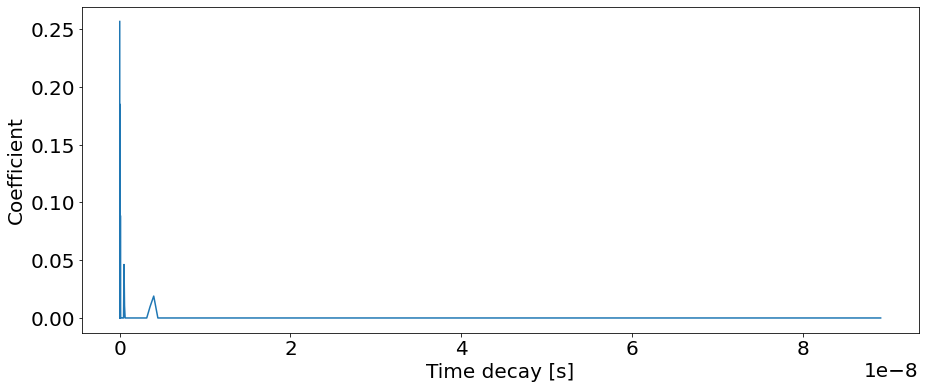

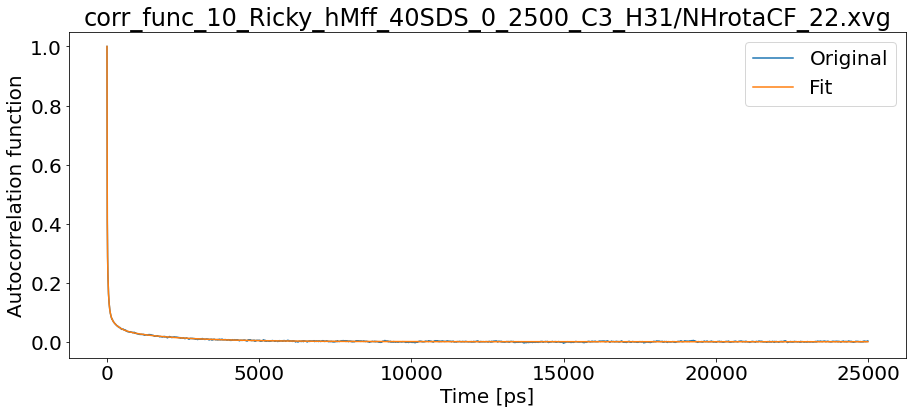

T1: 0.02280497765191237 T2: 0.018622227966352066 NOE: 0


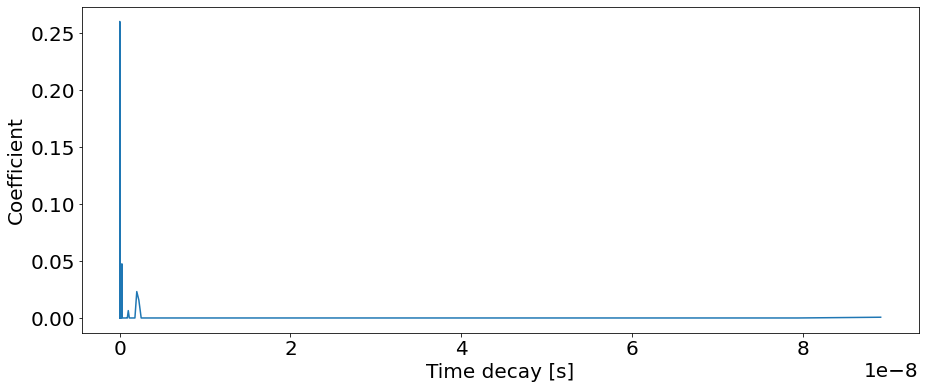

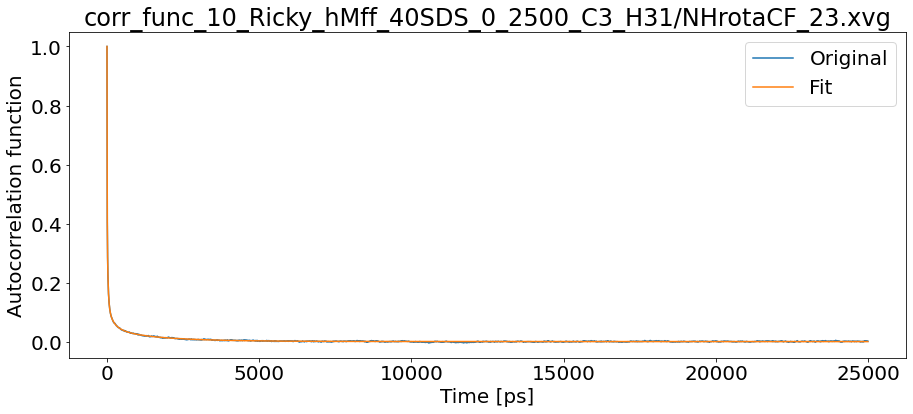

T1: 0.025903700508529217 T2: 0.01968755653073168 NOE: 0


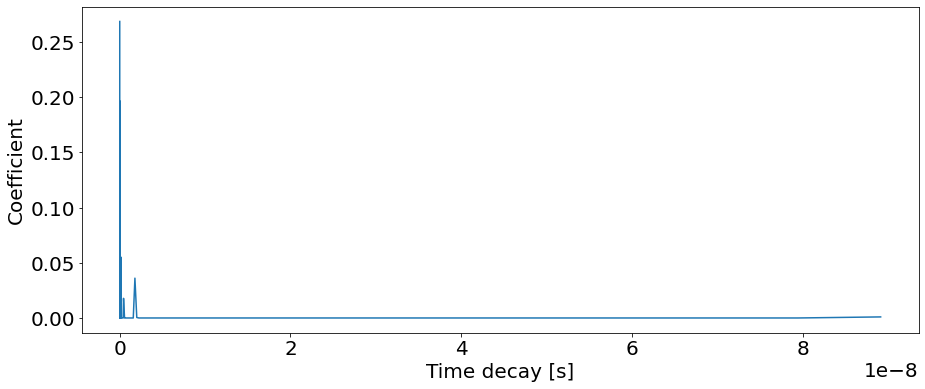

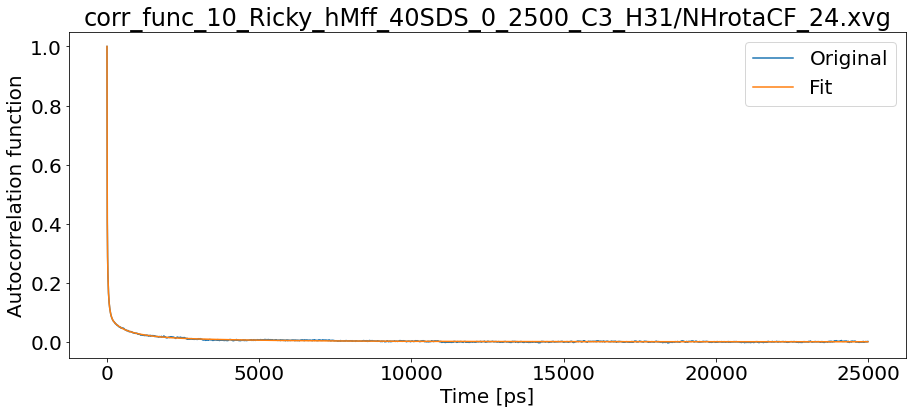

T1: 0.0226333028865456 T2: 0.020001548458833823 NOE: 0


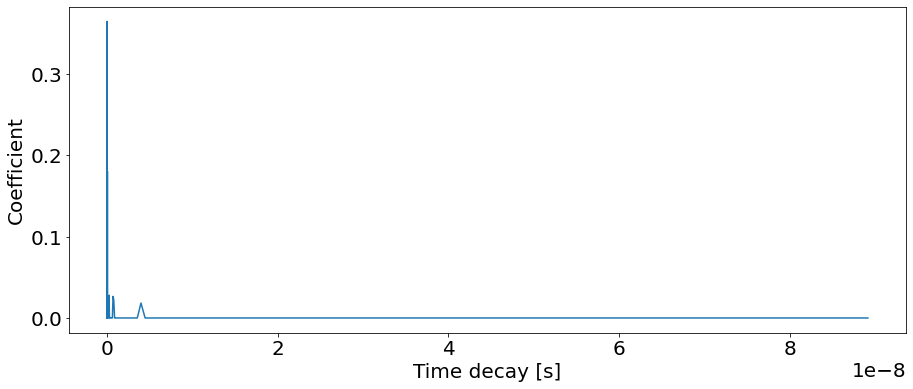

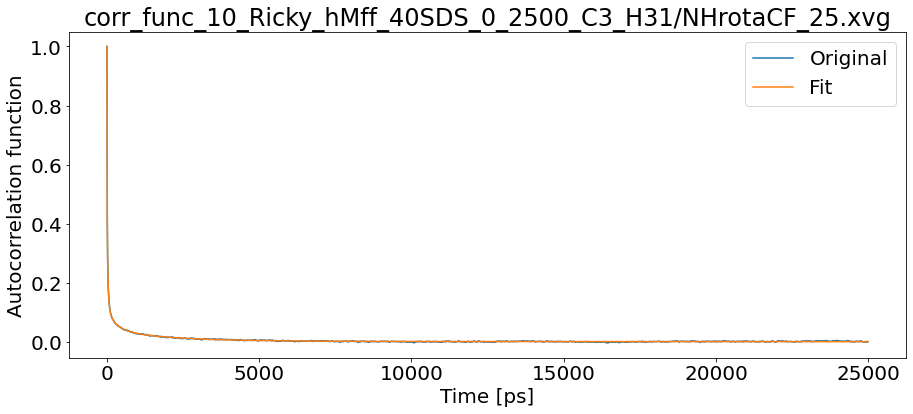

T1: 0.02303742730922957 T2: 0.01551224195520035 NOE: 0


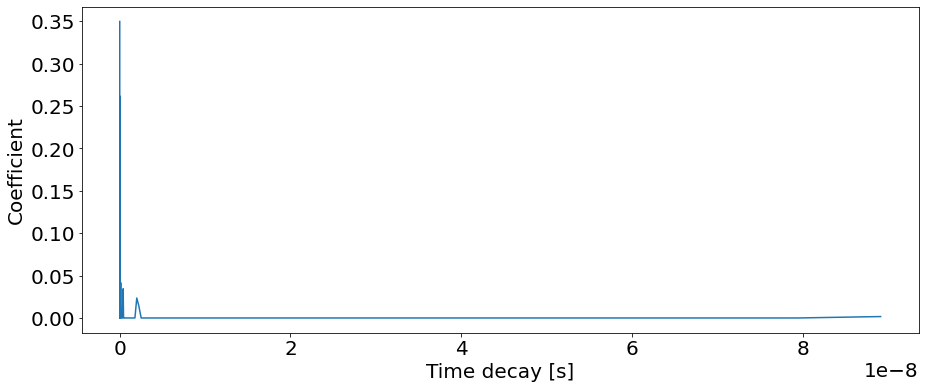

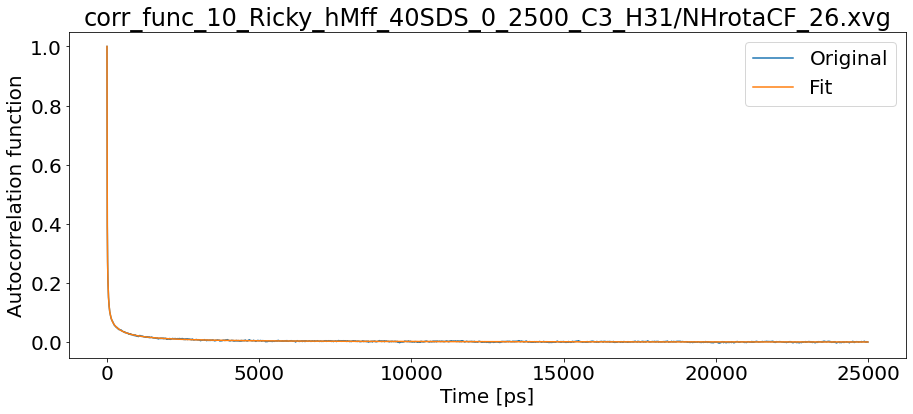

T1: 0.028087140422347275 T2: 0.023781865398990926 NOE: 0


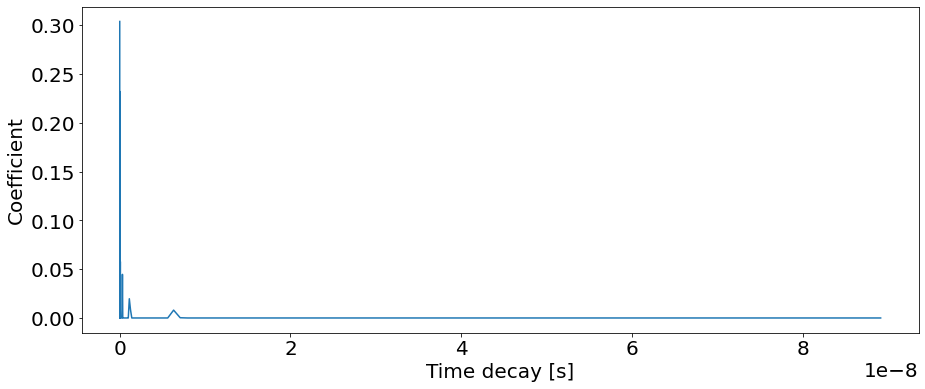

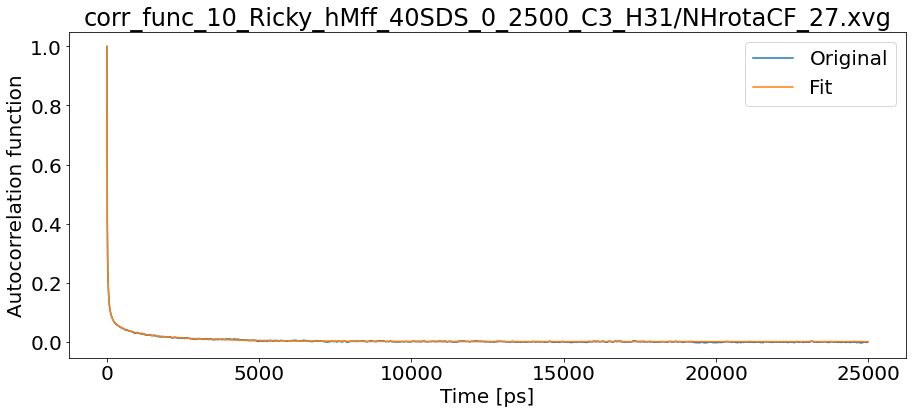

T1: 0.02218876521054758 T2: 0.02087195156253384 NOE: 0


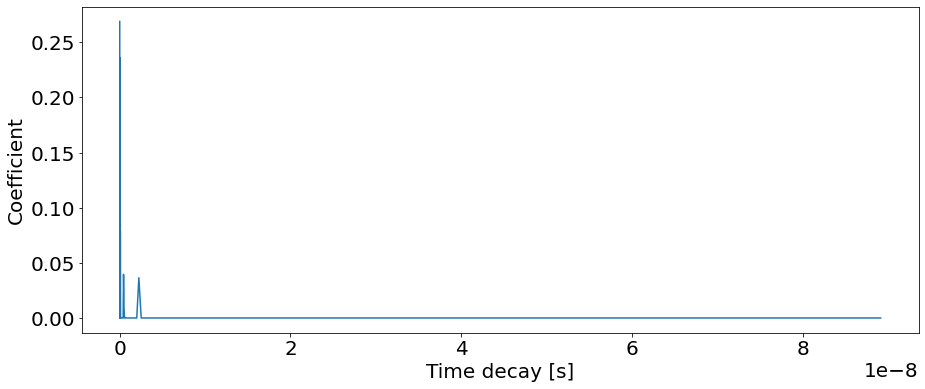

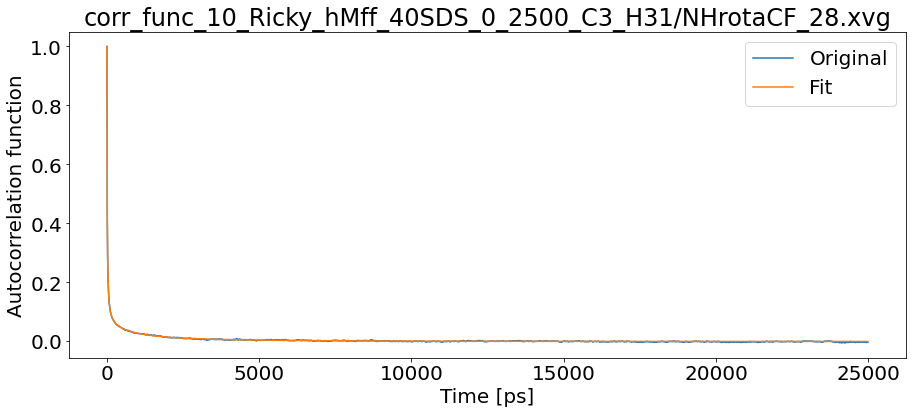

T1: 0.022695334252718795 T2: 0.02056345622645526 NOE: 0


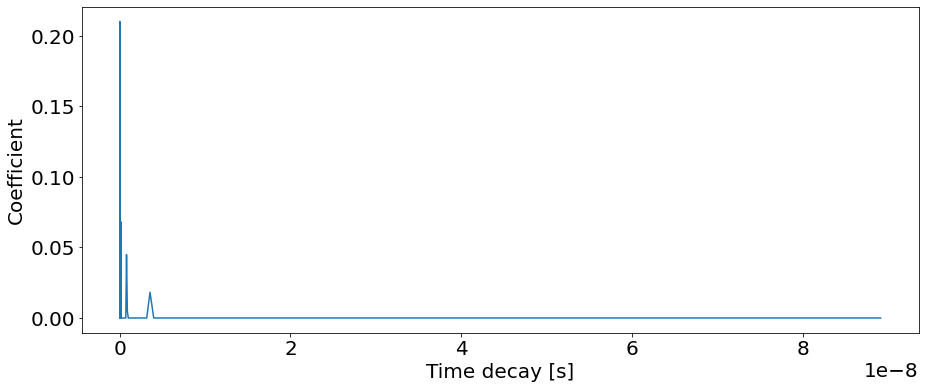

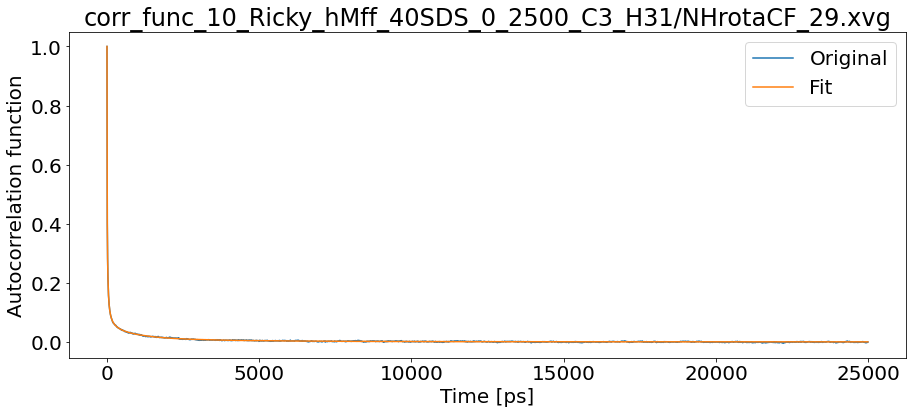

T1: 0.025051259426936135 T2: 0.022542589423557392 NOE: 0


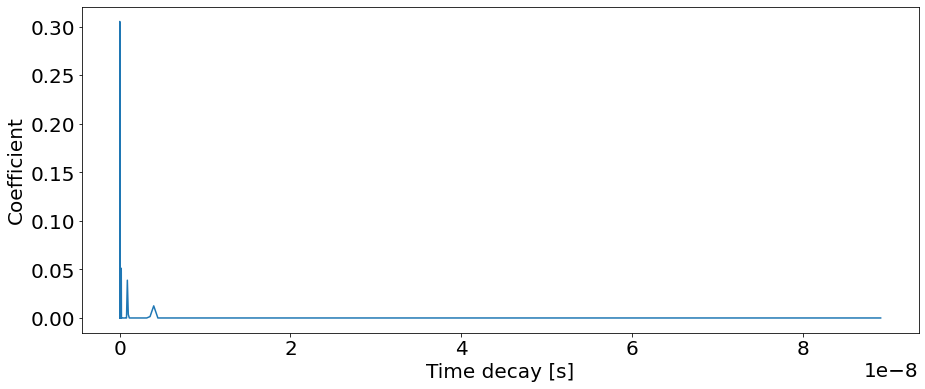

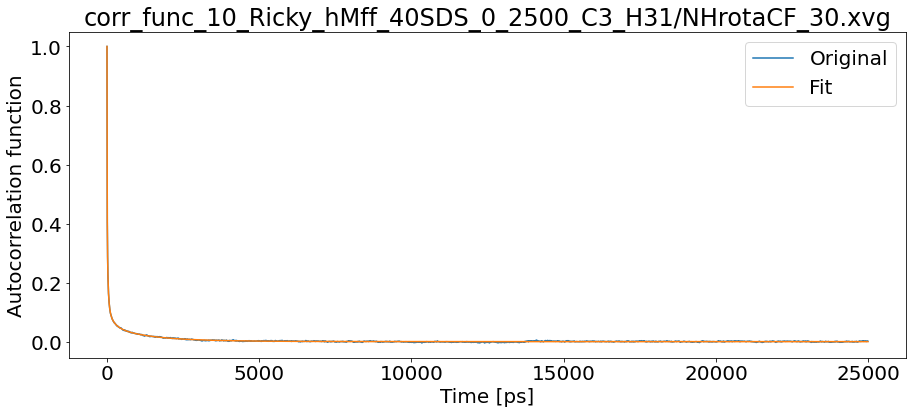

T1: 0.025716140780605024 T2: 0.022309656397970678 NOE: 0


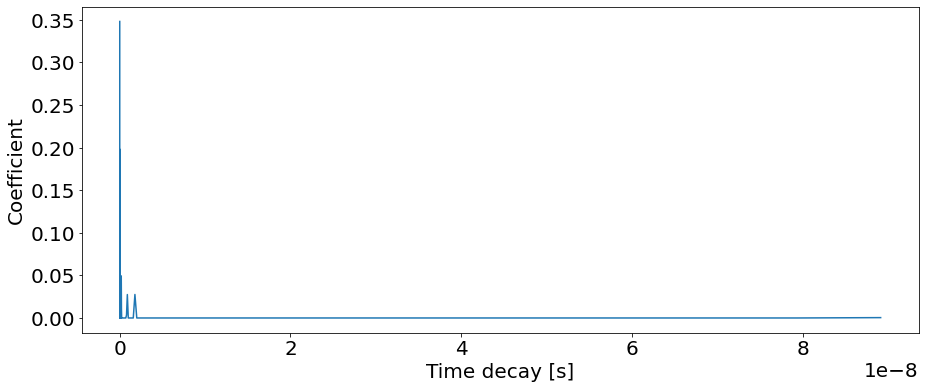

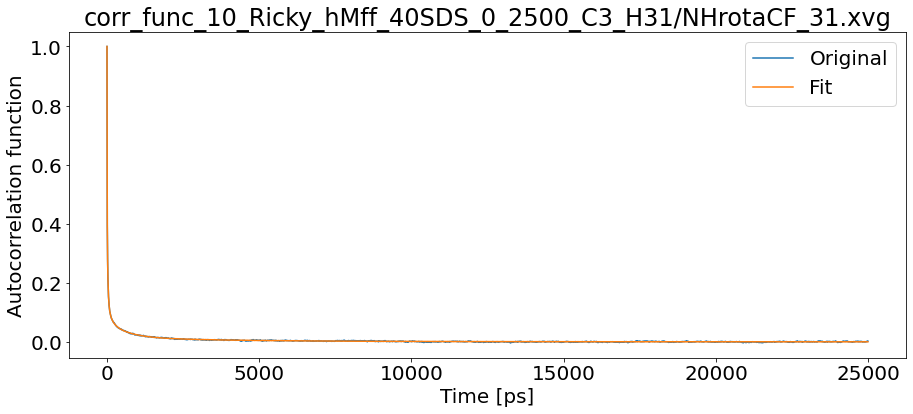

T1: 0.025639234108557656 T2: 0.022727620999572002 NOE: 0


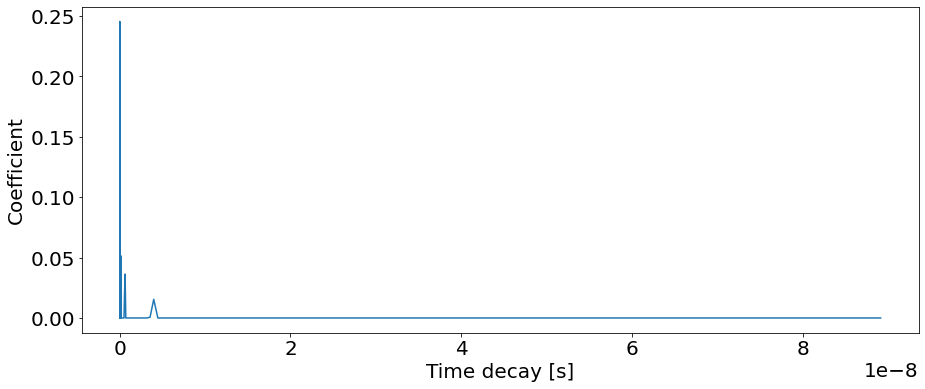

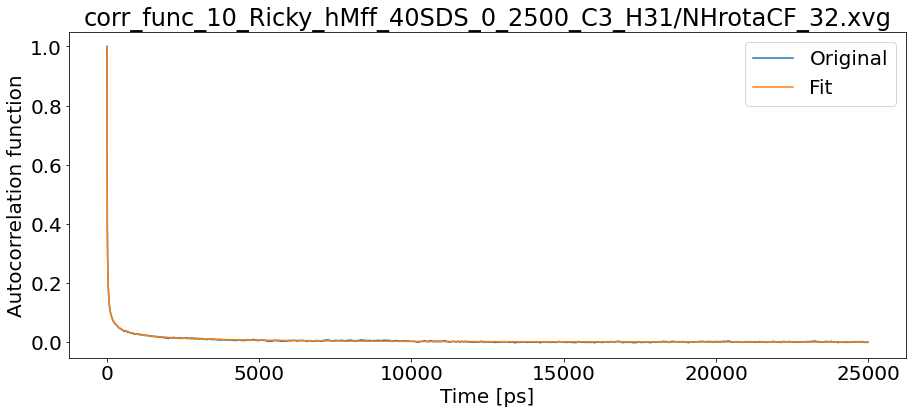

T1: 0.02278088383798924 T2: 0.019212455590197176 NOE: 0


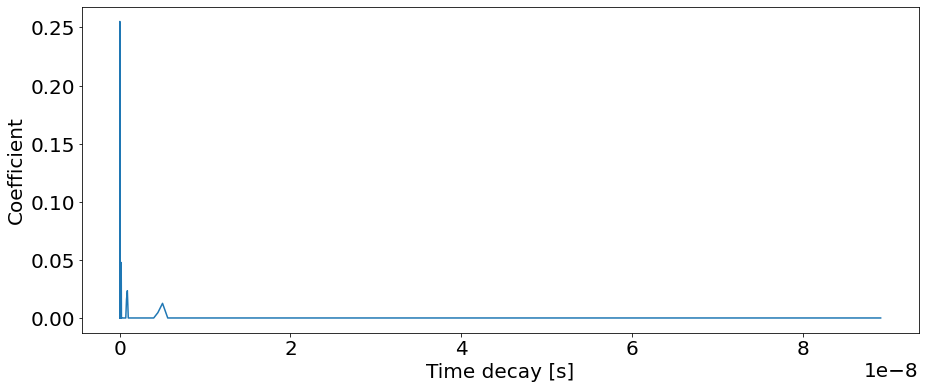

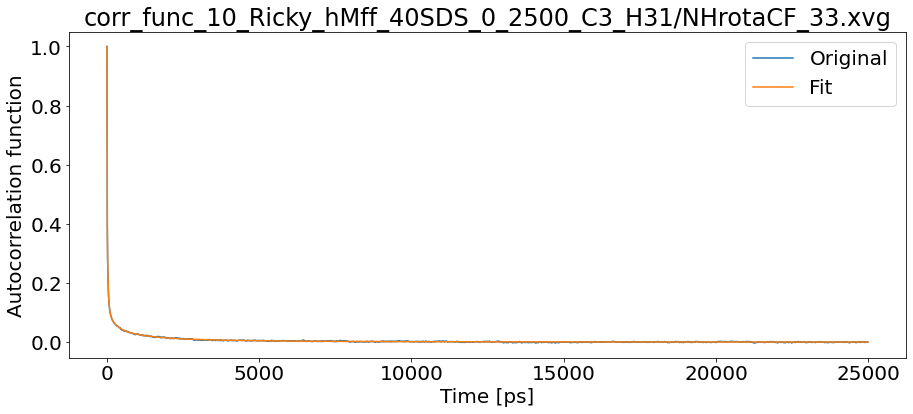

T1: 0.02411664473153344 T2: 0.0216685290287767 NOE: 0


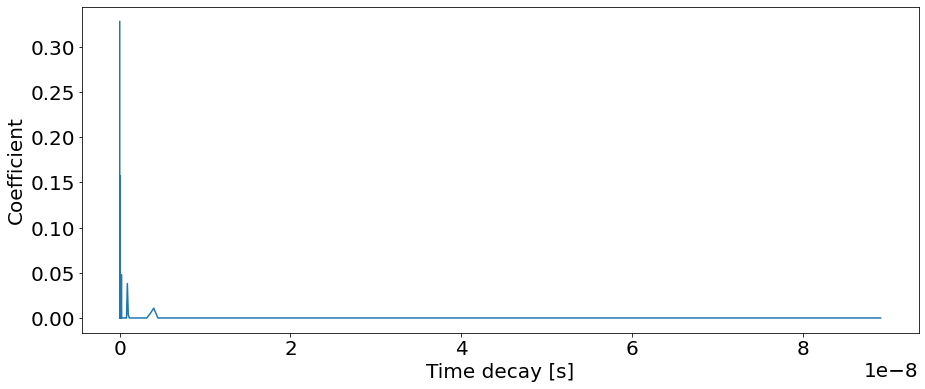

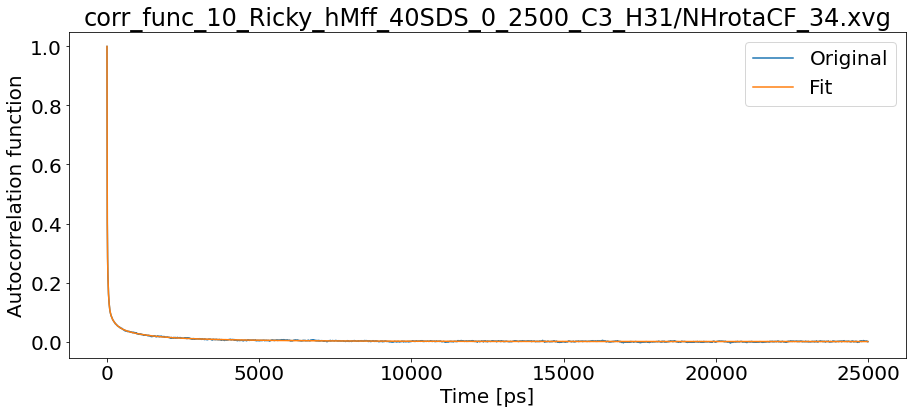

T1: 0.0234880201675006 T2: 0.02131440599695237 NOE: 0


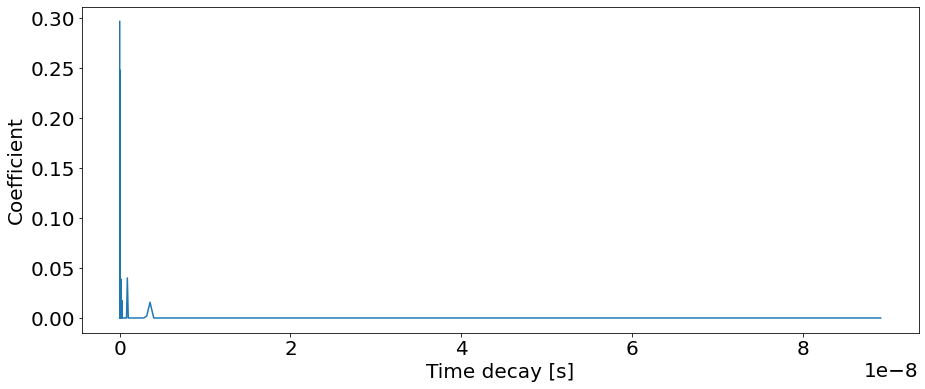

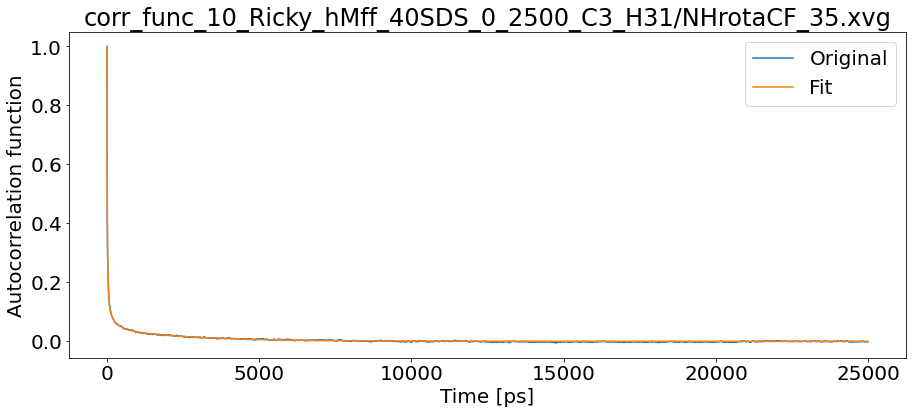

T1: 0.019327129466067145 T2: 0.017738697036933433 NOE: 0


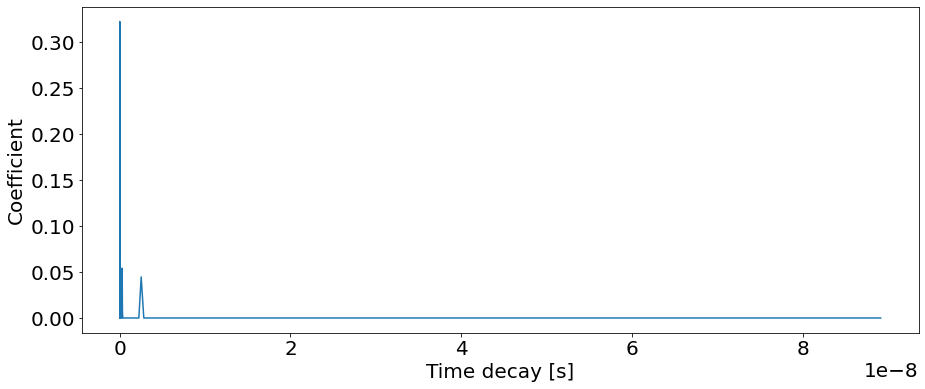

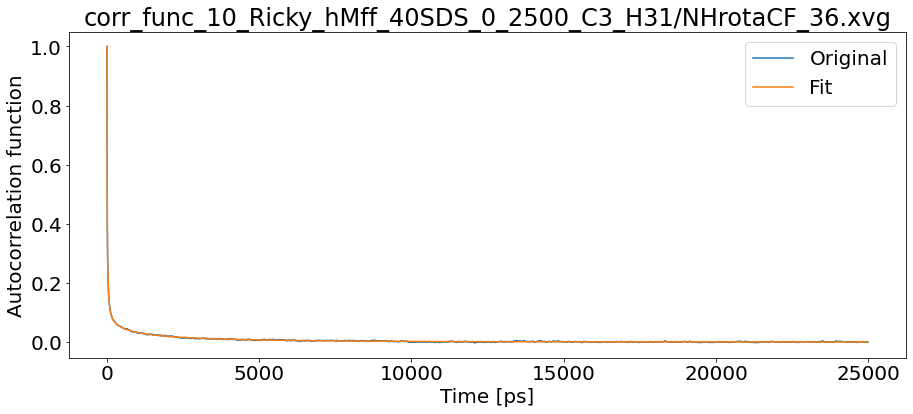

T1: 0.019679273536900403 T2: 0.01576660398348982 NOE: 0


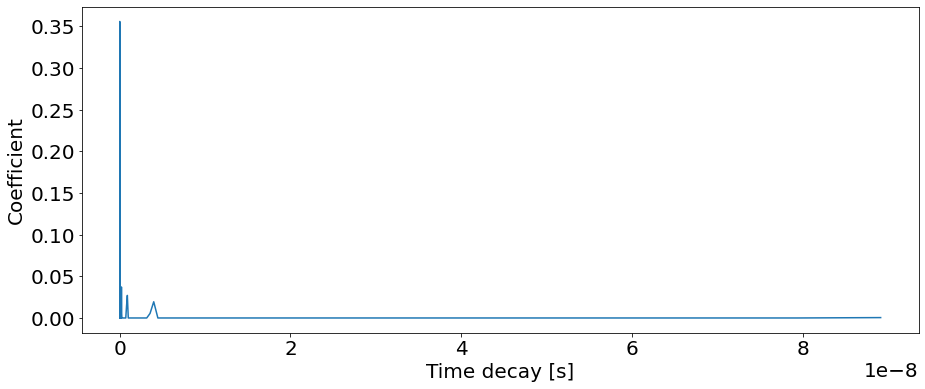

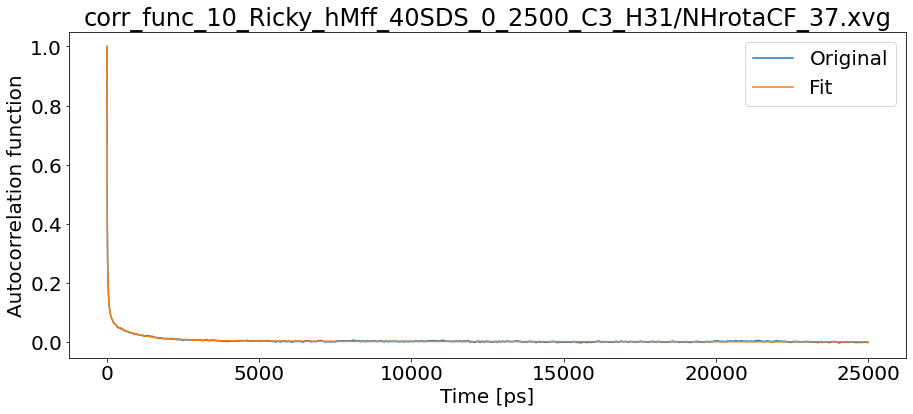

T1: 0.02752554454257997 T2: 0.023317966909880056 NOE: 0


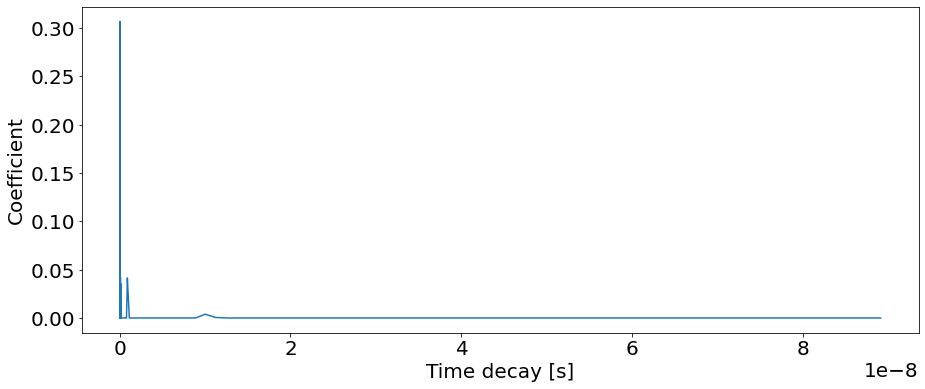

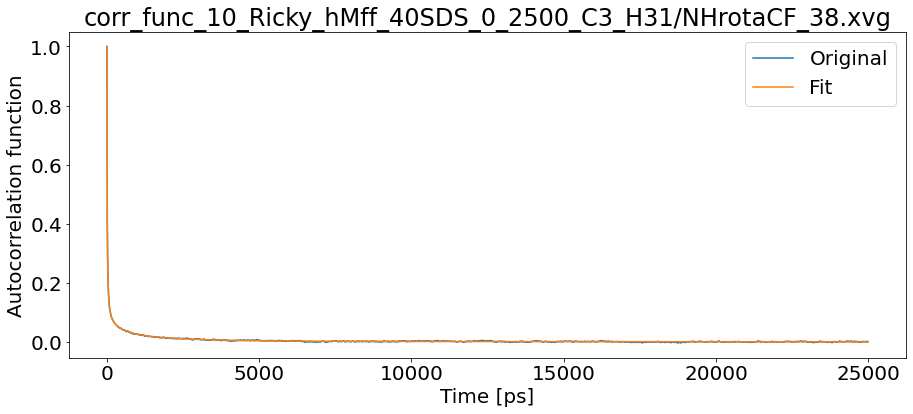

T1: 0.025274173428710325 T2: 0.018890432975426814 NOE: 0


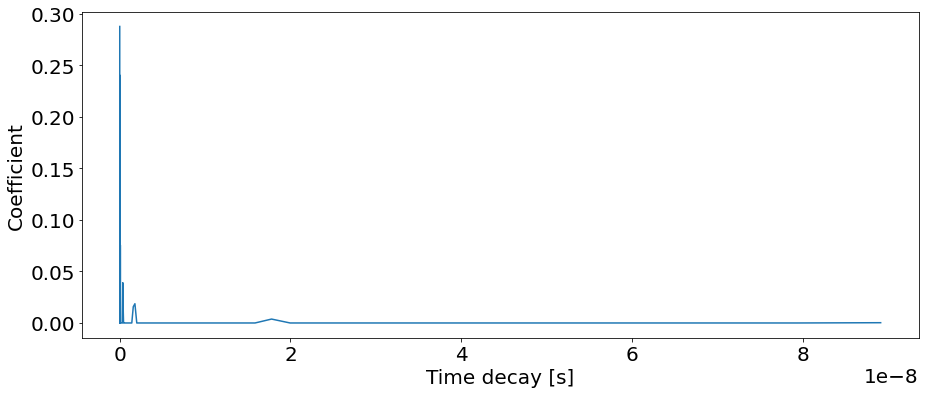

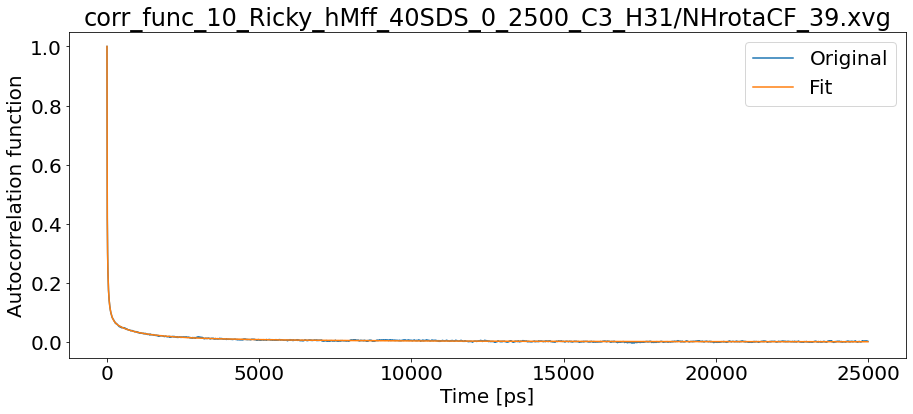

T1: 0.020384382441073608 T2: 0.01652057703165024 NOE: 0


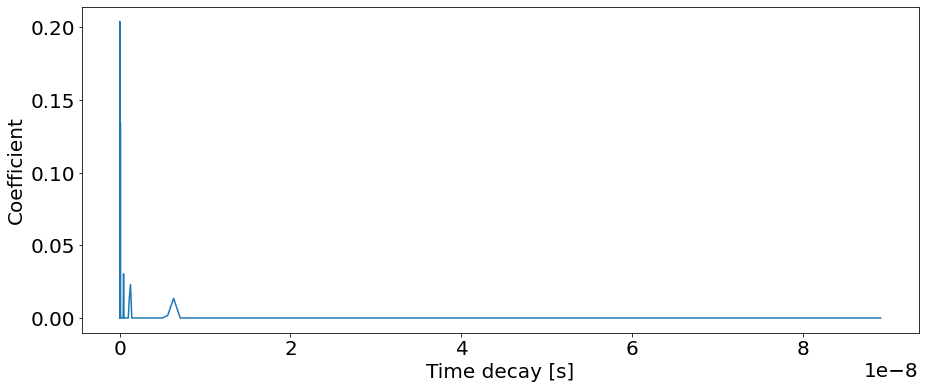

In [4]:
#2.8.2022 - try different lengths of the trajectory


"""Parameters to be specified by the user"""
OP=0 # order parameter
smallest_corr_time=0 # enter in log scale -3 fs; 0 ps; 3 ns; 6 us;
biggest_corr_time=5 # same as above
N_exp_to_fit=100 # number of exponential functions to be fitted between the samlles and biggest corr time
analyze=1/50 # the proportin of correlation data to be used for fitting, ex. 1/2 uses first half of the data
magnetic_field=2.35 # 5.99 # 8.49 T (values used in SDS paper, J.Chem. Soc.,, Faraday Trans. 1, 1988, 84(12), 4475-4486)
#magn_field=850
#magnetic_field=magn_field*2*np.pi/gammaH*10**6
nuclei="2H" #nuclei to calculate: 2H-deutherium; 13C - carbon; 15N - nitrogen 



##############3
## CHANGE IN THE CODE 6.4.2022, not going throught the whole content of the folder anymore
###############
take_all_in_folder="number" #"yes"/"no"/"number" analyze all in folder? useful for proteins, if no, fill the following line, if yes fill the folder path
input_corr_file="alphaCF.xvg"
input_prefix="NHrotaCF_" # mostly for peptides, works with take_all_in_folder="no"
residues=40


author_name="Ricky Nencini"


#hMff 40SDS
path="/home/nenciric/Documents/MD/simulations/22_hMff_micelle_40SDS_CHARMM_310K_Na_Neut_OPC_10_Ricky/"
grofile="10_Ricky_hMff_40SDS.gro"
xtcfile="10_Ricky_hMff_40SDS.xtc"
tprfile="10_Ricky_hMff_40SDS.tpr"


ends=[100000,200000,500000,1000000,1500000,2000000,2500000,-1]

ends=[2500000]

for end in ends:
    #for atom1, atom2 in [("C1","H11"),("C3","H31")]:
    #    rt.CalculateCorrelationFunctions(path,begin,end,RM_avail,grofile,xtcfile,tprfile,atom1,atom2,moleculeType)

    file_to_copy= "corr_func"+ "_"  +   grofile[:-4] + "_" + str(int(begin/1000)) + "_" + str(int(end/1000)) + "_" + str(atom1) + "_" + str(atom2)+"/NHrotaCF_0.xvg"
    copy_to = "corr_func"+ "_"  +   grofile[:-4] + "_" + str(int(begin/1000)) + "_" + str(int(end/1000)) + "_C1_H11/NHrotaCF_1.xvg"
    #os.system("cp " + file_to_copy + " " + copy_to)

    folder_path="corr_func"+ "_"  +   grofile[:-4] + "_" + str(int(begin/1000)) + "_" + str(int(end/1000)) + "_C3_H31/"
    output_name="hMff_40SDS_micelle_SDS_relax_coef_0_"+str(end)+"_030822_gamma.out"


    if take_all_in_folder=="yes":
        for file in os.listdir(folder_path):
            input_corr_file = folder_path+os.fsdecode(file)
            rt.GetRelaxationData(OP,smallest_corr_time, biggest_corr_time, N_exp_to_fit,analyze,magnetic_field,input_corr_file,nuclei,output_name)
    elif take_all_in_folder=="number":
        step_exp=(biggest_corr_time-smallest_corr_time)/N_exp_to_fit
        Ctimes = 10 ** np.arange(smallest_corr_time, biggest_corr_time, step_exp)
        Ctimes = Ctimes * 0.001 * 10 ** (-9);
        Ctimes_to_save=np.zeros([len(Ctimes),residues+1])
        Ctimes_to_save[:,0]=Ctimes
        for i in range(0,residues):
            input_corr_file = folder_path+input_prefix+str(i)+".xvg"
            AA=rt.GetRelaxationData(OP,smallest_corr_time, biggest_corr_time, N_exp_to_fit,analyze,magnetic_field,input_corr_file,nuclei,output_name)
            Ctimes_to_save[:,i+1]=AA.Coeffs
    else:
        rt.GetRelaxationData(OP,smallest_corr_time, biggest_corr_time, N_exp_to_fit,analyze,magnetic_field,input_corr_file,nuclei,output_name)
    
    np.savetxt(output_name,Ctimes_to_save)
    
    
    

   

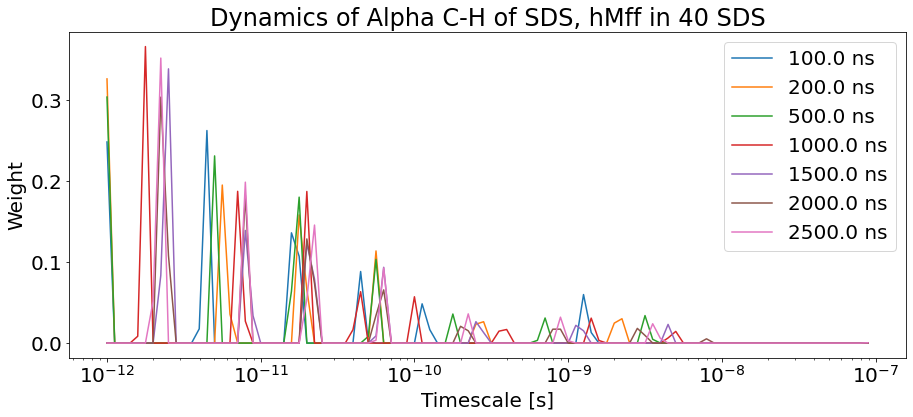

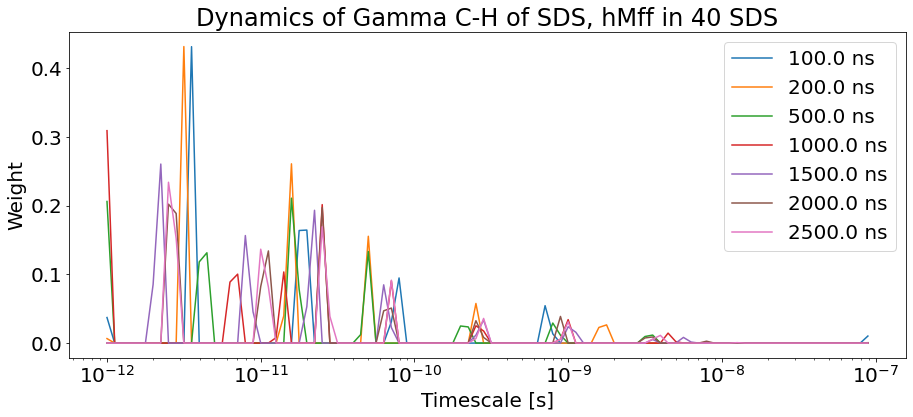

In [38]:
ends=[100000,200000,500000,1000000,1500000,2000000,2500000]
plt.figure(figsize=(15, 6))
plt.rcParams.update({'font.size': 20})
plt.xscale('log')

coef=100

for end in ends:
    output_name="hMff_40SDS_micelle_SDS_relax_coef_0_"+str(end)+"_020822.out"
    coefficients=np.loadtxt(output_name)
    plt.plot(coefficients[:coef,0],coefficients[:coef,1],label=str(end/1000)+" ns")
    
plt.xlabel("Timescale [s]")
plt.ylabel("Weight")
plt.title("Dynamics of Alpha C-H of SDS, hMff in 40 SDS")
plt.legend()
plt.show()

plt.figure(figsize=(15, 6))
plt.rcParams.update({'font.size': 20})
plt.xscale('log')

for end in ends:
    output_name="hMff_40SDS_micelle_SDS_relax_coef_0_"+str(end)+"_020822.out"
    coefficients=np.loadtxt(output_name)
    plt.plot(coefficients[:coef,0],coefficients[:coef,2],label=str(end/1000)+" ns")
    
plt.xlabel("Timescale [s]")
plt.ylabel("Weight")
plt.title("Dynamics of Gamma C-H of SDS, hMff in 40 SDS")
plt.legend()
plt.show()

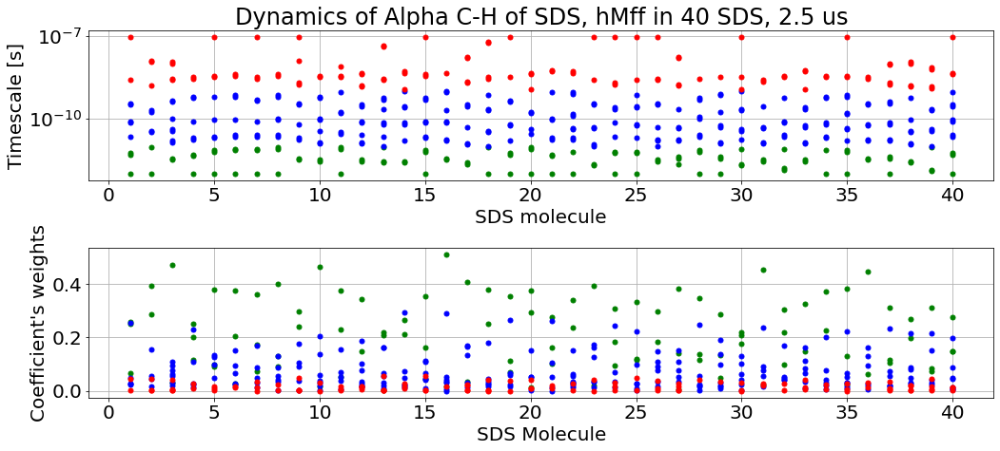

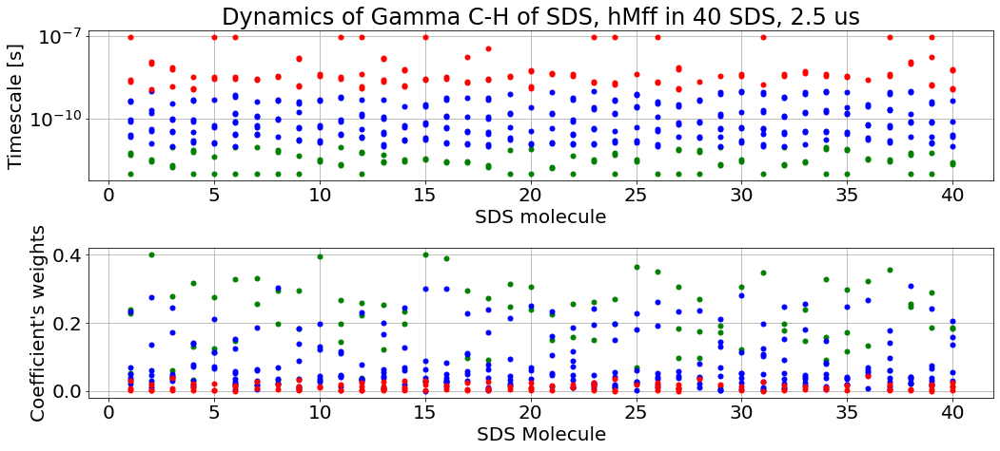

In [33]:
# 3.8.2022 - plot 40 SDS, hMff for diferent lengts of trajectories + individual molecules

Ctimes_to_save=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_2500000_030822_alpha.out")

plt.rcParams["figure.figsize"] = [15.00, 7]
plt.rcParams["figure.autolayout"] = True



fig, (ax1, ax2) = plt.subplots(2)

ax1.title.set_text("Dynamics of Alpha C-H of SDS, hMff in 40 SDS, 2.5 us")

ax1.grid()
ax1.set_yscale('log')
ax1.set_ylabel("Timescale [s]")
ax1.set_xlabel("SDS molecule")
#ax1.set_ylim([10**(-12.4), 10**(-6.8)])


for residue in range(1,Ctimes_to_save.shape[1]):
    for timescale in range(0,Ctimes_to_save.shape[0]):
        #print("{} {} \n".format(i, j))
        if Ctimes_to_save[timescale,residue]>0:
            if Ctimes_to_save[timescale,0]>10**(-9):
                ax1.plot(residue, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
            elif Ctimes_to_save[timescale,0]>10**(-11):
                ax1.plot(residue, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
            else:
                ax1.plot(residue, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                   
       
    

ax2.grid()

ax2.set_ylabel("Coefficient's weights")
ax2.set_xlabel("SDS Molecule")


for residue in range(1,Ctimes_to_save.shape[1]):
    for timescale in range(0,Ctimes_to_save.shape[0]):
        #print("{} {} \n".format(i, j))
        if Ctimes_to_save[timescale,residue]>0:
            if Ctimes_to_save[timescale,0]>10**(-9):
                ax2.plot(residue, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
            elif Ctimes_to_save[timescale,0]>10**(-11):
                ax2.plot(residue, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
            else:
                ax2.plot(residue, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                     
        
plt.show()    


Ctimes_to_save=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_2500000_030822_gamma.out")


plt.rcParams["figure.figsize"] = [15.00, 7]
plt.rcParams["figure.autolayout"] = True



fig, (ax1, ax2) = plt.subplots(2)

ax1.title.set_text("Dynamics of Gamma C-H of SDS, hMff in 40 SDS, 2.5 us")

ax1.grid()
ax1.set_yscale('log')
ax1.set_ylabel("Timescale [s]")
ax1.set_xlabel("SDS molecule")
#ax1.set_ylim([10**(-12.4), 10**(-6.8)])


for residue in range(1,Ctimes_to_save.shape[1]):
    for timescale in range(0,Ctimes_to_save.shape[0]):
        #print("{} {} \n".format(i, j))
        if Ctimes_to_save[timescale,residue]>0:
            if Ctimes_to_save[timescale,0]>10**(-9):
                ax1.plot(residue, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
            elif Ctimes_to_save[timescale,0]>10**(-11):
                ax1.plot(residue, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
            else:
                ax1.plot(residue, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                   
       
    

ax2.grid()

ax2.set_ylabel("Coefficient's weights")
ax2.set_xlabel("SDS Molecule")


for residue in range(1,Ctimes_to_save.shape[1]):
    for timescale in range(0,Ctimes_to_save.shape[0]):
        #print("{} {} \n".format(i, j))
        if Ctimes_to_save[timescale,residue]>0:
            if Ctimes_to_save[timescale,0]>10**(-9):
                ax2.plot(residue, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
            elif Ctimes_to_save[timescale,0]>10**(-11):
                ax2.plot(residue, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
            else:
                ax2.plot(residue, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                     
        
plt.show() 




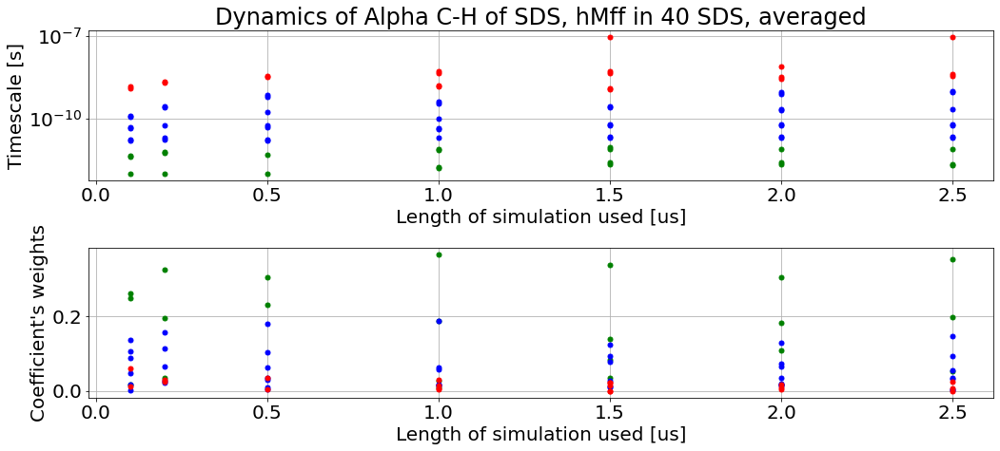

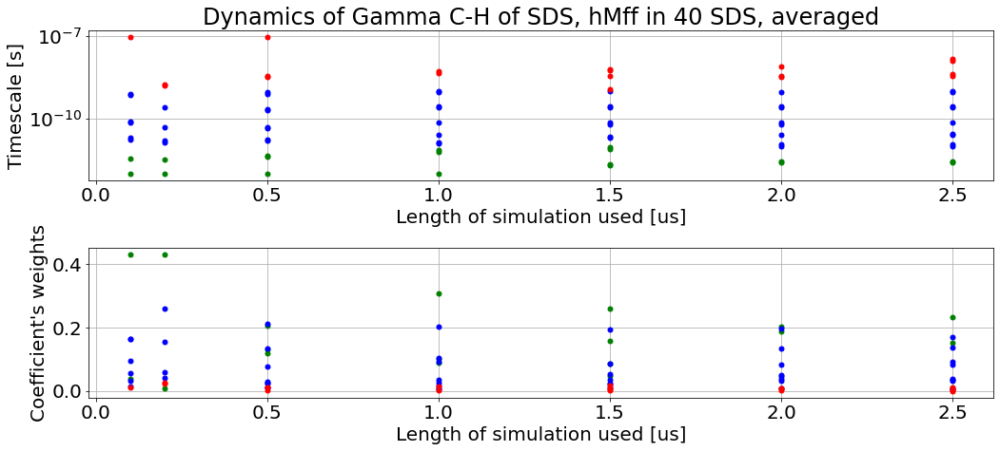

In [34]:
Ctimes_to_save=np.zeros((100,8))
Ctimes_to_save[:,0:2]=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_100000_020822.out")[:,0:2]
Ctimes_to_save[:,2]=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_200000_020822.out")[:,1]
Ctimes_to_save[:,3]=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_500000_020822.out")[:,1]
Ctimes_to_save[:,4]=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_1000000_020822.out")[:,1]
Ctimes_to_save[:,5]=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_1500000_020822.out")[:,1]
Ctimes_to_save[:,6]=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_2000000_020822.out")[:,1]
Ctimes_to_save[:,7]=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_2500000_020822.out")[:,1]


plt.rcParams["figure.figsize"] = [15.00, 7]
plt.rcParams["figure.autolayout"] = True



fig, (ax1, ax2) = plt.subplots(2)

ax1.title.set_text("Dynamics of Alpha C-H of SDS, hMff in 40 SDS, averaged")

ax1.grid()
ax1.set_yscale('log')
ax1.set_ylabel("Timescale [s]")
ax1.set_xlabel("Length of simulation used [us]")
#ax1.set_ylim([10**(-12.4), 10**(-6.8)])

ends=[100000,200000,500000,1000000,1500000,2000000,2500000]

for residue in range(1,Ctimes_to_save.shape[1]):
    length=ends[residue-1]/1000000
    for timescale in range(0,Ctimes_to_save.shape[0]):
        #print("{} {} \n".format(i, j))
        if Ctimes_to_save[timescale,residue]>0:
            if Ctimes_to_save[timescale,0]>10**(-9):
                ax1.plot(length, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
            elif Ctimes_to_save[timescale,0]>10**(-11):
                ax1.plot(length, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
            else:
                ax1.plot(length, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                   
       
    

ax2.grid()

ax2.set_ylabel("Coefficient's weights")
ax2.set_xlabel("Length of simulation used [us]")


for residue in range(1,Ctimes_to_save.shape[1]):
    length=ends[residue-1]/1000000
    for timescale in range(0,Ctimes_to_save.shape[0]):
        #print("{} {} \n".format(i, j))
        if Ctimes_to_save[timescale,residue]>0:
            if Ctimes_to_save[timescale,0]>10**(-9):
                ax2.plot(length, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
            elif Ctimes_to_save[timescale,0]>10**(-11):
                ax2.plot(length, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
            else:
                ax2.plot(length, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                     
        
plt.show() 



Ctimes_to_save=np.zeros((100,8))
Ctimes_to_save[:,0:2]=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_100000_020822.out")[:,[0,2]]
Ctimes_to_save[:,2]=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_200000_020822.out")[:,2]
Ctimes_to_save[:,3]=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_500000_020822.out")[:,2]
Ctimes_to_save[:,4]=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_1000000_020822.out")[:,2]
Ctimes_to_save[:,5]=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_1500000_020822.out")[:,2]
Ctimes_to_save[:,6]=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_2000000_020822.out")[:,2]
Ctimes_to_save[:,7]=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_2500000_020822.out")[:,2]


plt.rcParams["figure.figsize"] = [15.00, 7]
plt.rcParams["figure.autolayout"] = True



fig, (ax1, ax2) = plt.subplots(2)

ax1.title.set_text("Dynamics of Gamma C-H of SDS, hMff in 40 SDS, averaged")

ax1.grid()
ax1.set_yscale('log')
ax1.set_ylabel("Timescale [s]")
ax1.set_xlabel("Length of simulation used [us]")
#ax1.set_ylim([10**(-12.4), 10**(-6.8)])

ends=[100000,200000,500000,1000000,1500000,2000000,2500000]

for residue in range(1,Ctimes_to_save.shape[1]):
    length=ends[residue-1]/1000000
    for timescale in range(0,Ctimes_to_save.shape[0]):
        #print("{} {} \n".format(i, j))
        if Ctimes_to_save[timescale,residue]>0:
            if Ctimes_to_save[timescale,0]>10**(-9):
                ax1.plot(length, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
            elif Ctimes_to_save[timescale,0]>10**(-11):
                ax1.plot(length, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
            else:
                ax1.plot(length, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                   
       
    

ax2.grid()

ax2.set_ylabel("Coefficient's weights")
ax2.set_xlabel("Length of simulation used [us]")


for residue in range(1,Ctimes_to_save.shape[1]):
    length=ends[residue-1]/1000000
    for timescale in range(0,Ctimes_to_save.shape[0]):
        #print("{} {} \n".format(i, j))
        if Ctimes_to_save[timescale,residue]>0:
            if Ctimes_to_save[timescale,0]>10**(-9):
                ax2.plot(length, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
            elif Ctimes_to_save[timescale,0]>10**(-11):
                ax2.plot(length, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
            else:
                ax2.plot(length, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                     
        
plt.show() 

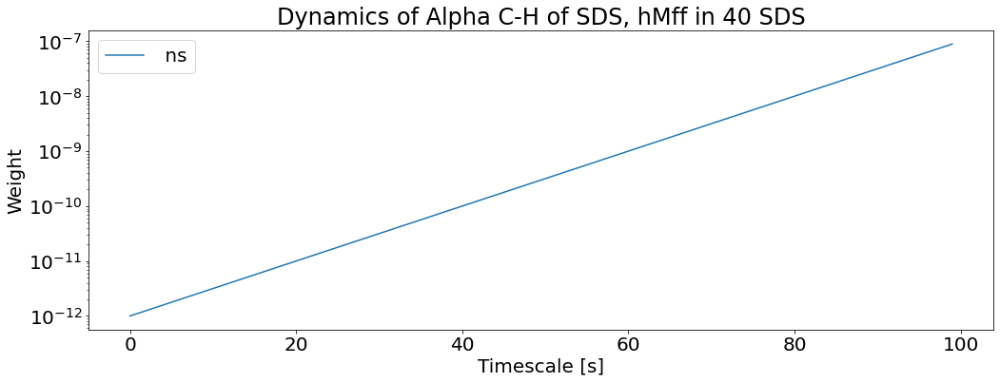

In [44]:
Ctimes_to_save=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_100000_020822.out")
plt.figure(figsize=(15, 6))
plt.rcParams.update({'font.size': 20})
plt.yscale('log')

coef=100


plt.plot(np.linspace(0, 99,100),Ctimes_to_save[:,0],label=" ns")
    
plt.xlabel("Timescale [s]")
plt.ylabel("Weight")
plt.title("Dynamics of Alpha C-H of SDS, hMff in 40 SDS")
plt.legend()
plt.show()

In [ ]:
#eYqjD 50SDS
path="/media/nenciric/Ricky2022/morgan/1_eYqjD_micelle_50SDS_CHARMM_310K_Na_Neut_OPC/"
grofile="5_eYqjD_50SDS_micelle_310K_CHARMM_lastframe_FromSofia_SDS_Protein_SOD_solvated_OPC_local_run_20ps_mahti_110ns_mahti_20ns_mahti.gro"
xtcfile="6_eYqjD_50SDS_micelle_310K_CHARMM_lastframe_FromSofia_SDS_Protein_SOD_solvated_OPC_local_run_20ps_mahti_110ns_mahti_20ns_mahti_3248ns.xtc"
tprfile="5_eYqjD_50SDS_micelle_310K_CHARMM_lastframe_FromSofia_SDS_Protein_SOD_solvated_OPC_local_run_20ps_mahti_110ns_mahti.tpr"


In [51]:
#hmff 60SDS
#path="/media/nenciric/Ricky2022/morgan/23_hMff_micelle_60SDS_CHARMM_310K_Na_Neut_OPC/"
#grofile="7-Ricky_hMff_60SDS.gro"
#xtcfile="7-Ricky_hMff_60SDS.xtc"
#tprfile="7-Ricky_hMff_60SDS.tpr"


#hMff 40SDS
#path="/media/nenciric/Ricky2022/morgan/22_hMff_micelle_40SDS_CHARMM_310K_Na_Neut_OPC/"
#grofile="10_Ricky_hMff_40SDS.gro"
#xtcfile="10_Ricky_hMff_40SDS.xtc"
#tprfile="10_Ricky_hMff_40SDS.tpr"

#hMff 45SDS
#path="/media/nenciric/Ricky2022/morgan/21_hMff_micelle_45SDS_CHARMM_310K_Na_Neut_OPC/"
#grofile="10_Ricky_hMff_45SDS.gro"
#xtcfile="10_Ricky_hMff_45SDS.xtc"
#tprfile="10_Ricky_hMff_45SDS.tpr"

#hMff 50SDS
path="/media/nenciric/Ricky2022/morgan/2_hMff_micelle_50SDS_CHARMM_310K_Na_Neut_OPC/"
grofile="10-Ricky_hMff_50SDS.gro"
xtcfile="10-Ricky_hMff_50SDS_no_PBC.xtc"
tprfile="10-Ricky_hMff_50SDS.tpr"


In [52]:
for atom1, atom2 in [("C1","H11"),("C3","H31")]:
    rt.CalculateCorrelationFunctions(path,begin,end,RM_avail,grofile,xtcfile,tprfile,atom1,atom2,moleculeType)

Number of corelation functions to calculate: 1 

Calculatin correlation function 1


                      :-) GROMACS - gmx rotacf, 2021.5 (-:

                            GROMACS is written by:
     Andrey Alekseenko              Emile Apol              Rossen Apostolov     
         Paul Bauer           Herman J.C. Berendsen           Par Bjelkmar       
       Christian Blau           Viacheslav Bolnykh             Kevin Boyd        
     Aldert van Buuren           Rudi van Drunen             Anton Feenstra      
    Gilles Gouaillardet             Alan Gray               Gerrit Groenhof      
       Anca Hamuraru            Vincent Hindriksen          M. Eric Irrgang      
      Aleksei Iupinov           Christoph Junghans             Joe Jordan        
    Dimitrios Karkoulis            Peter Kasson                Jiri Kraus        
      Carsten Kutzner              Per Larsson              Justin A. Lemkul     
       Viveca Lindahl            Magnus Lundborg             Erik Marklund       
        Pascal Merz             Pieter Meulenhoff            Teemu Mu

Number of corelation functions to calculate: 1 

Calculatin correlation function 1


                      :-) GROMACS - gmx rotacf, 2021.5 (-:

                            GROMACS is written by:
     Andrey Alekseenko              Emile Apol              Rossen Apostolov     
         Paul Bauer           Herman J.C. Berendsen           Par Bjelkmar       
       Christian Blau           Viacheslav Bolnykh             Kevin Boyd        
     Aldert van Buuren           Rudi van Drunen             Anton Feenstra      
    Gilles Gouaillardet             Alan Gray               Gerrit Groenhof      
       Anca Hamuraru            Vincent Hindriksen          M. Eric Irrgang      
      Aleksei Iupinov           Christoph Junghans             Joe Jordan        
    Dimitrios Karkoulis            Peter Kasson                Jiri Kraus        
      Carsten Kutzner              Per Larsson              Justin A. Lemkul     
       Viveca Lindahl            Magnus Lundborg             Erik Marklund       
        Pascal Merz             Pieter Meulenhoff            Teemu Mu

In [53]:
"""Parameters to be specified by the user"""
OP=0 # order parameter
smallest_corr_time=0 # enter in log scale -3 fs; 0 ps; 3 ns; 6 us;
biggest_corr_time=5 # same as above
N_exp_to_fit=100 # number of exponential functions to be fitted between the samlles and biggest corr time
analyze=1/50 # the proportin of correlation data to be used for fitting, ex. 1/2 uses first half of the data
magnetic_field=2.35 # 5.99 # 8.49 T (values used in SDS paper, J.Chem. Soc.,, Faraday Trans. 1, 1988, 84(12), 4475-4486)
#magn_field=850
#magnetic_field=magn_field*2*np.pi/gammaH*10**6
nuclei="2H" #nuclei to calculate: 2H-deutherium; 13C - carbon; 15N - nitrogen 



##############3
## CHANGE IN THE CODE 6.4.2022, not going throught the whole content of the folder anymore
###############
take_all_in_folder="number" #"yes"/"no"/"number" analyze all in folder? useful for proteins, if no, fill the following line, if yes fill the folder path
input_corr_file="alphaCF.xvg"

input_prefix="NHrotaCF_" # mostly for peptides, works with take_all_in_folder="no"



## eElab 31.5.22
folder_path="corr_func_0_32480_C1_H11/"
output_name="hMff_50SDS_micelle_SDS_relax_coef.out"
residues=2


author_name="Ricky Nencini"

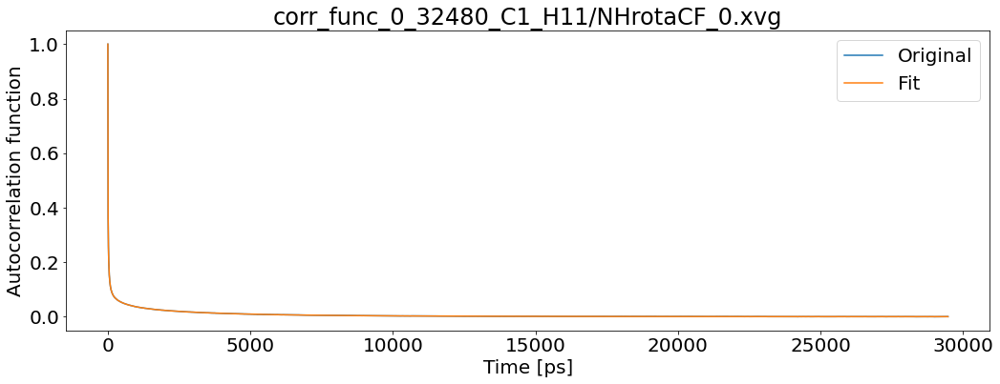

T1: 0.018157078470558703 T2: 0.01508136557712924 NOE: 0


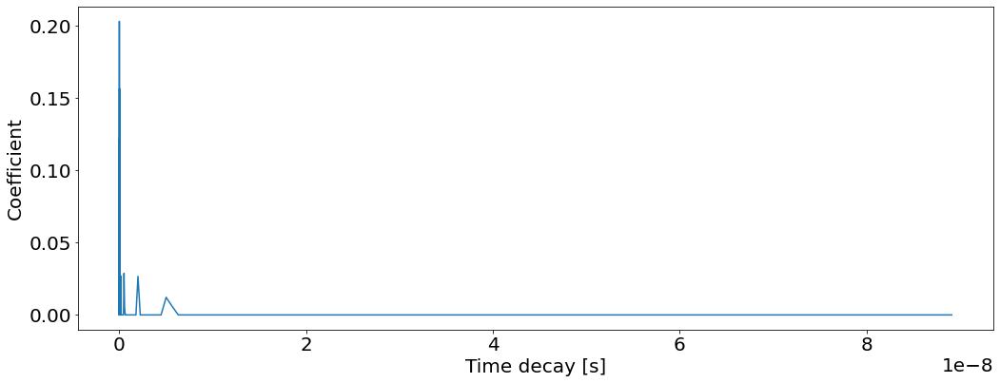

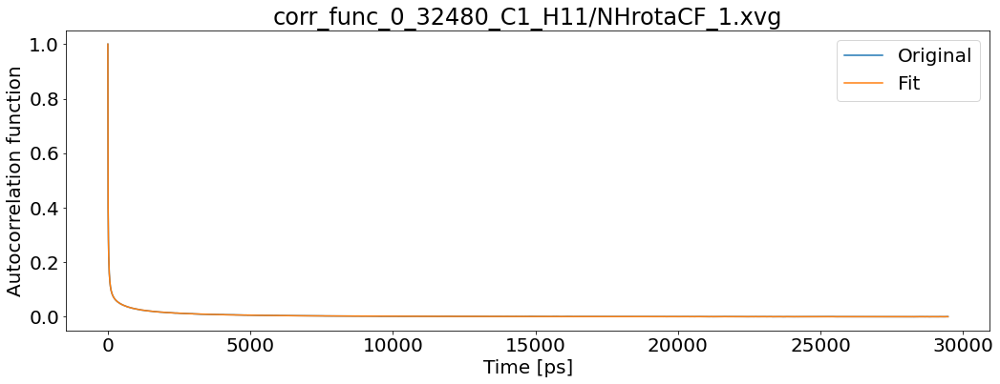

T1: 0.022605312551829446 T2: 0.019481458595531905 NOE: 0


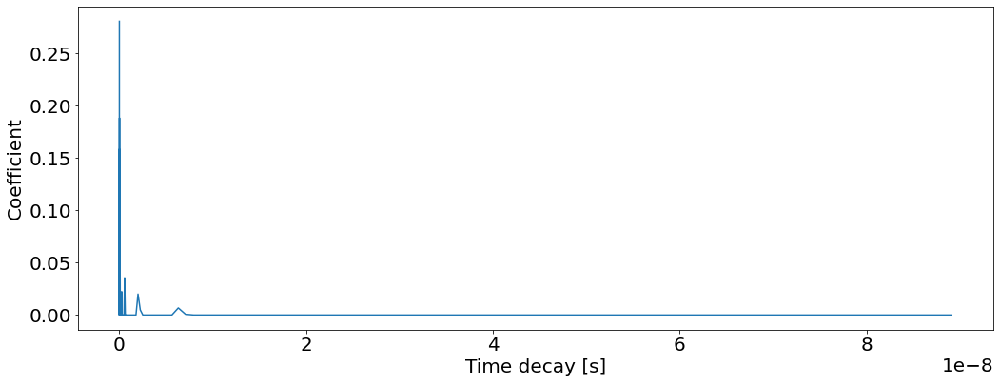

In [54]:
"""Execute the code - this part needs not be modified"""
#rt.initilize_output(OP,smallest_corr_time, biggest_corr_time, N_exp_to_fit,analyze,magnetic_field,input_corr_file,nuclei,output_name,author_name)
if take_all_in_folder=="yes":
    for file in os.listdir(folder_path):
        input_corr_file = folder_path+os.fsdecode(file)
        rt.GetRelaxationData(OP,smallest_corr_time, biggest_corr_time, N_exp_to_fit,analyze,magnetic_field,input_corr_file,nuclei,output_name)
elif take_all_in_folder=="number":
    step_exp=(biggest_corr_time-smallest_corr_time)/N_exp_to_fit
    Ctimes = 10 ** np.arange(smallest_corr_time, biggest_corr_time, step_exp)
    Ctimes = Ctimes * 0.001 * 10 ** (-9);
    Ctimes_to_save=np.zeros([len(Ctimes),residues+1])
    Ctimes_to_save[:,0]=Ctimes
    for i in range(0,residues):
        input_corr_file = folder_path+input_prefix+str(i)+".xvg"
        AA=rt.GetRelaxationData(OP,smallest_corr_time, biggest_corr_time, N_exp_to_fit,analyze,magnetic_field,input_corr_file,nuclei,output_name)
        Ctimes_to_save[:,i+1]=AA.Coeffs
else:
    rt.GetRelaxationData(OP,smallest_corr_time, biggest_corr_time, N_exp_to_fit,analyze,magnetic_field,input_corr_file,nuclei,output_name)
    
np.savetxt(output_name,Ctimes_to_save)

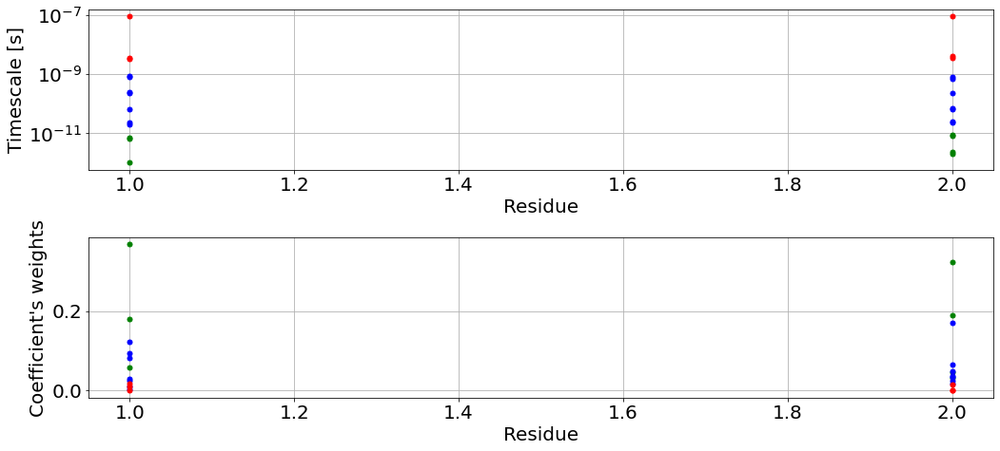

In [8]:
plt.rcParams["figure.figsize"] = [15.00, 7]
plt.rcParams["figure.autolayout"] = True

fig, (ax1, ax2) = plt.subplots(2)



ax1.grid()
ax1.set_yscale('log')
ax1.set_ylabel("Timescale [s]")
ax1.set_xlabel("Residue")
#ax1.set_ylim([10**(-12.4), 10**(-6.8)])


for residue in range(1,Ctimes_to_save.shape[1]):
    for timescale in range(0,Ctimes_to_save.shape[0]):
        #print("{} {} \n".format(i, j))
        if Ctimes_to_save[timescale,residue]>0:
            if Ctimes_to_save[timescale,0]>10**(-9):
                ax1.plot(residue, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
            elif Ctimes_to_save[timescale,0]>10**(-11):
                ax1.plot(residue, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
            else:
                ax1.plot(residue, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                   
       
    

ax2.grid()

ax2.set_ylabel("Coefficient's weights")
ax2.set_xlabel("Residue")


for residue in range(1,Ctimes_to_save.shape[1]):
    for timescale in range(0,Ctimes_to_save.shape[0]):
        #print("{} {} \n".format(i, j))
        if Ctimes_to_save[timescale,residue]>0:
            if Ctimes_to_save[timescale,0]>10**(-9):
                ax2.plot(residue, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
            elif Ctimes_to_save[timescale,0]>10**(-11):
                ax2.plot(residue, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
            else:
                ax2.plot(residue, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                     
        
plt.show()    

In [9]:
"""Parameters to be specified by the user"""
OP=0 # order parameter
smallest_corr_time=0 # enter in log scale -3 fs; 0 ps; 3 ns; 6 us;
biggest_corr_time=5 # same as above
N_exp_to_fit=100 # number of exponential functions to be fitted between the samlles and biggest corr time
analyze=1/50 # the proportin of correlation data to be used for fitting, ex. 1/2 uses first half of the data
magnetic_field=2.35 # 5.99 # 8.49 T (values used in SDS paper, J.Chem. Soc.,, Faraday Trans. 1, 1988, 84(12), 4475-4486)
#magn_field=850
#magnetic_field=magn_field*2*np.pi/gammaH*10**6
nuclei="2H" #nuclei to calculate: 2H-deutherium; 13C - carbon; 15N - nitrogen 



##############3
## CHANGE IN THE CODE 6.4.2022, not going throught the whole content of the folder anymore
###############
take_all_in_folder="number" #"yes"/"no"/"number" analyze all in folder? useful for proteins, if no, fill the following line, if yes fill the folder path
input_corr_file="alphaCF.xvg"

input_prefix="NHrotaCF_" # mostly for peptides, works with take_all_in_folder="no"



## eElab 31.5.22
folder_path="/home/nenciric/Documents/git/CorysPeptides/figure1/water_correlation_functions/OPC/"
output_name="60SDS_micelle_SDS_relax_alpha.out"
residues=2


author_name="Ricky Nencini"




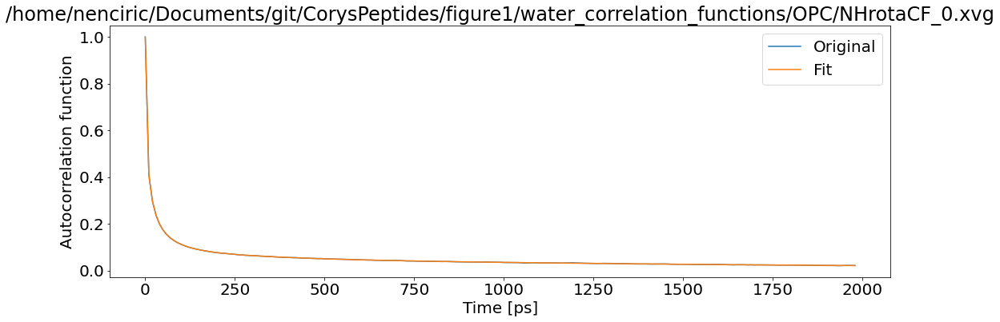

T1: 0.018862172103752264 T2: 0.01768723275803335 NOE: 0


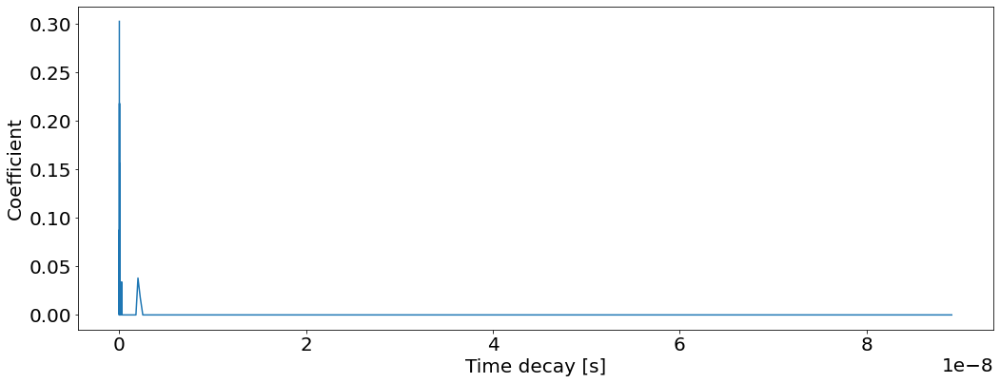

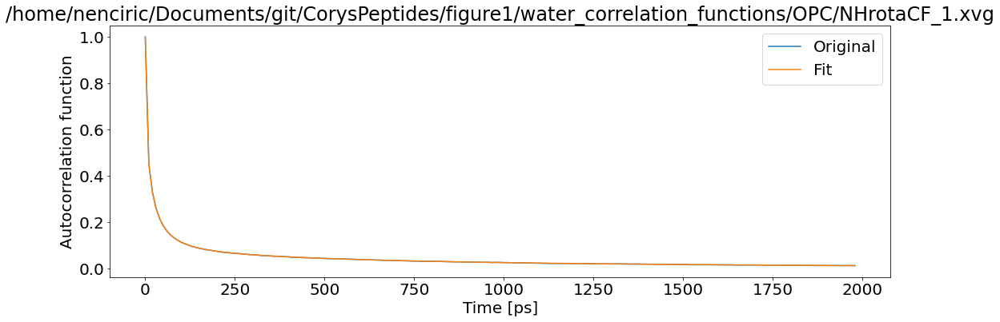

T1: 0.024312122146161606 T2: 0.023482040600615203 NOE: 0


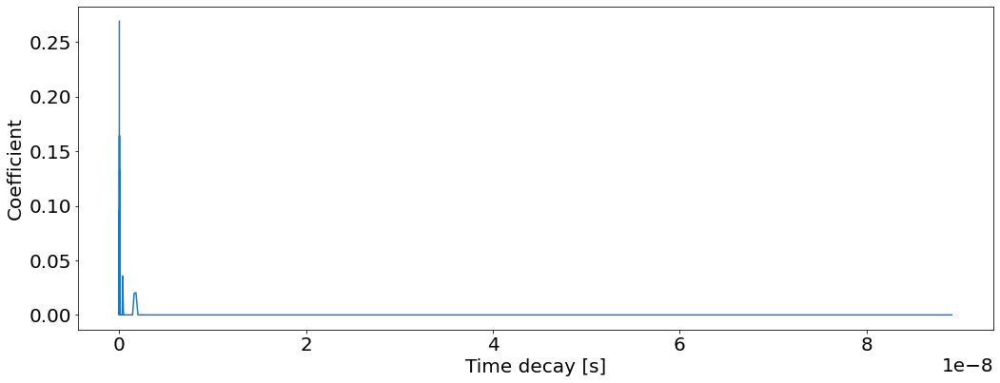

In [10]:
"""Execute the code - this part needs not be modified"""
#rt.initilize_output(OP,smallest_corr_time, biggest_corr_time, N_exp_to_fit,analyze,magnetic_field,input_corr_file,nuclei,output_name,author_name)
if take_all_in_folder=="yes":
    for file in os.listdir(folder_path):
        input_corr_file = folder_path+os.fsdecode(file)
        rt.GetRelaxationData(OP,smallest_corr_time, biggest_corr_time, N_exp_to_fit,analyze,magnetic_field,input_corr_file,nuclei,output_name)
elif take_all_in_folder=="number":
    step_exp=(biggest_corr_time-smallest_corr_time)/N_exp_to_fit
    Ctimes = 10 ** np.arange(smallest_corr_time, biggest_corr_time, step_exp)
    Ctimes = Ctimes * 0.001 * 10 ** (-9);
    Ctimes_to_save=np.zeros([len(Ctimes),residues+1])
    Ctimes_to_save[:,0]=Ctimes
    for i in range(0,residues):
        input_corr_file = folder_path+input_prefix+str(i)+".xvg"
        AA=rt.GetRelaxationData(OP,smallest_corr_time, biggest_corr_time, N_exp_to_fit,analyze,magnetic_field,input_corr_file,nuclei,output_name)
        Ctimes_to_save[:,i+1]=AA.Coeffs
else:
    rt.GetRelaxationData(OP,smallest_corr_time, biggest_corr_time, N_exp_to_fit,analyze,magnetic_field,input_corr_file,nuclei,output_name)

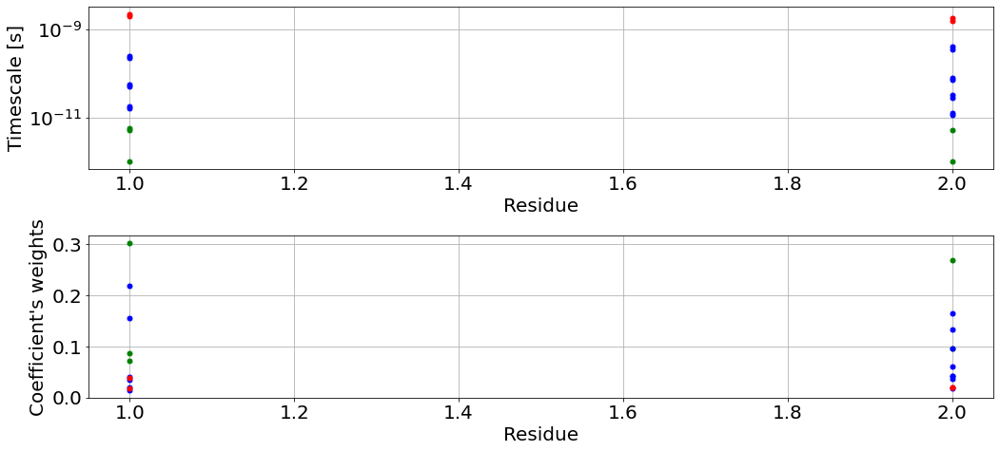

In [11]:
plt.rcParams["figure.figsize"] = [15.00, 7]
plt.rcParams["figure.autolayout"] = True

fig, (ax1, ax2) = plt.subplots(2)



ax1.grid()
ax1.set_yscale('log')
ax1.set_ylabel("Timescale [s]")
ax1.set_xlabel("Residue")
#ax1.set_ylim([10**(-12.4), 10**(-6.8)])


for residue in range(1,Ctimes_to_save.shape[1]):
    for timescale in range(0,Ctimes_to_save.shape[0]):
        #print("{} {} \n".format(i, j))
        if Ctimes_to_save[timescale,residue]>0:
            if Ctimes_to_save[timescale,0]>10**(-9):
                ax1.plot(residue, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
            elif Ctimes_to_save[timescale,0]>10**(-11):
                ax1.plot(residue, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
            else:
                ax1.plot(residue, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                   
       
    

ax2.grid()

ax2.set_ylabel("Coefficient's weights")
ax2.set_xlabel("Residue")


for residue in range(1,Ctimes_to_save.shape[1]):
    for timescale in range(0,Ctimes_to_save.shape[0]):
        #print("{} {} \n".format(i, j))
        if Ctimes_to_save[timescale,residue]>0:
            if Ctimes_to_save[timescale,0]>10**(-9):
                ax2.plot(residue, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
            elif Ctimes_to_save[timescale,0]>10**(-11):
                ax2.plot(residue, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
            else:
                ax2.plot(residue, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                     
        
plt.show()    

In [16]:
np.savetxt("50SDS_eYqjD_relax_coef.out",Ctimes_to_save)

In [17]:
pwd

'/home/local/nenciric/Documents/git/CorysPeptides/calculate_relax_from_SDS_proteins'